In [2]:
%%html
<img src="AliceBandit_Logo.png", width=400, height=400>

# ADVERSARIAL THRESHOLDING SEMI-BANDIT for ALICE DCS

AliceBandit is an adversarial multi-armed semi-bandit for the thresholding bandit problem with K arms. In a repeated game over T rounds, played against an oblivious adversary that generates feedback for each arm. A player decides which $k_{t}$ out of K arms to pull each round, where $k_{t}\leq K$ and the player's objective is to only pull arms that return values exceeding some pre-defined threshold $\theta$. 

AliceBandit is applied to the problem of efficiently monitoring multiple streams of control parameters associated with one of the detectors on ALICE (A Large Ion Collider Experiment) at the LHC, CERN. In this case, each arm represents a high voltage channel on the TRD (Transition Radiation Detector). Currently, conditions data for the experiment are collected at the end of a data-taking run for validating the physics data. In 2021, ALICE will move to continuous operations and conditions data will need to be monitored continuously. 

AliceBandit increases the efficiency over current approaches by reducing the need to observe every channel, whilst retaining the ability to identify anomalous behaviour. The threshold used in this example adapts dynamically for each channel and uses a controllable range centred on the value of that channel's previous feedback.

In [1]:
import numpy as np
import os
import pandas as pd
import gc
import csv
import matplotlib.pyplot as plt
from matplotlib import colors
from datetime import datetime

%matplotlib inline

## We would like to thank the ALICE Detector Control System (DCS) team for providing the TRD HV dataset

In [126]:
start = '2018-06-09 12:00:00'
end = '2018-06-11 00:00:00'

In [1097]:
#i = 1928
#TRD_HV_file = str(i)+'.csv'
#df = pd.read_csv('/home/bower5005/Downloads/'+str(TRD_HV_file), skiprows=800000, nrows=100000)
#df.columns = ['Channel','Current','Datatime']
#print(df.head(1))
#print(df.tail(1))

In [664]:
#df['Datatime'] = df['Datatime'].str[:18] + df['Datatime'].str[-2:]
#df['Datatime'] = pd.to_datetime(df['Datatime'], format='%d-%b-%y %I.%M.%S%p')
#df.set_index('Datatime',inplace=True)
## Bin records into 2 second periods (take max of if multiple values)
#df = df.resample('2S',label='right',closed='right').max()
## Fill forward if NaN
#df.fillna(method='ffill',inplace=True)

#mask = (df.index >= start) & (df.index <= end)
#df = df.loc[mask]
#df.drop('Channel',1,inplace=True)
#data = np.array(df).flatten()
#np.savez_compressed('Channel_'+str(i)+'.npz',data)

In [681]:
TRD_files = sorted(os.listdir(os.getcwd()+'/Zipped_Current_data'))

In [684]:
# Load compressed data
Data = [[] for i in range(len(TRD_files))]
for i in range(len(TRD_files)):
    dict_data = np.load(os.getcwd()+'/Zipped_Current_data/'+TRD_files[i])
    Data[i] = dict_data['arr_0']
    del dict_data
    print('{} loaded...'.format(TRD_files[i]))

Channel_1945.npz loaded...
Channel_1981.npz loaded...
Channel_1982.npz loaded...
Channel_1983.npz loaded...
Channel_1984.npz loaded...
Channel_1985.npz loaded...
Channel_1986.npz loaded...
Channel_1987.npz loaded...
Channel_1989.npz loaded...
Channel_1990.npz loaded...
Channel_1991.npz loaded...
Channel_1992.npz loaded...
Channel_1993.npz loaded...
Channel_1994.npz loaded...
Channel_1995.npz loaded...
Channel_1996.npz loaded...
Channel_1997.npz loaded...
Channel_1998.npz loaded...
Channel_1999.npz loaded...
Channel_2001.npz loaded...
Channel_2002.npz loaded...
Channel_2003.npz loaded...
Channel_2004.npz loaded...
Channel_2005.npz loaded...
Channel_2007.npz loaded...
Channel_2008.npz loaded...
Channel_2009.npz loaded...
Channel_2010.npz loaded...
Channel_2011.npz loaded...
Channel_2012.npz loaded...
Channel_2013.npz loaded...
Channel_2015.npz loaded...
Channel_2016.npz loaded...
Channel_2017.npz loaded...
Channel_2018.npz loaded...
Channel_2019.npz loaded...
Channel_2020.npz loaded...
C

## Set time horizon T and number of arms K

In [696]:
T = len(Data[0])
dim = np.int(np.sqrt(len(TRD_files)))
print('Number of rounds to be played:',T)
print('Number of arms:',dim**2)

#for i in range(len(Data)):
#    Data[i] = Data[i][:T]

Number of rounds to be played: 64801
Number of arms: 100


## Normalise data (if necessary)

In [708]:
Y = np.zeros([T,dim**2])
for i in range(len(TRD_files) - dim**2,len(TRD_files)):
    Y[:,i-(len(TRD_files) - dim**2)] = Data[i-(len(TRD_files) - dim**2)]

#max_val = np.max(Y)
#min_val = np.min(Y)
#diff = max_val - min_val
#for j in range(dim**2):
#    for i in range(T):
#        Y[i,j] = (Y[i,j] - min_val) / np.float(diff)
#    print('Channel {} normalised'.format(i))

D = [[] for i in range(T)]
Concern_list = [[] for i in range(T)]
Optimal_list = [[] for i in range(T)]
Test1 = [[] for i in range(T)]
for i in range(T):
    Test1[i] = np.zeros([dim,dim])
    D[i] = np.zeros([dim,dim])
        
for t in range(T):
    D[t] = np.reshape(Y[t,:], (dim,dim))

## Run simulation

In [890]:
def Choices(d):
    kappa_sum = 0
    sample_sizes = []
    while kappa_sum < 100:
        n = np.random.randint(d - kappa_sum)
        if n == 0:
            n = 1
        kappa_sum += n
        if kappa_sum < 99:
            #print(kappa_sum,n)
            sample_sizes.append(n)
        else:
            #print(kappa_sum+1,n+1)
            sample_sizes.append(n+1)
            break
    return sample_sizes

In [950]:
def Order_gen(T,choice):
    rounds = 0
    Order = []
    while rounds < T:
        sample_sizes = Choices(dim**2)
        A = np.random.permutation(dim**2)
        rounds += len(sample_sizes)
        if rounds <= T:
            print('Totals:',rounds,len(sample_sizes))
            for i in range(len(sample_sizes)):
                if len(A) > sample_sizes[-1]:
                    A_new = np.random.choice(A,sample_sizes[i],replace=False)
                    A = np.setdiff1d(A,A_new)
                    print(A_new)
                    Order.append(A_new)
                else:
                    print(A)
                    Order.append(A)
        else:
            rounds -= len(sample_sizes)
            print('Totals:',T,T-rounds)
            for i in range(T-rounds):
                if len(A) > sample_sizes[-1]:
                    A_new = np.random.choice(A,sample_sizes[i],replace=False)
                    A = np.setdiff1d(A,A_new)
                    print(A_new)
                    Order.append(A_new)
                else:
                    print(A)
                    Order.append(A)
            break
    return Order

In [1093]:
boundary_ = 0.4
Prev_pull = np.zeros([T,dim**2])
Pulling_probs = np.ones([T,dim**2])
Threshold_list_old = []
X_ = np.zeros([T,dim**2])
min_interval_hr = 12
min_interval = 30*60*min_interval_hr
gamma_ = np.ones(dim**2)
gamma__ = 0.25
Pull_count_in = np.zeros(dim**2)

t = 0
X_[t,Order[t]] = Y[t,Order[t]]
for t in range(1,T):
    print('Round',t)
    #Set of arms pulled
    ARMS = np.array([])
    # Set of arms pulled and exceeding threshold interval
    Threshold_list_new = []
    # All previous pull round carried forward
    Prev_pull[t,:] = Prev_pull[t-1,:]
    # All previous pull probs carried forward
    Pulling_probs[t,:] = Pulling_probs[t-1,:]
    for j in range(len(Threshold_list_old)):
        # For all arms on previous rounds' Threshold list
        # Pull arm
        X[t,j] = Y[t,Threshold_list_old[j].astype(int)]
        # Previous round arm pulled
        Prev_round = np.int(Prev_pull[t,Threshold_list_old[j].astype(int)])
        if Y[t,Threshold_list_old[j].astype(int)] > Y[Prev_round,Threshold_list_old[j].astype(int)] + boundary_ or Y[t,Threshold_list_old[j].astype(int)] < Y[Prev_round,Threshold_list_old[j].astype(int)] - boundary_:
            # If pulled arm exceeds threshold interval add to current Threshold list
            Threshold_list_new.append(Threshold_list_old[j].astype(int))
            # Set pull prob to 1
            Pulling_probs[t,Threshold_list_old[j].astype(int)] = 1
        else:
            # If pulled arm within threshold interval
            arm__ = Threshold_list_old[j].astype(int)
            delta = np.min([np.abs(Y[np.int(Prev_pull[t,arm__]),arm__] + boundary_ - Y[t,arm__]),np.abs(Y[np.int(Prev_pull[t,arm__]),arm__] - boundary_ - Y[t,arm__])])
            Pulling_probs[t,Threshold_list_old[j].astype(int)] = Pulling_probs[t,Threshold_list_old[j].astype(int)] * gamma_[Threshold_list_old[j].astype(int)]*np.exp(-delta*gamma__)
            Pull_count_in[arm__] += 1
        # Set pull round to round for pulled arm
        Prev_pull[t,Threshold_list_old[j].astype(int)] = t
    for i in range(len(Order[t])):
        # For all arms selected
        arm__ = Order[t][i].astype(int)
        if np.random.rand() < Pulling_probs[t,arm__]:
            # if random number smaller than pull prob
            # pull arm
            X_[t,arm__] = Y[t,arm__]
            # Add to set of arms pulled
            ARMS = np.append(ARMS,arm__)
            if Y[t,arm__] > Y[np.int(Prev_pull[t,arm__]),arm__] + boundary_ or Y[t,arm__] < Y[np.int(Prev_pull[t,arm__]),arm__] - boundary_:
                # If arm exceeds threshold interval
                # Add to current Treshold list
                Threshold_list_new.append(arm__)
                Pulling_probs[t,arm__] = 1
            else:
                # reduce Pulling_probs[Threshold___list_old[j].astype(int)]
                delta = np.min([np.abs(Y[np.int(Prev_pull[t,arm__]),arm__] + boundary_ - Y[t,arm__]),np.abs(Y[np.int(Prev_pull[t,arm__]),arm__] - boundary_ - Y[t,arm__])])
                Pulling_probs[t,arm__] = Pulling_probs[t,arm__] * gamma_[arm__]*np.exp(-delta*gamma__)
            Prev_pull[t,arm__] = t
        if np.sum(np.isin(arm__,ARMS)) == 0 and (t - Prev_pull[t-1,arm__] > min_interval):
            # If not pulled this round and not pulled in past min_interval rounds
            # pull arm
            X_[t,arm__] = Y[t,arm__]
            ARMS = np.append(ARMS,arm__)
            if Y[t,arm__] > Y[np.int(Prev_pull[t,arm__]),arm__] + boundary_ or Y[t,arm__] < Y[np.int(Prev_pull[t,arm__]),arm__] - boundary_:
                # If arm exceeds threshold interval
                # Add to current Treshold list
                Threshold_list_new.append(arm__)
                Pulling_probs[t,arm__] = 1
            else:
                # reduce Pulling_probs[Threshold___list_old[j].astype(int)]
                delta = np.min([np.abs(Y[np.int(Prev_pull[t,arm__]),arm__] + boundary_ - Y[t,arm__]),np.abs(Y[np.int(Prev_pull[t,arm__]),arm__] - boundary_ - Y[t,arm__])])
                Pulling_probs[t,arm__] = Pulling_probs[t,arm__] * gamma_[arm__]*np.exp(-delta*gamma__)
            Prev_pull[t,arm__] = t
            

    if len(Threshold_list_old) > 0:
        Threshold_list_old = np.array(Threshold_list_old)
        Prev_pull[t,Threshold_list_old.astype(int)] = t
    Threshold_list_old = np.array(Threshold_list_new)
    print('Arms pulled:',ARMS)
    print('Arms on Threshold list:',Threshold_list_old)

Round 1
Arms pulled: [53. 77. 26. 17. 58. 86. 83. 94. 33. 51. 11. 49. 91. 38. 84. 22. 42. 40.
 28.  2. 73. 60. 59.  1. 81. 54. 70. 72. 87.]
Arms on Threshold list: []
Round 2
Arms pulled: [80. 10. 69. 15.  0. 95. 18.  7. 56.]
Arms on Threshold list: []
Round 3
Arms pulled: [61.]
Arms on Threshold list: []
Round 4
Arms pulled: [71.  6.  5. 23. 50. 35. 98. 39. 97. 79. 24. 36.]
Arms on Threshold list: []
Round 5
Arms pulled: [27.]
Arms on Threshold list: []
Round 6
Arms pulled: [ 4. 63.]
Arms on Threshold list: []
Round 7
Arms pulled: [21. 62. 18. 14. 82.  3. 45. 55. 84. 92. 83. 80. 98. 44. 34. 26. 19. 89.
  8. 72. 71.  6. 66. 29. 10. 17. 59. 41. 28. 54. 58. 38. 57. 15.  4. 78.
 27. 12. 48. 42. 24. 25. 47. 81. 52. 22. 88. 39. 73. 87. 56. 68. 43. 93.
 64. 96. 35.  5. 46. 91. 97.  0. 23. 69. 74.  9. 86. 36. 53.  1. 61. 33.
 70. 79. 76. 85. 60. 30. 31. 16. 90. 40. 49. 67. 37. 11. 95. 75. 13. 32.
 77. 65.  2. 63.]
Arms on Threshold list: []
Round 8
Arms pulled: [20. 99.]
Arms on Threshold lis

Arms pulled: [ 7.  6. 36. 11. 68. 55. 42. 75. 24. 70.  1.  9. 61. 59. 96. 81. 19. 38.
 27.]
Arms on Threshold list: []
Round 100
Arms pulled: [51. 87. 91. 99. 33. 43. 50. 66. 21. 63.]
Arms on Threshold list: []
Round 101
Arms pulled: []
Arms on Threshold list: []
Round 102
Arms pulled: [20.]
Arms on Threshold list: []
Round 103
Arms pulled: [71. 10.]
Arms on Threshold list: []
Round 104
Arms pulled: [85.]
Arms on Threshold list: []
Round 105
Arms pulled: [73. 95.  5.]
Arms on Threshold list: []
Round 106
Arms pulled: [92. 87. 60. 84. 36. 62. 22.  2. 33. 89. 46.]
Arms on Threshold list: []
Round 107
Arms pulled: []
Arms on Threshold list: []
Round 108
Arms pulled: [25. 12. 37. 65. 71. 77. 18. 63.]
Arms on Threshold list: []
Round 109
Arms pulled: [10.]
Arms on Threshold list: []
Round 110
Arms pulled: [34. 41. 23.]
Arms on Threshold list: []
Round 111
Arms pulled: []
Arms on Threshold list: []
Round 112
Arms pulled: [74.  6.]
Arms on Threshold list: []
Round 113
Arms pulled: [93. 49. 50

Arms pulled: [10. 92. 20. 98. 52. 21. 71. 84. 23.  4. 44. 55. 24. 64.]
Arms on Threshold list: []
Round 241
Arms pulled: [62. 53. 82. 99.]
Arms on Threshold list: []
Round 242
Arms pulled: [57.]
Arms on Threshold list: []
Round 243
Arms pulled: [75.]
Arms on Threshold list: []
Round 244
Arms pulled: [41. 68. 61. 15. 82. 72. 12. 99. 29. 31. 95. 37. 79. 81. 47. 58. 65. 85.
 53. 49. 30.]
Arms on Threshold list: []
Round 245
Arms pulled: []
Arms on Threshold list: []
Round 246
Arms pulled: [94. 93.]
Arms on Threshold list: []
Round 247
Arms pulled: []
Arms on Threshold list: []
Round 248
Arms pulled: []
Arms on Threshold list: []
Round 249
Arms pulled: [39.  1. 63. 69. 55. 70.]
Arms on Threshold list: []
Round 250
Arms pulled: [36. 56.  3. 84.  0. 12. 93. 21. 43. 46. 86.]
Arms on Threshold list: []
Round 251
Arms pulled: [95. 20. 28. 78.]
Arms on Threshold list: []
Round 252
Arms pulled: [45. 73.]
Arms on Threshold list: []
Round 253
Arms pulled: [67. 52. 88. 15. 76. 74.  3. 26.  5. 13. 40

Round 370
Arms pulled: []
Arms on Threshold list: []
Round 371
Arms pulled: []
Arms on Threshold list: []
Round 372
Arms pulled: []
Arms on Threshold list: []
Round 373
Arms pulled: []
Arms on Threshold list: []
Round 374
Arms pulled: []
Arms on Threshold list: []
Round 375
Arms pulled: [94. 90.]
Arms on Threshold list: []
Round 376
Arms pulled: [12. 17. 59. 83. 35. 75.]
Arms on Threshold list: []
Round 377
Arms pulled: []
Arms on Threshold list: []
Round 378
Arms pulled: [40. 28.]
Arms on Threshold list: []
Round 379
Arms pulled: []
Arms on Threshold list: []
Round 380
Arms pulled: [59. 23. 47. 52. 67.  8. 44. 40.]
Arms on Threshold list: []
Round 381
Arms pulled: [85. 38. 82.]
Arms on Threshold list: []
Round 382
Arms pulled: []
Arms on Threshold list: []
Round 383
Arms pulled: [17. 11. 61. 93. 74.]
Arms on Threshold list: []
Round 384
Arms pulled: [28. 65. 21.  3. 55.]
Arms on Threshold list: []
Round 385
Arms pulled: [20. 44. 24.]
Arms on Threshold list: []
Round 386
Arms pulled: [

Round 528
Arms pulled: [72.]
Arms on Threshold list: []
Round 529
Arms pulled: []
Arms on Threshold list: []
Round 530
Arms pulled: [33.]
Arms on Threshold list: []
Round 531
Arms pulled: []
Arms on Threshold list: []
Round 532
Arms pulled: []
Arms on Threshold list: []
Round 533
Arms pulled: []
Arms on Threshold list: []
Round 534
Arms pulled: [26. 20. 15. 97.]
Arms on Threshold list: []
Round 535
Arms pulled: []
Arms on Threshold list: []
Round 536
Arms pulled: [32.]
Arms on Threshold list: []
Round 537
Arms pulled: []
Arms on Threshold list: []
Round 538
Arms pulled: [80. 73. 85. 77. 90.]
Arms on Threshold list: []
Round 539
Arms pulled: [95.]
Arms on Threshold list: []
Round 540
Arms pulled: []
Arms on Threshold list: []
Round 541
Arms pulled: []
Arms on Threshold list: []
Round 542
Arms pulled: []
Arms on Threshold list: []
Round 543
Arms pulled: []
Arms on Threshold list: []
Round 544
Arms pulled: [ 4. 31. 75. 56. 22.  9. 12.]
Arms on Threshold list: []
Round 545
Arms pulled: []


Arms pulled: [6.]
Arms on Threshold list: []
Round 696
Arms pulled: []
Arms on Threshold list: []
Round 697
Arms pulled: []
Arms on Threshold list: []
Round 698
Arms pulled: []
Arms on Threshold list: []
Round 699
Arms pulled: []
Arms on Threshold list: []
Round 700
Arms pulled: [30. 74.]
Arms on Threshold list: []
Round 701
Arms pulled: []
Arms on Threshold list: []
Round 702
Arms pulled: []
Arms on Threshold list: []
Round 703
Arms pulled: [99. 94.]
Arms on Threshold list: []
Round 704
Arms pulled: []
Arms on Threshold list: []
Round 705
Arms pulled: []
Arms on Threshold list: []
Round 706
Arms pulled: [82.]
Arms on Threshold list: []
Round 707
Arms pulled: [71. 72. 75. 57. 68. 23.]
Arms on Threshold list: []
Round 708
Arms pulled: []
Arms on Threshold list: []
Round 709
Arms pulled: [ 0. 60. 53.  8.]
Arms on Threshold list: []
Round 710
Arms pulled: []
Arms on Threshold list: []
Round 711
Arms pulled: []
Arms on Threshold list: []
Round 712
Arms pulled: []
Arms on Threshold list: []

Arms pulled: [11. 40.]
Arms on Threshold list: []
Round 874
Arms pulled: [38.]
Arms on Threshold list: []
Round 875
Arms pulled: [23. 88.]
Arms on Threshold list: []
Round 876
Arms pulled: [91. 54.]
Arms on Threshold list: []
Round 877
Arms pulled: []
Arms on Threshold list: []
Round 878
Arms pulled: [86.]
Arms on Threshold list: []
Round 879
Arms pulled: [26.]
Arms on Threshold list: []
Round 880
Arms pulled: []
Arms on Threshold list: []
Round 881
Arms pulled: [9.]
Arms on Threshold list: []
Round 882
Arms pulled: []
Arms on Threshold list: []
Round 883
Arms pulled: []
Arms on Threshold list: []
Round 884
Arms pulled: []
Arms on Threshold list: []
Round 885
Arms pulled: [31.  0.]
Arms on Threshold list: []
Round 886
Arms pulled: []
Arms on Threshold list: []
Round 887
Arms pulled: []
Arms on Threshold list: []
Round 888
Arms pulled: [34. 90.]
Arms on Threshold list: []
Round 889
Arms pulled: []
Arms on Threshold list: []
Round 890
Arms pulled: []
Arms on Threshold list: []
Round 891


Arms pulled: [59.]
Arms on Threshold list: []
Round 1071
Arms pulled: [59. 60. 29. 66.]
Arms on Threshold list: []
Round 1072
Arms pulled: [77. 87.]
Arms on Threshold list: []
Round 1073
Arms pulled: []
Arms on Threshold list: []
Round 1074
Arms pulled: [16.  9.  7. 73.]
Arms on Threshold list: []
Round 1075
Arms pulled: []
Arms on Threshold list: []
Round 1076
Arms pulled: []
Arms on Threshold list: []
Round 1077
Arms pulled: []
Arms on Threshold list: []
Round 1078
Arms pulled: [52. 49. 50.  5. 61. 24.]
Arms on Threshold list: []
Round 1079
Arms pulled: []
Arms on Threshold list: []
Round 1080
Arms pulled: []
Arms on Threshold list: []
Round 1081
Arms pulled: [52. 39. 83. 73. 65.  2.]
Arms on Threshold list: []
Round 1082
Arms pulled: [49.]
Arms on Threshold list: []
Round 1083
Arms pulled: []
Arms on Threshold list: []
Round 1084
Arms pulled: []
Arms on Threshold list: []
Round 1085
Arms pulled: []
Arms on Threshold list: []
Round 1086
Arms pulled: [89. 29.  3.]
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round 1284
Arms pulled: []
Arms on Threshold list: []
Round 1285
Arms pulled: []
Arms on Threshold list: []
Round 1286
Arms pulled: [60.]
Arms on Threshold list: []
Round 1287
Arms pulled: [80.]
Arms on Threshold list: []
Round 1288
Arms pulled: []
Arms on Threshold list: []
Round 1289
Arms pulled: []
Arms on Threshold list: []
Round 1290
Arms pulled: []
Arms on Threshold list: []
Round 1291
Arms pulled: []
Arms on Threshold list: []
Round 1292
Arms pulled: [20.]
Arms on Threshold list: []
Round 1293
Arms pulled: []
Arms on Threshold list: []
Round 1294
Arms pulled: []
Arms on Threshold list: []
Round 1295
Arms pulled: []
Arms on Threshold list: []
Round 1296
Arms pulled: [28. 99.]
Arms on Threshold list: []
Round 1297
Arms pulled: []
Arms on Threshold list: []
Round 1298
Arms pulled: []
Arms on Threshold list: []
Round 1299
Arms pulled: [67. 92. 62.]
Arms on Threshold list: []
Round 1300
Arms pulled: [29.]
Arms on Threshold list: []
Round 130

Round 1463
Arms pulled: [55.]
Arms on Threshold list: []
Round 1464
Arms pulled: []
Arms on Threshold list: []
Round 1465
Arms pulled: []
Arms on Threshold list: []
Round 1466
Arms pulled: []
Arms on Threshold list: []
Round 1467
Arms pulled: [93.]
Arms on Threshold list: []
Round 1468
Arms pulled: [74.]
Arms on Threshold list: []
Round 1469
Arms pulled: [49. 41.]
Arms on Threshold list: []
Round 1470
Arms pulled: [54.]
Arms on Threshold list: []
Round 1471
Arms pulled: []
Arms on Threshold list: []
Round 1472
Arms pulled: []
Arms on Threshold list: []
Round 1473
Arms pulled: [16.]
Arms on Threshold list: []
Round 1474
Arms pulled: []
Arms on Threshold list: []
Round 1475
Arms pulled: []
Arms on Threshold list: []
Round 1476
Arms pulled: [ 0. 92. 67.]
Arms on Threshold list: []
Round 1477
Arms pulled: []
Arms on Threshold list: []
Round 1478
Arms pulled: []
Arms on Threshold list: []
Round 1479
Arms pulled: []
Arms on Threshold list: []
Round 1480
Arms pulled: []
Arms on Threshold list

Round 1675
Arms pulled: []
Arms on Threshold list: []
Round 1676
Arms pulled: []
Arms on Threshold list: []
Round 1677
Arms pulled: []
Arms on Threshold list: []
Round 1678
Arms pulled: []
Arms on Threshold list: []
Round 1679
Arms pulled: []
Arms on Threshold list: []
Round 1680
Arms pulled: []
Arms on Threshold list: []
Round 1681
Arms pulled: []
Arms on Threshold list: []
Round 1682
Arms pulled: [42. 11. 54. 41.]
Arms on Threshold list: []
Round 1683
Arms pulled: []
Arms on Threshold list: []
Round 1684
Arms pulled: []
Arms on Threshold list: []
Round 1685
Arms pulled: [88. 91.]
Arms on Threshold list: []
Round 1686
Arms pulled: [30. 59. 65.]
Arms on Threshold list: []
Round 1687
Arms pulled: [54. 60.]
Arms on Threshold list: []
Round 1688
Arms pulled: []
Arms on Threshold list: []
Round 1689
Arms pulled: [5.]
Arms on Threshold list: []
Round 1690
Arms pulled: [10.]
Arms on Threshold list: []
Round 1691
Arms pulled: []
Arms on Threshold list: []
Round 1692
Arms pulled: [22. 73.]
Arm

Arms on Threshold list: []
Round 1883
Arms pulled: [32.]
Arms on Threshold list: []
Round 1884
Arms pulled: [47.]
Arms on Threshold list: []
Round 1885
Arms pulled: [26.]
Arms on Threshold list: []
Round 1886
Arms pulled: []
Arms on Threshold list: []
Round 1887
Arms pulled: []
Arms on Threshold list: []
Round 1888
Arms pulled: []
Arms on Threshold list: []
Round 1889
Arms pulled: [72. 29. 11.]
Arms on Threshold list: []
Round 1890
Arms pulled: [96.]
Arms on Threshold list: []
Round 1891
Arms pulled: []
Arms on Threshold list: []
Round 1892
Arms pulled: []
Arms on Threshold list: []
Round 1893
Arms pulled: [86. 56.]
Arms on Threshold list: []
Round 1894
Arms pulled: []
Arms on Threshold list: []
Round 1895
Arms pulled: []
Arms on Threshold list: []
Round 1896
Arms pulled: []
Arms on Threshold list: []
Round 1897
Arms pulled: []
Arms on Threshold list: []
Round 1898
Arms pulled: []
Arms on Threshold list: []
Round 1899
Arms pulled: [25. 45. 28.]
Arms on Threshold list: []
Round 1900
Arm

Arms pulled: [33. 25.]
Arms on Threshold list: []
Round 2089
Arms pulled: []
Arms on Threshold list: []
Round 2090
Arms pulled: []
Arms on Threshold list: []
Round 2091
Arms pulled: []
Arms on Threshold list: []
Round 2092
Arms pulled: [92.]
Arms on Threshold list: []
Round 2093
Arms pulled: []
Arms on Threshold list: []
Round 2094
Arms pulled: []
Arms on Threshold list: []
Round 2095
Arms pulled: []
Arms on Threshold list: []
Round 2096
Arms pulled: []
Arms on Threshold list: []
Round 2097
Arms pulled: [15.]
Arms on Threshold list: []
Round 2098
Arms pulled: []
Arms on Threshold list: []
Round 2099
Arms pulled: []
Arms on Threshold list: []
Round 2100
Arms pulled: [0.]
Arms on Threshold list: []
Round 2101
Arms pulled: []
Arms on Threshold list: []
Round 2102
Arms pulled: [30.]
Arms on Threshold list: []
Round 2103
Arms pulled: []
Arms on Threshold list: []
Round 2104
Arms pulled: [50.]
Arms on Threshold list: []
Round 2105
Arms pulled: [81.]
Arms on Threshold list: []
Round 2106
Arms

Arms on Threshold list: []
Round 2301
Arms pulled: []
Arms on Threshold list: []
Round 2302
Arms pulled: []
Arms on Threshold list: []
Round 2303
Arms pulled: []
Arms on Threshold list: []
Round 2304
Arms pulled: [11. 92.]
Arms on Threshold list: []
Round 2305
Arms pulled: []
Arms on Threshold list: []
Round 2306
Arms pulled: []
Arms on Threshold list: []
Round 2307
Arms pulled: []
Arms on Threshold list: []
Round 2308
Arms pulled: []
Arms on Threshold list: []
Round 2309
Arms pulled: [ 4. 96.]
Arms on Threshold list: []
Round 2310
Arms pulled: []
Arms on Threshold list: []
Round 2311
Arms pulled: [85. 12.]
Arms on Threshold list: []
Round 2312
Arms pulled: []
Arms on Threshold list: []
Round 2313
Arms pulled: []
Arms on Threshold list: []
Round 2314
Arms pulled: [56. 79. 67.]
Arms on Threshold list: []
Round 2315
Arms pulled: [24.]
Arms on Threshold list: []
Round 2316
Arms pulled: []
Arms on Threshold list: []
Round 2317
Arms pulled: []
Arms on Threshold list: []
Round 2318
Arms pull

Round 2508
Arms pulled: []
Arms on Threshold list: []
Round 2509
Arms pulled: []
Arms on Threshold list: []
Round 2510
Arms pulled: []
Arms on Threshold list: []
Round 2511
Arms pulled: []
Arms on Threshold list: []
Round 2512
Arms pulled: []
Arms on Threshold list: []
Round 2513
Arms pulled: [10. 15. 21. 34.]
Arms on Threshold list: []
Round 2514
Arms pulled: []
Arms on Threshold list: []
Round 2515
Arms pulled: []
Arms on Threshold list: []
Round 2516
Arms pulled: [47. 59. 53.]
Arms on Threshold list: []
Round 2517
Arms pulled: []
Arms on Threshold list: []
Round 2518
Arms pulled: []
Arms on Threshold list: []
Round 2519
Arms pulled: []
Arms on Threshold list: []
Round 2520
Arms pulled: [44.]
Arms on Threshold list: []
Round 2521
Arms pulled: []
Arms on Threshold list: []
Round 2522
Arms pulled: []
Arms on Threshold list: []
Round 2523
Arms pulled: []
Arms on Threshold list: []
Round 2524
Arms pulled: []
Arms on Threshold list: []
Round 2525
Arms pulled: []
Arms on Threshold list: []

Arms on Threshold list: []
Round 2678
Arms pulled: [6.]
Arms on Threshold list: []
Round 2679
Arms pulled: []
Arms on Threshold list: []
Round 2680
Arms pulled: []
Arms on Threshold list: []
Round 2681
Arms pulled: []
Arms on Threshold list: []
Round 2682
Arms pulled: []
Arms on Threshold list: []
Round 2683
Arms pulled: [44. 82.]
Arms on Threshold list: []
Round 2684
Arms pulled: []
Arms on Threshold list: []
Round 2685
Arms pulled: []
Arms on Threshold list: []
Round 2686
Arms pulled: []
Arms on Threshold list: []
Round 2687
Arms pulled: []
Arms on Threshold list: []
Round 2688
Arms pulled: [20. 26.]
Arms on Threshold list: []
Round 2689
Arms pulled: [7.]
Arms on Threshold list: []
Round 2690
Arms pulled: []
Arms on Threshold list: []
Round 2691
Arms pulled: []
Arms on Threshold list: []
Round 2692
Arms pulled: []
Arms on Threshold list: []
Round 2693
Arms pulled: []
Arms on Threshold list: []
Round 2694
Arms pulled: []
Arms on Threshold list: []
Round 2695
Arms pulled: []
Arms on Th

Arms pulled: [95. 36. 92. 97.]
Arms on Threshold list: []
Round 2890
Arms pulled: []
Arms on Threshold list: []
Round 2891
Arms pulled: []
Arms on Threshold list: []
Round 2892
Arms pulled: []
Arms on Threshold list: []
Round 2893
Arms pulled: []
Arms on Threshold list: []
Round 2894
Arms pulled: [24.  4.]
Arms on Threshold list: []
Round 2895
Arms pulled: []
Arms on Threshold list: []
Round 2896
Arms pulled: []
Arms on Threshold list: []
Round 2897
Arms pulled: []
Arms on Threshold list: []
Round 2898
Arms pulled: [ 0. 14.]
Arms on Threshold list: []
Round 2899
Arms pulled: []
Arms on Threshold list: []
Round 2900
Arms pulled: []
Arms on Threshold list: []
Round 2901
Arms pulled: []
Arms on Threshold list: []
Round 2902
Arms pulled: []
Arms on Threshold list: []
Round 2903
Arms pulled: [25.]
Arms on Threshold list: []
Round 2904
Arms pulled: []
Arms on Threshold list: []
Round 2905
Arms pulled: [80. 34. 94.]
Arms on Threshold list: []
Round 2906
Arms pulled: []
Arms on Threshold list:

Round 3046
Arms pulled: [12.]
Arms on Threshold list: []
Round 3047
Arms pulled: []
Arms on Threshold list: []
Round 3048
Arms pulled: [43. 65. 57.]
Arms on Threshold list: []
Round 3049
Arms pulled: [82.]
Arms on Threshold list: []
Round 3050
Arms pulled: []
Arms on Threshold list: []
Round 3051
Arms pulled: []
Arms on Threshold list: []
Round 3052
Arms pulled: []
Arms on Threshold list: []
Round 3053
Arms pulled: [5.]
Arms on Threshold list: []
Round 3054
Arms pulled: []
Arms on Threshold list: []
Round 3055
Arms pulled: []
Arms on Threshold list: []
Round 3056
Arms pulled: []
Arms on Threshold list: []
Round 3057
Arms pulled: []
Arms on Threshold list: []
Round 3058
Arms pulled: [20.]
Arms on Threshold list: []
Round 3059
Arms pulled: [64.]
Arms on Threshold list: []
Round 3060
Arms pulled: []
Arms on Threshold list: []
Round 3061
Arms pulled: []
Arms on Threshold list: []
Round 3062
Arms pulled: [86. 76.]
Arms on Threshold list: []
Round 3063
Arms pulled: []
Arms on Threshold list:

Arms pulled: [9.]
Arms on Threshold list: []
Round 3254
Arms pulled: []
Arms on Threshold list: []
Round 3255
Arms pulled: []
Arms on Threshold list: []
Round 3256
Arms pulled: []
Arms on Threshold list: []
Round 3257
Arms pulled: [52.]
Arms on Threshold list: []
Round 3258
Arms pulled: []
Arms on Threshold list: []
Round 3259
Arms pulled: []
Arms on Threshold list: []
Round 3260
Arms pulled: []
Arms on Threshold list: []
Round 3261
Arms pulled: []
Arms on Threshold list: []
Round 3262
Arms pulled: [90. 52.]
Arms on Threshold list: []
Round 3263
Arms pulled: [28.]
Arms on Threshold list: [28]
Round 3264
Arms pulled: [94.]
Arms on Threshold list: []
Round 3265
Arms pulled: []
Arms on Threshold list: []
Round 3266
Arms pulled: [44.]
Arms on Threshold list: [44]
Round 3267
Arms pulled: []
Arms on Threshold list: []
Round 3268
Arms pulled: [70. 52.]
Arms on Threshold list: []
Round 3269
Arms pulled: [94.]
Arms on Threshold list: []
Round 3270
Arms pulled: [28.]
Arms on Threshold list: []
R

Round 3407
Arms pulled: []
Arms on Threshold list: []
Round 3408
Arms pulled: []
Arms on Threshold list: []
Round 3409
Arms pulled: []
Arms on Threshold list: []
Round 3410
Arms pulled: []
Arms on Threshold list: []
Round 3411
Arms pulled: [ 9. 75. 40. 89. 16. 83. 94.]
Arms on Threshold list: []
Round 3412
Arms pulled: []
Arms on Threshold list: []
Round 3413
Arms pulled: [69. 41.]
Arms on Threshold list: []
Round 3414
Arms pulled: []
Arms on Threshold list: []
Round 3415
Arms pulled: [85. 30. 44.]
Arms on Threshold list: []
Round 3416
Arms pulled: [89. 75. 65.  9. 58. 90. 69.]
Arms on Threshold list: []
Round 3417
Arms pulled: []
Arms on Threshold list: []
Round 3418
Arms pulled: [35.]
Arms on Threshold list: []
Round 3419
Arms pulled: [78.]
Arms on Threshold list: []
Round 3420
Arms pulled: [40.]
Arms on Threshold list: []
Round 3421
Arms pulled: []
Arms on Threshold list: []
Round 3422
Arms pulled: []
Arms on Threshold list: []
Round 3423
Arms pulled: [26.]
Arms on Threshold list: [

Round 3575
Arms pulled: [35.]
Arms on Threshold list: []
Round 3576
Arms pulled: [78.]
Arms on Threshold list: []
Round 3577
Arms pulled: [80.]
Arms on Threshold list: []
Round 3578
Arms pulled: [16. 96. 32.  7. 31.]
Arms on Threshold list: []
Round 3579
Arms pulled: [94.]
Arms on Threshold list: []
Round 3580
Arms pulled: []
Arms on Threshold list: []
Round 3581
Arms pulled: []
Arms on Threshold list: []
Round 3582
Arms pulled: []
Arms on Threshold list: []
Round 3583
Arms pulled: [77.]
Arms on Threshold list: []
Round 3584
Arms pulled: [98.]
Arms on Threshold list: []
Round 3585
Arms pulled: [31. 83.]
Arms on Threshold list: []
Round 3586
Arms pulled: [82. 96.]
Arms on Threshold list: []
Round 3587
Arms pulled: []
Arms on Threshold list: []
Round 3588
Arms pulled: []
Arms on Threshold list: []
Round 3589
Arms pulled: []
Arms on Threshold list: []
Round 3590
Arms pulled: []
Arms on Threshold list: []
Round 3591
Arms pulled: [ 8. 70. 35.  5.]
Arms on Threshold list: []
Round 3592
Arms 

Arms pulled: [26.]
Arms on Threshold list: []
Round 3740
Arms pulled: [37. 47. 24.]
Arms on Threshold list: []
Round 3741
Arms pulled: []
Arms on Threshold list: []
Round 3742
Arms pulled: [56. 35.]
Arms on Threshold list: []
Round 3743
Arms pulled: [1.]
Arms on Threshold list: []
Round 3744
Arms pulled: [33. 12.]
Arms on Threshold list: []
Round 3745
Arms pulled: []
Arms on Threshold list: []
Round 3746
Arms pulled: [75. 64. 96. 71. 33.]
Arms on Threshold list: []
Round 3747
Arms pulled: [77.]
Arms on Threshold list: []
Round 3748
Arms pulled: [83.]
Arms on Threshold list: []
Round 3749
Arms pulled: [33. 64.]
Arms on Threshold list: []
Round 3750
Arms pulled: [16. 85.]
Arms on Threshold list: []
Round 3751
Arms pulled: [31.]
Arms on Threshold list: []
Round 3752
Arms pulled: []
Arms on Threshold list: []
Round 3753
Arms pulled: []
Arms on Threshold list: []
Round 3754
Arms pulled: []
Arms on Threshold list: []
Round 3755
Arms pulled: [77.]
Arms on Threshold list: []
Round 3756
Arms pu

Round 3928
Arms pulled: [12. 39.]
Arms on Threshold list: []
Round 3929
Arms pulled: []
Arms on Threshold list: []
Round 3930
Arms pulled: []
Arms on Threshold list: []
Round 3931
Arms pulled: [33. 14.]
Arms on Threshold list: []
Round 3932
Arms pulled: [64.]
Arms on Threshold list: []
Round 3933
Arms pulled: []
Arms on Threshold list: []
Round 3934
Arms pulled: [50. 56.]
Arms on Threshold list: []
Round 3935
Arms pulled: [89. 75. 19. 58.]
Arms on Threshold list: []
Round 3936
Arms pulled: []
Arms on Threshold list: []
Round 3937
Arms pulled: [14. 69. 62. 40. 60.]
Arms on Threshold list: []
Round 3938
Arms pulled: []
Arms on Threshold list: []
Round 3939
Arms pulled: [26. 11.]
Arms on Threshold list: []
Round 3940
Arms pulled: []
Arms on Threshold list: []
Round 3941
Arms pulled: []
Arms on Threshold list: []
Round 3942
Arms pulled: [50.]
Arms on Threshold list: []
Round 3943
Arms pulled: [47. 56. 12. 16.]
Arms on Threshold list: []
Round 3944
Arms pulled: []
Arms on Threshold list: []

Round 4095
Arms pulled: [50.]
Arms on Threshold list: []
Round 4096
Arms pulled: [39.]
Arms on Threshold list: []
Round 4097
Arms pulled: []
Arms on Threshold list: []
Round 4098
Arms pulled: []
Arms on Threshold list: []
Round 4099
Arms pulled: [15. 10. 78.]
Arms on Threshold list: []
Round 4100
Arms pulled: []
Arms on Threshold list: []
Round 4101
Arms pulled: []
Arms on Threshold list: []
Round 4102
Arms pulled: []
Arms on Threshold list: []
Round 4103
Arms pulled: [54.]
Arms on Threshold list: []
Round 4104
Arms pulled: []
Arms on Threshold list: []
Round 4105
Arms pulled: [89. 46. 18.  9. 39. 19.]
Arms on Threshold list: []
Round 4106
Arms pulled: []
Arms on Threshold list: []
Round 4107
Arms pulled: [78.]
Arms on Threshold list: []
Round 4108
Arms pulled: []
Arms on Threshold list: []
Round 4109
Arms pulled: []
Arms on Threshold list: []
Round 4110
Arms pulled: []
Arms on Threshold list: []
Round 4111
Arms pulled: [63. 52. 23. 91. 92.]
Arms on Threshold list: []
Round 4112
Arms p

Arms pulled: []
Arms on Threshold list: []
Round 4286
Arms pulled: []
Arms on Threshold list: []
Round 4287
Arms pulled: [67.]
Arms on Threshold list: []
Round 4288
Arms pulled: []
Arms on Threshold list: []
Round 4289
Arms pulled: [63. 83. 70.  8.  3. 77. 92.]
Arms on Threshold list: []
Round 4290
Arms pulled: []
Arms on Threshold list: []
Round 4291
Arms pulled: []
Arms on Threshold list: []
Round 4292
Arms pulled: [48. 54.  3.]
Arms on Threshold list: []
Round 4293
Arms pulled: [42.]
Arms on Threshold list: []
Round 4294
Arms pulled: [10.]
Arms on Threshold list: []
Round 4295
Arms pulled: [11. 77. 62.]
Arms on Threshold list: []
Round 4296
Arms pulled: [ 3. 40.]
Arms on Threshold list: []
Round 4297
Arms pulled: []
Arms on Threshold list: []
Round 4298
Arms pulled: []
Arms on Threshold list: []
Round 4299
Arms pulled: []
Arms on Threshold list: []
Round 4300
Arms pulled: []
Arms on Threshold list: []
Round 4301
Arms pulled: []
Arms on Threshold list: []
Round 4302
Arms pulled: []
A

Arms on Threshold list: []
Round 4486
Arms pulled: []
Arms on Threshold list: []
Round 4487
Arms pulled: []
Arms on Threshold list: []
Round 4488
Arms pulled: []
Arms on Threshold list: []
Round 4489
Arms pulled: []
Arms on Threshold list: []
Round 4490
Arms pulled: [73. 25.]
Arms on Threshold list: []
Round 4491
Arms pulled: []
Arms on Threshold list: []
Round 4492
Arms pulled: []
Arms on Threshold list: []
Round 4493
Arms pulled: []
Arms on Threshold list: []
Round 4494
Arms pulled: []
Arms on Threshold list: []
Round 4495
Arms pulled: [14. 97.]
Arms on Threshold list: []
Round 4496
Arms pulled: []
Arms on Threshold list: []
Round 4497
Arms pulled: []
Arms on Threshold list: []
Round 4498
Arms pulled: []
Arms on Threshold list: []
Round 4499
Arms pulled: []
Arms on Threshold list: []
Round 4500
Arms pulled: []
Arms on Threshold list: []
Round 4501
Arms pulled: [ 5. 52. 56.]
Arms on Threshold list: []
Round 4502
Arms pulled: [63.]
Arms on Threshold list: []
Round 4503
Arms pulled: []


Round 4701
Arms pulled: []
Arms on Threshold list: []
Round 4702
Arms pulled: [7.]
Arms on Threshold list: []
Round 4703
Arms pulled: []
Arms on Threshold list: []
Round 4704
Arms pulled: []
Arms on Threshold list: []
Round 4705
Arms pulled: [89. 12. 83.]
Arms on Threshold list: []
Round 4706
Arms pulled: []
Arms on Threshold list: []
Round 4707
Arms pulled: [50.]
Arms on Threshold list: []
Round 4708
Arms pulled: [62.]
Arms on Threshold list: []
Round 4709
Arms pulled: []
Arms on Threshold list: []
Round 4710
Arms pulled: [64. 42.]
Arms on Threshold list: []
Round 4711
Arms pulled: []
Arms on Threshold list: []
Round 4712
Arms pulled: [7.]
Arms on Threshold list: []
Round 4713
Arms pulled: [18.]
Arms on Threshold list: []
Round 4714
Arms pulled: []
Arms on Threshold list: []
Round 4715
Arms pulled: [16.]
Arms on Threshold list: []
Round 4716
Arms pulled: [37.]
Arms on Threshold list: []
Round 4717
Arms pulled: []
Arms on Threshold list: []
Round 4718
Arms pulled: []
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round 4915
Arms pulled: []
Arms on Threshold list: []
Round 4916
Arms pulled: []
Arms on Threshold list: []
Round 4917
Arms pulled: []
Arms on Threshold list: []
Round 4918
Arms pulled: [67. 77.]
Arms on Threshold list: []
Round 4919
Arms pulled: [95. 55. 20. 35. 89.]
Arms on Threshold list: []
Round 4920
Arms pulled: []
Arms on Threshold list: []
Round 4921
Arms pulled: []
Arms on Threshold list: []
Round 4922
Arms pulled: []
Arms on Threshold list: []
Round 4923
Arms pulled: []
Arms on Threshold list: []
Round 4924
Arms pulled: []
Arms on Threshold list: []
Round 4925
Arms pulled: []
Arms on Threshold list: []
Round 4926
Arms pulled: []
Arms on Threshold list: []
Round 4927
Arms pulled: []
Arms on Threshold list: []
Round 4928
Arms pulled: [34.]
Arms on Threshold list: []
Round 4929
Arms pulled: []
Arms on Threshold list: []
Round 4930
Arms pulled: [94.]
Arms on Threshold list: []
Round 4931
Arms pulled: [37.]
Arms on Threshold list: []
Roun

Round 5123
Arms pulled: [69.]
Arms on Threshold list: []
Round 5124
Arms pulled: []
Arms on Threshold list: []
Round 5125
Arms pulled: [94. 62.]
Arms on Threshold list: []
Round 5126
Arms pulled: []
Arms on Threshold list: []
Round 5127
Arms pulled: []
Arms on Threshold list: []
Round 5128
Arms pulled: []
Arms on Threshold list: []
Round 5129
Arms pulled: [24.]
Arms on Threshold list: []
Round 5130
Arms pulled: [85.  2.]
Arms on Threshold list: []
Round 5131
Arms pulled: []
Arms on Threshold list: []
Round 5132
Arms pulled: []
Arms on Threshold list: []
Round 5133
Arms pulled: []
Arms on Threshold list: []
Round 5134
Arms pulled: []
Arms on Threshold list: []
Round 5135
Arms pulled: []
Arms on Threshold list: []
Round 5136
Arms pulled: [9. 3.]
Arms on Threshold list: []
Round 5137
Arms pulled: []
Arms on Threshold list: []
Round 5138
Arms pulled: []
Arms on Threshold list: []
Round 5139
Arms pulled: []
Arms on Threshold list: []
Round 5140
Arms pulled: []
Arms on Threshold list: []
Rou

Round 5330
Arms pulled: []
Arms on Threshold list: []
Round 5331
Arms pulled: []
Arms on Threshold list: []
Round 5332
Arms pulled: [81. 61.]
Arms on Threshold list: []
Round 5333
Arms pulled: []
Arms on Threshold list: []
Round 5334
Arms pulled: []
Arms on Threshold list: []
Round 5335
Arms pulled: []
Arms on Threshold list: []
Round 5336
Arms pulled: []
Arms on Threshold list: []
Round 5337
Arms pulled: []
Arms on Threshold list: []
Round 5338
Arms pulled: []
Arms on Threshold list: []
Round 5339
Arms pulled: []
Arms on Threshold list: []
Round 5340
Arms pulled: []
Arms on Threshold list: []
Round 5341
Arms pulled: [10. 84. 67. 70.]
Arms on Threshold list: []
Round 5342
Arms pulled: []
Arms on Threshold list: []
Round 5343
Arms pulled: []
Arms on Threshold list: []
Round 5344
Arms pulled: []
Arms on Threshold list: []
Round 5345
Arms pulled: []
Arms on Threshold list: []
Round 5346
Arms pulled: []
Arms on Threshold list: []
Round 5347
Arms pulled: []
Arms on Threshold list: []
Round 

Round 5479
Arms pulled: []
Arms on Threshold list: []
Round 5480
Arms pulled: []
Arms on Threshold list: []
Round 5481
Arms pulled: []
Arms on Threshold list: []
Round 5482
Arms pulled: []
Arms on Threshold list: []
Round 5483
Arms pulled: []
Arms on Threshold list: []
Round 5484
Arms pulled: [69. 30. 60.]
Arms on Threshold list: []
Round 5485
Arms pulled: []
Arms on Threshold list: []
Round 5486
Arms pulled: []
Arms on Threshold list: []
Round 5487
Arms pulled: []
Arms on Threshold list: []
Round 5488
Arms pulled: []
Arms on Threshold list: []
Round 5489
Arms pulled: []
Arms on Threshold list: []
Round 5490
Arms pulled: []
Arms on Threshold list: []
Round 5491
Arms pulled: [66.]
Arms on Threshold list: []
Round 5492
Arms pulled: [56.]
Arms on Threshold list: []
Round 5493
Arms pulled: []
Arms on Threshold list: []
Round 5494
Arms pulled: []
Arms on Threshold list: []
Round 5495
Arms pulled: []
Arms on Threshold list: []
Round 5496
Arms pulled: [24. 64. 51.]
Arms on Threshold list: []


Arms pulled: [91.]
Arms on Threshold list: []
Round 5700
Arms pulled: []
Arms on Threshold list: []
Round 5701
Arms pulled: []
Arms on Threshold list: []
Round 5702
Arms pulled: []
Arms on Threshold list: []
Round 5703
Arms pulled: [95. 69.]
Arms on Threshold list: []
Round 5704
Arms pulled: [37.]
Arms on Threshold list: []
Round 5705
Arms pulled: []
Arms on Threshold list: []
Round 5706
Arms pulled: []
Arms on Threshold list: []
Round 5707
Arms pulled: []
Arms on Threshold list: []
Round 5708
Arms pulled: []
Arms on Threshold list: []
Round 5709
Arms pulled: []
Arms on Threshold list: []
Round 5710
Arms pulled: []
Arms on Threshold list: []
Round 5711
Arms pulled: [37.]
Arms on Threshold list: []
Round 5712
Arms pulled: []
Arms on Threshold list: []
Round 5713
Arms pulled: []
Arms on Threshold list: []
Round 5714
Arms pulled: []
Arms on Threshold list: []
Round 5715
Arms pulled: [54.]
Arms on Threshold list: []
Round 5716
Arms pulled: [38.]
Arms on Threshold list: []
Round 5717
Arms p

Round 5908
Arms pulled: []
Arms on Threshold list: []
Round 5909
Arms pulled: []
Arms on Threshold list: []
Round 5910
Arms pulled: []
Arms on Threshold list: []
Round 5911
Arms pulled: [55. 20. 11.]
Arms on Threshold list: [20]
Round 5912
Arms pulled: [75. 32. 98.]
Arms on Threshold list: []
Round 5913
Arms pulled: []
Arms on Threshold list: []
Round 5914
Arms pulled: [20.]
Arms on Threshold list: []
Round 5915
Arms pulled: [55.]
Arms on Threshold list: []
Round 5916
Arms pulled: []
Arms on Threshold list: []
Round 5917
Arms pulled: []
Arms on Threshold list: []
Round 5918
Arms pulled: []
Arms on Threshold list: []
Round 5919
Arms pulled: [55. 87. 20.]
Arms on Threshold list: []
Round 5920
Arms pulled: []
Arms on Threshold list: []
Round 5921
Arms pulled: [11.]
Arms on Threshold list: []
Round 5922
Arms pulled: []
Arms on Threshold list: []
Round 5923
Arms pulled: []
Arms on Threshold list: []
Round 5924
Arms pulled: []
Arms on Threshold list: []
Round 5925
Arms pulled: []
Arms on Thr

Arms pulled: [4.]
Arms on Threshold list: []
Round 6105
Arms pulled: []
Arms on Threshold list: []
Round 6106
Arms pulled: []
Arms on Threshold list: []
Round 6107
Arms pulled: []
Arms on Threshold list: []
Round 6108
Arms pulled: [ 4.  6. 75. 25. 72. 45. 27. 20.]
Arms on Threshold list: []
Round 6109
Arms pulled: [55.]
Arms on Threshold list: []
Round 6110
Arms pulled: []
Arms on Threshold list: []
Round 6111
Arms pulled: []
Arms on Threshold list: []
Round 6112
Arms pulled: []
Arms on Threshold list: []
Round 6113
Arms pulled: [91.]
Arms on Threshold list: []
Round 6114
Arms pulled: []
Arms on Threshold list: []
Round 6115
Arms pulled: [38. 27. 63. 15.  4.  7. 85.]
Arms on Threshold list: [63]
Round 6116
Arms pulled: []
Arms on Threshold list: []
Round 6117
Arms pulled: []
Arms on Threshold list: []
Round 6118
Arms pulled: []
Arms on Threshold list: []
Round 6119
Arms pulled: []
Arms on Threshold list: []
Round 6120
Arms pulled: [45. 63. 92. 27.]
Arms on Threshold list: []
Round 6121

Arms pulled: [29. 45. 81. 80. 61.]
Arms on Threshold list: []
Round 6303
Arms pulled: [72.]
Arms on Threshold list: []
Round 6304
Arms pulled: [46.]
Arms on Threshold list: []
Round 6305
Arms pulled: []
Arms on Threshold list: []
Round 6306
Arms pulled: []
Arms on Threshold list: []
Round 6307
Arms pulled: []
Arms on Threshold list: []
Round 6308
Arms pulled: [42. 76. 61.]
Arms on Threshold list: []
Round 6309
Arms pulled: []
Arms on Threshold list: []
Round 6310
Arms pulled: []
Arms on Threshold list: []
Round 6311
Arms pulled: [53.  9. 81.]
Arms on Threshold list: []
Round 6312
Arms pulled: []
Arms on Threshold list: []
Round 6313
Arms pulled: [88.]
Arms on Threshold list: []
Round 6314
Arms pulled: [61. 29. 79.]
Arms on Threshold list: [79]
Round 6315
Arms pulled: []
Arms on Threshold list: []
Round 6316
Arms pulled: [59.]
Arms on Threshold list: []
Round 6317
Arms pulled: []
Arms on Threshold list: []
Round 6318
Arms pulled: [73.]
Arms on Threshold list: []
Round 6319
Arms pulled: 

Arms on Threshold list: []
Round 6495
Arms pulled: [17.]
Arms on Threshold list: []
Round 6496
Arms pulled: []
Arms on Threshold list: []
Round 6497
Arms pulled: []
Arms on Threshold list: []
Round 6498
Arms pulled: []
Arms on Threshold list: []
Round 6499
Arms pulled: []
Arms on Threshold list: []
Round 6500
Arms pulled: [95.]
Arms on Threshold list: []
Round 6501
Arms pulled: [17. 61. 79.  4. 76. 97. 45.]
Arms on Threshold list: []
Round 6502
Arms pulled: [23.]
Arms on Threshold list: []
Round 6503
Arms pulled: []
Arms on Threshold list: []
Round 6504
Arms pulled: []
Arms on Threshold list: []
Round 6505
Arms pulled: []
Arms on Threshold list: []
Round 6506
Arms pulled: []
Arms on Threshold list: []
Round 6507
Arms pulled: [56. 93. 57.]
Arms on Threshold list: []
Round 6508
Arms pulled: [97. 58. 59. 73.]
Arms on Threshold list: []
Round 6509
Arms pulled: []
Arms on Threshold list: []
Round 6510
Arms pulled: []
Arms on Threshold list: []
Round 6511
Arms pulled: [31.]
Arms on Threshold

Round 6693
Arms pulled: [38.  9.]
Arms on Threshold list: []
Round 6694
Arms pulled: []
Arms on Threshold list: []
Round 6695
Arms pulled: []
Arms on Threshold list: []
Round 6696
Arms pulled: []
Arms on Threshold list: []
Round 6697
Arms pulled: []
Arms on Threshold list: []
Round 6698
Arms pulled: [69. 60. 68. 90. 72.]
Arms on Threshold list: []
Round 6699
Arms pulled: [89.]
Arms on Threshold list: []
Round 6700
Arms pulled: []
Arms on Threshold list: []
Round 6701
Arms pulled: []
Arms on Threshold list: []
Round 6702
Arms pulled: [59. 97. 27. 79.]
Arms on Threshold list: []
Round 6703
Arms pulled: []
Arms on Threshold list: []
Round 6704
Arms pulled: []
Arms on Threshold list: []
Round 6705
Arms pulled: [2.]
Arms on Threshold list: []
Round 6706
Arms pulled: []
Arms on Threshold list: []
Round 6707
Arms pulled: [ 2. 68. 72.]
Arms on Threshold list: []
Round 6708
Arms pulled: []
Arms on Threshold list: []
Round 6709
Arms pulled: []
Arms on Threshold list: []
Round 6710
Arms pulled: [

Round 6885
Arms pulled: []
Arms on Threshold list: []
Round 6886
Arms pulled: [76.]
Arms on Threshold list: []
Round 6887
Arms pulled: [10. 17.]
Arms on Threshold list: []
Round 6888
Arms pulled: []
Arms on Threshold list: []
Round 6889
Arms pulled: []
Arms on Threshold list: []
Round 6890
Arms pulled: [ 2. 25. 57.]
Arms on Threshold list: []
Round 6891
Arms pulled: []
Arms on Threshold list: []
Round 6892
Arms pulled: []
Arms on Threshold list: []
Round 6893
Arms pulled: []
Arms on Threshold list: []
Round 6894
Arms pulled: []
Arms on Threshold list: []
Round 6895
Arms pulled: [19. 49. 95.]
Arms on Threshold list: []
Round 6896
Arms pulled: []
Arms on Threshold list: []
Round 6897
Arms pulled: [36.]
Arms on Threshold list: [36]
Round 6898
Arms pulled: []
Arms on Threshold list: []
Round 6899
Arms pulled: [29.]
Arms on Threshold list: []
Round 6900
Arms pulled: []
Arms on Threshold list: []
Round 6901
Arms pulled: []
Arms on Threshold list: []
Round 6902
Arms pulled: []
Arms on Thresho

Round 7056
Arms pulled: [97.]
Arms on Threshold list: []
Round 7057
Arms pulled: []
Arms on Threshold list: []
Round 7058
Arms pulled: []
Arms on Threshold list: []
Round 7059
Arms pulled: [61.  8. 75. 93. 16.]
Arms on Threshold list: []
Round 7060
Arms pulled: []
Arms on Threshold list: []
Round 7061
Arms pulled: [68. 34.]
Arms on Threshold list: []
Round 7062
Arms pulled: []
Arms on Threshold list: []
Round 7063
Arms pulled: [ 9. 59. 63. 11.]
Arms on Threshold list: []
Round 7064
Arms pulled: []
Arms on Threshold list: []
Round 7065
Arms pulled: []
Arms on Threshold list: []
Round 7066
Arms pulled: []
Arms on Threshold list: []
Round 7067
Arms pulled: []
Arms on Threshold list: []
Round 7068
Arms pulled: []
Arms on Threshold list: []
Round 7069
Arms pulled: [81. 25.]
Arms on Threshold list: []
Round 7070
Arms pulled: [91.]
Arms on Threshold list: []
Round 7071
Arms pulled: []
Arms on Threshold list: []
Round 7072
Arms pulled: []
Arms on Threshold list: []
Round 7073
Arms pulled: [36.

Arms on Threshold list: []
Round 7248
Arms pulled: []
Arms on Threshold list: []
Round 7249
Arms pulled: [65.]
Arms on Threshold list: []
Round 7250
Arms pulled: []
Arms on Threshold list: []
Round 7251
Arms pulled: [97. 65.]
Arms on Threshold list: []
Round 7252
Arms pulled: []
Arms on Threshold list: []
Round 7253
Arms pulled: []
Arms on Threshold list: []
Round 7254
Arms pulled: [36.]
Arms on Threshold list: []
Round 7255
Arms pulled: []
Arms on Threshold list: []
Round 7256
Arms pulled: [13.]
Arms on Threshold list: []
Round 7257
Arms pulled: [ 2. 13. 78. 65. 74. 42.]
Arms on Threshold list: []
Round 7258
Arms pulled: []
Arms on Threshold list: []
Round 7259
Arms pulled: []
Arms on Threshold list: []
Round 7260
Arms pulled: []
Arms on Threshold list: []
Round 7261
Arms pulled: []
Arms on Threshold list: []
Round 7262
Arms pulled: [76. 23.]
Arms on Threshold list: []
Round 7263
Arms pulled: [13. 34.]
Arms on Threshold list: []
Round 7264
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round 7451
Arms pulled: []
Arms on Threshold list: []
Round 7452
Arms pulled: []
Arms on Threshold list: []
Round 7453
Arms pulled: [13.]
Arms on Threshold list: []
Round 7454
Arms pulled: []
Arms on Threshold list: []
Round 7455
Arms pulled: [74.]
Arms on Threshold list: []
Round 7456
Arms pulled: [97.]
Arms on Threshold list: []
Round 7457
Arms pulled: []
Arms on Threshold list: []
Round 7458
Arms pulled: []
Arms on Threshold list: []
Round 7459
Arms pulled: []
Arms on Threshold list: []
Round 7460
Arms pulled: []
Arms on Threshold list: []
Round 7461
Arms pulled: []
Arms on Threshold list: []
Round 7462
Arms pulled: []
Arms on Threshold list: []
Round 7463
Arms pulled: []
Arms on Threshold list: []
Round 7464
Arms pulled: [13. 82. 65.]
Arms on Threshold list: []
Round 7465
Arms pulled: []
Arms on Threshold list: []
Round 7466
Arms pulled: []
Arms on Threshold list: []
Round 7467
Arms pulled: []
Arms on Threshold list: []
Round 7468
Arms pulled: []
Arms on 

Arms pulled: [61.]
Arms on Threshold list: []
Round 7606
Arms pulled: []
Arms on Threshold list: []
Round 7607
Arms pulled: []
Arms on Threshold list: []
Round 7608
Arms pulled: []
Arms on Threshold list: []
Round 7609
Arms pulled: []
Arms on Threshold list: []
Round 7610
Arms pulled: []
Arms on Threshold list: []
Round 7611
Arms pulled: [49. 74.]
Arms on Threshold list: []
Round 7612
Arms pulled: [75. 60.]
Arms on Threshold list: []
Round 7613
Arms pulled: []
Arms on Threshold list: []
Round 7614
Arms pulled: []
Arms on Threshold list: []
Round 7615
Arms pulled: []
Arms on Threshold list: []
Round 7616
Arms pulled: [79. 90. 34. 47.]
Arms on Threshold list: []
Round 7617
Arms pulled: [36.]
Arms on Threshold list: []
Round 7618
Arms pulled: []
Arms on Threshold list: []
Round 7619
Arms pulled: []
Arms on Threshold list: []
Round 7620
Arms pulled: [36.]
Arms on Threshold list: []
Round 7621
Arms pulled: []
Arms on Threshold list: []
Round 7622
Arms pulled: []
Arms on Threshold list: []
R

Arms on Threshold list: []
Round 7823
Arms pulled: [94. 68.]
Arms on Threshold list: []
Round 7824
Arms pulled: []
Arms on Threshold list: []
Round 7825
Arms pulled: []
Arms on Threshold list: []
Round 7826
Arms pulled: []
Arms on Threshold list: []
Round 7827
Arms pulled: [25.]
Arms on Threshold list: []
Round 7828
Arms pulled: [34. 65.]
Arms on Threshold list: []
Round 7829
Arms pulled: []
Arms on Threshold list: []
Round 7830
Arms pulled: [27. 49.]
Arms on Threshold list: []
Round 7831
Arms pulled: []
Arms on Threshold list: []
Round 7832
Arms pulled: []
Arms on Threshold list: []
Round 7833
Arms pulled: []
Arms on Threshold list: []
Round 7834
Arms pulled: []
Arms on Threshold list: []
Round 7835
Arms pulled: [1.]
Arms on Threshold list: []
Round 7836
Arms pulled: []
Arms on Threshold list: []
Round 7837
Arms pulled: []
Arms on Threshold list: []
Round 7838
Arms pulled: []
Arms on Threshold list: []
Round 7839
Arms pulled: [46.]
Arms on Threshold list: []
Round 7840
Arms pulled: []

Arms pulled: []
Arms on Threshold list: []
Round 8022
Arms pulled: []
Arms on Threshold list: []
Round 8023
Arms pulled: []
Arms on Threshold list: []
Round 8024
Arms pulled: []
Arms on Threshold list: []
Round 8025
Arms pulled: []
Arms on Threshold list: []
Round 8026
Arms pulled: [35. 70.]
Arms on Threshold list: []
Round 8027
Arms pulled: []
Arms on Threshold list: []
Round 8028
Arms pulled: []
Arms on Threshold list: []
Round 8029
Arms pulled: []
Arms on Threshold list: []
Round 8030
Arms pulled: [32.]
Arms on Threshold list: []
Round 8031
Arms pulled: []
Arms on Threshold list: []
Round 8032
Arms pulled: []
Arms on Threshold list: []
Round 8033
Arms pulled: []
Arms on Threshold list: []
Round 8034
Arms pulled: []
Arms on Threshold list: []
Round 8035
Arms pulled: []
Arms on Threshold list: []
Round 8036
Arms pulled: []
Arms on Threshold list: []
Round 8037
Arms pulled: []
Arms on Threshold list: []
Round 8038
Arms pulled: []
Arms on Threshold list: []
Round 8039
Arms pulled: []
Ar

Round 8247
Arms pulled: []
Arms on Threshold list: []
Round 8248
Arms pulled: []
Arms on Threshold list: []
Round 8249
Arms pulled: []
Arms on Threshold list: []
Round 8250
Arms pulled: []
Arms on Threshold list: []
Round 8251
Arms pulled: []
Arms on Threshold list: []
Round 8252
Arms pulled: []
Arms on Threshold list: []
Round 8253
Arms pulled: []
Arms on Threshold list: []
Round 8254
Arms pulled: []
Arms on Threshold list: []
Round 8255
Arms pulled: []
Arms on Threshold list: []
Round 8256
Arms pulled: [39. 51.]
Arms on Threshold list: []
Round 8257
Arms pulled: []
Arms on Threshold list: []
Round 8258
Arms pulled: []
Arms on Threshold list: []
Round 8259
Arms pulled: []
Arms on Threshold list: []
Round 8260
Arms pulled: []
Arms on Threshold list: []
Round 8261
Arms pulled: []
Arms on Threshold list: []
Round 8262
Arms pulled: []
Arms on Threshold list: []
Round 8263
Arms pulled: []
Arms on Threshold list: []
Round 8264
Arms pulled: []
Arms on Threshold list: []
Round 8265
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 8462
Arms pulled: []
Arms on Threshold list: []
Round 8463
Arms pulled: []
Arms on Threshold list: []
Round 8464
Arms pulled: []
Arms on Threshold list: []
Round 8465
Arms pulled: [11. 65. 70.]
Arms on Threshold list: []
Round 8466
Arms pulled: []
Arms on Threshold list: []
Round 8467
Arms pulled: [63.]
Arms on Threshold list: []
Round 8468
Arms pulled: [9.]
Arms on Threshold list: []
Round 8469
Arms pulled: []
Arms on Threshold list: []
Round 8470
Arms pulled: []
Arms on Threshold list: []
Round 8471
Arms pulled: []
Arms on Threshold list: []
Round 8472
Arms pulled: []
Arms on Threshold list: []
Round 8473
Arms pulled: []
Arms on Threshold list: []
Round 8474
Arms pulled: []
Arms on Threshold list: []
Round 8475
Arms pulled: [65. 63. 35.]
Arms on Threshold list: []
Round 8476
Arms pulled: []
Arms on Threshold list: []
Round 8477
Arms pulled: []
Arms on Threshold list: []
Round 8478
Arms pulled: []
Arms on Threshold list: []
Round 8479
A

Round 8667
Arms pulled: []
Arms on Threshold list: []
Round 8668
Arms pulled: [95.]
Arms on Threshold list: []
Round 8669
Arms pulled: [15.]
Arms on Threshold list: []
Round 8670
Arms pulled: []
Arms on Threshold list: []
Round 8671
Arms pulled: []
Arms on Threshold list: []
Round 8672
Arms pulled: []
Arms on Threshold list: []
Round 8673
Arms pulled: []
Arms on Threshold list: []
Round 8674
Arms pulled: [27.]
Arms on Threshold list: []
Round 8675
Arms pulled: [65.]
Arms on Threshold list: []
Round 8676
Arms pulled: []
Arms on Threshold list: []
Round 8677
Arms pulled: []
Arms on Threshold list: []
Round 8678
Arms pulled: []
Arms on Threshold list: []
Round 8679
Arms pulled: [65. 20.]
Arms on Threshold list: []
Round 8680
Arms pulled: []
Arms on Threshold list: []
Round 8681
Arms pulled: []
Arms on Threshold list: []
Round 8682
Arms pulled: []
Arms on Threshold list: []
Round 8683
Arms pulled: []
Arms on Threshold list: []
Round 8684
Arms pulled: []
Arms on Threshold list: []
Round 868

Round 8877
Arms pulled: [55. 36.]
Arms on Threshold list: []
Round 8878
Arms pulled: []
Arms on Threshold list: []
Round 8879
Arms pulled: []
Arms on Threshold list: []
Round 8880
Arms pulled: [55.]
Arms on Threshold list: []
Round 8881
Arms pulled: []
Arms on Threshold list: []
Round 8882
Arms pulled: []
Arms on Threshold list: []
Round 8883
Arms pulled: []
Arms on Threshold list: []
Round 8884
Arms pulled: [9.]
Arms on Threshold list: []
Round 8885
Arms pulled: []
Arms on Threshold list: []
Round 8886
Arms pulled: []
Arms on Threshold list: []
Round 8887
Arms pulled: []
Arms on Threshold list: []
Round 8888
Arms pulled: [15.  9. 55.]
Arms on Threshold list: []
Round 8889
Arms pulled: [25.]
Arms on Threshold list: []
Round 8890
Arms pulled: []
Arms on Threshold list: []
Round 8891
Arms pulled: []
Arms on Threshold list: []
Round 8892
Arms pulled: []
Arms on Threshold list: []
Round 8893
Arms pulled: []
Arms on Threshold list: []
Round 8894
Arms pulled: []
Arms on Threshold list: []
Ro

Round 9093
Arms pulled: []
Arms on Threshold list: []
Round 9094
Arms pulled: []
Arms on Threshold list: []
Round 9095
Arms pulled: []
Arms on Threshold list: []
Round 9096
Arms pulled: []
Arms on Threshold list: []
Round 9097
Arms pulled: [81.]
Arms on Threshold list: []
Round 9098
Arms pulled: []
Arms on Threshold list: []
Round 9099
Arms pulled: []
Arms on Threshold list: []
Round 9100
Arms pulled: [59.]
Arms on Threshold list: []
Round 9101
Arms pulled: []
Arms on Threshold list: []
Round 9102
Arms pulled: []
Arms on Threshold list: []
Round 9103
Arms pulled: []
Arms on Threshold list: []
Round 9104
Arms pulled: []
Arms on Threshold list: []
Round 9105
Arms pulled: []
Arms on Threshold list: []
Round 9106
Arms pulled: []
Arms on Threshold list: []
Round 9107
Arms pulled: [63.]
Arms on Threshold list: []
Round 9108
Arms pulled: []
Arms on Threshold list: []
Round 9109
Arms pulled: []
Arms on Threshold list: []
Round 9110
Arms pulled: [74. 65. 46. 55. 77.]
Arms on Threshold list: []


Arms on Threshold list: []
Round 9316
Arms pulled: [76.]
Arms on Threshold list: []
Round 9317
Arms pulled: [11.]
Arms on Threshold list: []
Round 9318
Arms pulled: [20.]
Arms on Threshold list: []
Round 9319
Arms pulled: []
Arms on Threshold list: []
Round 9320
Arms pulled: [ 6. 68.]
Arms on Threshold list: []
Round 9321
Arms pulled: [72. 15.]
Arms on Threshold list: []
Round 9322
Arms pulled: []
Arms on Threshold list: []
Round 9323
Arms pulled: [52.  3.]
Arms on Threshold list: []
Round 9324
Arms pulled: []
Arms on Threshold list: []
Round 9325
Arms pulled: []
Arms on Threshold list: []
Round 9326
Arms pulled: [46. 89.]
Arms on Threshold list: []
Round 9327
Arms pulled: []
Arms on Threshold list: []
Round 9328
Arms pulled: []
Arms on Threshold list: []
Round 9329
Arms pulled: []
Arms on Threshold list: []
Round 9330
Arms pulled: []
Arms on Threshold list: []
Round 9331
Arms pulled: []
Arms on Threshold list: []
Round 9332
Arms pulled: []
Arms on Threshold list: []
Round 9333
Arms pu

Round 9471
Arms pulled: []
Arms on Threshold list: []
Round 9472
Arms pulled: []
Arms on Threshold list: []
Round 9473
Arms pulled: [70.]
Arms on Threshold list: []
Round 9474
Arms pulled: []
Arms on Threshold list: []
Round 9475
Arms pulled: []
Arms on Threshold list: []
Round 9476
Arms pulled: []
Arms on Threshold list: []
Round 9477
Arms pulled: []
Arms on Threshold list: []
Round 9478
Arms pulled: []
Arms on Threshold list: []
Round 9479
Arms pulled: [81.  6.  7.]
Arms on Threshold list: []
Round 9480
Arms pulled: []
Arms on Threshold list: []
Round 9481
Arms pulled: []
Arms on Threshold list: []
Round 9482
Arms pulled: [0.]
Arms on Threshold list: []
Round 9483
Arms pulled: []
Arms on Threshold list: []
Round 9484
Arms pulled: []
Arms on Threshold list: []
Round 9485
Arms pulled: []
Arms on Threshold list: []
Round 9486
Arms pulled: []
Arms on Threshold list: []
Round 9487
Arms pulled: []
Arms on Threshold list: []
Round 9488
Arms pulled: []
Arms on Threshold list: []
Round 9489
A

Arms pulled: [53.]
Arms on Threshold list: []
Round 9624
Arms pulled: []
Arms on Threshold list: []
Round 9625
Arms pulled: []
Arms on Threshold list: []
Round 9626
Arms pulled: [11.]
Arms on Threshold list: []
Round 9627
Arms pulled: [36.]
Arms on Threshold list: []
Round 9628
Arms pulled: []
Arms on Threshold list: []
Round 9629
Arms pulled: []
Arms on Threshold list: []
Round 9630
Arms pulled: []
Arms on Threshold list: []
Round 9631
Arms pulled: []
Arms on Threshold list: []
Round 9632
Arms pulled: [63.]
Arms on Threshold list: []
Round 9633
Arms pulled: []
Arms on Threshold list: []
Round 9634
Arms pulled: []
Arms on Threshold list: []
Round 9635
Arms pulled: []
Arms on Threshold list: []
Round 9636
Arms pulled: []
Arms on Threshold list: []
Round 9637
Arms pulled: [46.]
Arms on Threshold list: []
Round 9638
Arms pulled: []
Arms on Threshold list: []
Round 9639
Arms pulled: []
Arms on Threshold list: []
Round 9640
Arms pulled: []
Arms on Threshold list: []
Round 9641
Arms pulled: 

Round 9772
Arms pulled: [4.]
Arms on Threshold list: []
Round 9773
Arms pulled: []
Arms on Threshold list: []
Round 9774
Arms pulled: []
Arms on Threshold list: []
Round 9775
Arms pulled: []
Arms on Threshold list: []
Round 9776
Arms pulled: [79.]
Arms on Threshold list: []
Round 9777
Arms pulled: [4.]
Arms on Threshold list: []
Round 9778
Arms pulled: []
Arms on Threshold list: []
Round 9779
Arms pulled: []
Arms on Threshold list: []
Round 9780
Arms pulled: [64.]
Arms on Threshold list: []
Round 9781
Arms pulled: []
Arms on Threshold list: []
Round 9782
Arms pulled: []
Arms on Threshold list: []
Round 9783
Arms pulled: []
Arms on Threshold list: []
Round 9784
Arms pulled: [87.]
Arms on Threshold list: []
Round 9785
Arms pulled: []
Arms on Threshold list: []
Round 9786
Arms pulled: [93.]
Arms on Threshold list: []
Round 9787
Arms pulled: []
Arms on Threshold list: []
Round 9788
Arms pulled: []
Arms on Threshold list: []
Round 9789
Arms pulled: []
Arms on Threshold list: []
Round 9790
A

Arms pulled: [28.]
Arms on Threshold list: []
Round 9923
Arms pulled: []
Arms on Threshold list: []
Round 9924
Arms pulled: [41.]
Arms on Threshold list: []
Round 9925
Arms pulled: []
Arms on Threshold list: []
Round 9926
Arms pulled: [51.]
Arms on Threshold list: []
Round 9927
Arms pulled: [84.]
Arms on Threshold list: []
Round 9928
Arms pulled: []
Arms on Threshold list: []
Round 9929
Arms pulled: [80.]
Arms on Threshold list: []
Round 9930
Arms pulled: []
Arms on Threshold list: []
Round 9931
Arms pulled: []
Arms on Threshold list: []
Round 9932
Arms pulled: [11. 90.]
Arms on Threshold list: []
Round 9933
Arms pulled: []
Arms on Threshold list: []
Round 9934
Arms pulled: []
Arms on Threshold list: []
Round 9935
Arms pulled: []
Arms on Threshold list: []
Round 9936
Arms pulled: []
Arms on Threshold list: []
Round 9937
Arms pulled: []
Arms on Threshold list: []
Round 9938
Arms pulled: []
Arms on Threshold list: []
Round 9939
Arms pulled: []
Arms on Threshold list: []
Round 9940
Arms p

Round 10077
Arms pulled: []
Arms on Threshold list: []
Round 10078
Arms pulled: []
Arms on Threshold list: []
Round 10079
Arms pulled: []
Arms on Threshold list: []
Round 10080
Arms pulled: []
Arms on Threshold list: []
Round 10081
Arms pulled: [25.]
Arms on Threshold list: []
Round 10082
Arms pulled: []
Arms on Threshold list: []
Round 10083
Arms pulled: []
Arms on Threshold list: []
Round 10084
Arms pulled: []
Arms on Threshold list: []
Round 10085
Arms pulled: []
Arms on Threshold list: []
Round 10086
Arms pulled: [28. 81. 13. 86.]
Arms on Threshold list: []
Round 10087
Arms pulled: []
Arms on Threshold list: []
Round 10088
Arms pulled: []
Arms on Threshold list: []
Round 10089
Arms pulled: [61.]
Arms on Threshold list: []
Round 10090
Arms pulled: [55.  9.]
Arms on Threshold list: []
Round 10091
Arms pulled: []
Arms on Threshold list: []
Round 10092
Arms pulled: []
Arms on Threshold list: []
Round 10093
Arms pulled: []
Arms on Threshold list: []
Round 10094
Arms pulled: []
Arms on T

Arms on Threshold list: []
Round 10230
Arms pulled: []
Arms on Threshold list: []
Round 10231
Arms pulled: [4.]
Arms on Threshold list: []
Round 10232
Arms pulled: []
Arms on Threshold list: []
Round 10233
Arms pulled: []
Arms on Threshold list: []
Round 10234
Arms pulled: []
Arms on Threshold list: []
Round 10235
Arms pulled: []
Arms on Threshold list: []
Round 10236
Arms pulled: [41.]
Arms on Threshold list: []
Round 10237
Arms pulled: []
Arms on Threshold list: []
Round 10238
Arms pulled: []
Arms on Threshold list: []
Round 10239
Arms pulled: []
Arms on Threshold list: []
Round 10240
Arms pulled: []
Arms on Threshold list: []
Round 10241
Arms pulled: []
Arms on Threshold list: []
Round 10242
Arms pulled: []
Arms on Threshold list: []
Round 10243
Arms pulled: []
Arms on Threshold list: []
Round 10244
Arms pulled: []
Arms on Threshold list: []
Round 10245
Arms pulled: []
Arms on Threshold list: []
Round 10246
Arms pulled: []
Arms on Threshold list: []
Round 10247
Arms pulled: [1.]
Arm

Round 10380
Arms pulled: [57. 90. 11. 30.  9.]
Arms on Threshold list: []
Round 10381
Arms pulled: []
Arms on Threshold list: []
Round 10382
Arms pulled: []
Arms on Threshold list: []
Round 10383
Arms pulled: [11.]
Arms on Threshold list: []
Round 10384
Arms pulled: []
Arms on Threshold list: []
Round 10385
Arms pulled: []
Arms on Threshold list: []
Round 10386
Arms pulled: []
Arms on Threshold list: []
Round 10387
Arms pulled: []
Arms on Threshold list: []
Round 10388
Arms pulled: []
Arms on Threshold list: []
Round 10389
Arms pulled: []
Arms on Threshold list: []
Round 10390
Arms pulled: [55. 57. 26.]
Arms on Threshold list: []
Round 10391
Arms pulled: []
Arms on Threshold list: []
Round 10392
Arms pulled: []
Arms on Threshold list: []
Round 10393
Arms pulled: [17. 38. 57.  9.  2.]
Arms on Threshold list: []
Round 10394
Arms pulled: []
Arms on Threshold list: []
Round 10395
Arms pulled: [11.]
Arms on Threshold list: []
Round 10396
Arms pulled: [57.]
Arms on Threshold list: []
Round 1

Round 10524
Arms pulled: []
Arms on Threshold list: []
Round 10525
Arms pulled: []
Arms on Threshold list: []
Round 10526
Arms pulled: []
Arms on Threshold list: []
Round 10527
Arms pulled: []
Arms on Threshold list: []
Round 10528
Arms pulled: [13. 97.]
Arms on Threshold list: []
Round 10529
Arms pulled: [4.]
Arms on Threshold list: []
Round 10530
Arms pulled: []
Arms on Threshold list: []
Round 10531
Arms pulled: []
Arms on Threshold list: []
Round 10532
Arms pulled: [ 2. 74.]
Arms on Threshold list: []
Round 10533
Arms pulled: []
Arms on Threshold list: []
Round 10534
Arms pulled: [57.]
Arms on Threshold list: []
Round 10535
Arms pulled: []
Arms on Threshold list: []
Round 10536
Arms pulled: []
Arms on Threshold list: []
Round 10537
Arms pulled: []
Arms on Threshold list: []
Round 10538
Arms pulled: [97. 11. 53.  9. 57.]
Arms on Threshold list: []
Round 10539
Arms pulled: []
Arms on Threshold list: []
Round 10540
Arms pulled: []
Arms on Threshold list: []
Round 10541
Arms pulled: [9

Round 10737
Arms pulled: []
Arms on Threshold list: []
Round 10738
Arms pulled: []
Arms on Threshold list: []
Round 10739
Arms pulled: []
Arms on Threshold list: []
Round 10740
Arms pulled: []
Arms on Threshold list: []
Round 10741
Arms pulled: []
Arms on Threshold list: []
Round 10742
Arms pulled: []
Arms on Threshold list: []
Round 10743
Arms pulled: []
Arms on Threshold list: []
Round 10744
Arms pulled: [54. 59. 17.]
Arms on Threshold list: [59]
Round 10745
Arms pulled: []
Arms on Threshold list: []
Round 10746
Arms pulled: []
Arms on Threshold list: []
Round 10747
Arms pulled: []
Arms on Threshold list: []
Round 10748
Arms pulled: []
Arms on Threshold list: []
Round 10749
Arms pulled: []
Arms on Threshold list: []
Round 10750
Arms pulled: []
Arms on Threshold list: []
Round 10751
Arms pulled: []
Arms on Threshold list: []
Round 10752
Arms pulled: [59.]
Arms on Threshold list: []
Round 10753
Arms pulled: []
Arms on Threshold list: []
Round 10754
Arms pulled: []
Arms on Threshold lis

Arms on Threshold list: []
Round 10952
Arms pulled: [2.]
Arms on Threshold list: []
Round 10953
Arms pulled: [58.]
Arms on Threshold list: []
Round 10954
Arms pulled: []
Arms on Threshold list: []
Round 10955
Arms pulled: []
Arms on Threshold list: []
Round 10956
Arms pulled: []
Arms on Threshold list: []
Round 10957
Arms pulled: []
Arms on Threshold list: []
Round 10958
Arms pulled: []
Arms on Threshold list: []
Round 10959
Arms pulled: [13.]
Arms on Threshold list: []
Round 10960
Arms pulled: [ 0. 59. 17.]
Arms on Threshold list: []
Round 10961
Arms pulled: []
Arms on Threshold list: []
Round 10962
Arms pulled: []
Arms on Threshold list: []
Round 10963
Arms pulled: [61.]
Arms on Threshold list: []
Round 10964
Arms pulled: []
Arms on Threshold list: []
Round 10965
Arms pulled: []
Arms on Threshold list: []
Round 10966
Arms pulled: []
Arms on Threshold list: []
Round 10967
Arms pulled: []
Arms on Threshold list: []
Round 10968
Arms pulled: []
Arms on Threshold list: []
Round 10969
Arms

Arms on Threshold list: []
Round 11164
Arms pulled: []
Arms on Threshold list: []
Round 11165
Arms pulled: []
Arms on Threshold list: []
Round 11166
Arms pulled: []
Arms on Threshold list: []
Round 11167
Arms pulled: [61.]
Arms on Threshold list: []
Round 11168
Arms pulled: []
Arms on Threshold list: []
Round 11169
Arms pulled: []
Arms on Threshold list: []
Round 11170
Arms pulled: []
Arms on Threshold list: []
Round 11171
Arms pulled: []
Arms on Threshold list: []
Round 11172
Arms pulled: []
Arms on Threshold list: []
Round 11173
Arms pulled: []
Arms on Threshold list: []
Round 11174
Arms pulled: []
Arms on Threshold list: []
Round 11175
Arms pulled: [41.]
Arms on Threshold list: []
Round 11176
Arms pulled: [11.]
Arms on Threshold list: []
Round 11177
Arms pulled: []
Arms on Threshold list: []
Round 11178
Arms pulled: []
Arms on Threshold list: []
Round 11179
Arms pulled: [99.]
Arms on Threshold list: []
Round 11180
Arms pulled: [88.]
Arms on Threshold list: []
Round 11181
Arms pulled

Round 11313
Arms pulled: []
Arms on Threshold list: []
Round 11314
Arms pulled: []
Arms on Threshold list: []
Round 11315
Arms pulled: []
Arms on Threshold list: []
Round 11316
Arms pulled: []
Arms on Threshold list: []
Round 11317
Arms pulled: []
Arms on Threshold list: []
Round 11318
Arms pulled: []
Arms on Threshold list: []
Round 11319
Arms pulled: []
Arms on Threshold list: []
Round 11320
Arms pulled: []
Arms on Threshold list: []
Round 11321
Arms pulled: []
Arms on Threshold list: []
Round 11322
Arms pulled: []
Arms on Threshold list: []
Round 11323
Arms pulled: [88.]
Arms on Threshold list: []
Round 11324
Arms pulled: []
Arms on Threshold list: []
Round 11325
Arms pulled: [61.]
Arms on Threshold list: []
Round 11326
Arms pulled: []
Arms on Threshold list: []
Round 11327
Arms pulled: []
Arms on Threshold list: []
Round 11328
Arms pulled: []
Arms on Threshold list: []
Round 11329
Arms pulled: [62. 88.]
Arms on Threshold list: []
Round 11330
Arms pulled: []
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round 11531
Arms pulled: []
Arms on Threshold list: []
Round 11532
Arms pulled: []
Arms on Threshold list: []
Round 11533
Arms pulled: []
Arms on Threshold list: []
Round 11534
Arms pulled: []
Arms on Threshold list: []
Round 11535
Arms pulled: []
Arms on Threshold list: []
Round 11536
Arms pulled: []
Arms on Threshold list: []
Round 11537
Arms pulled: []
Arms on Threshold list: []
Round 11538
Arms pulled: []
Arms on Threshold list: []
Round 11539
Arms pulled: []
Arms on Threshold list: []
Round 11540
Arms pulled: []
Arms on Threshold list: []
Round 11541
Arms pulled: []
Arms on Threshold list: []
Round 11542
Arms pulled: []
Arms on Threshold list: []
Round 11543
Arms pulled: []
Arms on Threshold list: []
Round 11544
Arms pulled: []
Arms on Threshold list: []
Round 11545
Arms pulled: []
Arms on Threshold list: []
Round 11546
Arms pulled: [6.]
Arms on Threshold list: []
Round 11547
Arms pulled: []
Arms on Threshold list: []
Round 11548
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round 11702
Arms pulled: []
Arms on Threshold list: []
Round 11703
Arms pulled: []
Arms on Threshold list: []
Round 11704
Arms pulled: []
Arms on Threshold list: []
Round 11705
Arms pulled: [60. 80. 54.]
Arms on Threshold list: []
Round 11706
Arms pulled: []
Arms on Threshold list: []
Round 11707
Arms pulled: []
Arms on Threshold list: []
Round 11708
Arms pulled: []
Arms on Threshold list: []
Round 11709
Arms pulled: []
Arms on Threshold list: []
Round 11710
Arms pulled: []
Arms on Threshold list: []
Round 11711
Arms pulled: [6.]
Arms on Threshold list: []
Round 11712
Arms pulled: []
Arms on Threshold list: []
Round 11713
Arms pulled: []
Arms on Threshold list: []
Round 11714
Arms pulled: []
Arms on Threshold list: []
Round 11715
Arms pulled: []
Arms on Threshold list: []
Round 11716
Arms pulled: []
Arms on Threshold list: []
Round 11717
Arms pulled: [10.  4.]
Arms on Threshold list: []
Round 11718
Arms pulled: []
Arms on Threshold list: []
Ro

Round 11856
Arms pulled: []
Arms on Threshold list: []
Round 11857
Arms pulled: []
Arms on Threshold list: []
Round 11858
Arms pulled: []
Arms on Threshold list: []
Round 11859
Arms pulled: []
Arms on Threshold list: []
Round 11860
Arms pulled: []
Arms on Threshold list: []
Round 11861
Arms pulled: []
Arms on Threshold list: []
Round 11862
Arms pulled: [49.]
Arms on Threshold list: []
Round 11863
Arms pulled: [44.]
Arms on Threshold list: []
Round 11864
Arms pulled: [88.]
Arms on Threshold list: []
Round 11865
Arms pulled: []
Arms on Threshold list: []
Round 11866
Arms pulled: []
Arms on Threshold list: []
Round 11867
Arms pulled: []
Arms on Threshold list: []
Round 11868
Arms pulled: []
Arms on Threshold list: []
Round 11869
Arms pulled: []
Arms on Threshold list: []
Round 11870
Arms pulled: [38.]
Arms on Threshold list: []
Round 11871
Arms pulled: []
Arms on Threshold list: []
Round 11872
Arms pulled: []
Arms on Threshold list: []
Round 11873
Arms pulled: []
Arms on Threshold list: [

Round 12015
Arms pulled: []
Arms on Threshold list: []
Round 12016
Arms pulled: []
Arms on Threshold list: []
Round 12017
Arms pulled: []
Arms on Threshold list: []
Round 12018
Arms pulled: []
Arms on Threshold list: []
Round 12019
Arms pulled: []
Arms on Threshold list: []
Round 12020
Arms pulled: []
Arms on Threshold list: []
Round 12021
Arms pulled: []
Arms on Threshold list: []
Round 12022
Arms pulled: []
Arms on Threshold list: []
Round 12023
Arms pulled: []
Arms on Threshold list: []
Round 12024
Arms pulled: [90. 55.]
Arms on Threshold list: []
Round 12025
Arms pulled: []
Arms on Threshold list: []
Round 12026
Arms pulled: []
Arms on Threshold list: []
Round 12027
Arms pulled: []
Arms on Threshold list: []
Round 12028
Arms pulled: [95.]
Arms on Threshold list: []
Round 12029
Arms pulled: []
Arms on Threshold list: []
Round 12030
Arms pulled: []
Arms on Threshold list: []
Round 12031
Arms pulled: []
Arms on Threshold list: []
Round 12032
Arms pulled: []
Arms on Threshold list: []


Round 12185
Arms pulled: []
Arms on Threshold list: []
Round 12186
Arms pulled: []
Arms on Threshold list: []
Round 12187
Arms pulled: []
Arms on Threshold list: []
Round 12188
Arms pulled: [3.]
Arms on Threshold list: []
Round 12189
Arms pulled: []
Arms on Threshold list: []
Round 12190
Arms pulled: []
Arms on Threshold list: []
Round 12191
Arms pulled: []
Arms on Threshold list: []
Round 12192
Arms pulled: []
Arms on Threshold list: []
Round 12193
Arms pulled: []
Arms on Threshold list: []
Round 12194
Arms pulled: []
Arms on Threshold list: []
Round 12195
Arms pulled: []
Arms on Threshold list: []
Round 12196
Arms pulled: [88.]
Arms on Threshold list: []
Round 12197
Arms pulled: []
Arms on Threshold list: []
Round 12198
Arms pulled: []
Arms on Threshold list: []
Round 12199
Arms pulled: []
Arms on Threshold list: []
Round 12200
Arms pulled: []
Arms on Threshold list: []
Round 12201
Arms pulled: []
Arms on Threshold list: []
Round 12202
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round 12355
Arms pulled: []
Arms on Threshold list: []
Round 12356
Arms pulled: []
Arms on Threshold list: []
Round 12357
Arms pulled: []
Arms on Threshold list: []
Round 12358
Arms pulled: []
Arms on Threshold list: []
Round 12359
Arms pulled: [68. 34. 11.]
Arms on Threshold list: []
Round 12360
Arms pulled: []
Arms on Threshold list: []
Round 12361
Arms pulled: [57.]
Arms on Threshold list: []
Round 12362
Arms pulled: []
Arms on Threshold list: []
Round 12363
Arms pulled: []
Arms on Threshold list: []
Round 12364
Arms pulled: []
Arms on Threshold list: []
Round 12365
Arms pulled: []
Arms on Threshold list: []
Round 12366
Arms pulled: [78.]
Arms on Threshold list: []
Round 12367
Arms pulled: []
Arms on Threshold list: []
Round 12368
Arms pulled: []
Arms on Threshold list: []
Round 12369
Arms pulled: []
Arms on Threshold list: []
Round 12370
Arms pulled: []
Arms on Threshold list: []
Round 12371
Arms pulled: []
Arms on Threshold list: []
Round 12372
Arms pull

Arms on Threshold list: []
Round 12511
Arms pulled: []
Arms on Threshold list: []
Round 12512
Arms pulled: []
Arms on Threshold list: []
Round 12513
Arms pulled: []
Arms on Threshold list: []
Round 12514
Arms pulled: []
Arms on Threshold list: []
Round 12515
Arms pulled: []
Arms on Threshold list: []
Round 12516
Arms pulled: []
Arms on Threshold list: []
Round 12517
Arms pulled: []
Arms on Threshold list: []
Round 12518
Arms pulled: []
Arms on Threshold list: []
Round 12519
Arms pulled: []
Arms on Threshold list: []
Round 12520
Arms pulled: []
Arms on Threshold list: []
Round 12521
Arms pulled: []
Arms on Threshold list: []
Round 12522
Arms pulled: []
Arms on Threshold list: []
Round 12523
Arms pulled: []
Arms on Threshold list: []
Round 12524
Arms pulled: []
Arms on Threshold list: []
Round 12525
Arms pulled: []
Arms on Threshold list: []
Round 12526
Arms pulled: []
Arms on Threshold list: []
Round 12527
Arms pulled: []
Arms on Threshold list: []
Round 12528
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 12666
Arms pulled: []
Arms on Threshold list: []
Round 12667
Arms pulled: [88.]
Arms on Threshold list: [88]
Round 12668
Arms pulled: [97.]
Arms on Threshold list: []
Round 12669
Arms pulled: []
Arms on Threshold list: []
Round 12670
Arms pulled: []
Arms on Threshold list: []
Round 12671
Arms pulled: []
Arms on Threshold list: []
Round 12672
Arms pulled: []
Arms on Threshold list: []
Round 12673
Arms pulled: [41. 63.]
Arms on Threshold list: []
Round 12674
Arms pulled: []
Arms on Threshold list: []
Round 12675
Arms pulled: [88.]
Arms on Threshold list: []
Round 12676
Arms pulled: []
Arms on Threshold list: []
Round 12677
Arms pulled: []
Arms on Threshold list: []
Round 12678
Arms pulled: []
Arms on Threshold list: []
Round 12679
Arms pulled: [65. 88.]
Arms on Threshold list: [65]
Round 12680
Arms pulled: []
Arms on Threshold list: []
Round 12681
Arms pulled: []
Arms on Threshold list: []
Round 12682
Arms pulled: []
Arms on Threshold list: []
Round 12683

Arms pulled: []
Arms on Threshold list: []
Round 12814
Arms pulled: [31.]
Arms on Threshold list: []
Round 12815
Arms pulled: []
Arms on Threshold list: []
Round 12816
Arms pulled: [11.]
Arms on Threshold list: []
Round 12817
Arms pulled: [65.]
Arms on Threshold list: []
Round 12818
Arms pulled: [63. 41.]
Arms on Threshold list: []
Round 12819
Arms pulled: []
Arms on Threshold list: []
Round 12820
Arms pulled: []
Arms on Threshold list: []
Round 12821
Arms pulled: []
Arms on Threshold list: []
Round 12822
Arms pulled: [39.]
Arms on Threshold list: []
Round 12823
Arms pulled: []
Arms on Threshold list: []
Round 12824
Arms pulled: []
Arms on Threshold list: []
Round 12825
Arms pulled: []
Arms on Threshold list: []
Round 12826
Arms pulled: [55.]
Arms on Threshold list: [55]
Round 12827
Arms pulled: []
Arms on Threshold list: []
Round 12828
Arms pulled: []
Arms on Threshold list: []
Round 12829
Arms pulled: []
Arms on Threshold list: []
Round 12830
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [62. 45.]
Arms on Threshold list: []
Round 13033
Arms pulled: []
Arms on Threshold list: []
Round 13034
Arms pulled: []
Arms on Threshold list: []
Round 13035
Arms pulled: [5.]
Arms on Threshold list: []
Round 13036
Arms pulled: []
Arms on Threshold list: []
Round 13037
Arms pulled: [13.]
Arms on Threshold list: []
Round 13038
Arms pulled: []
Arms on Threshold list: []
Round 13039
Arms pulled: [81. 55. 62. 13.]
Arms on Threshold list: []
Round 13040
Arms pulled: []
Arms on Threshold list: []
Round 13041
Arms pulled: []
Arms on Threshold list: []
Round 13042
Arms pulled: []
Arms on Threshold list: []
Round 13043
Arms pulled: []
Arms on Threshold list: []
Round 13044
Arms pulled: []
Arms on Threshold list: []
Round 13045
Arms pulled: [65.]
Arms on Threshold list: []
Round 13046
Arms pulled: [41. 13.]
Arms on Threshold list: []
Round 13047
Arms pulled: []
Arms on Threshold list: []
Round 13048
Arms pulled: [70.]
Arms on Threshold list: []
Round 13049
Arms pulled: [ 2. 76.]
Ar

Arms pulled: []
Arms on Threshold list: []
Round 13253
Arms pulled: []
Arms on Threshold list: []
Round 13254
Arms pulled: []
Arms on Threshold list: []
Round 13255
Arms pulled: []
Arms on Threshold list: []
Round 13256
Arms pulled: [45. 34.]
Arms on Threshold list: []
Round 13257
Arms pulled: [86. 13. 41.]
Arms on Threshold list: []
Round 13258
Arms pulled: []
Arms on Threshold list: []
Round 13259
Arms pulled: []
Arms on Threshold list: []
Round 13260
Arms pulled: []
Arms on Threshold list: []
Round 13261
Arms pulled: [63. 11. 34.]
Arms on Threshold list: []
Round 13262
Arms pulled: [36.]
Arms on Threshold list: [36]
Round 13263
Arms pulled: [88.]
Arms on Threshold list: []
Round 13264
Arms pulled: [57. 36.  0. 13.]
Arms on Threshold list: []
Round 13265
Arms pulled: []
Arms on Threshold list: []
Round 13266
Arms pulled: []
Arms on Threshold list: []
Round 13267
Arms pulled: []
Arms on Threshold list: []
Round 13268
Arms pulled: []
Arms on Threshold list: []
Round 13269
Arms pulled: 

Arms on Threshold list: []
Round 13463
Arms pulled: [86.]
Arms on Threshold list: []
Round 13464
Arms pulled: [91.]
Arms on Threshold list: []
Round 13465
Arms pulled: []
Arms on Threshold list: []
Round 13466
Arms pulled: [72. 55. 34. 91. 36. 48.]
Arms on Threshold list: []
Round 13467
Arms pulled: []
Arms on Threshold list: []
Round 13468
Arms pulled: []
Arms on Threshold list: []
Round 13469
Arms pulled: [99.]
Arms on Threshold list: []
Round 13470
Arms pulled: [ 1. 15. 74. 13.]
Arms on Threshold list: []
Round 13471
Arms pulled: [91.]
Arms on Threshold list: []
Round 13472
Arms pulled: []
Arms on Threshold list: []
Round 13473
Arms pulled: []
Arms on Threshold list: []
Round 13474
Arms pulled: []
Arms on Threshold list: []
Round 13475
Arms pulled: []
Arms on Threshold list: []
Round 13476
Arms pulled: [2.]
Arms on Threshold list: []
Round 13477
Arms pulled: [74.  6. 36.]
Arms on Threshold list: []
Round 13478
Arms pulled: [72. 55.]
Arms on Threshold list: []
Round 13479
Arms pulled

Arms pulled: [74.]
Arms on Threshold list: []
Round 13681
Arms pulled: []
Arms on Threshold list: []
Round 13682
Arms pulled: []
Arms on Threshold list: []
Round 13683
Arms pulled: []
Arms on Threshold list: []
Round 13684
Arms pulled: []
Arms on Threshold list: []
Round 13685
Arms pulled: []
Arms on Threshold list: []
Round 13686
Arms pulled: []
Arms on Threshold list: []
Round 13687
Arms pulled: []
Arms on Threshold list: []
Round 13688
Arms pulled: []
Arms on Threshold list: []
Round 13689
Arms pulled: [86. 55.]
Arms on Threshold list: []
Round 13690
Arms pulled: []
Arms on Threshold list: []
Round 13691
Arms pulled: []
Arms on Threshold list: []
Round 13692
Arms pulled: []
Arms on Threshold list: []
Round 13693
Arms pulled: []
Arms on Threshold list: []
Round 13694
Arms pulled: [36. 13.]
Arms on Threshold list: []
Round 13695
Arms pulled: []
Arms on Threshold list: []
Round 13696
Arms pulled: [91.]
Arms on Threshold list: []
Round 13697
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [86.]
Arms on Threshold list: []
Round 13898
Arms pulled: []
Arms on Threshold list: []
Round 13899
Arms pulled: []
Arms on Threshold list: []
Round 13900
Arms pulled: []
Arms on Threshold list: []
Round 13901
Arms pulled: []
Arms on Threshold list: []
Round 13902
Arms pulled: []
Arms on Threshold list: []
Round 13903
Arms pulled: []
Arms on Threshold list: []
Round 13904
Arms pulled: [21.]
Arms on Threshold list: []
Round 13905
Arms pulled: []
Arms on Threshold list: []
Round 13906
Arms pulled: [55.]
Arms on Threshold list: []
Round 13907
Arms pulled: []
Arms on Threshold list: []
Round 13908
Arms pulled: []
Arms on Threshold list: []
Round 13909
Arms pulled: []
Arms on Threshold list: []
Round 13910
Arms pulled: []
Arms on Threshold list: []
Round 13911
Arms pulled: []
Arms on Threshold list: []
Round 13912
Arms pulled: [79. 11.]
Arms on Threshold list: []
Round 13913
Arms pulled: []
Arms on Threshold list: []
Round 13914
Arms pulled: []
Arms on Threshold list: []
Round 

Arms on Threshold list: []
Round 14077
Arms pulled: []
Arms on Threshold list: []
Round 14078
Arms pulled: []
Arms on Threshold list: []
Round 14079
Arms pulled: []
Arms on Threshold list: []
Round 14080
Arms pulled: [63.]
Arms on Threshold list: []
Round 14081
Arms pulled: []
Arms on Threshold list: []
Round 14082
Arms pulled: []
Arms on Threshold list: []
Round 14083
Arms pulled: []
Arms on Threshold list: []
Round 14084
Arms pulled: []
Arms on Threshold list: []
Round 14085
Arms pulled: []
Arms on Threshold list: []
Round 14086
Arms pulled: []
Arms on Threshold list: []
Round 14087
Arms pulled: []
Arms on Threshold list: []
Round 14088
Arms pulled: []
Arms on Threshold list: []
Round 14089
Arms pulled: [86. 55.]
Arms on Threshold list: []
Round 14090
Arms pulled: []
Arms on Threshold list: []
Round 14091
Arms pulled: [58.]
Arms on Threshold list: []
Round 14092
Arms pulled: []
Arms on Threshold list: []
Round 14093
Arms pulled: []
Arms on Threshold list: []
Round 14094
Arms pulled: 

Arms on Threshold list: []
Round 14309
Arms pulled: []
Arms on Threshold list: []
Round 14310
Arms pulled: []
Arms on Threshold list: []
Round 14311
Arms pulled: []
Arms on Threshold list: []
Round 14312
Arms pulled: []
Arms on Threshold list: []
Round 14313
Arms pulled: []
Arms on Threshold list: []
Round 14314
Arms pulled: [70.]
Arms on Threshold list: []
Round 14315
Arms pulled: []
Arms on Threshold list: []
Round 14316
Arms pulled: []
Arms on Threshold list: []
Round 14317
Arms pulled: [7.]
Arms on Threshold list: []
Round 14318
Arms pulled: []
Arms on Threshold list: []
Round 14319
Arms pulled: []
Arms on Threshold list: []
Round 14320
Arms pulled: []
Arms on Threshold list: []
Round 14321
Arms pulled: [74.]
Arms on Threshold list: []
Round 14322
Arms pulled: [50.]
Arms on Threshold list: []
Round 14323
Arms pulled: []
Arms on Threshold list: []
Round 14324
Arms pulled: []
Arms on Threshold list: []
Round 14325
Arms pulled: [61.]
Arms on Threshold list: []
Round 14326
Arms pulled:

Arms pulled: [74.]
Arms on Threshold list: []
Round 14469
Arms pulled: []
Arms on Threshold list: []
Round 14470
Arms pulled: []
Arms on Threshold list: []
Round 14471
Arms pulled: []
Arms on Threshold list: []
Round 14472
Arms pulled: []
Arms on Threshold list: []
Round 14473
Arms pulled: []
Arms on Threshold list: []
Round 14474
Arms pulled: []
Arms on Threshold list: []
Round 14475
Arms pulled: []
Arms on Threshold list: []
Round 14476
Arms pulled: []
Arms on Threshold list: []
Round 14477
Arms pulled: []
Arms on Threshold list: []
Round 14478
Arms pulled: []
Arms on Threshold list: []
Round 14479
Arms pulled: [34.]
Arms on Threshold list: []
Round 14480
Arms pulled: [11. 69.]
Arms on Threshold list: []
Round 14481
Arms pulled: []
Arms on Threshold list: []
Round 14482
Arms pulled: []
Arms on Threshold list: []
Round 14483
Arms pulled: []
Arms on Threshold list: []
Round 14484
Arms pulled: []
Arms on Threshold list: []
Round 14485
Arms pulled: []
Arms on Threshold list: []
Round 144

Arms on Threshold list: []
Round 14631
Arms pulled: []
Arms on Threshold list: []
Round 14632
Arms pulled: []
Arms on Threshold list: []
Round 14633
Arms pulled: []
Arms on Threshold list: []
Round 14634
Arms pulled: []
Arms on Threshold list: []
Round 14635
Arms pulled: []
Arms on Threshold list: []
Round 14636
Arms pulled: []
Arms on Threshold list: []
Round 14637
Arms pulled: []
Arms on Threshold list: []
Round 14638
Arms pulled: []
Arms on Threshold list: []
Round 14639
Arms pulled: []
Arms on Threshold list: []
Round 14640
Arms pulled: []
Arms on Threshold list: []
Round 14641
Arms pulled: []
Arms on Threshold list: []
Round 14642
Arms pulled: []
Arms on Threshold list: []
Round 14643
Arms pulled: []
Arms on Threshold list: []
Round 14644
Arms pulled: []
Arms on Threshold list: []
Round 14645
Arms pulled: []
Arms on Threshold list: []
Round 14646
Arms pulled: []
Arms on Threshold list: []
Round 14647
Arms pulled: []
Arms on Threshold list: []
Round 14648
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 14793
Arms pulled: []
Arms on Threshold list: []
Round 14794
Arms pulled: [65.]
Arms on Threshold list: []
Round 14795
Arms pulled: []
Arms on Threshold list: []
Round 14796
Arms pulled: []
Arms on Threshold list: []
Round 14797
Arms pulled: []
Arms on Threshold list: []
Round 14798
Arms pulled: []
Arms on Threshold list: []
Round 14799
Arms pulled: []
Arms on Threshold list: []
Round 14800
Arms pulled: []
Arms on Threshold list: []
Round 14801
Arms pulled: []
Arms on Threshold list: []
Round 14802
Arms pulled: []
Arms on Threshold list: []
Round 14803
Arms pulled: [11.]
Arms on Threshold list: []
Round 14804
Arms pulled: [88.]
Arms on Threshold list: []
Round 14805
Arms pulled: []
Arms on Threshold list: []
Round 14806
Arms pulled: []
Arms on Threshold list: []
Round 14807
Arms pulled: []
Arms on Threshold list: []
Round 14808
Arms pulled: []
Arms on Threshold list: []
Round 14809
Arms pulled: []
Arms on Threshold list: []
Round 14810
Arms pulled: []
A

Arms on Threshold list: []
Round 14964
Arms pulled: []
Arms on Threshold list: []
Round 14965
Arms pulled: []
Arms on Threshold list: []
Round 14966
Arms pulled: [72.]
Arms on Threshold list: []
Round 14967
Arms pulled: []
Arms on Threshold list: []
Round 14968
Arms pulled: []
Arms on Threshold list: []
Round 14969
Arms pulled: []
Arms on Threshold list: []
Round 14970
Arms pulled: [43.]
Arms on Threshold list: []
Round 14971
Arms pulled: []
Arms on Threshold list: []
Round 14972
Arms pulled: [43.]
Arms on Threshold list: []
Round 14973
Arms pulled: []
Arms on Threshold list: []
Round 14974
Arms pulled: []
Arms on Threshold list: []
Round 14975
Arms pulled: []
Arms on Threshold list: []
Round 14976
Arms pulled: [65.]
Arms on Threshold list: []
Round 14977
Arms pulled: [43.]
Arms on Threshold list: []
Round 14978
Arms pulled: []
Arms on Threshold list: []
Round 14979
Arms pulled: []
Arms on Threshold list: []
Round 14980
Arms pulled: []
Arms on Threshold list: []
Round 14981
Arms pulled

Round 15112
Arms pulled: []
Arms on Threshold list: []
Round 15113
Arms pulled: [68.]
Arms on Threshold list: []
Round 15114
Arms pulled: []
Arms on Threshold list: []
Round 15115
Arms pulled: [72.]
Arms on Threshold list: []
Round 15116
Arms pulled: []
Arms on Threshold list: []
Round 15117
Arms pulled: []
Arms on Threshold list: []
Round 15118
Arms pulled: []
Arms on Threshold list: []
Round 15119
Arms pulled: []
Arms on Threshold list: []
Round 15120
Arms pulled: []
Arms on Threshold list: []
Round 15121
Arms pulled: [98.]
Arms on Threshold list: []
Round 15122
Arms pulled: []
Arms on Threshold list: []
Round 15123
Arms pulled: []
Arms on Threshold list: []
Round 15124
Arms pulled: []
Arms on Threshold list: []
Round 15125
Arms pulled: []
Arms on Threshold list: []
Round 15126
Arms pulled: []
Arms on Threshold list: []
Round 15127
Arms pulled: []
Arms on Threshold list: []
Round 15128
Arms pulled: []
Arms on Threshold list: []
Round 15129
Arms pulled: []
Arms on Threshold list: []
R

Round 15259
Arms pulled: []
Arms on Threshold list: []
Round 15260
Arms pulled: [43.]
Arms on Threshold list: []
Round 15261
Arms pulled: []
Arms on Threshold list: []
Round 15262
Arms pulled: []
Arms on Threshold list: []
Round 15263
Arms pulled: []
Arms on Threshold list: []
Round 15264
Arms pulled: []
Arms on Threshold list: []
Round 15265
Arms pulled: []
Arms on Threshold list: []
Round 15266
Arms pulled: []
Arms on Threshold list: []
Round 15267
Arms pulled: [9.]
Arms on Threshold list: []
Round 15268
Arms pulled: []
Arms on Threshold list: []
Round 15269
Arms pulled: []
Arms on Threshold list: []
Round 15270
Arms pulled: [ 9. 86.]
Arms on Threshold list: []
Round 15271
Arms pulled: []
Arms on Threshold list: []
Round 15272
Arms pulled: []
Arms on Threshold list: []
Round 15273
Arms pulled: []
Arms on Threshold list: []
Round 15274
Arms pulled: []
Arms on Threshold list: []
Round 15275
Arms pulled: []
Arms on Threshold list: []
Round 15276
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: []
Round 15434
Arms pulled: []
Arms on Threshold list: []
Round 15435
Arms pulled: []
Arms on Threshold list: []
Round 15436
Arms pulled: [63.]
Arms on Threshold list: []
Round 15437
Arms pulled: [9.]
Arms on Threshold list: []
Round 15438
Arms pulled: []
Arms on Threshold list: []
Round 15439
Arms pulled: []
Arms on Threshold list: []
Round 15440
Arms pulled: [41. 80.]
Arms on Threshold list: []
Round 15441
Arms pulled: []
Arms on Threshold list: []
Round 15442
Arms pulled: []
Arms on Threshold list: []
Round 15443
Arms pulled: []
Arms on Threshold list: []
Round 15444
Arms pulled: [65.]
Arms on Threshold list: []
Round 15445
Arms pulled: []
Arms on Threshold list: []
Round 15446
Arms pulled: [76.]
Arms on Threshold list: []
Round 15447
Arms pulled: []
Arms on Threshold list: []
Round 15448
Arms pulled: []
Arms on Threshold list: []
Round 15449
Arms pulled: []
Arms on Threshold list: []
Round 15450
Arms pulled: []
Arms on Threshold list: []
Round 15451
Arms pul

Round 15592
Arms pulled: []
Arms on Threshold list: []
Round 15593
Arms pulled: []
Arms on Threshold list: []
Round 15594
Arms pulled: []
Arms on Threshold list: []
Round 15595
Arms pulled: []
Arms on Threshold list: []
Round 15596
Arms pulled: []
Arms on Threshold list: []
Round 15597
Arms pulled: [11.]
Arms on Threshold list: []
Round 15598
Arms pulled: []
Arms on Threshold list: []
Round 15599
Arms pulled: []
Arms on Threshold list: []
Round 15600
Arms pulled: []
Arms on Threshold list: []
Round 15601
Arms pulled: []
Arms on Threshold list: []
Round 15602
Arms pulled: []
Arms on Threshold list: []
Round 15603
Arms pulled: []
Arms on Threshold list: []
Round 15604
Arms pulled: []
Arms on Threshold list: []
Round 15605
Arms pulled: [37.]
Arms on Threshold list: []
Round 15606
Arms pulled: []
Arms on Threshold list: []
Round 15607
Arms pulled: [87.]
Arms on Threshold list: []
Round 15608
Arms pulled: [16. 46.]
Arms on Threshold list: []
Round 15609
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round 15770
Arms pulled: []
Arms on Threshold list: []
Round 15771
Arms pulled: []
Arms on Threshold list: []
Round 15772
Arms pulled: []
Arms on Threshold list: []
Round 15773
Arms pulled: []
Arms on Threshold list: []
Round 15774
Arms pulled: [9.]
Arms on Threshold list: []
Round 15775
Arms pulled: []
Arms on Threshold list: []
Round 15776
Arms pulled: []
Arms on Threshold list: []
Round 15777
Arms pulled: [98.]
Arms on Threshold list: []
Round 15778
Arms pulled: [34.]
Arms on Threshold list: []
Round 15779
Arms pulled: []
Arms on Threshold list: []
Round 15780
Arms pulled: [ 9. 45.]
Arms on Threshold list: []
Round 15781
Arms pulled: []
Arms on Threshold list: []
Round 15782
Arms pulled: []
Arms on Threshold list: []
Round 15783
Arms pulled: []
Arms on Threshold list: []
Round 15784
Arms pulled: []
Arms on Threshold list: []
Round 15785
Arms pulled: []
Arms on Threshold list: []
Round 15786
Arms pulled: []
Arms on Threshold list: []
Round 1

Arms on Threshold list: []
Round 15924
Arms pulled: [73.]
Arms on Threshold list: []
Round 15925
Arms pulled: []
Arms on Threshold list: []
Round 15926
Arms pulled: []
Arms on Threshold list: []
Round 15927
Arms pulled: [14.]
Arms on Threshold list: []
Round 15928
Arms pulled: []
Arms on Threshold list: []
Round 15929
Arms pulled: []
Arms on Threshold list: []
Round 15930
Arms pulled: []
Arms on Threshold list: []
Round 15931
Arms pulled: []
Arms on Threshold list: []
Round 15932
Arms pulled: []
Arms on Threshold list: []
Round 15933
Arms pulled: []
Arms on Threshold list: []
Round 15934
Arms pulled: [2.]
Arms on Threshold list: []
Round 15935
Arms pulled: [55.]
Arms on Threshold list: []
Round 15936
Arms pulled: []
Arms on Threshold list: []
Round 15937
Arms pulled: [32. 20. 43.]
Arms on Threshold list: []
Round 15938
Arms pulled: []
Arms on Threshold list: []
Round 15939
Arms pulled: []
Arms on Threshold list: []
Round 15940
Arms pulled: []
Arms on Threshold list: []
Round 15941
Arms

Arms on Threshold list: []
Round 16079
Arms pulled: []
Arms on Threshold list: []
Round 16080
Arms pulled: []
Arms on Threshold list: []
Round 16081
Arms pulled: []
Arms on Threshold list: []
Round 16082
Arms pulled: [65. 91.]
Arms on Threshold list: []
Round 16083
Arms pulled: [74.]
Arms on Threshold list: []
Round 16084
Arms pulled: []
Arms on Threshold list: []
Round 16085
Arms pulled: []
Arms on Threshold list: []
Round 16086
Arms pulled: []
Arms on Threshold list: []
Round 16087
Arms pulled: []
Arms on Threshold list: []
Round 16088
Arms pulled: []
Arms on Threshold list: []
Round 16089
Arms pulled: []
Arms on Threshold list: []
Round 16090
Arms pulled: []
Arms on Threshold list: []
Round 16091
Arms pulled: []
Arms on Threshold list: []
Round 16092
Arms pulled: []
Arms on Threshold list: []
Round 16093
Arms pulled: []
Arms on Threshold list: []
Round 16094
Arms pulled: []
Arms on Threshold list: []
Round 16095
Arms pulled: []
Arms on Threshold list: []
Round 16096
Arms pulled: []


Arms on Threshold list: []
Round 16255
Arms pulled: []
Arms on Threshold list: []
Round 16256
Arms pulled: []
Arms on Threshold list: []
Round 16257
Arms pulled: [9.]
Arms on Threshold list: []
Round 16258
Arms pulled: []
Arms on Threshold list: []
Round 16259
Arms pulled: []
Arms on Threshold list: []
Round 16260
Arms pulled: []
Arms on Threshold list: []
Round 16261
Arms pulled: []
Arms on Threshold list: []
Round 16262
Arms pulled: []
Arms on Threshold list: []
Round 16263
Arms pulled: []
Arms on Threshold list: []
Round 16264
Arms pulled: []
Arms on Threshold list: []
Round 16265
Arms pulled: []
Arms on Threshold list: []
Round 16266
Arms pulled: []
Arms on Threshold list: []
Round 16267
Arms pulled: []
Arms on Threshold list: []
Round 16268
Arms pulled: []
Arms on Threshold list: []
Round 16269
Arms pulled: []
Arms on Threshold list: []
Round 16270
Arms pulled: []
Arms on Threshold list: []
Round 16271
Arms pulled: []
Arms on Threshold list: []
Round 16272
Arms pulled: []
Arms on 

Round 16417
Arms pulled: []
Arms on Threshold list: []
Round 16418
Arms pulled: []
Arms on Threshold list: []
Round 16419
Arms pulled: []
Arms on Threshold list: []
Round 16420
Arms pulled: []
Arms on Threshold list: []
Round 16421
Arms pulled: []
Arms on Threshold list: []
Round 16422
Arms pulled: []
Arms on Threshold list: []
Round 16423
Arms pulled: []
Arms on Threshold list: []
Round 16424
Arms pulled: []
Arms on Threshold list: []
Round 16425
Arms pulled: []
Arms on Threshold list: []
Round 16426
Arms pulled: []
Arms on Threshold list: []
Round 16427
Arms pulled: [24.]
Arms on Threshold list: []
Round 16428
Arms pulled: []
Arms on Threshold list: []
Round 16429
Arms pulled: []
Arms on Threshold list: []
Round 16430
Arms pulled: []
Arms on Threshold list: []
Round 16431
Arms pulled: []
Arms on Threshold list: []
Round 16432
Arms pulled: []
Arms on Threshold list: []
Round 16433
Arms pulled: []
Arms on Threshold list: []
Round 16434
Arms pulled: []
Arms on Threshold list: []
Round 1

Arms on Threshold list: []
Round 16601
Arms pulled: []
Arms on Threshold list: []
Round 16602
Arms pulled: []
Arms on Threshold list: []
Round 16603
Arms pulled: []
Arms on Threshold list: []
Round 16604
Arms pulled: []
Arms on Threshold list: []
Round 16605
Arms pulled: []
Arms on Threshold list: []
Round 16606
Arms pulled: []
Arms on Threshold list: []
Round 16607
Arms pulled: []
Arms on Threshold list: []
Round 16608
Arms pulled: []
Arms on Threshold list: []
Round 16609
Arms pulled: []
Arms on Threshold list: []
Round 16610
Arms pulled: []
Arms on Threshold list: []
Round 16611
Arms pulled: []
Arms on Threshold list: []
Round 16612
Arms pulled: []
Arms on Threshold list: []
Round 16613
Arms pulled: []
Arms on Threshold list: []
Round 16614
Arms pulled: []
Arms on Threshold list: []
Round 16615
Arms pulled: []
Arms on Threshold list: []
Round 16616
Arms pulled: []
Arms on Threshold list: []
Round 16617
Arms pulled: []
Arms on Threshold list: []
Round 16618
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round 16781
Arms pulled: []
Arms on Threshold list: []
Round 16782
Arms pulled: []
Arms on Threshold list: []
Round 16783
Arms pulled: []
Arms on Threshold list: []
Round 16784
Arms pulled: []
Arms on Threshold list: []
Round 16785
Arms pulled: []
Arms on Threshold list: []
Round 16786
Arms pulled: []
Arms on Threshold list: []
Round 16787
Arms pulled: []
Arms on Threshold list: []
Round 16788
Arms pulled: []
Arms on Threshold list: []
Round 16789
Arms pulled: []
Arms on Threshold list: []
Round 16790
Arms pulled: []
Arms on Threshold list: []
Round 16791
Arms pulled: []
Arms on Threshold list: []
Round 16792
Arms pulled: []
Arms on Threshold list: []
Round 16793
Arms pulled: []
Arms on Threshold list: []
Round 16794
Arms pulled: []
Arms on Threshold list: []
Round 16795
Arms pulled: []
Arms on Threshold list: []
Round 16796
Arms pulled: []
Arms on Threshold list: []
Round 16797
Arms pulled: []
Arms on Threshold list: []
Round 16798
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 16941
Arms pulled: []
Arms on Threshold list: []
Round 16942
Arms pulled: []
Arms on Threshold list: []
Round 16943
Arms pulled: []
Arms on Threshold list: []
Round 16944
Arms pulled: []
Arms on Threshold list: []
Round 16945
Arms pulled: []
Arms on Threshold list: []
Round 16946
Arms pulled: []
Arms on Threshold list: []
Round 16947
Arms pulled: []
Arms on Threshold list: []
Round 16948
Arms pulled: []
Arms on Threshold list: []
Round 16949
Arms pulled: []
Arms on Threshold list: []
Round 16950
Arms pulled: []
Arms on Threshold list: []
Round 16951
Arms pulled: []
Arms on Threshold list: []
Round 16952
Arms pulled: []
Arms on Threshold list: []
Round 16953
Arms pulled: []
Arms on Threshold list: []
Round 16954
Arms pulled: []
Arms on Threshold list: []
Round 16955
Arms pulled: [65.]
Arms on Threshold list: []
Round 16956
Arms pulled: []
Arms on Threshold list: []
Round 16957
Arms pulled: []
Arms on Threshold list: []
Round 16958
Arms pu

Arms on Threshold list: []
Round 17112
Arms pulled: []
Arms on Threshold list: []
Round 17113
Arms pulled: []
Arms on Threshold list: []
Round 17114
Arms pulled: []
Arms on Threshold list: []
Round 17115
Arms pulled: []
Arms on Threshold list: []
Round 17116
Arms pulled: []
Arms on Threshold list: []
Round 17117
Arms pulled: []
Arms on Threshold list: []
Round 17118
Arms pulled: []
Arms on Threshold list: []
Round 17119
Arms pulled: []
Arms on Threshold list: []
Round 17120
Arms pulled: [81.]
Arms on Threshold list: []
Round 17121
Arms pulled: []
Arms on Threshold list: []
Round 17122
Arms pulled: []
Arms on Threshold list: []
Round 17123
Arms pulled: []
Arms on Threshold list: []
Round 17124
Arms pulled: []
Arms on Threshold list: []
Round 17125
Arms pulled: []
Arms on Threshold list: []
Round 17126
Arms pulled: []
Arms on Threshold list: []
Round 17127
Arms pulled: [91.]
Arms on Threshold list: []
Round 17128
Arms pulled: [89. 19.]
Arms on Threshold list: []
Round 17129
Arms pulled: 

Round 17288
Arms pulled: [54. 82.]
Arms on Threshold list: []
Round 17289
Arms pulled: []
Arms on Threshold list: []
Round 17290
Arms pulled: [98.]
Arms on Threshold list: []
Round 17291
Arms pulled: []
Arms on Threshold list: []
Round 17292
Arms pulled: [17.]
Arms on Threshold list: []
Round 17293
Arms pulled: []
Arms on Threshold list: []
Round 17294
Arms pulled: []
Arms on Threshold list: []
Round 17295
Arms pulled: []
Arms on Threshold list: []
Round 17296
Arms pulled: []
Arms on Threshold list: []
Round 17297
Arms pulled: []
Arms on Threshold list: []
Round 17298
Arms pulled: []
Arms on Threshold list: []
Round 17299
Arms pulled: []
Arms on Threshold list: []
Round 17300
Arms pulled: []
Arms on Threshold list: []
Round 17301
Arms pulled: []
Arms on Threshold list: []
Round 17302
Arms pulled: []
Arms on Threshold list: []
Round 17303
Arms pulled: []
Arms on Threshold list: []
Round 17304
Arms pulled: []
Arms on Threshold list: []
Round 17305
Arms pulled: [72.]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round 17466
Arms pulled: []
Arms on Threshold list: []
Round 17467
Arms pulled: [82.]
Arms on Threshold list: []
Round 17468
Arms pulled: []
Arms on Threshold list: []
Round 17469
Arms pulled: []
Arms on Threshold list: []
Round 17470
Arms pulled: []
Arms on Threshold list: []
Round 17471
Arms pulled: []
Arms on Threshold list: []
Round 17472
Arms pulled: []
Arms on Threshold list: []
Round 17473
Arms pulled: []
Arms on Threshold list: []
Round 17474
Arms pulled: []
Arms on Threshold list: []
Round 17475
Arms pulled: []
Arms on Threshold list: []
Round 17476
Arms pulled: []
Arms on Threshold list: []
Round 17477
Arms pulled: [31.]
Arms on Threshold list: []
Round 17478
Arms pulled: []
Arms on Threshold list: []
Round 17479
Arms pulled: []
Arms on Threshold list: []
Round 17480
Arms pulled: []
Arms on Threshold list: []
Round 17481
Arms pulled: []
Arms on Threshold list: []
Round 17482
Arms pulled: []
Arms on Threshold list: []
Round 17483
Arms

Round 17641
Arms pulled: []
Arms on Threshold list: []
Round 17642
Arms pulled: [75.]
Arms on Threshold list: []
Round 17643
Arms pulled: []
Arms on Threshold list: []
Round 17644
Arms pulled: []
Arms on Threshold list: []
Round 17645
Arms pulled: []
Arms on Threshold list: []
Round 17646
Arms pulled: []
Arms on Threshold list: []
Round 17647
Arms pulled: []
Arms on Threshold list: []
Round 17648
Arms pulled: []
Arms on Threshold list: []
Round 17649
Arms pulled: []
Arms on Threshold list: []
Round 17650
Arms pulled: []
Arms on Threshold list: []
Round 17651
Arms pulled: []
Arms on Threshold list: []
Round 17652
Arms pulled: []
Arms on Threshold list: []
Round 17653
Arms pulled: []
Arms on Threshold list: []
Round 17654
Arms pulled: []
Arms on Threshold list: []
Round 17655
Arms pulled: []
Arms on Threshold list: []
Round 17656
Arms pulled: [78.]
Arms on Threshold list: []
Round 17657
Arms pulled: []
Arms on Threshold list: []
Round 17658
Arms pulled: []
Arms on Threshold list: []
Roun

Arms on Threshold list: []
Round 17815
Arms pulled: []
Arms on Threshold list: []
Round 17816
Arms pulled: []
Arms on Threshold list: []
Round 17817
Arms pulled: []
Arms on Threshold list: []
Round 17818
Arms pulled: []
Arms on Threshold list: []
Round 17819
Arms pulled: [98.]
Arms on Threshold list: []
Round 17820
Arms pulled: []
Arms on Threshold list: []
Round 17821
Arms pulled: []
Arms on Threshold list: []
Round 17822
Arms pulled: []
Arms on Threshold list: []
Round 17823
Arms pulled: []
Arms on Threshold list: []
Round 17824
Arms pulled: []
Arms on Threshold list: []
Round 17825
Arms pulled: [57.]
Arms on Threshold list: []
Round 17826
Arms pulled: []
Arms on Threshold list: []
Round 17827
Arms pulled: []
Arms on Threshold list: []
Round 17828
Arms pulled: []
Arms on Threshold list: []
Round 17829
Arms pulled: []
Arms on Threshold list: []
Round 17830
Arms pulled: []
Arms on Threshold list: []
Round 17831
Arms pulled: []
Arms on Threshold list: []
Round 17832
Arms pulled: []
Arms

Arms on Threshold list: []
Round 17983
Arms pulled: []
Arms on Threshold list: []
Round 17984
Arms pulled: []
Arms on Threshold list: []
Round 17985
Arms pulled: [54.]
Arms on Threshold list: []
Round 17986
Arms pulled: []
Arms on Threshold list: []
Round 17987
Arms pulled: []
Arms on Threshold list: []
Round 17988
Arms pulled: []
Arms on Threshold list: []
Round 17989
Arms pulled: []
Arms on Threshold list: []
Round 17990
Arms pulled: []
Arms on Threshold list: []
Round 17991
Arms pulled: []
Arms on Threshold list: []
Round 17992
Arms pulled: []
Arms on Threshold list: []
Round 17993
Arms pulled: [88.]
Arms on Threshold list: []
Round 17994
Arms pulled: []
Arms on Threshold list: []
Round 17995
Arms pulled: []
Arms on Threshold list: []
Round 17996
Arms pulled: []
Arms on Threshold list: []
Round 17997
Arms pulled: []
Arms on Threshold list: []
Round 17998
Arms pulled: []
Arms on Threshold list: []
Round 17999
Arms pulled: []
Arms on Threshold list: []
Round 18000
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round 18155
Arms pulled: []
Arms on Threshold list: []
Round 18156
Arms pulled: []
Arms on Threshold list: []
Round 18157
Arms pulled: []
Arms on Threshold list: []
Round 18158
Arms pulled: [3.]
Arms on Threshold list: []
Round 18159
Arms pulled: []
Arms on Threshold list: []
Round 18160
Arms pulled: [9.]
Arms on Threshold list: []
Round 18161
Arms pulled: [27.]
Arms on Threshold list: []
Round 18162
Arms pulled: []
Arms on Threshold list: []
Round 18163
Arms pulled: []
Arms on Threshold list: []
Round 18164
Arms pulled: []
Arms on Threshold list: []
Round 18165
Arms pulled: [43.]
Arms on Threshold list: []
Round 18166
Arms pulled: []
Arms on Threshold list: []
Round 18167
Arms pulled: []
Arms on Threshold list: []
Round 18168
Arms pulled: []
Arms on Threshold list: []
Round 18169
Arms pulled: []
Arms on Threshold list: []
Round 18170
Arms pulled: []
Arms on Threshold list: []
Round 18171
Arms pulled: [60.  9.]
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round 18320
Arms pulled: []
Arms on Threshold list: []
Round 18321
Arms pulled: []
Arms on Threshold list: []
Round 18322
Arms pulled: [14.  9.]
Arms on Threshold list: []
Round 18323
Arms pulled: []
Arms on Threshold list: []
Round 18324
Arms pulled: []
Arms on Threshold list: []
Round 18325
Arms pulled: []
Arms on Threshold list: []
Round 18326
Arms pulled: []
Arms on Threshold list: []
Round 18327
Arms pulled: []
Arms on Threshold list: []
Round 18328
Arms pulled: []
Arms on Threshold list: []
Round 18329
Arms pulled: [80.]
Arms on Threshold list: []
Round 18330
Arms pulled: [33.]
Arms on Threshold list: []
Round 18331
Arms pulled: []
Arms on Threshold list: []
Round 18332
Arms pulled: []
Arms on Threshold list: []
Round 18333
Arms pulled: [63.]
Arms on Threshold list: []
Round 18334
Arms pulled: []
Arms on Threshold list: []
Round 18335
Arms pulled: []
Arms on Threshold list: []
Round 18336
Arms pulled: []
Arms on Threshold list: []
Round 18337
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 18497
Arms pulled: [ 6. 68.]
Arms on Threshold list: []
Round 18498
Arms pulled: []
Arms on Threshold list: []
Round 18499
Arms pulled: []
Arms on Threshold list: []
Round 18500
Arms pulled: []
Arms on Threshold list: []
Round 18501
Arms pulled: []
Arms on Threshold list: []
Round 18502
Arms pulled: []
Arms on Threshold list: []
Round 18503
Arms pulled: []
Arms on Threshold list: []
Round 18504
Arms pulled: []
Arms on Threshold list: []
Round 18505
Arms pulled: []
Arms on Threshold list: []
Round 18506
Arms pulled: []
Arms on Threshold list: []
Round 18507
Arms pulled: []
Arms on Threshold list: []
Round 18508
Arms pulled: []
Arms on Threshold list: []
Round 18509
Arms pulled: []
Arms on Threshold list: []
Round 18510
Arms pulled: []
Arms on Threshold list: []
Round 18511
Arms pulled: []
Arms on Threshold list: []
Round 18512
Arms pulled: []
Arms on Threshold list: []
Round 18513
Arms pulled: []
Arms on Threshold list: []
Round 18514
Arm

Arms on Threshold list: []
Round 18683
Arms pulled: []
Arms on Threshold list: []
Round 18684
Arms pulled: []
Arms on Threshold list: []
Round 18685
Arms pulled: []
Arms on Threshold list: []
Round 18686
Arms pulled: []
Arms on Threshold list: []
Round 18687
Arms pulled: [63.]
Arms on Threshold list: []
Round 18688
Arms pulled: []
Arms on Threshold list: []
Round 18689
Arms pulled: []
Arms on Threshold list: []
Round 18690
Arms pulled: []
Arms on Threshold list: []
Round 18691
Arms pulled: []
Arms on Threshold list: []
Round 18692
Arms pulled: []
Arms on Threshold list: []
Round 18693
Arms pulled: []
Arms on Threshold list: []
Round 18694
Arms pulled: []
Arms on Threshold list: []
Round 18695
Arms pulled: []
Arms on Threshold list: []
Round 18696
Arms pulled: []
Arms on Threshold list: []
Round 18697
Arms pulled: []
Arms on Threshold list: []
Round 18698
Arms pulled: []
Arms on Threshold list: []
Round 18699
Arms pulled: []
Arms on Threshold list: []
Round 18700
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round 18871
Arms pulled: []
Arms on Threshold list: []
Round 18872
Arms pulled: []
Arms on Threshold list: []
Round 18873
Arms pulled: []
Arms on Threshold list: []
Round 18874
Arms pulled: []
Arms on Threshold list: []
Round 18875
Arms pulled: []
Arms on Threshold list: []
Round 18876
Arms pulled: [2.]
Arms on Threshold list: []
Round 18877
Arms pulled: []
Arms on Threshold list: []
Round 18878
Arms pulled: []
Arms on Threshold list: []
Round 18879
Arms pulled: []
Arms on Threshold list: []
Round 18880
Arms pulled: []
Arms on Threshold list: []
Round 18881
Arms pulled: []
Arms on Threshold list: []
Round 18882
Arms pulled: []
Arms on Threshold list: []
Round 18883
Arms pulled: []
Arms on Threshold list: []
Round 18884
Arms pulled: []
Arms on Threshold list: []
Round 18885
Arms pulled: []
Arms on Threshold list: []
Round 18886
Arms pulled: []
Arms on Threshold list: []
Round 18887
Arms pulled: []
Arms on Threshold list: []
Round 18888
Arms pul

Arms on Threshold list: []
Round 19045
Arms pulled: []
Arms on Threshold list: []
Round 19046
Arms pulled: []
Arms on Threshold list: []
Round 19047
Arms pulled: []
Arms on Threshold list: []
Round 19048
Arms pulled: []
Arms on Threshold list: []
Round 19049
Arms pulled: [9.]
Arms on Threshold list: []
Round 19050
Arms pulled: []
Arms on Threshold list: []
Round 19051
Arms pulled: []
Arms on Threshold list: []
Round 19052
Arms pulled: []
Arms on Threshold list: []
Round 19053
Arms pulled: []
Arms on Threshold list: []
Round 19054
Arms pulled: []
Arms on Threshold list: []
Round 19055
Arms pulled: []
Arms on Threshold list: []
Round 19056
Arms pulled: []
Arms on Threshold list: []
Round 19057
Arms pulled: []
Arms on Threshold list: []
Round 19058
Arms pulled: []
Arms on Threshold list: []
Round 19059
Arms pulled: []
Arms on Threshold list: []
Round 19060
Arms pulled: []
Arms on Threshold list: []
Round 19061
Arms pulled: []
Arms on Threshold list: []
Round 19062
Arms pulled: [20.]
Arms 

Arms on Threshold list: []
Round 19220
Arms pulled: []
Arms on Threshold list: []
Round 19221
Arms pulled: []
Arms on Threshold list: []
Round 19222
Arms pulled: []
Arms on Threshold list: []
Round 19223
Arms pulled: []
Arms on Threshold list: []
Round 19224
Arms pulled: []
Arms on Threshold list: []
Round 19225
Arms pulled: []
Arms on Threshold list: []
Round 19226
Arms pulled: []
Arms on Threshold list: []
Round 19227
Arms pulled: []
Arms on Threshold list: []
Round 19228
Arms pulled: []
Arms on Threshold list: []
Round 19229
Arms pulled: []
Arms on Threshold list: []
Round 19230
Arms pulled: [38.]
Arms on Threshold list: []
Round 19231
Arms pulled: []
Arms on Threshold list: []
Round 19232
Arms pulled: []
Arms on Threshold list: []
Round 19233
Arms pulled: []
Arms on Threshold list: []
Round 19234
Arms pulled: [49.]
Arms on Threshold list: []
Round 19235
Arms pulled: []
Arms on Threshold list: []
Round 19236
Arms pulled: []
Arms on Threshold list: []
Round 19237
Arms pulled: []
Arms

Arms on Threshold list: []
Round 19387
Arms pulled: []
Arms on Threshold list: []
Round 19388
Arms pulled: []
Arms on Threshold list: []
Round 19389
Arms pulled: []
Arms on Threshold list: []
Round 19390
Arms pulled: []
Arms on Threshold list: []
Round 19391
Arms pulled: []
Arms on Threshold list: []
Round 19392
Arms pulled: []
Arms on Threshold list: []
Round 19393
Arms pulled: []
Arms on Threshold list: []
Round 19394
Arms pulled: []
Arms on Threshold list: []
Round 19395
Arms pulled: []
Arms on Threshold list: []
Round 19396
Arms pulled: []
Arms on Threshold list: []
Round 19397
Arms pulled: []
Arms on Threshold list: []
Round 19398
Arms pulled: []
Arms on Threshold list: []
Round 19399
Arms pulled: []
Arms on Threshold list: []
Round 19400
Arms pulled: []
Arms on Threshold list: []
Round 19401
Arms pulled: [21.]
Arms on Threshold list: []
Round 19402
Arms pulled: []
Arms on Threshold list: []
Round 19403
Arms pulled: []
Arms on Threshold list: []
Round 19404
Arms pulled: []
Arms on

Arms pulled: [33.]
Arms on Threshold list: []
Round 19562
Arms pulled: []
Arms on Threshold list: []
Round 19563
Arms pulled: [78.]
Arms on Threshold list: []
Round 19564
Arms pulled: []
Arms on Threshold list: []
Round 19565
Arms pulled: []
Arms on Threshold list: []
Round 19566
Arms pulled: []
Arms on Threshold list: []
Round 19567
Arms pulled: [27.]
Arms on Threshold list: []
Round 19568
Arms pulled: []
Arms on Threshold list: []
Round 19569
Arms pulled: []
Arms on Threshold list: []
Round 19570
Arms pulled: [63.]
Arms on Threshold list: []
Round 19571
Arms pulled: []
Arms on Threshold list: []
Round 19572
Arms pulled: []
Arms on Threshold list: []
Round 19573
Arms pulled: []
Arms on Threshold list: []
Round 19574
Arms pulled: []
Arms on Threshold list: []
Round 19575
Arms pulled: []
Arms on Threshold list: []
Round 19576
Arms pulled: []
Arms on Threshold list: []
Round 19577
Arms pulled: []
Arms on Threshold list: []
Round 19578
Arms pulled: []
Arms on Threshold list: []
Round 1957

Arms on Threshold list: []
Round 19731
Arms pulled: []
Arms on Threshold list: []
Round 19732
Arms pulled: []
Arms on Threshold list: []
Round 19733
Arms pulled: [89.]
Arms on Threshold list: []
Round 19734
Arms pulled: []
Arms on Threshold list: []
Round 19735
Arms pulled: []
Arms on Threshold list: []
Round 19736
Arms pulled: []
Arms on Threshold list: []
Round 19737
Arms pulled: []
Arms on Threshold list: []
Round 19738
Arms pulled: []
Arms on Threshold list: []
Round 19739
Arms pulled: []
Arms on Threshold list: []
Round 19740
Arms pulled: []
Arms on Threshold list: []
Round 19741
Arms pulled: []
Arms on Threshold list: []
Round 19742
Arms pulled: []
Arms on Threshold list: []
Round 19743
Arms pulled: []
Arms on Threshold list: []
Round 19744
Arms pulled: []
Arms on Threshold list: []
Round 19745
Arms pulled: []
Arms on Threshold list: []
Round 19746
Arms pulled: []
Arms on Threshold list: []
Round 19747
Arms pulled: []
Arms on Threshold list: []
Round 19748
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 19884
Arms pulled: []
Arms on Threshold list: []
Round 19885
Arms pulled: []
Arms on Threshold list: []
Round 19886
Arms pulled: [43.]
Arms on Threshold list: []
Round 19887
Arms pulled: []
Arms on Threshold list: []
Round 19888
Arms pulled: []
Arms on Threshold list: []
Round 19889
Arms pulled: []
Arms on Threshold list: []
Round 19890
Arms pulled: []
Arms on Threshold list: []
Round 19891
Arms pulled: []
Arms on Threshold list: []
Round 19892
Arms pulled: [85.]
Arms on Threshold list: []
Round 19893
Arms pulled: []
Arms on Threshold list: []
Round 19894
Arms pulled: []
Arms on Threshold list: []
Round 19895
Arms pulled: []
Arms on Threshold list: []
Round 19896
Arms pulled: []
Arms on Threshold list: []
Round 19897
Arms pulled: []
Arms on Threshold list: []
Round 19898
Arms pulled: []
Arms on Threshold list: []
Round 19899
Arms pulled: []
Arms on Threshold list: []
Round 19900
Arms pulled: [39.]
Arms on Threshold list: []
Round 19901
Arms pulled: []
A

Arms on Threshold list: []
Round 20049
Arms pulled: []
Arms on Threshold list: []
Round 20050
Arms pulled: []
Arms on Threshold list: []
Round 20051
Arms pulled: []
Arms on Threshold list: []
Round 20052
Arms pulled: []
Arms on Threshold list: []
Round 20053
Arms pulled: []
Arms on Threshold list: []
Round 20054
Arms pulled: []
Arms on Threshold list: []
Round 20055
Arms pulled: []
Arms on Threshold list: []
Round 20056
Arms pulled: []
Arms on Threshold list: []
Round 20057
Arms pulled: []
Arms on Threshold list: []
Round 20058
Arms pulled: []
Arms on Threshold list: []
Round 20059
Arms pulled: []
Arms on Threshold list: []
Round 20060
Arms pulled: []
Arms on Threshold list: []
Round 20061
Arms pulled: []
Arms on Threshold list: []
Round 20062
Arms pulled: []
Arms on Threshold list: []
Round 20063
Arms pulled: []
Arms on Threshold list: []
Round 20064
Arms pulled: []
Arms on Threshold list: []
Round 20065
Arms pulled: []
Arms on Threshold list: []
Round 20066
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 20241
Arms pulled: []
Arms on Threshold list: []
Round 20242
Arms pulled: []
Arms on Threshold list: []
Round 20243
Arms pulled: []
Arms on Threshold list: []
Round 20244
Arms pulled: []
Arms on Threshold list: []
Round 20245
Arms pulled: []
Arms on Threshold list: []
Round 20246
Arms pulled: []
Arms on Threshold list: []
Round 20247
Arms pulled: []
Arms on Threshold list: []
Round 20248
Arms pulled: []
Arms on Threshold list: []
Round 20249
Arms pulled: []
Arms on Threshold list: []
Round 20250
Arms pulled: []
Arms on Threshold list: []
Round 20251
Arms pulled: [99.]
Arms on Threshold list: []
Round 20252
Arms pulled: []
Arms on Threshold list: []
Round 20253
Arms pulled: []
Arms on Threshold list: []
Round 20254
Arms pulled: []
Arms on Threshold list: []
Round 20255
Arms pulled: []
Arms on Threshold list: []
Round 20256
Arms pulled: []
Arms on Threshold list: []
Round 20257
Arms pulled: []
Arms on Threshold list: []
Round 20258
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 20414
Arms pulled: []
Arms on Threshold list: []
Round 20415
Arms pulled: []
Arms on Threshold list: []
Round 20416
Arms pulled: []
Arms on Threshold list: []
Round 20417
Arms pulled: []
Arms on Threshold list: []
Round 20418
Arms pulled: [97.]
Arms on Threshold list: []
Round 20419
Arms pulled: []
Arms on Threshold list: []
Round 20420
Arms pulled: []
Arms on Threshold list: []
Round 20421
Arms pulled: [97.]
Arms on Threshold list: []
Round 20422
Arms pulled: []
Arms on Threshold list: []
Round 20423
Arms pulled: []
Arms on Threshold list: []
Round 20424
Arms pulled: []
Arms on Threshold list: []
Round 20425
Arms pulled: []
Arms on Threshold list: []
Round 20426
Arms pulled: []
Arms on Threshold list: []
Round 20427
Arms pulled: []
Arms on Threshold list: []
Round 20428
Arms pulled: []
Arms on Threshold list: []
Round 20429
Arms pulled: [4.]
Arms on Threshold list: []
Round 20430
Arms pulled: []
Arms on Threshold list: []
Round 20431
Arms pulled: [56.]

Round 20590
Arms pulled: [38.]
Arms on Threshold list: []
Round 20591
Arms pulled: []
Arms on Threshold list: []
Round 20592
Arms pulled: []
Arms on Threshold list: []
Round 20593
Arms pulled: []
Arms on Threshold list: []
Round 20594
Arms pulled: []
Arms on Threshold list: []
Round 20595
Arms pulled: []
Arms on Threshold list: []
Round 20596
Arms pulled: []
Arms on Threshold list: []
Round 20597
Arms pulled: []
Arms on Threshold list: []
Round 20598
Arms pulled: []
Arms on Threshold list: []
Round 20599
Arms pulled: []
Arms on Threshold list: []
Round 20600
Arms pulled: []
Arms on Threshold list: []
Round 20601
Arms pulled: []
Arms on Threshold list: []
Round 20602
Arms pulled: []
Arms on Threshold list: []
Round 20603
Arms pulled: []
Arms on Threshold list: []
Round 20604
Arms pulled: [53.]
Arms on Threshold list: []
Round 20605
Arms pulled: [87.]
Arms on Threshold list: []
Round 20606
Arms pulled: []
Arms on Threshold list: []
Round 20607
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round 20768
Arms pulled: []
Arms on Threshold list: []
Round 20769
Arms pulled: []
Arms on Threshold list: []
Round 20770
Arms pulled: []
Arms on Threshold list: []
Round 20771
Arms pulled: []
Arms on Threshold list: []
Round 20772
Arms pulled: []
Arms on Threshold list: []
Round 20773
Arms pulled: []
Arms on Threshold list: []
Round 20774
Arms pulled: []
Arms on Threshold list: []
Round 20775
Arms pulled: []
Arms on Threshold list: []
Round 20776
Arms pulled: []
Arms on Threshold list: []
Round 20777
Arms pulled: []
Arms on Threshold list: []
Round 20778
Arms pulled: []
Arms on Threshold list: []
Round 20779
Arms pulled: []
Arms on Threshold list: []
Round 20780
Arms pulled: [78.]
Arms on Threshold list: []
Round 20781
Arms pulled: [2.]
Arms on Threshold list: []
Round 20782
Arms pulled: []
Arms on Threshold list: []
Round 20783
Arms pulled: []
Arms on Threshold list: []
Round 20784
Arms pulled: []
Arms on Threshold list: []
Round 20785
Arms 

Arms on Threshold list: []
Round 20958
Arms pulled: []
Arms on Threshold list: []
Round 20959
Arms pulled: []
Arms on Threshold list: []
Round 20960
Arms pulled: [56.]
Arms on Threshold list: []
Round 20961
Arms pulled: []
Arms on Threshold list: []
Round 20962
Arms pulled: [94.]
Arms on Threshold list: []
Round 20963
Arms pulled: []
Arms on Threshold list: []
Round 20964
Arms pulled: []
Arms on Threshold list: []
Round 20965
Arms pulled: []
Arms on Threshold list: []
Round 20966
Arms pulled: []
Arms on Threshold list: []
Round 20967
Arms pulled: []
Arms on Threshold list: []
Round 20968
Arms pulled: []
Arms on Threshold list: []
Round 20969
Arms pulled: []
Arms on Threshold list: []
Round 20970
Arms pulled: [87.]
Arms on Threshold list: []
Round 20971
Arms pulled: []
Arms on Threshold list: []
Round 20972
Arms pulled: []
Arms on Threshold list: []
Round 20973
Arms pulled: [24.]
Arms on Threshold list: []
Round 20974
Arms pulled: []
Arms on Threshold list: []
Round 20975
Arms pulled: [

Arms on Threshold list: []
Round 21145
Arms pulled: []
Arms on Threshold list: []
Round 21146
Arms pulled: []
Arms on Threshold list: []
Round 21147
Arms pulled: [9.]
Arms on Threshold list: []
Round 21148
Arms pulled: []
Arms on Threshold list: []
Round 21149
Arms pulled: []
Arms on Threshold list: []
Round 21150
Arms pulled: []
Arms on Threshold list: []
Round 21151
Arms pulled: []
Arms on Threshold list: []
Round 21152
Arms pulled: []
Arms on Threshold list: []
Round 21153
Arms pulled: []
Arms on Threshold list: []
Round 21154
Arms pulled: []
Arms on Threshold list: []
Round 21155
Arms pulled: []
Arms on Threshold list: []
Round 21156
Arms pulled: []
Arms on Threshold list: []
Round 21157
Arms pulled: []
Arms on Threshold list: []
Round 21158
Arms pulled: []
Arms on Threshold list: []
Round 21159
Arms pulled: []
Arms on Threshold list: []
Round 21160
Arms pulled: []
Arms on Threshold list: []
Round 21161
Arms pulled: []
Arms on Threshold list: []
Round 21162
Arms pulled: []
Arms on 

Arms on Threshold list: []
Round 21326
Arms pulled: []
Arms on Threshold list: []
Round 21327
Arms pulled: []
Arms on Threshold list: []
Round 21328
Arms pulled: [49.]
Arms on Threshold list: []
Round 21329
Arms pulled: []
Arms on Threshold list: []
Round 21330
Arms pulled: []
Arms on Threshold list: []
Round 21331
Arms pulled: []
Arms on Threshold list: []
Round 21332
Arms pulled: [91. 15.]
Arms on Threshold list: []
Round 21333
Arms pulled: []
Arms on Threshold list: []
Round 21334
Arms pulled: []
Arms on Threshold list: []
Round 21335
Arms pulled: []
Arms on Threshold list: []
Round 21336
Arms pulled: []
Arms on Threshold list: []
Round 21337
Arms pulled: []
Arms on Threshold list: []
Round 21338
Arms pulled: []
Arms on Threshold list: []
Round 21339
Arms pulled: []
Arms on Threshold list: []
Round 21340
Arms pulled: [57.]
Arms on Threshold list: []
Round 21341
Arms pulled: []
Arms on Threshold list: []
Round 21342
Arms pulled: []
Arms on Threshold list: []
Round 21343
Arms pulled: 

Arms pulled: [61.]
Arms on Threshold list: []
Round 21494
Arms pulled: []
Arms on Threshold list: []
Round 21495
Arms pulled: [10.]
Arms on Threshold list: []
Round 21496
Arms pulled: []
Arms on Threshold list: []
Round 21497
Arms pulled: []
Arms on Threshold list: []
Round 21498
Arms pulled: []
Arms on Threshold list: []
Round 21499
Arms pulled: []
Arms on Threshold list: []
Round 21500
Arms pulled: []
Arms on Threshold list: []
Round 21501
Arms pulled: []
Arms on Threshold list: []
Round 21502
Arms pulled: []
Arms on Threshold list: []
Round 21503
Arms pulled: []
Arms on Threshold list: []
Round 21504
Arms pulled: []
Arms on Threshold list: []
Round 21505
Arms pulled: []
Arms on Threshold list: []
Round 21506
Arms pulled: []
Arms on Threshold list: []
Round 21507
Arms pulled: []
Arms on Threshold list: []
Round 21508
Arms pulled: []
Arms on Threshold list: []
Round 21509
Arms pulled: []
Arms on Threshold list: []
Round 21510
Arms pulled: []
Arms on Threshold list: []
Round 21511
Arms

Arms pulled: [99.]
Arms on Threshold list: []
Round 21680
Arms pulled: []
Arms on Threshold list: []
Round 21681
Arms pulled: []
Arms on Threshold list: []
Round 21682
Arms pulled: []
Arms on Threshold list: []
Round 21683
Arms pulled: []
Arms on Threshold list: []
Round 21684
Arms pulled: []
Arms on Threshold list: []
Round 21685
Arms pulled: []
Arms on Threshold list: []
Round 21686
Arms pulled: []
Arms on Threshold list: []
Round 21687
Arms pulled: []
Arms on Threshold list: []
Round 21688
Arms pulled: []
Arms on Threshold list: []
Round 21689
Arms pulled: [35.]
Arms on Threshold list: []
Round 21690
Arms pulled: [51.]
Arms on Threshold list: []
Round 21691
Arms pulled: []
Arms on Threshold list: []
Round 21692
Arms pulled: []
Arms on Threshold list: []
Round 21693
Arms pulled: []
Arms on Threshold list: []
Round 21694
Arms pulled: []
Arms on Threshold list: []
Round 21695
Arms pulled: []
Arms on Threshold list: []
Round 21696
Arms pulled: [47.]
Arms on Threshold list: []
Round 2169

Arms on Threshold list: []
Round 21843
Arms pulled: []
Arms on Threshold list: []
Round 21844
Arms pulled: []
Arms on Threshold list: []
Round 21845
Arms pulled: []
Arms on Threshold list: []
Round 21846
Arms pulled: []
Arms on Threshold list: []
Round 21847
Arms pulled: []
Arms on Threshold list: []
Round 21848
Arms pulled: []
Arms on Threshold list: []
Round 21849
Arms pulled: []
Arms on Threshold list: []
Round 21850
Arms pulled: []
Arms on Threshold list: []
Round 21851
Arms pulled: []
Arms on Threshold list: []
Round 21852
Arms pulled: []
Arms on Threshold list: []
Round 21853
Arms pulled: []
Arms on Threshold list: []
Round 21854
Arms pulled: []
Arms on Threshold list: []
Round 21855
Arms pulled: []
Arms on Threshold list: []
Round 21856
Arms pulled: []
Arms on Threshold list: []
Round 21857
Arms pulled: []
Arms on Threshold list: []
Round 21858
Arms pulled: []
Arms on Threshold list: []
Round 21859
Arms pulled: []
Arms on Threshold list: []
Round 21860
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 22001
Arms pulled: []
Arms on Threshold list: []
Round 22002
Arms pulled: []
Arms on Threshold list: []
Round 22003
Arms pulled: []
Arms on Threshold list: []
Round 22004
Arms pulled: []
Arms on Threshold list: []
Round 22005
Arms pulled: []
Arms on Threshold list: []
Round 22006
Arms pulled: []
Arms on Threshold list: []
Round 22007
Arms pulled: []
Arms on Threshold list: []
Round 22008
Arms pulled: []
Arms on Threshold list: []
Round 22009
Arms pulled: []
Arms on Threshold list: []
Round 22010
Arms pulled: []
Arms on Threshold list: []
Round 22011
Arms pulled: []
Arms on Threshold list: []
Round 22012
Arms pulled: []
Arms on Threshold list: []
Round 22013
Arms pulled: []
Arms on Threshold list: []
Round 22014
Arms pulled: []
Arms on Threshold list: []
Round 22015
Arms pulled: []
Arms on Threshold list: []
Round 22016
Arms pulled: []
Arms on Threshold list: []
Round 22017
Arms pulled: [26.]
Arms on Threshold list: []
Round 22018
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round 22164
Arms pulled: []
Arms on Threshold list: []
Round 22165
Arms pulled: []
Arms on Threshold list: []
Round 22166
Arms pulled: []
Arms on Threshold list: []
Round 22167
Arms pulled: [57.]
Arms on Threshold list: []
Round 22168
Arms pulled: []
Arms on Threshold list: []
Round 22169
Arms pulled: []
Arms on Threshold list: []
Round 22170
Arms pulled: []
Arms on Threshold list: []
Round 22171
Arms pulled: [46.]
Arms on Threshold list: []
Round 22172
Arms pulled: []
Arms on Threshold list: []
Round 22173
Arms pulled: []
Arms on Threshold list: []
Round 22174
Arms pulled: []
Arms on Threshold list: []
Round 22175
Arms pulled: []
Arms on Threshold list: []
Round 22176
Arms pulled: []
Arms on Threshold list: []
Round 22177
Arms pulled: []
Arms on Threshold list: []
Round 22178
Arms pulled: []
Arms on Threshold list: []
Round 22179
Arms pulled: []
Arms on Threshold list: []
Round 22180
Arms pulled: []
Arms on Threshold list: []
Round 22181
Arms

Round 22337
Arms pulled: []
Arms on Threshold list: []
Round 22338
Arms pulled: []
Arms on Threshold list: []
Round 22339
Arms pulled: []
Arms on Threshold list: []
Round 22340
Arms pulled: []
Arms on Threshold list: []
Round 22341
Arms pulled: []
Arms on Threshold list: []
Round 22342
Arms pulled: []
Arms on Threshold list: []
Round 22343
Arms pulled: []
Arms on Threshold list: []
Round 22344
Arms pulled: []
Arms on Threshold list: []
Round 22345
Arms pulled: []
Arms on Threshold list: []
Round 22346
Arms pulled: []
Arms on Threshold list: []
Round 22347
Arms pulled: []
Arms on Threshold list: []
Round 22348
Arms pulled: []
Arms on Threshold list: []
Round 22349
Arms pulled: []
Arms on Threshold list: []
Round 22350
Arms pulled: []
Arms on Threshold list: []
Round 22351
Arms pulled: []
Arms on Threshold list: []
Round 22352
Arms pulled: []
Arms on Threshold list: []
Round 22353
Arms pulled: []
Arms on Threshold list: []
Round 22354
Arms pulled: []
Arms on Threshold list: []
Round 2235

Arms pulled: []
Arms on Threshold list: []
Round 22504
Arms pulled: []
Arms on Threshold list: []
Round 22505
Arms pulled: []
Arms on Threshold list: []
Round 22506
Arms pulled: []
Arms on Threshold list: []
Round 22507
Arms pulled: []
Arms on Threshold list: []
Round 22508
Arms pulled: []
Arms on Threshold list: []
Round 22509
Arms pulled: []
Arms on Threshold list: []
Round 22510
Arms pulled: []
Arms on Threshold list: []
Round 22511
Arms pulled: []
Arms on Threshold list: []
Round 22512
Arms pulled: []
Arms on Threshold list: []
Round 22513
Arms pulled: []
Arms on Threshold list: []
Round 22514
Arms pulled: []
Arms on Threshold list: []
Round 22515
Arms pulled: [67.]
Arms on Threshold list: []
Round 22516
Arms pulled: []
Arms on Threshold list: []
Round 22517
Arms pulled: []
Arms on Threshold list: []
Round 22518
Arms pulled: [45.]
Arms on Threshold list: []
Round 22519
Arms pulled: []
Arms on Threshold list: []
Round 22520
Arms pulled: []
Arms on Threshold list: []
Round 22521
Arms

Arms on Threshold list: []
Round 22678
Arms pulled: []
Arms on Threshold list: []
Round 22679
Arms pulled: []
Arms on Threshold list: []
Round 22680
Arms pulled: [63.]
Arms on Threshold list: []
Round 22681
Arms pulled: []
Arms on Threshold list: []
Round 22682
Arms pulled: []
Arms on Threshold list: []
Round 22683
Arms pulled: []
Arms on Threshold list: []
Round 22684
Arms pulled: [63.]
Arms on Threshold list: []
Round 22685
Arms pulled: []
Arms on Threshold list: []
Round 22686
Arms pulled: []
Arms on Threshold list: []
Round 22687
Arms pulled: []
Arms on Threshold list: []
Round 22688
Arms pulled: [63.]
Arms on Threshold list: []
Round 22689
Arms pulled: []
Arms on Threshold list: []
Round 22690
Arms pulled: []
Arms on Threshold list: []
Round 22691
Arms pulled: []
Arms on Threshold list: []
Round 22692
Arms pulled: []
Arms on Threshold list: []
Round 22693
Arms pulled: []
Arms on Threshold list: []
Round 22694
Arms pulled: []
Arms on Threshold list: []
Round 22695
Arms pulled: []
A

Round 22836
Arms pulled: []
Arms on Threshold list: []
Round 22837
Arms pulled: []
Arms on Threshold list: []
Round 22838
Arms pulled: []
Arms on Threshold list: []
Round 22839
Arms pulled: []
Arms on Threshold list: []
Round 22840
Arms pulled: []
Arms on Threshold list: []
Round 22841
Arms pulled: []
Arms on Threshold list: []
Round 22842
Arms pulled: [63.]
Arms on Threshold list: []
Round 22843
Arms pulled: []
Arms on Threshold list: []
Round 22844
Arms pulled: []
Arms on Threshold list: []
Round 22845
Arms pulled: []
Arms on Threshold list: []
Round 22846
Arms pulled: []
Arms on Threshold list: []
Round 22847
Arms pulled: []
Arms on Threshold list: []
Round 22848
Arms pulled: []
Arms on Threshold list: []
Round 22849
Arms pulled: []
Arms on Threshold list: []
Round 22850
Arms pulled: []
Arms on Threshold list: []
Round 22851
Arms pulled: [95.]
Arms on Threshold list: []
Round 22852
Arms pulled: []
Arms on Threshold list: []
Round 22853
Arms pulled: []
Arms on Threshold list: []
Roun

Arms on Threshold list: []
Round 23013
Arms pulled: []
Arms on Threshold list: []
Round 23014
Arms pulled: []
Arms on Threshold list: []
Round 23015
Arms pulled: []
Arms on Threshold list: []
Round 23016
Arms pulled: []
Arms on Threshold list: []
Round 23017
Arms pulled: []
Arms on Threshold list: []
Round 23018
Arms pulled: []
Arms on Threshold list: []
Round 23019
Arms pulled: []
Arms on Threshold list: []
Round 23020
Arms pulled: []
Arms on Threshold list: []
Round 23021
Arms pulled: []
Arms on Threshold list: []
Round 23022
Arms pulled: []
Arms on Threshold list: []
Round 23023
Arms pulled: []
Arms on Threshold list: []
Round 23024
Arms pulled: []
Arms on Threshold list: []
Round 23025
Arms pulled: []
Arms on Threshold list: []
Round 23026
Arms pulled: []
Arms on Threshold list: []
Round 23027
Arms pulled: []
Arms on Threshold list: []
Round 23028
Arms pulled: [45.]
Arms on Threshold list: []
Round 23029
Arms pulled: []
Arms on Threshold list: []
Round 23030
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 23187
Arms pulled: []
Arms on Threshold list: []
Round 23188
Arms pulled: []
Arms on Threshold list: []
Round 23189
Arms pulled: []
Arms on Threshold list: []
Round 23190
Arms pulled: []
Arms on Threshold list: []
Round 23191
Arms pulled: [95.]
Arms on Threshold list: []
Round 23192
Arms pulled: []
Arms on Threshold list: []
Round 23193
Arms pulled: []
Arms on Threshold list: []
Round 23194
Arms pulled: []
Arms on Threshold list: []
Round 23195
Arms pulled: []
Arms on Threshold list: []
Round 23196
Arms pulled: []
Arms on Threshold list: []
Round 23197
Arms pulled: []
Arms on Threshold list: []
Round 23198
Arms pulled: []
Arms on Threshold list: []
Round 23199
Arms pulled: []
Arms on Threshold list: []
Round 23200
Arms pulled: []
Arms on Threshold list: []
Round 23201
Arms pulled: []
Arms on Threshold list: []
Round 23202
Arms pulled: []
Arms on Threshold list: []
Round 23203
Arms pulled: []
Arms on Threshold list: []
Round 23204
Arms pulled: [93.]
Arms

Arms on Threshold list: []
Round 23340
Arms pulled: []
Arms on Threshold list: []
Round 23341
Arms pulled: []
Arms on Threshold list: []
Round 23342
Arms pulled: []
Arms on Threshold list: []
Round 23343
Arms pulled: []
Arms on Threshold list: []
Round 23344
Arms pulled: []
Arms on Threshold list: []
Round 23345
Arms pulled: []
Arms on Threshold list: []
Round 23346
Arms pulled: []
Arms on Threshold list: []
Round 23347
Arms pulled: [63.]
Arms on Threshold list: []
Round 23348
Arms pulled: []
Arms on Threshold list: []
Round 23349
Arms pulled: []
Arms on Threshold list: []
Round 23350
Arms pulled: []
Arms on Threshold list: []
Round 23351
Arms pulled: [36.]
Arms on Threshold list: []
Round 23352
Arms pulled: []
Arms on Threshold list: []
Round 23353
Arms pulled: []
Arms on Threshold list: []
Round 23354
Arms pulled: []
Arms on Threshold list: []
Round 23355
Arms pulled: []
Arms on Threshold list: []
Round 23356
Arms pulled: []
Arms on Threshold list: []
Round 23357
Arms pulled: []
Arms

Round 23550
Arms pulled: []
Arms on Threshold list: []
Round 23551
Arms pulled: []
Arms on Threshold list: []
Round 23552
Arms pulled: []
Arms on Threshold list: []
Round 23553
Arms pulled: []
Arms on Threshold list: []
Round 23554
Arms pulled: []
Arms on Threshold list: []
Round 23555
Arms pulled: []
Arms on Threshold list: []
Round 23556
Arms pulled: []
Arms on Threshold list: []
Round 23557
Arms pulled: []
Arms on Threshold list: []
Round 23558
Arms pulled: []
Arms on Threshold list: []
Round 23559
Arms pulled: []
Arms on Threshold list: []
Round 23560
Arms pulled: []
Arms on Threshold list: []
Round 23561
Arms pulled: []
Arms on Threshold list: []
Round 23562
Arms pulled: []
Arms on Threshold list: []
Round 23563
Arms pulled: []
Arms on Threshold list: []
Round 23564
Arms pulled: []
Arms on Threshold list: []
Round 23565
Arms pulled: []
Arms on Threshold list: []
Round 23566
Arms pulled: []
Arms on Threshold list: []
Round 23567
Arms pulled: []
Arms on Threshold list: []
Round 2356

Round 23774
Arms pulled: []
Arms on Threshold list: []
Round 23775
Arms pulled: []
Arms on Threshold list: []
Round 23776
Arms pulled: []
Arms on Threshold list: []
Round 23777
Arms pulled: []
Arms on Threshold list: []
Round 23778
Arms pulled: []
Arms on Threshold list: []
Round 23779
Arms pulled: []
Arms on Threshold list: []
Round 23780
Arms pulled: []
Arms on Threshold list: []
Round 23781
Arms pulled: []
Arms on Threshold list: []
Round 23782
Arms pulled: []
Arms on Threshold list: []
Round 23783
Arms pulled: []
Arms on Threshold list: []
Round 23784
Arms pulled: []
Arms on Threshold list: []
Round 23785
Arms pulled: []
Arms on Threshold list: []
Round 23786
Arms pulled: []
Arms on Threshold list: []
Round 23787
Arms pulled: []
Arms on Threshold list: []
Round 23788
Arms pulled: []
Arms on Threshold list: []
Round 23789
Arms pulled: []
Arms on Threshold list: []
Round 23790
Arms pulled: []
Arms on Threshold list: []
Round 23791
Arms pulled: []
Arms on Threshold list: []
Round 2379

Arms pulled: []
Arms on Threshold list: []
Round 23939
Arms pulled: []
Arms on Threshold list: []
Round 23940
Arms pulled: [95.]
Arms on Threshold list: []
Round 23941
Arms pulled: []
Arms on Threshold list: []
Round 23942
Arms pulled: []
Arms on Threshold list: []
Round 23943
Arms pulled: []
Arms on Threshold list: []
Round 23944
Arms pulled: []
Arms on Threshold list: []
Round 23945
Arms pulled: []
Arms on Threshold list: []
Round 23946
Arms pulled: []
Arms on Threshold list: []
Round 23947
Arms pulled: []
Arms on Threshold list: []
Round 23948
Arms pulled: []
Arms on Threshold list: []
Round 23949
Arms pulled: []
Arms on Threshold list: []
Round 23950
Arms pulled: []
Arms on Threshold list: []
Round 23951
Arms pulled: []
Arms on Threshold list: []
Round 23952
Arms pulled: []
Arms on Threshold list: []
Round 23953
Arms pulled: []
Arms on Threshold list: []
Round 23954
Arms pulled: []
Arms on Threshold list: []
Round 23955
Arms pulled: []
Arms on Threshold list: []
Round 23956
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round 24108
Arms pulled: [7.]
Arms on Threshold list: []
Round 24109
Arms pulled: [17.]
Arms on Threshold list: []
Round 24110
Arms pulled: [86.]
Arms on Threshold list: []
Round 24111
Arms pulled: []
Arms on Threshold list: []
Round 24112
Arms pulled: []
Arms on Threshold list: []
Round 24113
Arms pulled: []
Arms on Threshold list: []
Round 24114
Arms pulled: [16.]
Arms on Threshold list: []
Round 24115
Arms pulled: []
Arms on Threshold list: []
Round 24116
Arms pulled: []
Arms on Threshold list: []
Round 24117
Arms pulled: []
Arms on Threshold list: []
Round 24118
Arms pulled: []
Arms on Threshold list: []
Round 24119
Arms pulled: []
Arms on Threshold list: []
Round 24120
Arms pulled: []
Arms on Threshold list: []
Round 24121
Arms pulled: []
Arms on Threshold list: []
Round 24122
Arms pulled: []
Arms on Threshold list: []
Round 24123
Arms pulled: []
Arms on Threshold list: []
Round 24124
Arms pulled: []
Arms on Threshold list: []
Round 24125

Arms on Threshold list: []
Round 24327
Arms pulled: []
Arms on Threshold list: []
Round 24328
Arms pulled: [72.]
Arms on Threshold list: []
Round 24329
Arms pulled: [95.]
Arms on Threshold list: []
Round 24330
Arms pulled: []
Arms on Threshold list: []
Round 24331
Arms pulled: []
Arms on Threshold list: []
Round 24332
Arms pulled: []
Arms on Threshold list: []
Round 24333
Arms pulled: []
Arms on Threshold list: []
Round 24334
Arms pulled: []
Arms on Threshold list: []
Round 24335
Arms pulled: []
Arms on Threshold list: []
Round 24336
Arms pulled: []
Arms on Threshold list: []
Round 24337
Arms pulled: []
Arms on Threshold list: []
Round 24338
Arms pulled: []
Arms on Threshold list: []
Round 24339
Arms pulled: []
Arms on Threshold list: []
Round 24340
Arms pulled: []
Arms on Threshold list: []
Round 24341
Arms pulled: []
Arms on Threshold list: []
Round 24342
Arms pulled: []
Arms on Threshold list: []
Round 24343
Arms pulled: [75.]
Arms on Threshold list: []
Round 24344
Arms pulled: []
A

Round 24480
Arms pulled: []
Arms on Threshold list: []
Round 24481
Arms pulled: []
Arms on Threshold list: []
Round 24482
Arms pulled: []
Arms on Threshold list: []
Round 24483
Arms pulled: []
Arms on Threshold list: []
Round 24484
Arms pulled: []
Arms on Threshold list: []
Round 24485
Arms pulled: []
Arms on Threshold list: []
Round 24486
Arms pulled: []
Arms on Threshold list: []
Round 24487
Arms pulled: []
Arms on Threshold list: []
Round 24488
Arms pulled: []
Arms on Threshold list: []
Round 24489
Arms pulled: []
Arms on Threshold list: []
Round 24490
Arms pulled: [81.]
Arms on Threshold list: []
Round 24491
Arms pulled: []
Arms on Threshold list: []
Round 24492
Arms pulled: []
Arms on Threshold list: []
Round 24493
Arms pulled: []
Arms on Threshold list: []
Round 24494
Arms pulled: []
Arms on Threshold list: []
Round 24495
Arms pulled: []
Arms on Threshold list: []
Round 24496
Arms pulled: []
Arms on Threshold list: []
Round 24497
Arms pulled: []
Arms on Threshold list: []
Round 2

Arms pulled: []
Arms on Threshold list: []
Round 24631
Arms pulled: []
Arms on Threshold list: []
Round 24632
Arms pulled: []
Arms on Threshold list: []
Round 24633
Arms pulled: []
Arms on Threshold list: []
Round 24634
Arms pulled: [88.]
Arms on Threshold list: []
Round 24635
Arms pulled: []
Arms on Threshold list: []
Round 24636
Arms pulled: []
Arms on Threshold list: []
Round 24637
Arms pulled: []
Arms on Threshold list: []
Round 24638
Arms pulled: []
Arms on Threshold list: []
Round 24639
Arms pulled: []
Arms on Threshold list: []
Round 24640
Arms pulled: []
Arms on Threshold list: []
Round 24641
Arms pulled: []
Arms on Threshold list: []
Round 24642
Arms pulled: []
Arms on Threshold list: []
Round 24643
Arms pulled: []
Arms on Threshold list: []
Round 24644
Arms pulled: []
Arms on Threshold list: []
Round 24645
Arms pulled: []
Arms on Threshold list: []
Round 24646
Arms pulled: []
Arms on Threshold list: []
Round 24647
Arms pulled: []
Arms on Threshold list: []
Round 24648
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round 24792
Arms pulled: []
Arms on Threshold list: []
Round 24793
Arms pulled: []
Arms on Threshold list: []
Round 24794
Arms pulled: []
Arms on Threshold list: []
Round 24795
Arms pulled: [83.]
Arms on Threshold list: []
Round 24796
Arms pulled: []
Arms on Threshold list: []
Round 24797
Arms pulled: []
Arms on Threshold list: []
Round 24798
Arms pulled: []
Arms on Threshold list: []
Round 24799
Arms pulled: []
Arms on Threshold list: []
Round 24800
Arms pulled: []
Arms on Threshold list: []
Round 24801
Arms pulled: []
Arms on Threshold list: []
Round 24802
Arms pulled: []
Arms on Threshold list: []
Round 24803
Arms pulled: [18.]
Arms on Threshold list: []
Round 24804
Arms pulled: []
Arms on Threshold list: []
Round 24805
Arms pulled: []
Arms on Threshold list: []
Round 24806
Arms pulled: []
Arms on Threshold list: []
Round 24807
Arms pulled: []
Arms on Threshold list: []
Round 24808
Arms pulled: []
Arms on Threshold list: []
Round 24809
Arms

Arms pulled: []
Arms on Threshold list: []
Round 24952
Arms pulled: [43.]
Arms on Threshold list: []
Round 24953
Arms pulled: []
Arms on Threshold list: []
Round 24954
Arms pulled: [73.]
Arms on Threshold list: []
Round 24955
Arms pulled: []
Arms on Threshold list: []
Round 24956
Arms pulled: []
Arms on Threshold list: []
Round 24957
Arms pulled: []
Arms on Threshold list: []
Round 24958
Arms pulled: []
Arms on Threshold list: []
Round 24959
Arms pulled: []
Arms on Threshold list: []
Round 24960
Arms pulled: []
Arms on Threshold list: []
Round 24961
Arms pulled: []
Arms on Threshold list: []
Round 24962
Arms pulled: []
Arms on Threshold list: []
Round 24963
Arms pulled: []
Arms on Threshold list: []
Round 24964
Arms pulled: []
Arms on Threshold list: []
Round 24965
Arms pulled: []
Arms on Threshold list: []
Round 24966
Arms pulled: []
Arms on Threshold list: []
Round 24967
Arms pulled: []
Arms on Threshold list: []
Round 24968
Arms pulled: []
Arms on Threshold list: []
Round 24969
Arms

Arms on Threshold list: []
Round 25116
Arms pulled: []
Arms on Threshold list: []
Round 25117
Arms pulled: []
Arms on Threshold list: []
Round 25118
Arms pulled: [24.]
Arms on Threshold list: []
Round 25119
Arms pulled: []
Arms on Threshold list: []
Round 25120
Arms pulled: []
Arms on Threshold list: []
Round 25121
Arms pulled: []
Arms on Threshold list: []
Round 25122
Arms pulled: []
Arms on Threshold list: []
Round 25123
Arms pulled: []
Arms on Threshold list: []
Round 25124
Arms pulled: []
Arms on Threshold list: []
Round 25125
Arms pulled: [57.]
Arms on Threshold list: []
Round 25126
Arms pulled: []
Arms on Threshold list: []
Round 25127
Arms pulled: []
Arms on Threshold list: []
Round 25128
Arms pulled: []
Arms on Threshold list: []
Round 25129
Arms pulled: [94.]
Arms on Threshold list: []
Round 25130
Arms pulled: []
Arms on Threshold list: []
Round 25131
Arms pulled: []
Arms on Threshold list: []
Round 25132
Arms pulled: []
Arms on Threshold list: []
Round 25133
Arms pulled: []
A

Round 25287
Arms pulled: []
Arms on Threshold list: []
Round 25288
Arms pulled: []
Arms on Threshold list: []
Round 25289
Arms pulled: []
Arms on Threshold list: []
Round 25290
Arms pulled: []
Arms on Threshold list: []
Round 25291
Arms pulled: []
Arms on Threshold list: []
Round 25292
Arms pulled: [8.]
Arms on Threshold list: []
Round 25293
Arms pulled: []
Arms on Threshold list: []
Round 25294
Arms pulled: []
Arms on Threshold list: []
Round 25295
Arms pulled: []
Arms on Threshold list: []
Round 25296
Arms pulled: [81.]
Arms on Threshold list: []
Round 25297
Arms pulled: []
Arms on Threshold list: []
Round 25298
Arms pulled: []
Arms on Threshold list: []
Round 25299
Arms pulled: []
Arms on Threshold list: []
Round 25300
Arms pulled: []
Arms on Threshold list: []
Round 25301
Arms pulled: [17.]
Arms on Threshold list: []
Round 25302
Arms pulled: []
Arms on Threshold list: []
Round 25303
Arms pulled: []
Arms on Threshold list: []
Round 25304
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round 25436
Arms pulled: []
Arms on Threshold list: []
Round 25437
Arms pulled: []
Arms on Threshold list: []
Round 25438
Arms pulled: []
Arms on Threshold list: []
Round 25439
Arms pulled: []
Arms on Threshold list: []
Round 25440
Arms pulled: [95.]
Arms on Threshold list: []
Round 25441
Arms pulled: []
Arms on Threshold list: []
Round 25442
Arms pulled: []
Arms on Threshold list: []
Round 25443
Arms pulled: []
Arms on Threshold list: []
Round 25444
Arms pulled: []
Arms on Threshold list: []
Round 25445
Arms pulled: []
Arms on Threshold list: []
Round 25446
Arms pulled: []
Arms on Threshold list: []
Round 25447
Arms pulled: []
Arms on Threshold list: []
Round 25448
Arms pulled: []
Arms on Threshold list: []
Round 25449
Arms pulled: []
Arms on Threshold list: []
Round 25450
Arms pulled: []
Arms on Threshold list: []
Round 25451
Arms pulled: []
Arms on Threshold list: []
Round 25452
Arms pulled: []
Arms on Threshold list: []
Round 25453
Arms pulled: []
Arms on

Round 25602
Arms pulled: []
Arms on Threshold list: []
Round 25603
Arms pulled: []
Arms on Threshold list: []
Round 25604
Arms pulled: []
Arms on Threshold list: []
Round 25605
Arms pulled: []
Arms on Threshold list: []
Round 25606
Arms pulled: []
Arms on Threshold list: []
Round 25607
Arms pulled: []
Arms on Threshold list: []
Round 25608
Arms pulled: []
Arms on Threshold list: []
Round 25609
Arms pulled: []
Arms on Threshold list: []
Round 25610
Arms pulled: []
Arms on Threshold list: []
Round 25611
Arms pulled: []
Arms on Threshold list: []
Round 25612
Arms pulled: []
Arms on Threshold list: []
Round 25613
Arms pulled: []
Arms on Threshold list: []
Round 25614
Arms pulled: []
Arms on Threshold list: []
Round 25615
Arms pulled: []
Arms on Threshold list: []
Round 25616
Arms pulled: [82.]
Arms on Threshold list: []
Round 25617
Arms pulled: []
Arms on Threshold list: []
Round 25618
Arms pulled: []
Arms on Threshold list: []
Round 25619
Arms pulled: []
Arms on Threshold list: []
Round 2

Round 25766
Arms pulled: []
Arms on Threshold list: []
Round 25767
Arms pulled: []
Arms on Threshold list: []
Round 25768
Arms pulled: []
Arms on Threshold list: []
Round 25769
Arms pulled: []
Arms on Threshold list: []
Round 25770
Arms pulled: []
Arms on Threshold list: []
Round 25771
Arms pulled: []
Arms on Threshold list: []
Round 25772
Arms pulled: []
Arms on Threshold list: []
Round 25773
Arms pulled: []
Arms on Threshold list: []
Round 25774
Arms pulled: []
Arms on Threshold list: []
Round 25775
Arms pulled: []
Arms on Threshold list: []
Round 25776
Arms pulled: []
Arms on Threshold list: []
Round 25777
Arms pulled: []
Arms on Threshold list: []
Round 25778
Arms pulled: []
Arms on Threshold list: []
Round 25779
Arms pulled: []
Arms on Threshold list: []
Round 25780
Arms pulled: []
Arms on Threshold list: []
Round 25781
Arms pulled: []
Arms on Threshold list: []
Round 25782
Arms pulled: []
Arms on Threshold list: []
Round 25783
Arms pulled: []
Arms on Threshold list: []
Round 2578

Arms on Threshold list: []
Round 25930
Arms pulled: []
Arms on Threshold list: []
Round 25931
Arms pulled: []
Arms on Threshold list: []
Round 25932
Arms pulled: []
Arms on Threshold list: []
Round 25933
Arms pulled: []
Arms on Threshold list: []
Round 25934
Arms pulled: []
Arms on Threshold list: []
Round 25935
Arms pulled: []
Arms on Threshold list: []
Round 25936
Arms pulled: []
Arms on Threshold list: []
Round 25937
Arms pulled: []
Arms on Threshold list: []
Round 25938
Arms pulled: []
Arms on Threshold list: []
Round 25939
Arms pulled: []
Arms on Threshold list: []
Round 25940
Arms pulled: []
Arms on Threshold list: []
Round 25941
Arms pulled: []
Arms on Threshold list: []
Round 25942
Arms pulled: []
Arms on Threshold list: []
Round 25943
Arms pulled: []
Arms on Threshold list: []
Round 25944
Arms pulled: []
Arms on Threshold list: []
Round 25945
Arms pulled: []
Arms on Threshold list: []
Round 25946
Arms pulled: []
Arms on Threshold list: []
Round 25947
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 26089
Arms pulled: []
Arms on Threshold list: []
Round 26090
Arms pulled: []
Arms on Threshold list: []
Round 26091
Arms pulled: []
Arms on Threshold list: []
Round 26092
Arms pulled: []
Arms on Threshold list: []
Round 26093
Arms pulled: []
Arms on Threshold list: []
Round 26094
Arms pulled: []
Arms on Threshold list: []
Round 26095
Arms pulled: []
Arms on Threshold list: []
Round 26096
Arms pulled: [77.]
Arms on Threshold list: []
Round 26097
Arms pulled: []
Arms on Threshold list: []
Round 26098
Arms pulled: []
Arms on Threshold list: []
Round 26099
Arms pulled: []
Arms on Threshold list: []
Round 26100
Arms pulled: []
Arms on Threshold list: []
Round 26101
Arms pulled: []
Arms on Threshold list: []
Round 26102
Arms pulled: []
Arms on Threshold list: []
Round 26103
Arms pulled: []
Arms on Threshold list: []
Round 26104
Arms pulled: []
Arms on Threshold list: []
Round 26105
Arms pulled: []
Arms on Threshold list: []
Round 26106
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round 26264
Arms pulled: []
Arms on Threshold list: []
Round 26265
Arms pulled: []
Arms on Threshold list: []
Round 26266
Arms pulled: []
Arms on Threshold list: []
Round 26267
Arms pulled: []
Arms on Threshold list: []
Round 26268
Arms pulled: []
Arms on Threshold list: []
Round 26269
Arms pulled: []
Arms on Threshold list: []
Round 26270
Arms pulled: []
Arms on Threshold list: []
Round 26271
Arms pulled: []
Arms on Threshold list: []
Round 26272
Arms pulled: []
Arms on Threshold list: []
Round 26273
Arms pulled: []
Arms on Threshold list: []
Round 26274
Arms pulled: []
Arms on Threshold list: []
Round 26275
Arms pulled: []
Arms on Threshold list: []
Round 26276
Arms pulled: []
Arms on Threshold list: []
Round 26277
Arms pulled: []
Arms on Threshold list: []
Round 26278
Arms pulled: [72.]
Arms on Threshold list: []
Round 26279
Arms pulled: []
Arms on Threshold list: []
Round 26280
Arms pulled: []
Arms on Threshold list: []
Round 26281
Arms pu

Arms on Threshold list: []
Round 26446
Arms pulled: []
Arms on Threshold list: []
Round 26447
Arms pulled: []
Arms on Threshold list: []
Round 26448
Arms pulled: []
Arms on Threshold list: []
Round 26449
Arms pulled: []
Arms on Threshold list: []
Round 26450
Arms pulled: []
Arms on Threshold list: []
Round 26451
Arms pulled: []
Arms on Threshold list: []
Round 26452
Arms pulled: []
Arms on Threshold list: []
Round 26453
Arms pulled: [63.]
Arms on Threshold list: []
Round 26454
Arms pulled: []
Arms on Threshold list: []
Round 26455
Arms pulled: []
Arms on Threshold list: []
Round 26456
Arms pulled: []
Arms on Threshold list: []
Round 26457
Arms pulled: []
Arms on Threshold list: []
Round 26458
Arms pulled: []
Arms on Threshold list: []
Round 26459
Arms pulled: []
Arms on Threshold list: []
Round 26460
Arms pulled: []
Arms on Threshold list: []
Round 26461
Arms pulled: []
Arms on Threshold list: []
Round 26462
Arms pulled: []
Arms on Threshold list: []
Round 26463
Arms pulled: []
Arms on

Round 26612
Arms pulled: []
Arms on Threshold list: []
Round 26613
Arms pulled: []
Arms on Threshold list: []
Round 26614
Arms pulled: []
Arms on Threshold list: []
Round 26615
Arms pulled: []
Arms on Threshold list: []
Round 26616
Arms pulled: []
Arms on Threshold list: []
Round 26617
Arms pulled: []
Arms on Threshold list: []
Round 26618
Arms pulled: []
Arms on Threshold list: []
Round 26619
Arms pulled: []
Arms on Threshold list: []
Round 26620
Arms pulled: []
Arms on Threshold list: []
Round 26621
Arms pulled: []
Arms on Threshold list: []
Round 26622
Arms pulled: []
Arms on Threshold list: []
Round 26623
Arms pulled: [16.]
Arms on Threshold list: []
Round 26624
Arms pulled: []
Arms on Threshold list: []
Round 26625
Arms pulled: []
Arms on Threshold list: []
Round 26626
Arms pulled: []
Arms on Threshold list: []
Round 26627
Arms pulled: []
Arms on Threshold list: []
Round 26628
Arms pulled: []
Arms on Threshold list: []
Round 26629
Arms pulled: []
Arms on Threshold list: []
Round 2

Arms on Threshold list: []
Round 26761
Arms pulled: [79.]
Arms on Threshold list: []
Round 26762
Arms pulled: []
Arms on Threshold list: []
Round 26763
Arms pulled: []
Arms on Threshold list: []
Round 26764
Arms pulled: []
Arms on Threshold list: []
Round 26765
Arms pulled: []
Arms on Threshold list: []
Round 26766
Arms pulled: [73.]
Arms on Threshold list: []
Round 26767
Arms pulled: []
Arms on Threshold list: []
Round 26768
Arms pulled: []
Arms on Threshold list: []
Round 26769
Arms pulled: []
Arms on Threshold list: []
Round 26770
Arms pulled: []
Arms on Threshold list: []
Round 26771
Arms pulled: []
Arms on Threshold list: []
Round 26772
Arms pulled: []
Arms on Threshold list: []
Round 26773
Arms pulled: []
Arms on Threshold list: []
Round 26774
Arms pulled: []
Arms on Threshold list: []
Round 26775
Arms pulled: []
Arms on Threshold list: []
Round 26776
Arms pulled: []
Arms on Threshold list: []
Round 26777
Arms pulled: []
Arms on Threshold list: []
Round 26778
Arms pulled: []
Arms

Arms on Threshold list: []
Round 26916
Arms pulled: []
Arms on Threshold list: []
Round 26917
Arms pulled: []
Arms on Threshold list: []
Round 26918
Arms pulled: []
Arms on Threshold list: []
Round 26919
Arms pulled: []
Arms on Threshold list: []
Round 26920
Arms pulled: []
Arms on Threshold list: []
Round 26921
Arms pulled: []
Arms on Threshold list: []
Round 26922
Arms pulled: []
Arms on Threshold list: []
Round 26923
Arms pulled: []
Arms on Threshold list: []
Round 26924
Arms pulled: []
Arms on Threshold list: []
Round 26925
Arms pulled: []
Arms on Threshold list: []
Round 26926
Arms pulled: []
Arms on Threshold list: []
Round 26927
Arms pulled: []
Arms on Threshold list: []
Round 26928
Arms pulled: []
Arms on Threshold list: []
Round 26929
Arms pulled: []
Arms on Threshold list: []
Round 26930
Arms pulled: []
Arms on Threshold list: []
Round 26931
Arms pulled: []
Arms on Threshold list: []
Round 26932
Arms pulled: []
Arms on Threshold list: []
Round 26933
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round 27077
Arms pulled: []
Arms on Threshold list: []
Round 27078
Arms pulled: []
Arms on Threshold list: []
Round 27079
Arms pulled: []
Arms on Threshold list: []
Round 27080
Arms pulled: []
Arms on Threshold list: []
Round 27081
Arms pulled: []
Arms on Threshold list: []
Round 27082
Arms pulled: []
Arms on Threshold list: []
Round 27083
Arms pulled: []
Arms on Threshold list: []
Round 27084
Arms pulled: []
Arms on Threshold list: []
Round 27085
Arms pulled: []
Arms on Threshold list: []
Round 27086
Arms pulled: []
Arms on Threshold list: []
Round 27087
Arms pulled: []
Arms on Threshold list: []
Round 27088
Arms pulled: []
Arms on Threshold list: []
Round 27089
Arms pulled: []
Arms on Threshold list: []
Round 27090
Arms pulled: []
Arms on Threshold list: []
Round 27091
Arms pulled: []
Arms on Threshold list: []
Round 27092
Arms pulled: []
Arms on Threshold list: []
Round 27093
Arms pulled: []
Arms on Threshold list: []
Round 27094
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 27230
Arms pulled: []
Arms on Threshold list: []
Round 27231
Arms pulled: []
Arms on Threshold list: []
Round 27232
Arms pulled: []
Arms on Threshold list: []
Round 27233
Arms pulled: []
Arms on Threshold list: []
Round 27234
Arms pulled: []
Arms on Threshold list: []
Round 27235
Arms pulled: []
Arms on Threshold list: []
Round 27236
Arms pulled: []
Arms on Threshold list: []
Round 27237
Arms pulled: []
Arms on Threshold list: []
Round 27238
Arms pulled: []
Arms on Threshold list: []
Round 27239
Arms pulled: []
Arms on Threshold list: []
Round 27240
Arms pulled: []
Arms on Threshold list: []
Round 27241
Arms pulled: []
Arms on Threshold list: []
Round 27242
Arms pulled: []
Arms on Threshold list: []
Round 27243
Arms pulled: []
Arms on Threshold list: []
Round 27244
Arms pulled: []
Arms on Threshold list: []
Round 27245
Arms pulled: []
Arms on Threshold list: []
Round 27246
Arms pulled: []
Arms on Threshold list: []
Round 27247
Arms pulle

Arms on Threshold list: []
Round 27408
Arms pulled: []
Arms on Threshold list: []
Round 27409
Arms pulled: []
Arms on Threshold list: []
Round 27410
Arms pulled: []
Arms on Threshold list: []
Round 27411
Arms pulled: []
Arms on Threshold list: []
Round 27412
Arms pulled: []
Arms on Threshold list: []
Round 27413
Arms pulled: []
Arms on Threshold list: []
Round 27414
Arms pulled: []
Arms on Threshold list: []
Round 27415
Arms pulled: []
Arms on Threshold list: []
Round 27416
Arms pulled: []
Arms on Threshold list: []
Round 27417
Arms pulled: []
Arms on Threshold list: []
Round 27418
Arms pulled: []
Arms on Threshold list: []
Round 27419
Arms pulled: []
Arms on Threshold list: []
Round 27420
Arms pulled: []
Arms on Threshold list: []
Round 27421
Arms pulled: []
Arms on Threshold list: []
Round 27422
Arms pulled: []
Arms on Threshold list: []
Round 27423
Arms pulled: []
Arms on Threshold list: []
Round 27424
Arms pulled: []
Arms on Threshold list: []
Round 27425
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 27578
Arms pulled: []
Arms on Threshold list: []
Round 27579
Arms pulled: [89.]
Arms on Threshold list: []
Round 27580
Arms pulled: []
Arms on Threshold list: []
Round 27581
Arms pulled: []
Arms on Threshold list: []
Round 27582
Arms pulled: []
Arms on Threshold list: []
Round 27583
Arms pulled: []
Arms on Threshold list: []
Round 27584
Arms pulled: []
Arms on Threshold list: []
Round 27585
Arms pulled: [41.]
Arms on Threshold list: []
Round 27586
Arms pulled: []
Arms on Threshold list: []
Round 27587
Arms pulled: []
Arms on Threshold list: []
Round 27588
Arms pulled: []
Arms on Threshold list: []
Round 27589
Arms pulled: []
Arms on Threshold list: []
Round 27590
Arms pulled: []
Arms on Threshold list: []
Round 27591
Arms pulled: []
Arms on Threshold list: []
Round 27592
Arms pulled: []
Arms on Threshold list: []
Round 27593
Arms pulled: []
Arms on Threshold list: []
Round 27594
Arms pulled: []
Arms on Threshold list: []
Round 27595
Arms pulled: []
Arms

Arms pulled: [61.]
Arms on Threshold list: []
Round 27769
Arms pulled: []
Arms on Threshold list: []
Round 27770
Arms pulled: []
Arms on Threshold list: []
Round 27771
Arms pulled: []
Arms on Threshold list: []
Round 27772
Arms pulled: []
Arms on Threshold list: []
Round 27773
Arms pulled: []
Arms on Threshold list: []
Round 27774
Arms pulled: []
Arms on Threshold list: []
Round 27775
Arms pulled: [70.]
Arms on Threshold list: []
Round 27776
Arms pulled: []
Arms on Threshold list: []
Round 27777
Arms pulled: []
Arms on Threshold list: []
Round 27778
Arms pulled: []
Arms on Threshold list: []
Round 27779
Arms pulled: []
Arms on Threshold list: []
Round 27780
Arms pulled: []
Arms on Threshold list: []
Round 27781
Arms pulled: []
Arms on Threshold list: []
Round 27782
Arms pulled: []
Arms on Threshold list: []
Round 27783
Arms pulled: []
Arms on Threshold list: []
Round 27784
Arms pulled: []
Arms on Threshold list: []
Round 27785
Arms pulled: []
Arms on Threshold list: []
Round 27786
Arms

Round 27956
Arms pulled: []
Arms on Threshold list: []
Round 27957
Arms pulled: []
Arms on Threshold list: []
Round 27958
Arms pulled: []
Arms on Threshold list: []
Round 27959
Arms pulled: []
Arms on Threshold list: []
Round 27960
Arms pulled: []
Arms on Threshold list: []
Round 27961
Arms pulled: []
Arms on Threshold list: []
Round 27962
Arms pulled: []
Arms on Threshold list: []
Round 27963
Arms pulled: []
Arms on Threshold list: []
Round 27964
Arms pulled: []
Arms on Threshold list: []
Round 27965
Arms pulled: []
Arms on Threshold list: []
Round 27966
Arms pulled: []
Arms on Threshold list: []
Round 27967
Arms pulled: []
Arms on Threshold list: []
Round 27968
Arms pulled: []
Arms on Threshold list: []
Round 27969
Arms pulled: []
Arms on Threshold list: []
Round 27970
Arms pulled: []
Arms on Threshold list: []
Round 27971
Arms pulled: []
Arms on Threshold list: []
Round 27972
Arms pulled: []
Arms on Threshold list: []
Round 27973
Arms pulled: []
Arms on Threshold list: []
Round 2797

Round 28141
Arms pulled: []
Arms on Threshold list: []
Round 28142
Arms pulled: []
Arms on Threshold list: []
Round 28143
Arms pulled: []
Arms on Threshold list: []
Round 28144
Arms pulled: []
Arms on Threshold list: []
Round 28145
Arms pulled: []
Arms on Threshold list: []
Round 28146
Arms pulled: []
Arms on Threshold list: []
Round 28147
Arms pulled: []
Arms on Threshold list: []
Round 28148
Arms pulled: []
Arms on Threshold list: []
Round 28149
Arms pulled: []
Arms on Threshold list: []
Round 28150
Arms pulled: []
Arms on Threshold list: []
Round 28151
Arms pulled: []
Arms on Threshold list: []
Round 28152
Arms pulled: []
Arms on Threshold list: []
Round 28153
Arms pulled: []
Arms on Threshold list: []
Round 28154
Arms pulled: []
Arms on Threshold list: []
Round 28155
Arms pulled: []
Arms on Threshold list: []
Round 28156
Arms pulled: []
Arms on Threshold list: []
Round 28157
Arms pulled: []
Arms on Threshold list: []
Round 28158
Arms pulled: []
Arms on Threshold list: []
Round 2815

Round 28304
Arms pulled: [34.]
Arms on Threshold list: []
Round 28305
Arms pulled: []
Arms on Threshold list: []
Round 28306
Arms pulled: []
Arms on Threshold list: []
Round 28307
Arms pulled: []
Arms on Threshold list: []
Round 28308
Arms pulled: []
Arms on Threshold list: []
Round 28309
Arms pulled: []
Arms on Threshold list: []
Round 28310
Arms pulled: []
Arms on Threshold list: []
Round 28311
Arms pulled: []
Arms on Threshold list: []
Round 28312
Arms pulled: []
Arms on Threshold list: []
Round 28313
Arms pulled: []
Arms on Threshold list: []
Round 28314
Arms pulled: []
Arms on Threshold list: []
Round 28315
Arms pulled: []
Arms on Threshold list: []
Round 28316
Arms pulled: []
Arms on Threshold list: []
Round 28317
Arms pulled: []
Arms on Threshold list: []
Round 28318
Arms pulled: []
Arms on Threshold list: []
Round 28319
Arms pulled: []
Arms on Threshold list: []
Round 28320
Arms pulled: []
Arms on Threshold list: []
Round 28321
Arms pulled: []
Arms on Threshold list: []
Round 2

Arms on Threshold list: []
Round 28470
Arms pulled: []
Arms on Threshold list: []
Round 28471
Arms pulled: []
Arms on Threshold list: []
Round 28472
Arms pulled: []
Arms on Threshold list: []
Round 28473
Arms pulled: []
Arms on Threshold list: []
Round 28474
Arms pulled: []
Arms on Threshold list: []
Round 28475
Arms pulled: []
Arms on Threshold list: []
Round 28476
Arms pulled: []
Arms on Threshold list: []
Round 28477
Arms pulled: []
Arms on Threshold list: []
Round 28478
Arms pulled: []
Arms on Threshold list: []
Round 28479
Arms pulled: []
Arms on Threshold list: []
Round 28480
Arms pulled: []
Arms on Threshold list: []
Round 28481
Arms pulled: []
Arms on Threshold list: []
Round 28482
Arms pulled: []
Arms on Threshold list: []
Round 28483
Arms pulled: []
Arms on Threshold list: []
Round 28484
Arms pulled: []
Arms on Threshold list: []
Round 28485
Arms pulled: []
Arms on Threshold list: []
Round 28486
Arms pulled: []
Arms on Threshold list: []
Round 28487
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 28639
Arms pulled: []
Arms on Threshold list: []
Round 28640
Arms pulled: []
Arms on Threshold list: []
Round 28641
Arms pulled: []
Arms on Threshold list: []
Round 28642
Arms pulled: []
Arms on Threshold list: []
Round 28643
Arms pulled: []
Arms on Threshold list: []
Round 28644
Arms pulled: []
Arms on Threshold list: []
Round 28645
Arms pulled: []
Arms on Threshold list: []
Round 28646
Arms pulled: []
Arms on Threshold list: []
Round 28647
Arms pulled: []
Arms on Threshold list: []
Round 28648
Arms pulled: []
Arms on Threshold list: []
Round 28649
Arms pulled: []
Arms on Threshold list: []
Round 28650
Arms pulled: []
Arms on Threshold list: []
Round 28651
Arms pulled: []
Arms on Threshold list: []
Round 28652
Arms pulled: []
Arms on Threshold list: []
Round 28653
Arms pulled: []
Arms on Threshold list: []
Round 28654
Arms pulled: []
Arms on Threshold list: []
Round 28655
Arms pulled: []
Arms on Threshold list: []
Round 28656
Arms pulled: []
Arms on Th

Round 28812
Arms pulled: []
Arms on Threshold list: []
Round 28813
Arms pulled: []
Arms on Threshold list: []
Round 28814
Arms pulled: []
Arms on Threshold list: []
Round 28815
Arms pulled: []
Arms on Threshold list: []
Round 28816
Arms pulled: [9.]
Arms on Threshold list: []
Round 28817
Arms pulled: []
Arms on Threshold list: []
Round 28818
Arms pulled: []
Arms on Threshold list: []
Round 28819
Arms pulled: []
Arms on Threshold list: []
Round 28820
Arms pulled: []
Arms on Threshold list: []
Round 28821
Arms pulled: []
Arms on Threshold list: []
Round 28822
Arms pulled: []
Arms on Threshold list: []
Round 28823
Arms pulled: []
Arms on Threshold list: []
Round 28824
Arms pulled: []
Arms on Threshold list: []
Round 28825
Arms pulled: []
Arms on Threshold list: []
Round 28826
Arms pulled: []
Arms on Threshold list: []
Round 28827
Arms pulled: [26.]
Arms on Threshold list: []
Round 28828
Arms pulled: []
Arms on Threshold list: []
Round 28829
Arms pulled: []
Arms on Threshold list: []
Round

Round 28981
Arms pulled: [72.  9.]
Arms on Threshold list: []
Round 28982
Arms pulled: [59. 45.]
Arms on Threshold list: []
Round 28983
Arms pulled: []
Arms on Threshold list: []
Round 28984
Arms pulled: []
Arms on Threshold list: []
Round 28985
Arms pulled: []
Arms on Threshold list: []
Round 28986
Arms pulled: [59.]
Arms on Threshold list: []
Round 28987
Arms pulled: [72.  9.]
Arms on Threshold list: []
Round 28988
Arms pulled: []
Arms on Threshold list: []
Round 28989
Arms pulled: []
Arms on Threshold list: []
Round 28990
Arms pulled: []
Arms on Threshold list: []
Round 28991
Arms pulled: []
Arms on Threshold list: []
Round 28992
Arms pulled: []
Arms on Threshold list: []
Round 28993
Arms pulled: [59. 84. 45.]
Arms on Threshold list: [84]
Round 28994
Arms pulled: [72.  9.]
Arms on Threshold list: []
Round 28995
Arms pulled: []
Arms on Threshold list: []
Round 28996
Arms pulled: []
Arms on Threshold list: []
Round 28997
Arms pulled: []
Arms on Threshold list: []
Round 28998
Arms pull

Round 29132
Arms pulled: [11.]
Arms on Threshold list: []
Round 29133
Arms pulled: []
Arms on Threshold list: []
Round 29134
Arms pulled: []
Arms on Threshold list: []
Round 29135
Arms pulled: []
Arms on Threshold list: []
Round 29136
Arms pulled: [9.]
Arms on Threshold list: []
Round 29137
Arms pulled: [11.]
Arms on Threshold list: []
Round 29138
Arms pulled: []
Arms on Threshold list: []
Round 29139
Arms pulled: []
Arms on Threshold list: []
Round 29140
Arms pulled: [11.]
Arms on Threshold list: []
Round 29141
Arms pulled: [59.]
Arms on Threshold list: []
Round 29142
Arms pulled: []
Arms on Threshold list: []
Round 29143
Arms pulled: []
Arms on Threshold list: []
Round 29144
Arms pulled: []
Arms on Threshold list: []
Round 29145
Arms pulled: []
Arms on Threshold list: []
Round 29146
Arms pulled: []
Arms on Threshold list: []
Round 29147
Arms pulled: []
Arms on Threshold list: []
Round 29148
Arms pulled: [84.]
Arms on Threshold list: []
Round 29149
Arms pulled: [70.]
Arms on Threshold

Arms pulled: [84. 59.]
Arms on Threshold list: []
Round 29289
Arms pulled: []
Arms on Threshold list: []
Round 29290
Arms pulled: []
Arms on Threshold list: []
Round 29291
Arms pulled: []
Arms on Threshold list: []
Round 29292
Arms pulled: []
Arms on Threshold list: []
Round 29293
Arms pulled: []
Arms on Threshold list: []
Round 29294
Arms pulled: [84. 69.]
Arms on Threshold list: []
Round 29295
Arms pulled: []
Arms on Threshold list: []
Round 29296
Arms pulled: []
Arms on Threshold list: []
Round 29297
Arms pulled: []
Arms on Threshold list: []
Round 29298
Arms pulled: []
Arms on Threshold list: []
Round 29299
Arms pulled: []
Arms on Threshold list: []
Round 29300
Arms pulled: []
Arms on Threshold list: []
Round 29301
Arms pulled: []
Arms on Threshold list: []
Round 29302
Arms pulled: []
Arms on Threshold list: []
Round 29303
Arms pulled: []
Arms on Threshold list: []
Round 29304
Arms pulled: []
Arms on Threshold list: []
Round 29305
Arms pulled: [84.  9.]
Arms on Threshold list: []
R

Arms on Threshold list: []
Round 29439
Arms pulled: []
Arms on Threshold list: []
Round 29440
Arms pulled: []
Arms on Threshold list: []
Round 29441
Arms pulled: [57.]
Arms on Threshold list: []
Round 29442
Arms pulled: []
Arms on Threshold list: []
Round 29443
Arms pulled: [17. 15. 57. 59. 34.]
Arms on Threshold list: [17]
Round 29444
Arms pulled: [43. 70.]
Arms on Threshold list: []
Round 29445
Arms pulled: []
Arms on Threshold list: []
Round 29446
Arms pulled: []
Arms on Threshold list: []
Round 29447
Arms pulled: [57. 34. 15.]
Arms on Threshold list: []
Round 29448
Arms pulled: []
Arms on Threshold list: []
Round 29449
Arms pulled: [17.]
Arms on Threshold list: []
Round 29450
Arms pulled: []
Arms on Threshold list: []
Round 29451
Arms pulled: []
Arms on Threshold list: []
Round 29452
Arms pulled: []
Arms on Threshold list: []
Round 29453
Arms pulled: []
Arms on Threshold list: []
Round 29454
Arms pulled: []
Arms on Threshold list: []
Round 29455
Arms pulled: [34. 84.]
Arms on Thres

Arms on Threshold list: []
Round 29582
Arms pulled: [81. 70.]
Arms on Threshold list: []
Round 29583
Arms pulled: []
Arms on Threshold list: []
Round 29584
Arms pulled: []
Arms on Threshold list: []
Round 29585
Arms pulled: []
Arms on Threshold list: []
Round 29586
Arms pulled: []
Arms on Threshold list: []
Round 29587
Arms pulled: []
Arms on Threshold list: []
Round 29588
Arms pulled: [ 9. 17.]
Arms on Threshold list: []
Round 29589
Arms pulled: []
Arms on Threshold list: []
Round 29590
Arms pulled: []
Arms on Threshold list: []
Round 29591
Arms pulled: []
Arms on Threshold list: []
Round 29592
Arms pulled: []
Arms on Threshold list: []
Round 29593
Arms pulled: []
Arms on Threshold list: []
Round 29594
Arms pulled: []
Arms on Threshold list: []
Round 29595
Arms pulled: [57. 81. 70.]
Arms on Threshold list: []
Round 29596
Arms pulled: []
Arms on Threshold list: []
Round 29597
Arms pulled: [93. 15.]
Arms on Threshold list: [93]
Round 29598
Arms pulled: [81.]
Arms on Threshold list: []
R

Arms pulled: [43.  4. 46. 53. 34.]
Arms on Threshold list: []
Round 29789
Arms pulled: []
Arms on Threshold list: []
Round 29790
Arms pulled: [17. 53. 51.]
Arms on Threshold list: []
Round 29791
Arms pulled: [45. 41.]
Arms on Threshold list: []
Round 29792
Arms pulled: []
Arms on Threshold list: []
Round 29793
Arms pulled: []
Arms on Threshold list: []
Round 29794
Arms pulled: []
Arms on Threshold list: []
Round 29795
Arms pulled: [11. 25. 72. 15. 53.]
Arms on Threshold list: []
Round 29796
Arms pulled: []
Arms on Threshold list: []
Round 29797
Arms pulled: []
Arms on Threshold list: []
Round 29798
Arms pulled: []
Arms on Threshold list: []
Round 29799
Arms pulled: []
Arms on Threshold list: []
Round 29800
Arms pulled: []
Arms on Threshold list: []
Round 29801
Arms pulled: []
Arms on Threshold list: []
Round 29802
Arms pulled: [53.]
Arms on Threshold list: []
Round 29803
Arms pulled: []
Arms on Threshold list: []
Round 29804
Arms pulled: []
Arms on Threshold list: []
Round 29805
Arms p

Round 29996
Arms pulled: []
Arms on Threshold list: []
Round 29997
Arms pulled: []
Arms on Threshold list: []
Round 29998
Arms pulled: [25. 49. 38. 15.]
Arms on Threshold list: []
Round 29999
Arms pulled: [2.]
Arms on Threshold list: []
Round 30000
Arms pulled: []
Arms on Threshold list: []
Round 30001
Arms pulled: []
Arms on Threshold list: []
Round 30002
Arms pulled: [49.]
Arms on Threshold list: []
Round 30003
Arms pulled: [2.]
Arms on Threshold list: []
Round 30004
Arms pulled: []
Arms on Threshold list: []
Round 30005
Arms pulled: []
Arms on Threshold list: []
Round 30006
Arms pulled: []
Arms on Threshold list: []
Round 30007
Arms pulled: []
Arms on Threshold list: []
Round 30008
Arms pulled: []
Arms on Threshold list: []
Round 30009
Arms pulled: []
Arms on Threshold list: []
Round 30010
Arms pulled: [81. 38. 51. 91.]
Arms on Threshold list: [91]
Round 30011
Arms pulled: []
Arms on Threshold list: []
Round 30012
Arms pulled: []
Arms on Threshold list: []
Round 30013
Arms pulled: [

Round 30202
Arms pulled: []
Arms on Threshold list: []
Round 30203
Arms pulled: []
Arms on Threshold list: []
Round 30204
Arms pulled: []
Arms on Threshold list: []
Round 30205
Arms pulled: []
Arms on Threshold list: []
Round 30206
Arms pulled: []
Arms on Threshold list: []
Round 30207
Arms pulled: [81.]
Arms on Threshold list: []
Round 30208
Arms pulled: [38.]
Arms on Threshold list: []
Round 30209
Arms pulled: []
Arms on Threshold list: []
Round 30210
Arms pulled: []
Arms on Threshold list: []
Round 30211
Arms pulled: [6.]
Arms on Threshold list: []
Round 30212
Arms pulled: []
Arms on Threshold list: []
Round 30213
Arms pulled: [61. 91.]
Arms on Threshold list: []
Round 30214
Arms pulled: []
Arms on Threshold list: []
Round 30215
Arms pulled: []
Arms on Threshold list: []
Round 30216
Arms pulled: []
Arms on Threshold list: []
Round 30217
Arms pulled: []
Arms on Threshold list: []
Round 30218
Arms pulled: []
Arms on Threshold list: []
Round 30219
Arms pulled: [ 2. 20. 93.]
Arms on Thr

Round 30354
Arms pulled: [53.]
Arms on Threshold list: []
Round 30355
Arms pulled: []
Arms on Threshold list: []
Round 30356
Arms pulled: []
Arms on Threshold list: []
Round 30357
Arms pulled: []
Arms on Threshold list: []
Round 30358
Arms pulled: []
Arms on Threshold list: []
Round 30359
Arms pulled: []
Arms on Threshold list: []
Round 30360
Arms pulled: []
Arms on Threshold list: []
Round 30361
Arms pulled: []
Arms on Threshold list: []
Round 30362
Arms pulled: []
Arms on Threshold list: []
Round 30363
Arms pulled: []
Arms on Threshold list: []
Round 30364
Arms pulled: []
Arms on Threshold list: []
Round 30365
Arms pulled: []
Arms on Threshold list: []
Round 30366
Arms pulled: []
Arms on Threshold list: []
Round 30367
Arms pulled: [57.]
Arms on Threshold list: []
Round 30368
Arms pulled: []
Arms on Threshold list: []
Round 30369
Arms pulled: [91.]
Arms on Threshold list: []
Round 30370
Arms pulled: []
Arms on Threshold list: []
Round 30371
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round 30507
Arms pulled: [57.]
Arms on Threshold list: []
Round 30508
Arms pulled: [51.]
Arms on Threshold list: []
Round 30509
Arms pulled: []
Arms on Threshold list: []
Round 30510
Arms pulled: [32.]
Arms on Threshold list: []
Round 30511
Arms pulled: []
Arms on Threshold list: []
Round 30512
Arms pulled: []
Arms on Threshold list: []
Round 30513
Arms pulled: []
Arms on Threshold list: []
Round 30514
Arms pulled: [32.]
Arms on Threshold list: []
Round 30515
Arms pulled: []
Arms on Threshold list: []
Round 30516
Arms pulled: [70.  6.]
Arms on Threshold list: []
Round 30517
Arms pulled: []
Arms on Threshold list: []
Round 30518
Arms pulled: [32.]
Arms on Threshold list: []
Round 30519
Arms pulled: []
Arms on Threshold list: []
Round 30520
Arms pulled: []
Arms on Threshold list: []
Round 30521
Arms pulled: []
Arms on Threshold list: []
Round 30522
Arms pulled: [61. 45.]
Arms on Threshold list: []
Round 30523
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round 30674
Arms pulled: [38.]
Arms on Threshold list: []
Round 30675
Arms pulled: []
Arms on Threshold list: []
Round 30676
Arms pulled: []
Arms on Threshold list: []
Round 30677
Arms pulled: []
Arms on Threshold list: []
Round 30678
Arms pulled: []
Arms on Threshold list: []
Round 30679
Arms pulled: []
Arms on Threshold list: []
Round 30680
Arms pulled: []
Arms on Threshold list: []
Round 30681
Arms pulled: []
Arms on Threshold list: []
Round 30682
Arms pulled: []
Arms on Threshold list: []
Round 30683
Arms pulled: []
Arms on Threshold list: []
Round 30684
Arms pulled: [43.]
Arms on Threshold list: []
Round 30685
Arms pulled: []
Arms on Threshold list: []
Round 30686
Arms pulled: []
Arms on Threshold list: []
Round 30687
Arms pulled: []
Arms on Threshold list: []
Round 30688
Arms pulled: []
Arms on Threshold list: []
Round 30689
Arms pulled: []
Arms on Threshold list: []
Round 30690
Arms pulled: []
Arms on Threshold list: []
Round 30691
Arms

Round 30880
Arms pulled: []
Arms on Threshold list: []
Round 30881
Arms pulled: []
Arms on Threshold list: []
Round 30882
Arms pulled: []
Arms on Threshold list: []
Round 30883
Arms pulled: []
Arms on Threshold list: []
Round 30884
Arms pulled: [ 9. 13. 86.]
Arms on Threshold list: [86]
Round 30885
Arms pulled: [32.]
Arms on Threshold list: []
Round 30886
Arms pulled: []
Arms on Threshold list: []
Round 30887
Arms pulled: []
Arms on Threshold list: []
Round 30888
Arms pulled: []
Arms on Threshold list: []
Round 30889
Arms pulled: []
Arms on Threshold list: []
Round 30890
Arms pulled: []
Arms on Threshold list: []
Round 30891
Arms pulled: [46. 11.]
Arms on Threshold list: []
Round 30892
Arms pulled: [86. 20.]
Arms on Threshold list: []
Round 30893
Arms pulled: []
Arms on Threshold list: []
Round 30894
Arms pulled: [53.]
Arms on Threshold list: []
Round 30895
Arms pulled: []
Arms on Threshold list: []
Round 30896
Arms pulled: []
Arms on Threshold list: []
Round 30897
Arms pulled: []
Arms

Round 31085
Arms pulled: []
Arms on Threshold list: []
Round 31086
Arms pulled: [38. 27.]
Arms on Threshold list: []
Round 31087
Arms pulled: []
Arms on Threshold list: []
Round 31088
Arms pulled: []
Arms on Threshold list: []
Round 31089
Arms pulled: [86.]
Arms on Threshold list: []
Round 31090
Arms pulled: []
Arms on Threshold list: []
Round 31091
Arms pulled: []
Arms on Threshold list: []
Round 31092
Arms pulled: []
Arms on Threshold list: []
Round 31093
Arms pulled: []
Arms on Threshold list: []
Round 31094
Arms pulled: [79.]
Arms on Threshold list: []
Round 31095
Arms pulled: [32.]
Arms on Threshold list: []
Round 31096
Arms pulled: [79. 81.]
Arms on Threshold list: []
Round 31097
Arms pulled: []
Arms on Threshold list: []
Round 31098
Arms pulled: []
Arms on Threshold list: []
Round 31099
Arms pulled: []
Arms on Threshold list: []
Round 31100
Arms pulled: []
Arms on Threshold list: []
Round 31101
Arms pulled: []
Arms on Threshold list: []
Round 31102
Arms pulled: []
Arms on Thresh

Round 31292
Arms pulled: []
Arms on Threshold list: []
Round 31293
Arms pulled: [61.]
Arms on Threshold list: []
Round 31294
Arms pulled: [57.  4.]
Arms on Threshold list: []
Round 31295
Arms pulled: [13.]
Arms on Threshold list: []
Round 31296
Arms pulled: []
Arms on Threshold list: []
Round 31297
Arms pulled: []
Arms on Threshold list: []
Round 31298
Arms pulled: []
Arms on Threshold list: []
Round 31299
Arms pulled: []
Arms on Threshold list: []
Round 31300
Arms pulled: []
Arms on Threshold list: []
Round 31301
Arms pulled: [46.]
Arms on Threshold list: []
Round 31302
Arms pulled: []
Arms on Threshold list: []
Round 31303
Arms pulled: []
Arms on Threshold list: []
Round 31304
Arms pulled: [59. 79.]
Arms on Threshold list: []
Round 31305
Arms pulled: []
Arms on Threshold list: []
Round 31306
Arms pulled: []
Arms on Threshold list: []
Round 31307
Arms pulled: []
Arms on Threshold list: []
Round 31308
Arms pulled: [79. 13.]
Arms on Threshold list: []
Round 31309
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 31445
Arms pulled: [36.]
Arms on Threshold list: [36]
Round 31446
Arms pulled: [74.]
Arms on Threshold list: []
Round 31447
Arms pulled: []
Arms on Threshold list: []
Round 31448
Arms pulled: []
Arms on Threshold list: []
Round 31449
Arms pulled: [74.]
Arms on Threshold list: []
Round 31450
Arms pulled: []
Arms on Threshold list: []
Round 31451
Arms pulled: []
Arms on Threshold list: []
Round 31452
Arms pulled: []
Arms on Threshold list: []
Round 31453
Arms pulled: [36.]
Arms on Threshold list: []
Round 31454
Arms pulled: []
Arms on Threshold list: []
Round 31455
Arms pulled: []
Arms on Threshold list: []
Round 31456
Arms pulled: [20. 11. 36. 65. 88.]
Arms on Threshold list: [65]
Round 31457
Arms pulled: []
Arms on Threshold list: []
Round 31458
Arms pulled: []
Arms on Threshold list: []
Round 31459
Arms pulled: [2.]
Arms on Threshold list: []
Round 31460
Arms pulled: []
Arms on Threshold list: []
Round 31461
Arms pulled: []
Arms on Threshold list: []
R

Round 31592
Arms pulled: [68.]
Arms on Threshold list: []
Round 31593
Arms pulled: []
Arms on Threshold list: []
Round 31594
Arms pulled: [72.]
Arms on Threshold list: []
Round 31595
Arms pulled: [86.]
Arms on Threshold list: []
Round 31596
Arms pulled: [88.]
Arms on Threshold list: []
Round 31597
Arms pulled: [99. 59.]
Arms on Threshold list: []
Round 31598
Arms pulled: []
Arms on Threshold list: []
Round 31599
Arms pulled: []
Arms on Threshold list: []
Round 31600
Arms pulled: []
Arms on Threshold list: []
Round 31601
Arms pulled: []
Arms on Threshold list: []
Round 31602
Arms pulled: []
Arms on Threshold list: []
Round 31603
Arms pulled: []
Arms on Threshold list: []
Round 31604
Arms pulled: [72.]
Arms on Threshold list: []
Round 31605
Arms pulled: []
Arms on Threshold list: []
Round 31606
Arms pulled: []
Arms on Threshold list: []
Round 31607
Arms pulled: [58. 17.]
Arms on Threshold list: []
Round 31608
Arms pulled: []
Arms on Threshold list: []
Round 31609
Arms pulled: []
Arms on 

Round 31799
Arms pulled: []
Arms on Threshold list: []
Round 31800
Arms pulled: [99.]
Arms on Threshold list: []
Round 31801
Arms pulled: [46.]
Arms on Threshold list: []
Round 31802
Arms pulled: []
Arms on Threshold list: []
Round 31803
Arms pulled: [88.]
Arms on Threshold list: []
Round 31804
Arms pulled: []
Arms on Threshold list: []
Round 31805
Arms pulled: []
Arms on Threshold list: []
Round 31806
Arms pulled: []
Arms on Threshold list: []
Round 31807
Arms pulled: []
Arms on Threshold list: []
Round 31808
Arms pulled: []
Arms on Threshold list: []
Round 31809
Arms pulled: []
Arms on Threshold list: []
Round 31810
Arms pulled: []
Arms on Threshold list: []
Round 31811
Arms pulled: [91.]
Arms on Threshold list: []
Round 31812
Arms pulled: [74.  6.]
Arms on Threshold list: []
Round 31813
Arms pulled: []
Arms on Threshold list: []
Round 31814
Arms pulled: []
Arms on Threshold list: []
Round 31815
Arms pulled: []
Arms on Threshold list: []
Round 31816
Arms pulled: []
Arms on Threshold 

Arms on Threshold list: []
Round 31951
Arms pulled: []
Arms on Threshold list: []
Round 31952
Arms pulled: []
Arms on Threshold list: []
Round 31953
Arms pulled: []
Arms on Threshold list: []
Round 31954
Arms pulled: []
Arms on Threshold list: []
Round 31955
Arms pulled: [46.]
Arms on Threshold list: []
Round 31956
Arms pulled: []
Arms on Threshold list: []
Round 31957
Arms pulled: []
Arms on Threshold list: []
Round 31958
Arms pulled: []
Arms on Threshold list: []
Round 31959
Arms pulled: [75. 59.]
Arms on Threshold list: []
Round 31960
Arms pulled: []
Arms on Threshold list: []
Round 31961
Arms pulled: []
Arms on Threshold list: []
Round 31962
Arms pulled: []
Arms on Threshold list: []
Round 31963
Arms pulled: []
Arms on Threshold list: []
Round 31964
Arms pulled: [ 2. 72.]
Arms on Threshold list: []
Round 31965
Arms pulled: [83.]
Arms on Threshold list: []
Round 31966
Arms pulled: []
Arms on Threshold list: []
Round 31967
Arms pulled: []
Arms on Threshold list: []
Round 31968
Arms p

Arms on Threshold list: []
Round 32161
Arms pulled: []
Arms on Threshold list: []
Round 32162
Arms pulled: []
Arms on Threshold list: []
Round 32163
Arms pulled: []
Arms on Threshold list: []
Round 32164
Arms pulled: []
Arms on Threshold list: []
Round 32165
Arms pulled: []
Arms on Threshold list: []
Round 32166
Arms pulled: [27.]
Arms on Threshold list: []
Round 32167
Arms pulled: []
Arms on Threshold list: []
Round 32168
Arms pulled: []
Arms on Threshold list: []
Round 32169
Arms pulled: []
Arms on Threshold list: []
Round 32170
Arms pulled: []
Arms on Threshold list: []
Round 32171
Arms pulled: []
Arms on Threshold list: []
Round 32172
Arms pulled: []
Arms on Threshold list: []
Round 32173
Arms pulled: []
Arms on Threshold list: []
Round 32174
Arms pulled: []
Arms on Threshold list: []
Round 32175
Arms pulled: []
Arms on Threshold list: []
Round 32176
Arms pulled: []
Arms on Threshold list: []
Round 32177
Arms pulled: [32.]
Arms on Threshold list: []
Round 32178
Arms pulled: []
Arms

Round 32379
Arms pulled: []
Arms on Threshold list: []
Round 32380
Arms pulled: []
Arms on Threshold list: []
Round 32381
Arms pulled: []
Arms on Threshold list: []
Round 32382
Arms pulled: []
Arms on Threshold list: []
Round 32383
Arms pulled: []
Arms on Threshold list: []
Round 32384
Arms pulled: []
Arms on Threshold list: []
Round 32385
Arms pulled: []
Arms on Threshold list: []
Round 32386
Arms pulled: []
Arms on Threshold list: []
Round 32387
Arms pulled: []
Arms on Threshold list: []
Round 32388
Arms pulled: []
Arms on Threshold list: []
Round 32389
Arms pulled: []
Arms on Threshold list: []
Round 32390
Arms pulled: []
Arms on Threshold list: []
Round 32391
Arms pulled: []
Arms on Threshold list: []
Round 32392
Arms pulled: []
Arms on Threshold list: []
Round 32393
Arms pulled: [ 4. 53.]
Arms on Threshold list: []
Round 32394
Arms pulled: []
Arms on Threshold list: []
Round 32395
Arms pulled: []
Arms on Threshold list: []
Round 32396
Arms pulled: []
Arms on Threshold list: []
Rou

Round 32546
Arms pulled: [55.]
Arms on Threshold list: []
Round 32547
Arms pulled: []
Arms on Threshold list: []
Round 32548
Arms pulled: [6.]
Arms on Threshold list: []
Round 32549
Arms pulled: [ 0. 32.]
Arms on Threshold list: []
Round 32550
Arms pulled: [55.]
Arms on Threshold list: []
Round 32551
Arms pulled: []
Arms on Threshold list: []
Round 32552
Arms pulled: []
Arms on Threshold list: []
Round 32553
Arms pulled: []
Arms on Threshold list: []
Round 32554
Arms pulled: [55.]
Arms on Threshold list: []
Round 32555
Arms pulled: []
Arms on Threshold list: []
Round 32556
Arms pulled: []
Arms on Threshold list: []
Round 32557
Arms pulled: []
Arms on Threshold list: []
Round 32558
Arms pulled: []
Arms on Threshold list: []
Round 32559
Arms pulled: []
Arms on Threshold list: []
Round 32560
Arms pulled: []
Arms on Threshold list: []
Round 32561
Arms pulled: []
Arms on Threshold list: []
Round 32562
Arms pulled: []
Arms on Threshold list: []
Round 32563
Arms pulled: [15. 38.]
Arms on Thre

Arms pulled: []
Arms on Threshold list: []
Round 32708
Arms pulled: []
Arms on Threshold list: []
Round 32709
Arms pulled: []
Arms on Threshold list: []
Round 32710
Arms pulled: [99. 55.]
Arms on Threshold list: []
Round 32711
Arms pulled: []
Arms on Threshold list: []
Round 32712
Arms pulled: []
Arms on Threshold list: []
Round 32713
Arms pulled: []
Arms on Threshold list: []
Round 32714
Arms pulled: []
Arms on Threshold list: []
Round 32715
Arms pulled: []
Arms on Threshold list: []
Round 32716
Arms pulled: []
Arms on Threshold list: []
Round 32717
Arms pulled: []
Arms on Threshold list: []
Round 32718
Arms pulled: [32. 55.]
Arms on Threshold list: []
Round 32719
Arms pulled: [9.]
Arms on Threshold list: []
Round 32720
Arms pulled: []
Arms on Threshold list: []
Round 32721
Arms pulled: []
Arms on Threshold list: []
Round 32722
Arms pulled: []
Arms on Threshold list: []
Round 32723
Arms pulled: []
Arms on Threshold list: []
Round 32724
Arms pulled: [55.]
Arms on Threshold list: []
Rou

Round 32871
Arms pulled: []
Arms on Threshold list: []
Round 32872
Arms pulled: []
Arms on Threshold list: []
Round 32873
Arms pulled: []
Arms on Threshold list: []
Round 32874
Arms pulled: []
Arms on Threshold list: []
Round 32875
Arms pulled: [15. 65.]
Arms on Threshold list: []
Round 32876
Arms pulled: []
Arms on Threshold list: []
Round 32877
Arms pulled: []
Arms on Threshold list: []
Round 32878
Arms pulled: []
Arms on Threshold list: []
Round 32879
Arms pulled: []
Arms on Threshold list: []
Round 32880
Arms pulled: [13.]
Arms on Threshold list: []
Round 32881
Arms pulled: []
Arms on Threshold list: []
Round 32882
Arms pulled: []
Arms on Threshold list: []
Round 32883
Arms pulled: []
Arms on Threshold list: []
Round 32884
Arms pulled: []
Arms on Threshold list: []
Round 32885
Arms pulled: []
Arms on Threshold list: []
Round 32886
Arms pulled: []
Arms on Threshold list: []
Round 32887
Arms pulled: []
Arms on Threshold list: []
Round 32888
Arms pulled: [84.]
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round 33036
Arms pulled: [11.]
Arms on Threshold list: []
Round 33037
Arms pulled: [97.]
Arms on Threshold list: []
Round 33038
Arms pulled: []
Arms on Threshold list: []
Round 33039
Arms pulled: []
Arms on Threshold list: []
Round 33040
Arms pulled: []
Arms on Threshold list: []
Round 33041
Arms pulled: []
Arms on Threshold list: []
Round 33042
Arms pulled: []
Arms on Threshold list: []
Round 33043
Arms pulled: []
Arms on Threshold list: []
Round 33044
Arms pulled: []
Arms on Threshold list: []
Round 33045
Arms pulled: []
Arms on Threshold list: []
Round 33046
Arms pulled: []
Arms on Threshold list: []
Round 33047
Arms pulled: []
Arms on Threshold list: []
Round 33048
Arms pulled: []
Arms on Threshold list: []
Round 33049
Arms pulled: []
Arms on Threshold list: []
Round 33050
Arms pulled: []
Arms on Threshold list: []
Round 33051
Arms pulled: []
Arms on Threshold list: []
Round 33052
Arms pulled: []
Arms on Threshold list: []
Round 33053
Arms

Arms on Threshold list: []
Round 33189
Arms pulled: []
Arms on Threshold list: []
Round 33190
Arms pulled: []
Arms on Threshold list: []
Round 33191
Arms pulled: []
Arms on Threshold list: []
Round 33192
Arms pulled: []
Arms on Threshold list: []
Round 33193
Arms pulled: []
Arms on Threshold list: []
Round 33194
Arms pulled: []
Arms on Threshold list: []
Round 33195
Arms pulled: []
Arms on Threshold list: []
Round 33196
Arms pulled: []
Arms on Threshold list: []
Round 33197
Arms pulled: []
Arms on Threshold list: []
Round 33198
Arms pulled: []
Arms on Threshold list: []
Round 33199
Arms pulled: []
Arms on Threshold list: []
Round 33200
Arms pulled: [17.]
Arms on Threshold list: []
Round 33201
Arms pulled: [81.]
Arms on Threshold list: []
Round 33202
Arms pulled: []
Arms on Threshold list: []
Round 33203
Arms pulled: []
Arms on Threshold list: []
Round 33204
Arms pulled: []
Arms on Threshold list: []
Round 33205
Arms pulled: []
Arms on Threshold list: []
Round 33206
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round 33413
Arms pulled: []
Arms on Threshold list: []
Round 33414
Arms pulled: []
Arms on Threshold list: []
Round 33415
Arms pulled: []
Arms on Threshold list: []
Round 33416
Arms pulled: [14.]
Arms on Threshold list: []
Round 33417
Arms pulled: [31.]
Arms on Threshold list: []
Round 33418
Arms pulled: [93. 13. 14. 52.]
Arms on Threshold list: []
Round 33419
Arms pulled: [56.]
Arms on Threshold list: []
Round 33420
Arms pulled: []
Arms on Threshold list: []
Round 33421
Arms pulled: []
Arms on Threshold list: []
Round 33422
Arms pulled: []
Arms on Threshold list: []
Round 33423
Arms pulled: []
Arms on Threshold list: []
Round 33424
Arms pulled: [56. 17.]
Arms on Threshold list: []
Round 33425
Arms pulled: []
Arms on Threshold list: []
Round 33426
Arms pulled: []
Arms on Threshold list: []
Round 33427
Arms pulled: [52.]
Arms on Threshold list: []
Round 33428
Arms pulled: []
Arms on Threshold list: []
Round 33429
Arms pulled: [14.]
Arms on Thre

Arms on Threshold list: []
Round 33609
Arms pulled: []
Arms on Threshold list: []
Round 33610
Arms pulled: [52.]
Arms on Threshold list: []
Round 33611
Arms pulled: []
Arms on Threshold list: []
Round 33612
Arms pulled: []
Arms on Threshold list: []
Round 33613
Arms pulled: []
Arms on Threshold list: []
Round 33614
Arms pulled: []
Arms on Threshold list: []
Round 33615
Arms pulled: []
Arms on Threshold list: []
Round 33616
Arms pulled: [90.]
Arms on Threshold list: []
Round 33617
Arms pulled: []
Arms on Threshold list: []
Round 33618
Arms pulled: [90. 14. 56.]
Arms on Threshold list: []
Round 33619
Arms pulled: []
Arms on Threshold list: []
Round 33620
Arms pulled: []
Arms on Threshold list: []
Round 33621
Arms pulled: []
Arms on Threshold list: []
Round 33622
Arms pulled: []
Arms on Threshold list: []
Round 33623
Arms pulled: [56.]
Arms on Threshold list: []
Round 33624
Arms pulled: [90.]
Arms on Threshold list: []
Round 33625
Arms pulled: []
Arms on Threshold list: []
Round 33626
Arm

Round 33815
Arms pulled: []
Arms on Threshold list: []
Round 33816
Arms pulled: []
Arms on Threshold list: []
Round 33817
Arms pulled: []
Arms on Threshold list: []
Round 33818
Arms pulled: []
Arms on Threshold list: []
Round 33819
Arms pulled: []
Arms on Threshold list: []
Round 33820
Arms pulled: []
Arms on Threshold list: []
Round 33821
Arms pulled: []
Arms on Threshold list: []
Round 33822
Arms pulled: []
Arms on Threshold list: []
Round 33823
Arms pulled: []
Arms on Threshold list: []
Round 33824
Arms pulled: []
Arms on Threshold list: []
Round 33825
Arms pulled: []
Arms on Threshold list: []
Round 33826
Arms pulled: []
Arms on Threshold list: []
Round 33827
Arms pulled: [70. 57. 14.]
Arms on Threshold list: []
Round 33828
Arms pulled: []
Arms on Threshold list: []
Round 33829
Arms pulled: []
Arms on Threshold list: []
Round 33830
Arms pulled: [41. 52.]
Arms on Threshold list: []
Round 33831
Arms pulled: []
Arms on Threshold list: []
Round 33832
Arms pulled: []
Arms on Threshold l

Round 33963
Arms pulled: [39.]
Arms on Threshold list: []
Round 33964
Arms pulled: []
Arms on Threshold list: []
Round 33965
Arms pulled: []
Arms on Threshold list: []
Round 33966
Arms pulled: [67.]
Arms on Threshold list: []
Round 33967
Arms pulled: [39.]
Arms on Threshold list: []
Round 33968
Arms pulled: [28.]
Arms on Threshold list: []
Round 33969
Arms pulled: []
Arms on Threshold list: []
Round 33970
Arms pulled: []
Arms on Threshold list: []
Round 33971
Arms pulled: [39.]
Arms on Threshold list: []
Round 33972
Arms pulled: []
Arms on Threshold list: []
Round 33973
Arms pulled: []
Arms on Threshold list: []
Round 33974
Arms pulled: []
Arms on Threshold list: []
Round 33975
Arms pulled: []
Arms on Threshold list: []
Round 33976
Arms pulled: []
Arms on Threshold list: []
Round 33977
Arms pulled: [99.]
Arms on Threshold list: []
Round 33978
Arms pulled: []
Arms on Threshold list: []
Round 33979
Arms pulled: [52.]
Arms on Threshold list: []
Round 33980
Arms pulled: [71. 54. 56.]
Arms 

Arms pulled: [89. 28. 90. 56.]
Arms on Threshold list: []
Round 34171
Arms pulled: []
Arms on Threshold list: []
Round 34172
Arms pulled: []
Arms on Threshold list: []
Round 34173
Arms pulled: []
Arms on Threshold list: []
Round 34174
Arms pulled: []
Arms on Threshold list: []
Round 34175
Arms pulled: []
Arms on Threshold list: []
Round 34176
Arms pulled: []
Arms on Threshold list: []
Round 34177
Arms pulled: []
Arms on Threshold list: []
Round 34178
Arms pulled: []
Arms on Threshold list: []
Round 34179
Arms pulled: [35.]
Arms on Threshold list: []
Round 34180
Arms pulled: []
Arms on Threshold list: []
Round 34181
Arms pulled: []
Arms on Threshold list: []
Round 34182
Arms pulled: []
Arms on Threshold list: []
Round 34183
Arms pulled: []
Arms on Threshold list: []
Round 34184
Arms pulled: []
Arms on Threshold list: []
Round 34185
Arms pulled: []
Arms on Threshold list: []
Round 34186
Arms pulled: []
Arms on Threshold list: []
Round 34187
Arms pulled: []
Arms on Threshold list: []
Roun

Round 34383
Arms pulled: []
Arms on Threshold list: []
Round 34384
Arms pulled: []
Arms on Threshold list: []
Round 34385
Arms pulled: [33. 52. 40.]
Arms on Threshold list: [40]
Round 34386
Arms pulled: []
Arms on Threshold list: []
Round 34387
Arms pulled: [89.]
Arms on Threshold list: []
Round 34388
Arms pulled: []
Arms on Threshold list: []
Round 34389
Arms pulled: []
Arms on Threshold list: []
Round 34390
Arms pulled: []
Arms on Threshold list: []
Round 34391
Arms pulled: [60. 20. 27. 40.]
Arms on Threshold list: []
Round 34392
Arms pulled: []
Arms on Threshold list: []
Round 34393
Arms pulled: []
Arms on Threshold list: []
Round 34394
Arms pulled: []
Arms on Threshold list: []
Round 34395
Arms pulled: [53. 28.]
Arms on Threshold list: []
Round 34396
Arms pulled: [40.]
Arms on Threshold list: []
Round 34397
Arms pulled: []
Arms on Threshold list: []
Round 34398
Arms pulled: []
Arms on Threshold list: []
Round 34399
Arms pulled: []
Arms on Threshold list: []
Round 34400
Arms pulled:

Arms pulled: [10. 91.]
Arms on Threshold list: []
Round 34586
Arms pulled: [89.]
Arms on Threshold list: []
Round 34587
Arms pulled: []
Arms on Threshold list: []
Round 34588
Arms pulled: [94. 10. 40.]
Arms on Threshold list: []
Round 34589
Arms pulled: [32.]
Arms on Threshold list: []
Round 34590
Arms pulled: []
Arms on Threshold list: []
Round 34591
Arms pulled: []
Arms on Threshold list: []
Round 34592
Arms pulled: []
Arms on Threshold list: []
Round 34593
Arms pulled: [67. 10.]
Arms on Threshold list: []
Round 34594
Arms pulled: []
Arms on Threshold list: []
Round 34595
Arms pulled: [40.]
Arms on Threshold list: []
Round 34596
Arms pulled: []
Arms on Threshold list: []
Round 34597
Arms pulled: []
Arms on Threshold list: []
Round 34598
Arms pulled: [40.]
Arms on Threshold list: []
Round 34599
Arms pulled: []
Arms on Threshold list: []
Round 34600
Arms pulled: [35.]
Arms on Threshold list: []
Round 34601
Arms pulled: []
Arms on Threshold list: []
Round 34602
Arms pulled: [90.]
Arms o

Round 34807
Arms pulled: []
Arms on Threshold list: []
Round 34808
Arms pulled: [75. 94.]
Arms on Threshold list: []
Round 34809
Arms pulled: [33.]
Arms on Threshold list: []
Round 34810
Arms pulled: []
Arms on Threshold list: []
Round 34811
Arms pulled: []
Arms on Threshold list: []
Round 34812
Arms pulled: []
Arms on Threshold list: []
Round 34813
Arms pulled: []
Arms on Threshold list: []
Round 34814
Arms pulled: [35. 45.]
Arms on Threshold list: []
Round 34815
Arms pulled: []
Arms on Threshold list: []
Round 34816
Arms pulled: []
Arms on Threshold list: []
Round 34817
Arms pulled: [15.]
Arms on Threshold list: []
Round 34818
Arms pulled: []
Arms on Threshold list: []
Round 34819
Arms pulled: []
Arms on Threshold list: []
Round 34820
Arms pulled: [60.]
Arms on Threshold list: []
Round 34821
Arms pulled: []
Arms on Threshold list: []
Round 34822
Arms pulled: []
Arms on Threshold list: []
Round 34823
Arms pulled: [10. 54.]
Arms on Threshold list: []
Round 34824
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round 34970
Arms pulled: []
Arms on Threshold list: []
Round 34971
Arms pulled: []
Arms on Threshold list: []
Round 34972
Arms pulled: []
Arms on Threshold list: []
Round 34973
Arms pulled: [49.]
Arms on Threshold list: []
Round 34974
Arms pulled: [91. 75.]
Arms on Threshold list: []
Round 34975
Arms pulled: []
Arms on Threshold list: []
Round 34976
Arms pulled: []
Arms on Threshold list: []
Round 34977
Arms pulled: []
Arms on Threshold list: []
Round 34978
Arms pulled: [99. 28.]
Arms on Threshold list: []
Round 34979
Arms pulled: []
Arms on Threshold list: []
Round 34980
Arms pulled: []
Arms on Threshold list: []
Round 34981
Arms pulled: []
Arms on Threshold list: []
Round 34982
Arms pulled: [75.]
Arms on Threshold list: []
Round 34983
Arms pulled: []
Arms on Threshold list: []
Round 34984
Arms pulled: []
Arms on Threshold list: []
Round 34985
Arms pulled: []
Arms on Threshold list: []
Round 34986
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round 35180
Arms pulled: []
Arms on Threshold list: []
Round 35181
Arms pulled: []
Arms on Threshold list: []
Round 35182
Arms pulled: []
Arms on Threshold list: []
Round 35183
Arms pulled: []
Arms on Threshold list: []
Round 35184
Arms pulled: []
Arms on Threshold list: []
Round 35185
Arms pulled: []
Arms on Threshold list: []
Round 35186
Arms pulled: []
Arms on Threshold list: []
Round 35187
Arms pulled: []
Arms on Threshold list: []
Round 35188
Arms pulled: []
Arms on Threshold list: []
Round 35189
Arms pulled: [92.]
Arms on Threshold list: []
Round 35190
Arms pulled: []
Arms on Threshold list: []
Round 35191
Arms pulled: [75.]
Arms on Threshold list: []
Round 35192
Arms pulled: []
Arms on Threshold list: []
Round 35193
Arms pulled: []
Arms on Threshold list: []
Round 35194
Arms pulled: [27.]
Arms on Threshold list: []
Round 35195
Arms pulled: []
Arms on Threshold list: []
Round 35196
Arms pulled: [89.]
Arms on Threshold list: []
Round 3519

Arms pulled: [75. 89.]
Arms on Threshold list: []
Round 35347
Arms pulled: []
Arms on Threshold list: []
Round 35348
Arms pulled: []
Arms on Threshold list: []
Round 35349
Arms pulled: []
Arms on Threshold list: []
Round 35350
Arms pulled: []
Arms on Threshold list: []
Round 35351
Arms pulled: [32.]
Arms on Threshold list: []
Round 35352
Arms pulled: []
Arms on Threshold list: []
Round 35353
Arms pulled: [13. 26. 99. 92.]
Arms on Threshold list: []
Round 35354
Arms pulled: []
Arms on Threshold list: []
Round 35355
Arms pulled: []
Arms on Threshold list: []
Round 35356
Arms pulled: []
Arms on Threshold list: []
Round 35357
Arms pulled: []
Arms on Threshold list: []
Round 35358
Arms pulled: [ 8. 34.]
Arms on Threshold list: []
Round 35359
Arms pulled: [35.]
Arms on Threshold list: []
Round 35360
Arms pulled: []
Arms on Threshold list: []
Round 35361
Arms pulled: [33. 40.]
Arms on Threshold list: []
Round 35362
Arms pulled: [8.]
Arms on Threshold list: []
Round 35363
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round 35505
Arms pulled: []
Arms on Threshold list: []
Round 35506
Arms pulled: [67.]
Arms on Threshold list: []
Round 35507
Arms pulled: [1.]
Arms on Threshold list: []
Round 35508
Arms pulled: []
Arms on Threshold list: []
Round 35509
Arms pulled: []
Arms on Threshold list: []
Round 35510
Arms pulled: [92.]
Arms on Threshold list: []
Round 35511
Arms pulled: []
Arms on Threshold list: []
Round 35512
Arms pulled: [8.]
Arms on Threshold list: []
Round 35513
Arms pulled: []
Arms on Threshold list: []
Round 35514
Arms pulled: []
Arms on Threshold list: []
Round 35515
Arms pulled: []
Arms on Threshold list: []
Round 35516
Arms pulled: []
Arms on Threshold list: []
Round 35517
Arms pulled: []
Arms on Threshold list: []
Round 35518
Arms pulled: []
Arms on Threshold list: []
Round 35519
Arms pulled: [40.  8. 78.]
Arms on Threshold list: []
Round 35520
Arms pulled: []
Arms on Threshold list: []
Round 35521
Arms pulled: [ 1. 71.]
Arms on Threshold lis

Arms on Threshold list: []
Round 35652
Arms pulled: []
Arms on Threshold list: []
Round 35653
Arms pulled: []
Arms on Threshold list: []
Round 35654
Arms pulled: [67.]
Arms on Threshold list: []
Round 35655
Arms pulled: []
Arms on Threshold list: []
Round 35656
Arms pulled: []
Arms on Threshold list: []
Round 35657
Arms pulled: [92.]
Arms on Threshold list: []
Round 35658
Arms pulled: [ 1. 83.]
Arms on Threshold list: []
Round 35659
Arms pulled: []
Arms on Threshold list: []
Round 35660
Arms pulled: []
Arms on Threshold list: []
Round 35661
Arms pulled: [1.]
Arms on Threshold list: []
Round 35662
Arms pulled: [26.]
Arms on Threshold list: []
Round 35663
Arms pulled: [10.]
Arms on Threshold list: []
Round 35664
Arms pulled: []
Arms on Threshold list: []
Round 35665
Arms pulled: []
Arms on Threshold list: []
Round 35666
Arms pulled: []
Arms on Threshold list: []
Round 35667
Arms pulled: []
Arms on Threshold list: []
Round 35668
Arms pulled: []
Arms on Threshold list: []
Round 35669
Arms 

Arms pulled: []
Arms on Threshold list: []
Round 35871
Arms pulled: [39.]
Arms on Threshold list: []
Round 35872
Arms pulled: [55.]
Arms on Threshold list: []
Round 35873
Arms pulled: []
Arms on Threshold list: []
Round 35874
Arms pulled: []
Arms on Threshold list: []
Round 35875
Arms pulled: []
Arms on Threshold list: []
Round 35876
Arms pulled: []
Arms on Threshold list: []
Round 35877
Arms pulled: []
Arms on Threshold list: []
Round 35878
Arms pulled: [25.]
Arms on Threshold list: []
Round 35879
Arms pulled: []
Arms on Threshold list: []
Round 35880
Arms pulled: []
Arms on Threshold list: []
Round 35881
Arms pulled: []
Arms on Threshold list: []
Round 35882
Arms pulled: []
Arms on Threshold list: []
Round 35883
Arms pulled: []
Arms on Threshold list: []
Round 35884
Arms pulled: []
Arms on Threshold list: []
Round 35885
Arms pulled: []
Arms on Threshold list: []
Round 35886
Arms pulled: []
Arms on Threshold list: []
Round 35887
Arms pulled: []
Arms on Threshold list: []
Round 35888
A

Arms pulled: []
Arms on Threshold list: []
Round 36029
Arms pulled: []
Arms on Threshold list: []
Round 36030
Arms pulled: []
Arms on Threshold list: []
Round 36031
Arms pulled: []
Arms on Threshold list: []
Round 36032
Arms pulled: []
Arms on Threshold list: []
Round 36033
Arms pulled: [50. 80. 26.]
Arms on Threshold list: []
Round 36034
Arms pulled: []
Arms on Threshold list: []
Round 36035
Arms pulled: []
Arms on Threshold list: []
Round 36036
Arms pulled: []
Arms on Threshold list: []
Round 36037
Arms pulled: []
Arms on Threshold list: []
Round 36038
Arms pulled: []
Arms on Threshold list: []
Round 36039
Arms pulled: [83.]
Arms on Threshold list: []
Round 36040
Arms pulled: []
Arms on Threshold list: []
Round 36041
Arms pulled: []
Arms on Threshold list: []
Round 36042
Arms pulled: []
Arms on Threshold list: []
Round 36043
Arms pulled: [50. 75. 94.]
Arms on Threshold list: []
Round 36044
Arms pulled: [80.]
Arms on Threshold list: []
Round 36045
Arms pulled: []
Arms on Threshold lis

Arms on Threshold list: []
Round 36254
Arms pulled: []
Arms on Threshold list: []
Round 36255
Arms pulled: []
Arms on Threshold list: []
Round 36256
Arms pulled: []
Arms on Threshold list: []
Round 36257
Arms pulled: []
Arms on Threshold list: []
Round 36258
Arms pulled: []
Arms on Threshold list: []
Round 36259
Arms pulled: [77. 24. 92.]
Arms on Threshold list: []
Round 36260
Arms pulled: []
Arms on Threshold list: []
Round 36261
Arms pulled: []
Arms on Threshold list: []
Round 36262
Arms pulled: [72. 50.]
Arms on Threshold list: []
Round 36263
Arms pulled: []
Arms on Threshold list: []
Round 36264
Arms pulled: []
Arms on Threshold list: []
Round 36265
Arms pulled: []
Arms on Threshold list: []
Round 36266
Arms pulled: []
Arms on Threshold list: []
Round 36267
Arms pulled: []
Arms on Threshold list: []
Round 36268
Arms pulled: []
Arms on Threshold list: []
Round 36269
Arms pulled: []
Arms on Threshold list: []
Round 36270
Arms pulled: [86.]
Arms on Threshold list: []
Round 36271
Arms 

Round 36474
Arms pulled: [ 5. 36. 55.]
Arms on Threshold list: []
Round 36475
Arms pulled: [24.]
Arms on Threshold list: []
Round 36476
Arms pulled: []
Arms on Threshold list: []
Round 36477
Arms pulled: []
Arms on Threshold list: []
Round 36478
Arms pulled: []
Arms on Threshold list: []
Round 36479
Arms pulled: []
Arms on Threshold list: []
Round 36480
Arms pulled: [51.]
Arms on Threshold list: []
Round 36481
Arms pulled: []
Arms on Threshold list: []
Round 36482
Arms pulled: [69.  9. 50.]
Arms on Threshold list: []
Round 36483
Arms pulled: []
Arms on Threshold list: []
Round 36484
Arms pulled: []
Arms on Threshold list: []
Round 36485
Arms pulled: []
Arms on Threshold list: []
Round 36486
Arms pulled: []
Arms on Threshold list: []
Round 36487
Arms pulled: [78. 27. 69.]
Arms on Threshold list: []
Round 36488
Arms pulled: []
Arms on Threshold list: []
Round 36489
Arms pulled: []
Arms on Threshold list: []
Round 36490
Arms pulled: []
Arms on Threshold list: []
Round 36491
Arms pulled: [

Arms on Threshold list: []
Round 36699
Arms pulled: []
Arms on Threshold list: []
Round 36700
Arms pulled: []
Arms on Threshold list: []
Round 36701
Arms pulled: []
Arms on Threshold list: []
Round 36702
Arms pulled: [28.  1.]
Arms on Threshold list: []
Round 36703
Arms pulled: []
Arms on Threshold list: []
Round 36704
Arms pulled: []
Arms on Threshold list: []
Round 36705
Arms pulled: []
Arms on Threshold list: []
Round 36706
Arms pulled: []
Arms on Threshold list: []
Round 36707
Arms pulled: []
Arms on Threshold list: []
Round 36708
Arms pulled: []
Arms on Threshold list: []
Round 36709
Arms pulled: []
Arms on Threshold list: []
Round 36710
Arms pulled: [50.]
Arms on Threshold list: []
Round 36711
Arms pulled: []
Arms on Threshold list: []
Round 36712
Arms pulled: []
Arms on Threshold list: []
Round 36713
Arms pulled: []
Arms on Threshold list: []
Round 36714
Arms pulled: []
Arms on Threshold list: []
Round 36715
Arms pulled: [36.  0. 69. 42.]
Arms on Threshold list: []
Round 36716
A

Arms pulled: []
Arms on Threshold list: []
Round 36847
Arms pulled: []
Arms on Threshold list: []
Round 36848
Arms pulled: [69. 77.]
Arms on Threshold list: []
Round 36849
Arms pulled: []
Arms on Threshold list: []
Round 36850
Arms pulled: []
Arms on Threshold list: []
Round 36851
Arms pulled: []
Arms on Threshold list: []
Round 36852
Arms pulled: [5.]
Arms on Threshold list: []
Round 36853
Arms pulled: []
Arms on Threshold list: []
Round 36854
Arms pulled: [50.]
Arms on Threshold list: []
Round 36855
Arms pulled: []
Arms on Threshold list: []
Round 36856
Arms pulled: []
Arms on Threshold list: []
Round 36857
Arms pulled: []
Arms on Threshold list: []
Round 36858
Arms pulled: []
Arms on Threshold list: []
Round 36859
Arms pulled: []
Arms on Threshold list: []
Round 36860
Arms pulled: [45.]
Arms on Threshold list: []
Round 36861
Arms pulled: []
Arms on Threshold list: []
Round 36862
Arms pulled: []
Arms on Threshold list: []
Round 36863
Arms pulled: []
Arms on Threshold list: []
Round 3

Arms on Threshold list: []
Round 36994
Arms pulled: []
Arms on Threshold list: []
Round 36995
Arms pulled: []
Arms on Threshold list: []
Round 36996
Arms pulled: []
Arms on Threshold list: []
Round 36997
Arms pulled: []
Arms on Threshold list: []
Round 36998
Arms pulled: []
Arms on Threshold list: []
Round 36999
Arms pulled: []
Arms on Threshold list: []
Round 37000
Arms pulled: []
Arms on Threshold list: []
Round 37001
Arms pulled: []
Arms on Threshold list: []
Round 37002
Arms pulled: []
Arms on Threshold list: []
Round 37003
Arms pulled: []
Arms on Threshold list: []
Round 37004
Arms pulled: []
Arms on Threshold list: []
Round 37005
Arms pulled: [69.]
Arms on Threshold list: []
Round 37006
Arms pulled: [ 3. 96. 85.]
Arms on Threshold list: [96]
Round 37007
Arms pulled: []
Arms on Threshold list: []
Round 37008
Arms pulled: []
Arms on Threshold list: []
Round 37009
Arms pulled: [83.]
Arms on Threshold list: []
Round 37010
Arms pulled: [96. 50.]
Arms on Threshold list: []
Round 37011


Round 37143
Arms pulled: [50.]
Arms on Threshold list: []
Round 37144
Arms pulled: []
Arms on Threshold list: []
Round 37145
Arms pulled: []
Arms on Threshold list: []
Round 37146
Arms pulled: []
Arms on Threshold list: []
Round 37147
Arms pulled: []
Arms on Threshold list: []
Round 37148
Arms pulled: [96.]
Arms on Threshold list: []
Round 37149
Arms pulled: []
Arms on Threshold list: []
Round 37150
Arms pulled: []
Arms on Threshold list: []
Round 37151
Arms pulled: [74. 69.]
Arms on Threshold list: []
Round 37152
Arms pulled: []
Arms on Threshold list: []
Round 37153
Arms pulled: []
Arms on Threshold list: []
Round 37154
Arms pulled: []
Arms on Threshold list: []
Round 37155
Arms pulled: []
Arms on Threshold list: []
Round 37156
Arms pulled: []
Arms on Threshold list: []
Round 37157
Arms pulled: []
Arms on Threshold list: []
Round 37158
Arms pulled: []
Arms on Threshold list: []
Round 37159
Arms pulled: [17.]
Arms on Threshold list: []
Round 37160
Arms pulled: []
Arms on Threshold lis

Round 37291
Arms pulled: []
Arms on Threshold list: []
Round 37292
Arms pulled: []
Arms on Threshold list: []
Round 37293
Arms pulled: [85.]
Arms on Threshold list: []
Round 37294
Arms pulled: []
Arms on Threshold list: []
Round 37295
Arms pulled: []
Arms on Threshold list: []
Round 37296
Arms pulled: []
Arms on Threshold list: []
Round 37297
Arms pulled: [89. 55.]
Arms on Threshold list: []
Round 37298
Arms pulled: []
Arms on Threshold list: []
Round 37299
Arms pulled: []
Arms on Threshold list: []
Round 37300
Arms pulled: []
Arms on Threshold list: []
Round 37301
Arms pulled: []
Arms on Threshold list: []
Round 37302
Arms pulled: []
Arms on Threshold list: []
Round 37303
Arms pulled: []
Arms on Threshold list: []
Round 37304
Arms pulled: [39. 54.]
Arms on Threshold list: []
Round 37305
Arms pulled: [30.  8.]
Arms on Threshold list: []
Round 37306
Arms pulled: []
Arms on Threshold list: []
Round 37307
Arms pulled: []
Arms on Threshold list: []
Round 37308
Arms pulled: []
Arms on Thres

Arms on Threshold list: []
Round 37443
Arms pulled: [47.]
Arms on Threshold list: []
Round 37444
Arms pulled: []
Arms on Threshold list: []
Round 37445
Arms pulled: [19.]
Arms on Threshold list: []
Round 37446
Arms pulled: [89.]
Arms on Threshold list: []
Round 37447
Arms pulled: []
Arms on Threshold list: []
Round 37448
Arms pulled: [30. 85.]
Arms on Threshold list: []
Round 37449
Arms pulled: []
Arms on Threshold list: []
Round 37450
Arms pulled: []
Arms on Threshold list: []
Round 37451
Arms pulled: []
Arms on Threshold list: []
Round 37452
Arms pulled: []
Arms on Threshold list: []
Round 37453
Arms pulled: []
Arms on Threshold list: []
Round 37454
Arms pulled: [96. 40.]
Arms on Threshold list: []
Round 37455
Arms pulled: [47.]
Arms on Threshold list: []
Round 37456
Arms pulled: []
Arms on Threshold list: []
Round 37457
Arms pulled: [19.  1.]
Arms on Threshold list: []
Round 37458
Arms pulled: []
Arms on Threshold list: []
Round 37459
Arms pulled: [47.]
Arms on Threshold list: []
Ro

Round 37649
Arms pulled: [47.]
Arms on Threshold list: []
Round 37650
Arms pulled: []
Arms on Threshold list: []
Round 37651
Arms pulled: []
Arms on Threshold list: []
Round 37652
Arms pulled: []
Arms on Threshold list: []
Round 37653
Arms pulled: [24.]
Arms on Threshold list: []
Round 37654
Arms pulled: [91.]
Arms on Threshold list: []
Round 37655
Arms pulled: []
Arms on Threshold list: []
Round 37656
Arms pulled: []
Arms on Threshold list: []
Round 37657
Arms pulled: [76.]
Arms on Threshold list: []
Round 37658
Arms pulled: []
Arms on Threshold list: []
Round 37659
Arms pulled: []
Arms on Threshold list: []
Round 37660
Arms pulled: []
Arms on Threshold list: []
Round 37661
Arms pulled: []
Arms on Threshold list: []
Round 37662
Arms pulled: [30.]
Arms on Threshold list: []
Round 37663
Arms pulled: [12.]
Arms on Threshold list: []
Round 37664
Arms pulled: [47.]
Arms on Threshold list: []
Round 37665
Arms pulled: [26.]
Arms on Threshold list: []
Round 37666
Arms pulled: []
Arms on Thres

Round 37856
Arms pulled: [19.]
Arms on Threshold list: []
Round 37857
Arms pulled: []
Arms on Threshold list: []
Round 37858
Arms pulled: []
Arms on Threshold list: []
Round 37859
Arms pulled: [47.]
Arms on Threshold list: []
Round 37860
Arms pulled: []
Arms on Threshold list: []
Round 37861
Arms pulled: []
Arms on Threshold list: []
Round 37862
Arms pulled: []
Arms on Threshold list: []
Round 37863
Arms pulled: [42.]
Arms on Threshold list: []
Round 37864
Arms pulled: []
Arms on Threshold list: []
Round 37865
Arms pulled: []
Arms on Threshold list: []
Round 37866
Arms pulled: [52.]
Arms on Threshold list: []
Round 37867
Arms pulled: [40.]
Arms on Threshold list: []
Round 37868
Arms pulled: []
Arms on Threshold list: []
Round 37869
Arms pulled: []
Arms on Threshold list: []
Round 37870
Arms pulled: []
Arms on Threshold list: []
Round 37871
Arms pulled: []
Arms on Threshold list: []
Round 37872
Arms pulled: []
Arms on Threshold list: []
Round 37873
Arms pulled: []
Arms on Threshold list

Arms on Threshold list: []
Round 38016
Arms pulled: []
Arms on Threshold list: []
Round 38017
Arms pulled: []
Arms on Threshold list: []
Round 38018
Arms pulled: []
Arms on Threshold list: []
Round 38019
Arms pulled: []
Arms on Threshold list: []
Round 38020
Arms pulled: [43.]
Arms on Threshold list: []
Round 38021
Arms pulled: []
Arms on Threshold list: []
Round 38022
Arms pulled: []
Arms on Threshold list: []
Round 38023
Arms pulled: []
Arms on Threshold list: []
Round 38024
Arms pulled: []
Arms on Threshold list: []
Round 38025
Arms pulled: []
Arms on Threshold list: []
Round 38026
Arms pulled: [83. 48. 19.]
Arms on Threshold list: []
Round 38027
Arms pulled: []
Arms on Threshold list: []
Round 38028
Arms pulled: []
Arms on Threshold list: []
Round 38029
Arms pulled: []
Arms on Threshold list: []
Round 38030
Arms pulled: []
Arms on Threshold list: []
Round 38031
Arms pulled: []
Arms on Threshold list: []
Round 38032
Arms pulled: [38.]
Arms on Threshold list: []
Round 38033
Arms pull

Round 38164
Arms pulled: []
Arms on Threshold list: []
Round 38165
Arms pulled: []
Arms on Threshold list: []
Round 38166
Arms pulled: []
Arms on Threshold list: []
Round 38167
Arms pulled: []
Arms on Threshold list: []
Round 38168
Arms pulled: []
Arms on Threshold list: []
Round 38169
Arms pulled: []
Arms on Threshold list: []
Round 38170
Arms pulled: [64.]
Arms on Threshold list: []
Round 38171
Arms pulled: []
Arms on Threshold list: []
Round 38172
Arms pulled: []
Arms on Threshold list: []
Round 38173
Arms pulled: []
Arms on Threshold list: []
Round 38174
Arms pulled: []
Arms on Threshold list: []
Round 38175
Arms pulled: []
Arms on Threshold list: []
Round 38176
Arms pulled: []
Arms on Threshold list: []
Round 38177
Arms pulled: []
Arms on Threshold list: []
Round 38178
Arms pulled: []
Arms on Threshold list: []
Round 38179
Arms pulled: [30. 83.]
Arms on Threshold list: []
Round 38180
Arms pulled: []
Arms on Threshold list: []
Round 38181
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round 38312
Arms pulled: [73.]
Arms on Threshold list: []
Round 38313
Arms pulled: []
Arms on Threshold list: []
Round 38314
Arms pulled: []
Arms on Threshold list: []
Round 38315
Arms pulled: []
Arms on Threshold list: []
Round 38316
Arms pulled: [73.]
Arms on Threshold list: []
Round 38317
Arms pulled: []
Arms on Threshold list: []
Round 38318
Arms pulled: []
Arms on Threshold list: []
Round 38319
Arms pulled: [76.]
Arms on Threshold list: []
Round 38320
Arms pulled: []
Arms on Threshold list: []
Round 38321
Arms pulled: []
Arms on Threshold list: []
Round 38322
Arms pulled: []
Arms on Threshold list: []
Round 38323
Arms pulled: [53.]
Arms on Threshold list: []
Round 38324
Arms pulled: []
Arms on Threshold list: []
Round 38325
Arms pulled: []
Arms on Threshold list: []
Round 38326
Arms pulled: []
Arms on Threshold list: []
Round 38327
Arms pulled: [97.]
Arms on Threshold list: []
Round 38328
Arms pulled: [73.]
Arms on Threshold list: []
Roun

Arms on Threshold list: []
Round 38461
Arms pulled: []
Arms on Threshold list: []
Round 38462
Arms pulled: []
Arms on Threshold list: []
Round 38463
Arms pulled: []
Arms on Threshold list: []
Round 38464
Arms pulled: []
Arms on Threshold list: []
Round 38465
Arms pulled: [48.]
Arms on Threshold list: []
Round 38466
Arms pulled: [20. 64.]
Arms on Threshold list: []
Round 38467
Arms pulled: []
Arms on Threshold list: []
Round 38468
Arms pulled: []
Arms on Threshold list: []
Round 38469
Arms pulled: []
Arms on Threshold list: []
Round 38470
Arms pulled: []
Arms on Threshold list: []
Round 38471
Arms pulled: []
Arms on Threshold list: []
Round 38472
Arms pulled: []
Arms on Threshold list: []
Round 38473
Arms pulled: []
Arms on Threshold list: []
Round 38474
Arms pulled: []
Arms on Threshold list: []
Round 38475
Arms pulled: []
Arms on Threshold list: []
Round 38476
Arms pulled: [9.]
Arms on Threshold list: []
Round 38477
Arms pulled: []
Arms on Threshold list: []
Round 38478
Arms pulled: [

Arms pulled: []
Arms on Threshold list: []
Round 38618
Arms pulled: [64. 73.]
Arms on Threshold list: []
Round 38619
Arms pulled: []
Arms on Threshold list: []
Round 38620
Arms pulled: []
Arms on Threshold list: []
Round 38621
Arms pulled: []
Arms on Threshold list: []
Round 38622
Arms pulled: [70. 78. 30.]
Arms on Threshold list: []
Round 38623
Arms pulled: []
Arms on Threshold list: []
Round 38624
Arms pulled: []
Arms on Threshold list: []
Round 38625
Arms pulled: []
Arms on Threshold list: []
Round 38626
Arms pulled: []
Arms on Threshold list: []
Round 38627
Arms pulled: []
Arms on Threshold list: []
Round 38628
Arms pulled: []
Arms on Threshold list: []
Round 38629
Arms pulled: []
Arms on Threshold list: []
Round 38630
Arms pulled: []
Arms on Threshold list: []
Round 38631
Arms pulled: [14.]
Arms on Threshold list: []
Round 38632
Arms pulled: [40.]
Arms on Threshold list: []
Round 38633
Arms pulled: [96.]
Arms on Threshold list: []
Round 38634
Arms pulled: []
Arms on Threshold list

Arms on Threshold list: [87]
Round 38839
Arms pulled: []
Arms on Threshold list: []
Round 38840
Arms pulled: [87.]
Arms on Threshold list: []
Round 38841
Arms pulled: []
Arms on Threshold list: []
Round 38842
Arms pulled: []
Arms on Threshold list: []
Round 38843
Arms pulled: []
Arms on Threshold list: []
Round 38844
Arms pulled: [78.]
Arms on Threshold list: []
Round 38845
Arms pulled: []
Arms on Threshold list: []
Round 38846
Arms pulled: []
Arms on Threshold list: []
Round 38847
Arms pulled: [87.]
Arms on Threshold list: []
Round 38848
Arms pulled: []
Arms on Threshold list: []
Round 38849
Arms pulled: []
Arms on Threshold list: []
Round 38850
Arms pulled: []
Arms on Threshold list: []
Round 38851
Arms pulled: [87.]
Arms on Threshold list: []
Round 38852
Arms pulled: []
Arms on Threshold list: []
Round 38853
Arms pulled: []
Arms on Threshold list: []
Round 38854
Arms pulled: []
Arms on Threshold list: []
Round 38855
Arms pulled: []
Arms on Threshold list: []
Round 38856
Arms pulled:

Arms pulled: [87.]
Arms on Threshold list: []
Round 38989
Arms pulled: []
Arms on Threshold list: []
Round 38990
Arms pulled: []
Arms on Threshold list: []
Round 38991
Arms pulled: [87.  5.]
Arms on Threshold list: []
Round 38992
Arms pulled: []
Arms on Threshold list: []
Round 38993
Arms pulled: []
Arms on Threshold list: []
Round 38994
Arms pulled: []
Arms on Threshold list: []
Round 38995
Arms pulled: []
Arms on Threshold list: []
Round 38996
Arms pulled: [20. 87.]
Arms on Threshold list: []
Round 38997
Arms pulled: []
Arms on Threshold list: []
Round 38998
Arms pulled: []
Arms on Threshold list: []
Round 38999
Arms pulled: [8.]
Arms on Threshold list: []
Round 39000
Arms pulled: []
Arms on Threshold list: []
Round 39001
Arms pulled: []
Arms on Threshold list: []
Round 39002
Arms pulled: []
Arms on Threshold list: []
Round 39003
Arms pulled: []
Arms on Threshold list: []
Round 39004
Arms pulled: []
Arms on Threshold list: []
Round 39005
Arms pulled: []
Arms on Threshold list: []
Rou

Arms on Threshold list: []
Round 39196
Arms pulled: [58.]
Arms on Threshold list: []
Round 39197
Arms pulled: []
Arms on Threshold list: []
Round 39198
Arms pulled: []
Arms on Threshold list: []
Round 39199
Arms pulled: [20.]
Arms on Threshold list: []
Round 39200
Arms pulled: [28.]
Arms on Threshold list: []
Round 39201
Arms pulled: []
Arms on Threshold list: []
Round 39202
Arms pulled: []
Arms on Threshold list: []
Round 39203
Arms pulled: [58. 48.]
Arms on Threshold list: []
Round 39204
Arms pulled: []
Arms on Threshold list: []
Round 39205
Arms pulled: []
Arms on Threshold list: []
Round 39206
Arms pulled: []
Arms on Threshold list: []
Round 39207
Arms pulled: []
Arms on Threshold list: []
Round 39208
Arms pulled: [12.]
Arms on Threshold list: []
Round 39209
Arms pulled: []
Arms on Threshold list: []
Round 39210
Arms pulled: [64. 68.]
Arms on Threshold list: []
Round 39211
Arms pulled: []
Arms on Threshold list: []
Round 39212
Arms pulled: []
Arms on Threshold list: []
Round 39213


Arms pulled: []
Arms on Threshold list: []
Round 39348
Arms pulled: []
Arms on Threshold list: []
Round 39349
Arms pulled: []
Arms on Threshold list: []
Round 39350
Arms pulled: []
Arms on Threshold list: []
Round 39351
Arms pulled: []
Arms on Threshold list: []
Round 39352
Arms pulled: [64. 32.]
Arms on Threshold list: []
Round 39353
Arms pulled: [43.]
Arms on Threshold list: []
Round 39354
Arms pulled: []
Arms on Threshold list: []
Round 39355
Arms pulled: []
Arms on Threshold list: []
Round 39356
Arms pulled: []
Arms on Threshold list: []
Round 39357
Arms pulled: [58.]
Arms on Threshold list: []
Round 39358
Arms pulled: []
Arms on Threshold list: []
Round 39359
Arms pulled: []
Arms on Threshold list: []
Round 39360
Arms pulled: []
Arms on Threshold list: []
Round 39361
Arms pulled: []
Arms on Threshold list: []
Round 39362
Arms pulled: []
Arms on Threshold list: []
Round 39363
Arms pulled: []
Arms on Threshold list: []
Round 39364
Arms pulled: []
Arms on Threshold list: []
Round 393

Round 39510
Arms pulled: []
Arms on Threshold list: []
Round 39511
Arms pulled: []
Arms on Threshold list: []
Round 39512
Arms pulled: []
Arms on Threshold list: []
Round 39513
Arms pulled: []
Arms on Threshold list: []
Round 39514
Arms pulled: []
Arms on Threshold list: []
Round 39515
Arms pulled: [50.]
Arms on Threshold list: []
Round 39516
Arms pulled: []
Arms on Threshold list: []
Round 39517
Arms pulled: []
Arms on Threshold list: []
Round 39518
Arms pulled: []
Arms on Threshold list: []
Round 39519
Arms pulled: [ 7. 16.]
Arms on Threshold list: []
Round 39520
Arms pulled: []
Arms on Threshold list: []
Round 39521
Arms pulled: []
Arms on Threshold list: []
Round 39522
Arms pulled: []
Arms on Threshold list: []
Round 39523
Arms pulled: []
Arms on Threshold list: []
Round 39524
Arms pulled: [64. 68.]
Arms on Threshold list: []
Round 39525
Arms pulled: [16.]
Arms on Threshold list: []
Round 39526
Arms pulled: []
Arms on Threshold list: []
Round 39527
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round 39658
Arms pulled: []
Arms on Threshold list: []
Round 39659
Arms pulled: []
Arms on Threshold list: []
Round 39660
Arms pulled: []
Arms on Threshold list: []
Round 39661
Arms pulled: []
Arms on Threshold list: []
Round 39662
Arms pulled: []
Arms on Threshold list: []
Round 39663
Arms pulled: []
Arms on Threshold list: []
Round 39664
Arms pulled: []
Arms on Threshold list: []
Round 39665
Arms pulled: []
Arms on Threshold list: []
Round 39666
Arms pulled: []
Arms on Threshold list: []
Round 39667
Arms pulled: []
Arms on Threshold list: []
Round 39668
Arms pulled: []
Arms on Threshold list: []
Round 39669
Arms pulled: [85.]
Arms on Threshold list: []
Round 39670
Arms pulled: []
Arms on Threshold list: []
Round 39671
Arms pulled: []
Arms on Threshold list: []
Round 39672
Arms pulled: []
Arms on Threshold list: []
Round 39673
Arms pulled: []
Arms on Threshold list: []
Round 39674
Arms pulled: []
Arms on Threshold list: []
Round 39675
Arms pu

Arms on Threshold list: []
Round 39811
Arms pulled: []
Arms on Threshold list: []
Round 39812
Arms pulled: []
Arms on Threshold list: []
Round 39813
Arms pulled: []
Arms on Threshold list: []
Round 39814
Arms pulled: []
Arms on Threshold list: []
Round 39815
Arms pulled: []
Arms on Threshold list: []
Round 39816
Arms pulled: []
Arms on Threshold list: []
Round 39817
Arms pulled: []
Arms on Threshold list: []
Round 39818
Arms pulled: [49.]
Arms on Threshold list: []
Round 39819
Arms pulled: []
Arms on Threshold list: []
Round 39820
Arms pulled: []
Arms on Threshold list: []
Round 39821
Arms pulled: []
Arms on Threshold list: []
Round 39822
Arms pulled: []
Arms on Threshold list: []
Round 39823
Arms pulled: [62. 58.]
Arms on Threshold list: []
Round 39824
Arms pulled: []
Arms on Threshold list: []
Round 39825
Arms pulled: []
Arms on Threshold list: []
Round 39826
Arms pulled: []
Arms on Threshold list: []
Round 39827
Arms pulled: []
Arms on Threshold list: []
Round 39828
Arms pulled: []


Arms on Threshold list: []
Round 39967
Arms pulled: [87.]
Arms on Threshold list: []
Round 39968
Arms pulled: []
Arms on Threshold list: []
Round 39969
Arms pulled: []
Arms on Threshold list: []
Round 39970
Arms pulled: []
Arms on Threshold list: []
Round 39971
Arms pulled: []
Arms on Threshold list: []
Round 39972
Arms pulled: []
Arms on Threshold list: []
Round 39973
Arms pulled: []
Arms on Threshold list: []
Round 39974
Arms pulled: []
Arms on Threshold list: []
Round 39975
Arms pulled: []
Arms on Threshold list: []
Round 39976
Arms pulled: [18.]
Arms on Threshold list: [18]
Round 39977
Arms pulled: []
Arms on Threshold list: []
Round 39978
Arms pulled: []
Arms on Threshold list: []
Round 39979
Arms pulled: [18.]
Arms on Threshold list: []
Round 39980
Arms pulled: []
Arms on Threshold list: []
Round 39981
Arms pulled: []
Arms on Threshold list: []
Round 39982
Arms pulled: []
Arms on Threshold list: []
Round 39983
Arms pulled: []
Arms on Threshold list: []
Round 39984
Arms pulled: []

Arms pulled: []
Arms on Threshold list: []
Round 40125
Arms pulled: []
Arms on Threshold list: []
Round 40126
Arms pulled: []
Arms on Threshold list: []
Round 40127
Arms pulled: []
Arms on Threshold list: []
Round 40128
Arms pulled: []
Arms on Threshold list: []
Round 40129
Arms pulled: []
Arms on Threshold list: []
Round 40130
Arms pulled: []
Arms on Threshold list: []
Round 40131
Arms pulled: []
Arms on Threshold list: []
Round 40132
Arms pulled: []
Arms on Threshold list: []
Round 40133
Arms pulled: [47.]
Arms on Threshold list: []
Round 40134
Arms pulled: []
Arms on Threshold list: []
Round 40135
Arms pulled: []
Arms on Threshold list: []
Round 40136
Arms pulled: []
Arms on Threshold list: []
Round 40137
Arms pulled: [7.]
Arms on Threshold list: []
Round 40138
Arms pulled: []
Arms on Threshold list: []
Round 40139
Arms pulled: []
Arms on Threshold list: []
Round 40140
Arms pulled: []
Arms on Threshold list: []
Round 40141
Arms pulled: []
Arms on Threshold list: []
Round 40142
Arms 

Arms pulled: []
Arms on Threshold list: []
Round 40281
Arms pulled: []
Arms on Threshold list: []
Round 40282
Arms pulled: []
Arms on Threshold list: []
Round 40283
Arms pulled: []
Arms on Threshold list: []
Round 40284
Arms pulled: []
Arms on Threshold list: []
Round 40285
Arms pulled: []
Arms on Threshold list: []
Round 40286
Arms pulled: [40.]
Arms on Threshold list: []
Round 40287
Arms pulled: []
Arms on Threshold list: []
Round 40288
Arms pulled: []
Arms on Threshold list: []
Round 40289
Arms pulled: []
Arms on Threshold list: []
Round 40290
Arms pulled: []
Arms on Threshold list: []
Round 40291
Arms pulled: []
Arms on Threshold list: []
Round 40292
Arms pulled: []
Arms on Threshold list: []
Round 40293
Arms pulled: []
Arms on Threshold list: []
Round 40294
Arms pulled: []
Arms on Threshold list: []
Round 40295
Arms pulled: [7.]
Arms on Threshold list: []
Round 40296
Arms pulled: []
Arms on Threshold list: []
Round 40297
Arms pulled: []
Arms on Threshold list: []
Round 40298
Arms 

Arms pulled: []
Arms on Threshold list: []
Round 40433
Arms pulled: [86.]
Arms on Threshold list: []
Round 40434
Arms pulled: []
Arms on Threshold list: []
Round 40435
Arms pulled: []
Arms on Threshold list: []
Round 40436
Arms pulled: []
Arms on Threshold list: []
Round 40437
Arms pulled: []
Arms on Threshold list: []
Round 40438
Arms pulled: []
Arms on Threshold list: []
Round 40439
Arms pulled: []
Arms on Threshold list: []
Round 40440
Arms pulled: []
Arms on Threshold list: []
Round 40441
Arms pulled: []
Arms on Threshold list: []
Round 40442
Arms pulled: [12.]
Arms on Threshold list: []
Round 40443
Arms pulled: []
Arms on Threshold list: []
Round 40444
Arms pulled: []
Arms on Threshold list: []
Round 40445
Arms pulled: [49.]
Arms on Threshold list: []
Round 40446
Arms pulled: [7.]
Arms on Threshold list: []
Round 40447
Arms pulled: []
Arms on Threshold list: []
Round 40448
Arms pulled: []
Arms on Threshold list: []
Round 40449
Arms pulled: [32.]
Arms on Threshold list: []
Round 40

Arms on Threshold list: []
Round 40598
Arms pulled: [18.  8. 10.]
Arms on Threshold list: []
Round 40599
Arms pulled: []
Arms on Threshold list: []
Round 40600
Arms pulled: []
Arms on Threshold list: []
Round 40601
Arms pulled: []
Arms on Threshold list: []
Round 40602
Arms pulled: []
Arms on Threshold list: []
Round 40603
Arms pulled: []
Arms on Threshold list: []
Round 40604
Arms pulled: []
Arms on Threshold list: []
Round 40605
Arms pulled: [94.]
Arms on Threshold list: []
Round 40606
Arms pulled: []
Arms on Threshold list: []
Round 40607
Arms pulled: []
Arms on Threshold list: []
Round 40608
Arms pulled: []
Arms on Threshold list: []
Round 40609
Arms pulled: []
Arms on Threshold list: []
Round 40610
Arms pulled: []
Arms on Threshold list: []
Round 40611
Arms pulled: []
Arms on Threshold list: []
Round 40612
Arms pulled: []
Arms on Threshold list: []
Round 40613
Arms pulled: []
Arms on Threshold list: []
Round 40614
Arms pulled: []
Arms on Threshold list: []
Round 40615
Arms pulled:

Arms pulled: [48.]
Arms on Threshold list: []
Round 40757
Arms pulled: [18. 62.]
Arms on Threshold list: []
Round 40758
Arms pulled: []
Arms on Threshold list: []
Round 40759
Arms pulled: []
Arms on Threshold list: []
Round 40760
Arms pulled: []
Arms on Threshold list: []
Round 40761
Arms pulled: []
Arms on Threshold list: []
Round 40762
Arms pulled: []
Arms on Threshold list: []
Round 40763
Arms pulled: [40.]
Arms on Threshold list: []
Round 40764
Arms pulled: []
Arms on Threshold list: []
Round 40765
Arms pulled: []
Arms on Threshold list: []
Round 40766
Arms pulled: []
Arms on Threshold list: []
Round 40767
Arms pulled: []
Arms on Threshold list: []
Round 40768
Arms pulled: []
Arms on Threshold list: []
Round 40769
Arms pulled: []
Arms on Threshold list: []
Round 40770
Arms pulled: [10.]
Arms on Threshold list: []
Round 40771
Arms pulled: [89.]
Arms on Threshold list: []
Round 40772
Arms pulled: []
Arms on Threshold list: []
Round 40773
Arms pulled: []
Arms on Threshold list: []
Rou

Arms on Threshold list: []
Round 40912
Arms pulled: []
Arms on Threshold list: []
Round 40913
Arms pulled: [55.]
Arms on Threshold list: []
Round 40914
Arms pulled: [60.]
Arms on Threshold list: []
Round 40915
Arms pulled: []
Arms on Threshold list: []
Round 40916
Arms pulled: []
Arms on Threshold list: []
Round 40917
Arms pulled: []
Arms on Threshold list: []
Round 40918
Arms pulled: []
Arms on Threshold list: []
Round 40919
Arms pulled: []
Arms on Threshold list: []
Round 40920
Arms pulled: []
Arms on Threshold list: []
Round 40921
Arms pulled: []
Arms on Threshold list: []
Round 40922
Arms pulled: []
Arms on Threshold list: []
Round 40923
Arms pulled: []
Arms on Threshold list: []
Round 40924
Arms pulled: []
Arms on Threshold list: []
Round 40925
Arms pulled: []
Arms on Threshold list: []
Round 40926
Arms pulled: []
Arms on Threshold list: []
Round 40927
Arms pulled: []
Arms on Threshold list: []
Round 40928
Arms pulled: []
Arms on Threshold list: []
Round 40929
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round 41078
Arms pulled: []
Arms on Threshold list: []
Round 41079
Arms pulled: [35. 87.]
Arms on Threshold list: []
Round 41080
Arms pulled: []
Arms on Threshold list: []
Round 41081
Arms pulled: []
Arms on Threshold list: []
Round 41082
Arms pulled: []
Arms on Threshold list: []
Round 41083
Arms pulled: []
Arms on Threshold list: []
Round 41084
Arms pulled: []
Arms on Threshold list: []
Round 41085
Arms pulled: []
Arms on Threshold list: []
Round 41086
Arms pulled: []
Arms on Threshold list: []
Round 41087
Arms pulled: []
Arms on Threshold list: []
Round 41088
Arms pulled: []
Arms on Threshold list: []
Round 41089
Arms pulled: []
Arms on Threshold list: []
Round 41090
Arms pulled: []
Arms on Threshold list: []
Round 41091
Arms pulled: []
Arms on Threshold list: []
Round 41092
Arms pulled: []
Arms on Threshold list: []
Round 41093
Arms pulled: []
Arms on Threshold list: []
Round 41094
Arms pulled: []
Arms on Threshold list: []
Round 41095
Arm

Arms pulled: []
Arms on Threshold list: []
Round 41234
Arms pulled: [51. 98.]
Arms on Threshold list: []
Round 41235
Arms pulled: []
Arms on Threshold list: []
Round 41236
Arms pulled: []
Arms on Threshold list: []
Round 41237
Arms pulled: []
Arms on Threshold list: []
Round 41238
Arms pulled: [18.]
Arms on Threshold list: []
Round 41239
Arms pulled: [98.]
Arms on Threshold list: []
Round 41240
Arms pulled: []
Arms on Threshold list: []
Round 41241
Arms pulled: [86. 98.]
Arms on Threshold list: []
Round 41242
Arms pulled: []
Arms on Threshold list: []
Round 41243
Arms pulled: []
Arms on Threshold list: []
Round 41244
Arms pulled: []
Arms on Threshold list: []
Round 41245
Arms pulled: []
Arms on Threshold list: []
Round 41246
Arms pulled: []
Arms on Threshold list: []
Round 41247
Arms pulled: []
Arms on Threshold list: []
Round 41248
Arms pulled: []
Arms on Threshold list: []
Round 41249
Arms pulled: []
Arms on Threshold list: []
Round 41250
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round 41387
Arms pulled: [98.]
Arms on Threshold list: []
Round 41388
Arms pulled: []
Arms on Threshold list: []
Round 41389
Arms pulled: []
Arms on Threshold list: []
Round 41390
Arms pulled: []
Arms on Threshold list: []
Round 41391
Arms pulled: []
Arms on Threshold list: []
Round 41392
Arms pulled: []
Arms on Threshold list: []
Round 41393
Arms pulled: []
Arms on Threshold list: []
Round 41394
Arms pulled: [88. 61.]
Arms on Threshold list: []
Round 41395
Arms pulled: []
Arms on Threshold list: []
Round 41396
Arms pulled: []
Arms on Threshold list: []
Round 41397
Arms pulled: []
Arms on Threshold list: []
Round 41398
Arms pulled: []
Arms on Threshold list: []
Round 41399
Arms pulled: []
Arms on Threshold list: []
Round 41400
Arms pulled: []
Arms on Threshold list: []
Round 41401
Arms pulled: []
Arms on Threshold list: []
Round 41402
Arms pulled: []
Arms on Threshold list: []
Round 41403
Arms pulled: []
Arms on Threshold list: []
Round 41404


Arms pulled: []
Arms on Threshold list: []
Round 41562
Arms pulled: [89. 87. 46.]
Arms on Threshold list: []
Round 41563
Arms pulled: []
Arms on Threshold list: []
Round 41564
Arms pulled: [13.]
Arms on Threshold list: []
Round 41565
Arms pulled: []
Arms on Threshold list: []
Round 41566
Arms pulled: []
Arms on Threshold list: []
Round 41567
Arms pulled: []
Arms on Threshold list: []
Round 41568
Arms pulled: []
Arms on Threshold list: []
Round 41569
Arms pulled: []
Arms on Threshold list: []
Round 41570
Arms pulled: []
Arms on Threshold list: []
Round 41571
Arms pulled: []
Arms on Threshold list: []
Round 41572
Arms pulled: []
Arms on Threshold list: []
Round 41573
Arms pulled: []
Arms on Threshold list: []
Round 41574
Arms pulled: []
Arms on Threshold list: []
Round 41575
Arms pulled: [19.]
Arms on Threshold list: []
Round 41576
Arms pulled: []
Arms on Threshold list: []
Round 41577
Arms pulled: []
Arms on Threshold list: []
Round 41578
Arms pulled: []
Arms on Threshold list: []
Round

Round 41779
Arms pulled: []
Arms on Threshold list: []
Round 41780
Arms pulled: []
Arms on Threshold list: []
Round 41781
Arms pulled: []
Arms on Threshold list: []
Round 41782
Arms pulled: []
Arms on Threshold list: []
Round 41783
Arms pulled: [17.]
Arms on Threshold list: []
Round 41784
Arms pulled: []
Arms on Threshold list: []
Round 41785
Arms pulled: []
Arms on Threshold list: []
Round 41786
Arms pulled: []
Arms on Threshold list: []
Round 41787
Arms pulled: []
Arms on Threshold list: []
Round 41788
Arms pulled: []
Arms on Threshold list: []
Round 41789
Arms pulled: []
Arms on Threshold list: []
Round 41790
Arms pulled: []
Arms on Threshold list: []
Round 41791
Arms pulled: []
Arms on Threshold list: []
Round 41792
Arms pulled: []
Arms on Threshold list: []
Round 41793
Arms pulled: []
Arms on Threshold list: []
Round 41794
Arms pulled: []
Arms on Threshold list: []
Round 41795
Arms pulled: [53.]
Arms on Threshold list: []
Round 41796
Arms pulled: []
Arms on Threshold list: []
Roun

Round 41933
Arms pulled: []
Arms on Threshold list: []
Round 41934
Arms pulled: []
Arms on Threshold list: []
Round 41935
Arms pulled: []
Arms on Threshold list: []
Round 41936
Arms pulled: [18. 96.]
Arms on Threshold list: []
Round 41937
Arms pulled: []
Arms on Threshold list: []
Round 41938
Arms pulled: [3.]
Arms on Threshold list: []
Round 41939
Arms pulled: [87.]
Arms on Threshold list: []
Round 41940
Arms pulled: []
Arms on Threshold list: []
Round 41941
Arms pulled: [67.]
Arms on Threshold list: []
Round 41942
Arms pulled: [94.]
Arms on Threshold list: []
Round 41943
Arms pulled: []
Arms on Threshold list: []
Round 41944
Arms pulled: []
Arms on Threshold list: []
Round 41945
Arms pulled: []
Arms on Threshold list: []
Round 41946
Arms pulled: []
Arms on Threshold list: []
Round 41947
Arms pulled: []
Arms on Threshold list: []
Round 41948
Arms pulled: []
Arms on Threshold list: []
Round 41949
Arms pulled: []
Arms on Threshold list: []
Round 41950
Arms pulled: [83. 98. 88. 10.]
Arms

Arms on Threshold list: []
Round 42159
Arms pulled: []
Arms on Threshold list: []
Round 42160
Arms pulled: []
Arms on Threshold list: []
Round 42161
Arms pulled: []
Arms on Threshold list: []
Round 42162
Arms pulled: []
Arms on Threshold list: []
Round 42163
Arms pulled: []
Arms on Threshold list: []
Round 42164
Arms pulled: []
Arms on Threshold list: []
Round 42165
Arms pulled: []
Arms on Threshold list: []
Round 42166
Arms pulled: []
Arms on Threshold list: []
Round 42167
Arms pulled: []
Arms on Threshold list: []
Round 42168
Arms pulled: []
Arms on Threshold list: []
Round 42169
Arms pulled: []
Arms on Threshold list: []
Round 42170
Arms pulled: [76.]
Arms on Threshold list: []
Round 42171
Arms pulled: []
Arms on Threshold list: []
Round 42172
Arms pulled: []
Arms on Threshold list: []
Round 42173
Arms pulled: []
Arms on Threshold list: []
Round 42174
Arms pulled: []
Arms on Threshold list: []
Round 42175
Arms pulled: [41.]
Arms on Threshold list: []
Round 42176
Arms pulled: []
Arms

Round 42313
Arms pulled: []
Arms on Threshold list: []
Round 42314
Arms pulled: []
Arms on Threshold list: []
Round 42315
Arms pulled: [50.]
Arms on Threshold list: []
Round 42316
Arms pulled: []
Arms on Threshold list: []
Round 42317
Arms pulled: [80. 42.]
Arms on Threshold list: []
Round 42318
Arms pulled: []
Arms on Threshold list: []
Round 42319
Arms pulled: []
Arms on Threshold list: []
Round 42320
Arms pulled: []
Arms on Threshold list: []
Round 42321
Arms pulled: []
Arms on Threshold list: []
Round 42322
Arms pulled: []
Arms on Threshold list: []
Round 42323
Arms pulled: []
Arms on Threshold list: []
Round 42324
Arms pulled: []
Arms on Threshold list: []
Round 42325
Arms pulled: []
Arms on Threshold list: []
Round 42326
Arms pulled: [6.]
Arms on Threshold list: []
Round 42327
Arms pulled: []
Arms on Threshold list: []
Round 42328
Arms pulled: []
Arms on Threshold list: []
Round 42329
Arms pulled: []
Arms on Threshold list: []
Round 42330
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [3.]
Arms on Threshold list: []
Round 42472
Arms pulled: []
Arms on Threshold list: []
Round 42473
Arms pulled: []
Arms on Threshold list: []
Round 42474
Arms pulled: []
Arms on Threshold list: []
Round 42475
Arms pulled: []
Arms on Threshold list: []
Round 42476
Arms pulled: []
Arms on Threshold list: []
Round 42477
Arms pulled: []
Arms on Threshold list: []
Round 42478
Arms pulled: []
Arms on Threshold list: []
Round 42479
Arms pulled: []
Arms on Threshold list: []
Round 42480
Arms pulled: [86.  5.]
Arms on Threshold list: []
Round 42481
Arms pulled: []
Arms on Threshold list: []
Round 42482
Arms pulled: []
Arms on Threshold list: []
Round 42483
Arms pulled: []
Arms on Threshold list: []
Round 42484
Arms pulled: []
Arms on Threshold list: []
Round 42485
Arms pulled: []
Arms on Threshold list: []
Round 42486
Arms pulled: []
Arms on Threshold list: []
Round 42487
Arms pulled: []
Arms on Threshold list: []
Round 42488
Arms pulled: []
Arms on Threshold list: []
Round 42489
A

Arms on Threshold list: []
Round 42638
Arms pulled: []
Arms on Threshold list: []
Round 42639
Arms pulled: []
Arms on Threshold list: []
Round 42640
Arms pulled: []
Arms on Threshold list: []
Round 42641
Arms pulled: [38. 18.]
Arms on Threshold list: []
Round 42642
Arms pulled: []
Arms on Threshold list: []
Round 42643
Arms pulled: []
Arms on Threshold list: []
Round 42644
Arms pulled: []
Arms on Threshold list: []
Round 42645
Arms pulled: []
Arms on Threshold list: []
Round 42646
Arms pulled: []
Arms on Threshold list: []
Round 42647
Arms pulled: []
Arms on Threshold list: []
Round 42648
Arms pulled: []
Arms on Threshold list: []
Round 42649
Arms pulled: []
Arms on Threshold list: []
Round 42650
Arms pulled: []
Arms on Threshold list: []
Round 42651
Arms pulled: []
Arms on Threshold list: []
Round 42652
Arms pulled: []
Arms on Threshold list: []
Round 42653
Arms pulled: []
Arms on Threshold list: []
Round 42654
Arms pulled: []
Arms on Threshold list: []
Round 42655
Arms pulled: [3.]
A

Arms pulled: []
Arms on Threshold list: []
Round 42798
Arms pulled: []
Arms on Threshold list: []
Round 42799
Arms pulled: []
Arms on Threshold list: []
Round 42800
Arms pulled: []
Arms on Threshold list: []
Round 42801
Arms pulled: []
Arms on Threshold list: []
Round 42802
Arms pulled: []
Arms on Threshold list: []
Round 42803
Arms pulled: []
Arms on Threshold list: []
Round 42804
Arms pulled: []
Arms on Threshold list: []
Round 42805
Arms pulled: [74. 56.]
Arms on Threshold list: []
Round 42806
Arms pulled: []
Arms on Threshold list: []
Round 42807
Arms pulled: []
Arms on Threshold list: []
Round 42808
Arms pulled: []
Arms on Threshold list: []
Round 42809
Arms pulled: []
Arms on Threshold list: []
Round 42810
Arms pulled: []
Arms on Threshold list: []
Round 42811
Arms pulled: []
Arms on Threshold list: []
Round 42812
Arms pulled: []
Arms on Threshold list: []
Round 42813
Arms pulled: []
Arms on Threshold list: []
Round 42814
Arms pulled: []
Arms on Threshold list: []
Round 42815
Arm

Arms pulled: []
Arms on Threshold list: []
Round 43006
Arms pulled: []
Arms on Threshold list: []
Round 43007
Arms pulled: []
Arms on Threshold list: []
Round 43008
Arms pulled: []
Arms on Threshold list: []
Round 43009
Arms pulled: []
Arms on Threshold list: []
Round 43010
Arms pulled: []
Arms on Threshold list: []
Round 43011
Arms pulled: []
Arms on Threshold list: []
Round 43012
Arms pulled: []
Arms on Threshold list: []
Round 43013
Arms pulled: []
Arms on Threshold list: []
Round 43014
Arms pulled: []
Arms on Threshold list: []
Round 43015
Arms pulled: []
Arms on Threshold list: []
Round 43016
Arms pulled: []
Arms on Threshold list: []
Round 43017
Arms pulled: []
Arms on Threshold list: []
Round 43018
Arms pulled: []
Arms on Threshold list: []
Round 43019
Arms pulled: []
Arms on Threshold list: []
Round 43020
Arms pulled: []
Arms on Threshold list: []
Round 43021
Arms pulled: []
Arms on Threshold list: []
Round 43022
Arms pulled: [18.]
Arms on Threshold list: []
Round 43023
Arms pu

Arms pulled: [48. 38.]
Arms on Threshold list: []
Round 43226
Arms pulled: []
Arms on Threshold list: []
Round 43227
Arms pulled: []
Arms on Threshold list: []
Round 43228
Arms pulled: []
Arms on Threshold list: []
Round 43229
Arms pulled: []
Arms on Threshold list: []
Round 43230
Arms pulled: []
Arms on Threshold list: []
Round 43231
Arms pulled: [49.]
Arms on Threshold list: []
Round 43232
Arms pulled: []
Arms on Threshold list: []
Round 43233
Arms pulled: []
Arms on Threshold list: []
Round 43234
Arms pulled: []
Arms on Threshold list: []
Round 43235
Arms pulled: []
Arms on Threshold list: []
Round 43236
Arms pulled: []
Arms on Threshold list: []
Round 43237
Arms pulled: []
Arms on Threshold list: []
Round 43238
Arms pulled: []
Arms on Threshold list: []
Round 43239
Arms pulled: []
Arms on Threshold list: []
Round 43240
Arms pulled: [65.]
Arms on Threshold list: []
Round 43241
Arms pulled: []
Arms on Threshold list: []
Round 43242
Arms pulled: []
Arms on Threshold list: []
Round 432

Arms pulled: []
Arms on Threshold list: []
Round 43383
Arms pulled: []
Arms on Threshold list: []
Round 43384
Arms pulled: []
Arms on Threshold list: []
Round 43385
Arms pulled: []
Arms on Threshold list: []
Round 43386
Arms pulled: []
Arms on Threshold list: []
Round 43387
Arms pulled: []
Arms on Threshold list: []
Round 43388
Arms pulled: []
Arms on Threshold list: []
Round 43389
Arms pulled: []
Arms on Threshold list: []
Round 43390
Arms pulled: []
Arms on Threshold list: []
Round 43391
Arms pulled: []
Arms on Threshold list: []
Round 43392
Arms pulled: []
Arms on Threshold list: []
Round 43393
Arms pulled: []
Arms on Threshold list: []
Round 43394
Arms pulled: [3.]
Arms on Threshold list: []
Round 43395
Arms pulled: []
Arms on Threshold list: []
Round 43396
Arms pulled: []
Arms on Threshold list: []
Round 43397
Arms pulled: []
Arms on Threshold list: []
Round 43398
Arms pulled: []
Arms on Threshold list: []
Round 43399
Arms pulled: []
Arms on Threshold list: []
Round 43400
Arms pul

Arms on Threshold list: []
Round 43589
Arms pulled: []
Arms on Threshold list: []
Round 43590
Arms pulled: []
Arms on Threshold list: []
Round 43591
Arms pulled: []
Arms on Threshold list: []
Round 43592
Arms pulled: []
Arms on Threshold list: []
Round 43593
Arms pulled: []
Arms on Threshold list: []
Round 43594
Arms pulled: []
Arms on Threshold list: []
Round 43595
Arms pulled: []
Arms on Threshold list: []
Round 43596
Arms pulled: []
Arms on Threshold list: []
Round 43597
Arms pulled: []
Arms on Threshold list: []
Round 43598
Arms pulled: []
Arms on Threshold list: []
Round 43599
Arms pulled: []
Arms on Threshold list: []
Round 43600
Arms pulled: []
Arms on Threshold list: []
Round 43601
Arms pulled: []
Arms on Threshold list: []
Round 43602
Arms pulled: []
Arms on Threshold list: []
Round 43603
Arms pulled: []
Arms on Threshold list: []
Round 43604
Arms pulled: []
Arms on Threshold list: []
Round 43605
Arms pulled: []
Arms on Threshold list: []
Round 43606
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 43737
Arms pulled: []
Arms on Threshold list: []
Round 43738
Arms pulled: []
Arms on Threshold list: []
Round 43739
Arms pulled: []
Arms on Threshold list: []
Round 43740
Arms pulled: []
Arms on Threshold list: []
Round 43741
Arms pulled: []
Arms on Threshold list: []
Round 43742
Arms pulled: []
Arms on Threshold list: []
Round 43743
Arms pulled: []
Arms on Threshold list: []
Round 43744
Arms pulled: []
Arms on Threshold list: []
Round 43745
Arms pulled: []
Arms on Threshold list: []
Round 43746
Arms pulled: [57.]
Arms on Threshold list: []
Round 43747
Arms pulled: []
Arms on Threshold list: []
Round 43748
Arms pulled: []
Arms on Threshold list: []
Round 43749
Arms pulled: []
Arms on Threshold list: []
Round 43750
Arms pulled: []
Arms on Threshold list: []
Round 43751
Arms pulled: []
Arms on Threshold list: []
Round 43752
Arms pulled: []
Arms on Threshold list: []
Round 43753
Arms pulled: [26. 37.]
Arms on Threshold list: [37]
Round 43754
Arms pulled: [

Arms pulled: [37.]
Arms on Threshold list: []
Round 43885
Arms pulled: []
Arms on Threshold list: []
Round 43886
Arms pulled: []
Arms on Threshold list: []
Round 43887
Arms pulled: []
Arms on Threshold list: []
Round 43888
Arms pulled: []
Arms on Threshold list: []
Round 43889
Arms pulled: []
Arms on Threshold list: []
Round 43890
Arms pulled: [37.]
Arms on Threshold list: []
Round 43891
Arms pulled: []
Arms on Threshold list: []
Round 43892
Arms pulled: []
Arms on Threshold list: []
Round 43893
Arms pulled: []
Arms on Threshold list: []
Round 43894
Arms pulled: []
Arms on Threshold list: []
Round 43895
Arms pulled: []
Arms on Threshold list: []
Round 43896
Arms pulled: []
Arms on Threshold list: []
Round 43897
Arms pulled: []
Arms on Threshold list: []
Round 43898
Arms pulled: []
Arms on Threshold list: []
Round 43899
Arms pulled: []
Arms on Threshold list: []
Round 43900
Arms pulled: []
Arms on Threshold list: []
Round 43901
Arms pulled: []
Arms on Threshold list: []
Round 43902
Arms

Arms on Threshold list: []
Round 44045
Arms pulled: []
Arms on Threshold list: []
Round 44046
Arms pulled: []
Arms on Threshold list: []
Round 44047
Arms pulled: []
Arms on Threshold list: []
Round 44048
Arms pulled: []
Arms on Threshold list: []
Round 44049
Arms pulled: []
Arms on Threshold list: []
Round 44050
Arms pulled: []
Arms on Threshold list: []
Round 44051
Arms pulled: []
Arms on Threshold list: []
Round 44052
Arms pulled: []
Arms on Threshold list: []
Round 44053
Arms pulled: [34.]
Arms on Threshold list: []
Round 44054
Arms pulled: []
Arms on Threshold list: []
Round 44055
Arms pulled: []
Arms on Threshold list: []
Round 44056
Arms pulled: []
Arms on Threshold list: []
Round 44057
Arms pulled: []
Arms on Threshold list: []
Round 44058
Arms pulled: []
Arms on Threshold list: []
Round 44059
Arms pulled: []
Arms on Threshold list: []
Round 44060
Arms pulled: []
Arms on Threshold list: []
Round 44061
Arms pulled: []
Arms on Threshold list: []
Round 44062
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 44197
Arms pulled: []
Arms on Threshold list: []
Round 44198
Arms pulled: []
Arms on Threshold list: []
Round 44199
Arms pulled: []
Arms on Threshold list: []
Round 44200
Arms pulled: [18.]
Arms on Threshold list: []
Round 44201
Arms pulled: []
Arms on Threshold list: []
Round 44202
Arms pulled: []
Arms on Threshold list: []
Round 44203
Arms pulled: []
Arms on Threshold list: []
Round 44204
Arms pulled: []
Arms on Threshold list: []
Round 44205
Arms pulled: []
Arms on Threshold list: []
Round 44206
Arms pulled: []
Arms on Threshold list: []
Round 44207
Arms pulled: []
Arms on Threshold list: []
Round 44208
Arms pulled: []
Arms on Threshold list: []
Round 44209
Arms pulled: [37.]
Arms on Threshold list: []
Round 44210
Arms pulled: []
Arms on Threshold list: []
Round 44211
Arms pulled: []
Arms on Threshold list: []
Round 44212
Arms pulled: []
Arms on Threshold list: []
Round 44213
Arms pulled: []
Arms on Threshold list: []
Round 44214
Arms pulled: []
Arms

Round 44355
Arms pulled: []
Arms on Threshold list: []
Round 44356
Arms pulled: []
Arms on Threshold list: []
Round 44357
Arms pulled: []
Arms on Threshold list: []
Round 44358
Arms pulled: []
Arms on Threshold list: []
Round 44359
Arms pulled: []
Arms on Threshold list: []
Round 44360
Arms pulled: []
Arms on Threshold list: []
Round 44361
Arms pulled: []
Arms on Threshold list: []
Round 44362
Arms pulled: []
Arms on Threshold list: []
Round 44363
Arms pulled: [31.]
Arms on Threshold list: []
Round 44364
Arms pulled: [41.]
Arms on Threshold list: []
Round 44365
Arms pulled: []
Arms on Threshold list: []
Round 44366
Arms pulled: []
Arms on Threshold list: []
Round 44367
Arms pulled: []
Arms on Threshold list: []
Round 44368
Arms pulled: []
Arms on Threshold list: []
Round 44369
Arms pulled: []
Arms on Threshold list: []
Round 44370
Arms pulled: []
Arms on Threshold list: []
Round 44371
Arms pulled: []
Arms on Threshold list: []
Round 44372
Arms pulled: []
Arms on Threshold list: []
Roun

Round 44513
Arms pulled: []
Arms on Threshold list: []
Round 44514
Arms pulled: [17.]
Arms on Threshold list: []
Round 44515
Arms pulled: []
Arms on Threshold list: []
Round 44516
Arms pulled: []
Arms on Threshold list: []
Round 44517
Arms pulled: []
Arms on Threshold list: []
Round 44518
Arms pulled: []
Arms on Threshold list: []
Round 44519
Arms pulled: []
Arms on Threshold list: []
Round 44520
Arms pulled: []
Arms on Threshold list: []
Round 44521
Arms pulled: [37.]
Arms on Threshold list: []
Round 44522
Arms pulled: []
Arms on Threshold list: []
Round 44523
Arms pulled: []
Arms on Threshold list: []
Round 44524
Arms pulled: []
Arms on Threshold list: []
Round 44525
Arms pulled: []
Arms on Threshold list: []
Round 44526
Arms pulled: []
Arms on Threshold list: []
Round 44527
Arms pulled: []
Arms on Threshold list: []
Round 44528
Arms pulled: [37.]
Arms on Threshold list: []
Round 44529
Arms pulled: []
Arms on Threshold list: []
Round 44530
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round 44671
Arms pulled: []
Arms on Threshold list: []
Round 44672
Arms pulled: []
Arms on Threshold list: []
Round 44673
Arms pulled: []
Arms on Threshold list: []
Round 44674
Arms pulled: []
Arms on Threshold list: []
Round 44675
Arms pulled: []
Arms on Threshold list: []
Round 44676
Arms pulled: [19.]
Arms on Threshold list: []
Round 44677
Arms pulled: []
Arms on Threshold list: []
Round 44678
Arms pulled: []
Arms on Threshold list: []
Round 44679
Arms pulled: []
Arms on Threshold list: []
Round 44680
Arms pulled: []
Arms on Threshold list: []
Round 44681
Arms pulled: []
Arms on Threshold list: []
Round 44682
Arms pulled: []
Arms on Threshold list: []
Round 44683
Arms pulled: []
Arms on Threshold list: []
Round 44684
Arms pulled: []
Arms on Threshold list: []
Round 44685
Arms pulled: []
Arms on Threshold list: []
Round 44686
Arms pulled: []
Arms on Threshold list: []
Round 44687
Arms pulled: []
Arms on Threshold list: []
Round 44688
Arms pu

Round 44837
Arms pulled: []
Arms on Threshold list: []
Round 44838
Arms pulled: []
Arms on Threshold list: []
Round 44839
Arms pulled: []
Arms on Threshold list: []
Round 44840
Arms pulled: []
Arms on Threshold list: []
Round 44841
Arms pulled: [44.]
Arms on Threshold list: []
Round 44842
Arms pulled: []
Arms on Threshold list: []
Round 44843
Arms pulled: []
Arms on Threshold list: []
Round 44844
Arms pulled: []
Arms on Threshold list: []
Round 44845
Arms pulled: [37. 44.]
Arms on Threshold list: []
Round 44846
Arms pulled: []
Arms on Threshold list: []
Round 44847
Arms pulled: []
Arms on Threshold list: []
Round 44848
Arms pulled: []
Arms on Threshold list: []
Round 44849
Arms pulled: []
Arms on Threshold list: []
Round 44850
Arms pulled: []
Arms on Threshold list: []
Round 44851
Arms pulled: []
Arms on Threshold list: []
Round 44852
Arms pulled: [6.]
Arms on Threshold list: []
Round 44853
Arms pulled: []
Arms on Threshold list: []
Round 44854
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: []
Round 45060
Arms pulled: []
Arms on Threshold list: []
Round 45061
Arms pulled: []
Arms on Threshold list: []
Round 45062
Arms pulled: []
Arms on Threshold list: []
Round 45063
Arms pulled: []
Arms on Threshold list: []
Round 45064
Arms pulled: []
Arms on Threshold list: []
Round 45065
Arms pulled: []
Arms on Threshold list: []
Round 45066
Arms pulled: []
Arms on Threshold list: []
Round 45067
Arms pulled: [74.]
Arms on Threshold list: []
Round 45068
Arms pulled: []
Arms on Threshold list: []
Round 45069
Arms pulled: []
Arms on Threshold list: []
Round 45070
Arms pulled: [44.]
Arms on Threshold list: []
Round 45071
Arms pulled: []
Arms on Threshold list: []
Round 45072
Arms pulled: []
Arms on Threshold list: []
Round 45073
Arms pulled: []
Arms on Threshold list: []
Round 45074
Arms pulled: []
Arms on Threshold list: []
Round 45075
Arms pulled: []
Arms on Threshold list: []
Round 45076
Arms pulled: []
Arms on Threshold list: []
Round 45077
Arms pulled: []
Arms

Arms on Threshold list: []
Round 45219
Arms pulled: [39.]
Arms on Threshold list: []
Round 45220
Arms pulled: []
Arms on Threshold list: []
Round 45221
Arms pulled: []
Arms on Threshold list: []
Round 45222
Arms pulled: []
Arms on Threshold list: []
Round 45223
Arms pulled: []
Arms on Threshold list: []
Round 45224
Arms pulled: []
Arms on Threshold list: []
Round 45225
Arms pulled: []
Arms on Threshold list: []
Round 45226
Arms pulled: []
Arms on Threshold list: []
Round 45227
Arms pulled: []
Arms on Threshold list: []
Round 45228
Arms pulled: []
Arms on Threshold list: []
Round 45229
Arms pulled: []
Arms on Threshold list: []
Round 45230
Arms pulled: []
Arms on Threshold list: []
Round 45231
Arms pulled: [18.]
Arms on Threshold list: []
Round 45232
Arms pulled: []
Arms on Threshold list: []
Round 45233
Arms pulled: []
Arms on Threshold list: []
Round 45234
Arms pulled: []
Arms on Threshold list: []
Round 45235
Arms pulled: [69.]
Arms on Threshold list: []
Round 45236
Arms pulled: []
A

Round 45381
Arms pulled: []
Arms on Threshold list: []
Round 45382
Arms pulled: []
Arms on Threshold list: []
Round 45383
Arms pulled: []
Arms on Threshold list: []
Round 45384
Arms pulled: [44.]
Arms on Threshold list: []
Round 45385
Arms pulled: []
Arms on Threshold list: []
Round 45386
Arms pulled: []
Arms on Threshold list: []
Round 45387
Arms pulled: []
Arms on Threshold list: []
Round 45388
Arms pulled: []
Arms on Threshold list: []
Round 45389
Arms pulled: []
Arms on Threshold list: []
Round 45390
Arms pulled: []
Arms on Threshold list: []
Round 45391
Arms pulled: []
Arms on Threshold list: []
Round 45392
Arms pulled: []
Arms on Threshold list: []
Round 45393
Arms pulled: []
Arms on Threshold list: []
Round 45394
Arms pulled: [80.]
Arms on Threshold list: []
Round 45395
Arms pulled: []
Arms on Threshold list: []
Round 45396
Arms pulled: []
Arms on Threshold list: []
Round 45397
Arms pulled: []
Arms on Threshold list: []
Round 45398
Arms pulled: []
Arms on Threshold list: []
Roun

Arms on Threshold list: []
Round 45538
Arms pulled: []
Arms on Threshold list: []
Round 45539
Arms pulled: []
Arms on Threshold list: []
Round 45540
Arms pulled: []
Arms on Threshold list: []
Round 45541
Arms pulled: []
Arms on Threshold list: []
Round 45542
Arms pulled: []
Arms on Threshold list: []
Round 45543
Arms pulled: []
Arms on Threshold list: []
Round 45544
Arms pulled: []
Arms on Threshold list: []
Round 45545
Arms pulled: [37.]
Arms on Threshold list: []
Round 45546
Arms pulled: []
Arms on Threshold list: []
Round 45547
Arms pulled: []
Arms on Threshold list: []
Round 45548
Arms pulled: []
Arms on Threshold list: []
Round 45549
Arms pulled: []
Arms on Threshold list: []
Round 45550
Arms pulled: []
Arms on Threshold list: []
Round 45551
Arms pulled: []
Arms on Threshold list: []
Round 45552
Arms pulled: []
Arms on Threshold list: []
Round 45553
Arms pulled: []
Arms on Threshold list: []
Round 45554
Arms pulled: []
Arms on Threshold list: []
Round 45555
Arms pulled: []
Arms on

Round 45702
Arms pulled: []
Arms on Threshold list: []
Round 45703
Arms pulled: []
Arms on Threshold list: []
Round 45704
Arms pulled: []
Arms on Threshold list: []
Round 45705
Arms pulled: []
Arms on Threshold list: []
Round 45706
Arms pulled: []
Arms on Threshold list: []
Round 45707
Arms pulled: []
Arms on Threshold list: []
Round 45708
Arms pulled: []
Arms on Threshold list: []
Round 45709
Arms pulled: []
Arms on Threshold list: []
Round 45710
Arms pulled: []
Arms on Threshold list: []
Round 45711
Arms pulled: []
Arms on Threshold list: []
Round 45712
Arms pulled: []
Arms on Threshold list: []
Round 45713
Arms pulled: []
Arms on Threshold list: []
Round 45714
Arms pulled: []
Arms on Threshold list: []
Round 45715
Arms pulled: []
Arms on Threshold list: []
Round 45716
Arms pulled: []
Arms on Threshold list: []
Round 45717
Arms pulled: []
Arms on Threshold list: []
Round 45718
Arms pulled: []
Arms on Threshold list: []
Round 45719
Arms pulled: []
Arms on Threshold list: []
Round 4572

Arms on Threshold list: []
Round 45875
Arms pulled: []
Arms on Threshold list: []
Round 45876
Arms pulled: []
Arms on Threshold list: []
Round 45877
Arms pulled: []
Arms on Threshold list: []
Round 45878
Arms pulled: []
Arms on Threshold list: []
Round 45879
Arms pulled: []
Arms on Threshold list: []
Round 45880
Arms pulled: []
Arms on Threshold list: []
Round 45881
Arms pulled: []
Arms on Threshold list: []
Round 45882
Arms pulled: []
Arms on Threshold list: []
Round 45883
Arms pulled: []
Arms on Threshold list: []
Round 45884
Arms pulled: []
Arms on Threshold list: []
Round 45885
Arms pulled: [64.]
Arms on Threshold list: []
Round 45886
Arms pulled: []
Arms on Threshold list: []
Round 45887
Arms pulled: []
Arms on Threshold list: []
Round 45888
Arms pulled: []
Arms on Threshold list: []
Round 45889
Arms pulled: []
Arms on Threshold list: []
Round 45890
Arms pulled: []
Arms on Threshold list: []
Round 45891
Arms pulled: []
Arms on Threshold list: []
Round 45892
Arms pulled: []
Arms on

Round 46104
Arms pulled: []
Arms on Threshold list: []
Round 46105
Arms pulled: []
Arms on Threshold list: []
Round 46106
Arms pulled: []
Arms on Threshold list: []
Round 46107
Arms pulled: []
Arms on Threshold list: []
Round 46108
Arms pulled: []
Arms on Threshold list: []
Round 46109
Arms pulled: []
Arms on Threshold list: []
Round 46110
Arms pulled: []
Arms on Threshold list: []
Round 46111
Arms pulled: []
Arms on Threshold list: []
Round 46112
Arms pulled: []
Arms on Threshold list: []
Round 46113
Arms pulled: []
Arms on Threshold list: []
Round 46114
Arms pulled: []
Arms on Threshold list: []
Round 46115
Arms pulled: []
Arms on Threshold list: []
Round 46116
Arms pulled: []
Arms on Threshold list: []
Round 46117
Arms pulled: []
Arms on Threshold list: []
Round 46118
Arms pulled: [84.]
Arms on Threshold list: []
Round 46119
Arms pulled: []
Arms on Threshold list: []
Round 46120
Arms pulled: []
Arms on Threshold list: []
Round 46121
Arms pulled: []
Arms on Threshold list: []
Round 4

Round 46270
Arms pulled: []
Arms on Threshold list: []
Round 46271
Arms pulled: []
Arms on Threshold list: []
Round 46272
Arms pulled: []
Arms on Threshold list: []
Round 46273
Arms pulled: []
Arms on Threshold list: []
Round 46274
Arms pulled: []
Arms on Threshold list: []
Round 46275
Arms pulled: []
Arms on Threshold list: []
Round 46276
Arms pulled: []
Arms on Threshold list: []
Round 46277
Arms pulled: []
Arms on Threshold list: []
Round 46278
Arms pulled: []
Arms on Threshold list: []
Round 46279
Arms pulled: []
Arms on Threshold list: []
Round 46280
Arms pulled: [91.]
Arms on Threshold list: []
Round 46281
Arms pulled: []
Arms on Threshold list: []
Round 46282
Arms pulled: []
Arms on Threshold list: []
Round 46283
Arms pulled: []
Arms on Threshold list: []
Round 46284
Arms pulled: []
Arms on Threshold list: []
Round 46285
Arms pulled: []
Arms on Threshold list: []
Round 46286
Arms pulled: []
Arms on Threshold list: []
Round 46287
Arms pulled: []
Arms on Threshold list: []
Round 4

Arms on Threshold list: []
Round 46436
Arms pulled: []
Arms on Threshold list: []
Round 46437
Arms pulled: []
Arms on Threshold list: []
Round 46438
Arms pulled: []
Arms on Threshold list: []
Round 46439
Arms pulled: []
Arms on Threshold list: []
Round 46440
Arms pulled: []
Arms on Threshold list: []
Round 46441
Arms pulled: []
Arms on Threshold list: []
Round 46442
Arms pulled: []
Arms on Threshold list: []
Round 46443
Arms pulled: []
Arms on Threshold list: []
Round 46444
Arms pulled: [2.]
Arms on Threshold list: []
Round 46445
Arms pulled: [44.]
Arms on Threshold list: []
Round 46446
Arms pulled: []
Arms on Threshold list: []
Round 46447
Arms pulled: []
Arms on Threshold list: []
Round 46448
Arms pulled: []
Arms on Threshold list: []
Round 46449
Arms pulled: []
Arms on Threshold list: []
Round 46450
Arms pulled: []
Arms on Threshold list: []
Round 46451
Arms pulled: []
Arms on Threshold list: []
Round 46452
Arms pulled: []
Arms on Threshold list: []
Round 46453
Arms pulled: [56. 13.

Arms on Threshold list: []
Round 46594
Arms pulled: []
Arms on Threshold list: []
Round 46595
Arms pulled: []
Arms on Threshold list: []
Round 46596
Arms pulled: []
Arms on Threshold list: []
Round 46597
Arms pulled: []
Arms on Threshold list: []
Round 46598
Arms pulled: []
Arms on Threshold list: []
Round 46599
Arms pulled: []
Arms on Threshold list: []
Round 46600
Arms pulled: []
Arms on Threshold list: []
Round 46601
Arms pulled: []
Arms on Threshold list: []
Round 46602
Arms pulled: []
Arms on Threshold list: []
Round 46603
Arms pulled: [92.]
Arms on Threshold list: []
Round 46604
Arms pulled: []
Arms on Threshold list: []
Round 46605
Arms pulled: []
Arms on Threshold list: []
Round 46606
Arms pulled: []
Arms on Threshold list: []
Round 46607
Arms pulled: []
Arms on Threshold list: []
Round 46608
Arms pulled: []
Arms on Threshold list: []
Round 46609
Arms pulled: []
Arms on Threshold list: []
Round 46610
Arms pulled: []
Arms on Threshold list: []
Round 46611
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 46754
Arms pulled: []
Arms on Threshold list: []
Round 46755
Arms pulled: []
Arms on Threshold list: []
Round 46756
Arms pulled: [48.]
Arms on Threshold list: []
Round 46757
Arms pulled: []
Arms on Threshold list: []
Round 46758
Arms pulled: []
Arms on Threshold list: []
Round 46759
Arms pulled: [61.]
Arms on Threshold list: []
Round 46760
Arms pulled: []
Arms on Threshold list: []
Round 46761
Arms pulled: []
Arms on Threshold list: []
Round 46762
Arms pulled: []
Arms on Threshold list: []
Round 46763
Arms pulled: []
Arms on Threshold list: []
Round 46764
Arms pulled: [84.]
Arms on Threshold list: []
Round 46765
Arms pulled: []
Arms on Threshold list: []
Round 46766
Arms pulled: []
Arms on Threshold list: []
Round 46767
Arms pulled: []
Arms on Threshold list: []
Round 46768
Arms pulled: []
Arms on Threshold list: []
Round 46769
Arms pulled: []
Arms on Threshold list: []
Round 46770
Arms pulled: []
Arms on Threshold list: []
Round 46771
Arms pulled: [44.

Round 46915
Arms pulled: []
Arms on Threshold list: []
Round 46916
Arms pulled: []
Arms on Threshold list: []
Round 46917
Arms pulled: []
Arms on Threshold list: []
Round 46918
Arms pulled: []
Arms on Threshold list: []
Round 46919
Arms pulled: []
Arms on Threshold list: []
Round 46920
Arms pulled: []
Arms on Threshold list: []
Round 46921
Arms pulled: []
Arms on Threshold list: []
Round 46922
Arms pulled: []
Arms on Threshold list: []
Round 46923
Arms pulled: []
Arms on Threshold list: []
Round 46924
Arms pulled: []
Arms on Threshold list: []
Round 46925
Arms pulled: []
Arms on Threshold list: []
Round 46926
Arms pulled: [95.]
Arms on Threshold list: []
Round 46927
Arms pulled: []
Arms on Threshold list: []
Round 46928
Arms pulled: []
Arms on Threshold list: []
Round 46929
Arms pulled: []
Arms on Threshold list: []
Round 46930
Arms pulled: [24.]
Arms on Threshold list: []
Round 46931
Arms pulled: [44.]
Arms on Threshold list: []
Round 46932
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: [69.]
Arms on Threshold list: []
Round 47086
Arms pulled: []
Arms on Threshold list: []
Round 47087
Arms pulled: []
Arms on Threshold list: []
Round 47088
Arms pulled: []
Arms on Threshold list: []
Round 47089
Arms pulled: []
Arms on Threshold list: []
Round 47090
Arms pulled: []
Arms on Threshold list: []
Round 47091
Arms pulled: []
Arms on Threshold list: []
Round 47092
Arms pulled: []
Arms on Threshold list: []
Round 47093
Arms pulled: []
Arms on Threshold list: []
Round 47094
Arms pulled: []
Arms on Threshold list: []
Round 47095
Arms pulled: []
Arms on Threshold list: []
Round 47096
Arms pulled: []
Arms on Threshold list: []
Round 47097
Arms pulled: []
Arms on Threshold list: []
Round 47098
Arms pulled: []
Arms on Threshold list: []
Round 47099
Arms pulled: []
Arms on Threshold list: []
Round 47100
Arms pulled: []
Arms on Threshold list: []
Round 47101
Arms pulled: []
Arms on Threshold list: []
Round 47102
Arms pulled: []
Arms on Threshold list: []
Round 47103
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round 47249
Arms pulled: []
Arms on Threshold list: []
Round 47250
Arms pulled: []
Arms on Threshold list: []
Round 47251
Arms pulled: []
Arms on Threshold list: []
Round 47252
Arms pulled: []
Arms on Threshold list: []
Round 47253
Arms pulled: []
Arms on Threshold list: []
Round 47254
Arms pulled: []
Arms on Threshold list: []
Round 47255
Arms pulled: []
Arms on Threshold list: []
Round 47256
Arms pulled: []
Arms on Threshold list: []
Round 47257
Arms pulled: []
Arms on Threshold list: []
Round 47258
Arms pulled: []
Arms on Threshold list: []
Round 47259
Arms pulled: []
Arms on Threshold list: []
Round 47260
Arms pulled: []
Arms on Threshold list: []
Round 47261
Arms pulled: []
Arms on Threshold list: []
Round 47262
Arms pulled: []
Arms on Threshold list: []
Round 47263
Arms pulled: []
Arms on Threshold list: []
Round 47264
Arms pulled: []
Arms on Threshold list: []
Round 47265
Arms pulled: [30.]
Arms on Threshold list: []
Round 47266
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round 47407
Arms pulled: []
Arms on Threshold list: []
Round 47408
Arms pulled: []
Arms on Threshold list: []
Round 47409
Arms pulled: []
Arms on Threshold list: []
Round 47410
Arms pulled: []
Arms on Threshold list: []
Round 47411
Arms pulled: []
Arms on Threshold list: []
Round 47412
Arms pulled: []
Arms on Threshold list: []
Round 47413
Arms pulled: []
Arms on Threshold list: []
Round 47414
Arms pulled: [96.]
Arms on Threshold list: []
Round 47415
Arms pulled: []
Arms on Threshold list: []
Round 47416
Arms pulled: []
Arms on Threshold list: []
Round 47417
Arms pulled: []
Arms on Threshold list: []
Round 47418
Arms pulled: []
Arms on Threshold list: []
Round 47419
Arms pulled: []
Arms on Threshold list: []
Round 47420
Arms pulled: []
Arms on Threshold list: []
Round 47421
Arms pulled: []
Arms on Threshold list: []
Round 47422
Arms pulled: []
Arms on Threshold list: []
Round 47423
Arms pulled: []
Arms on Threshold list: []
Round 47424
Arms pu

Round 47578
Arms pulled: []
Arms on Threshold list: []
Round 47579
Arms pulled: []
Arms on Threshold list: []
Round 47580
Arms pulled: []
Arms on Threshold list: []
Round 47581
Arms pulled: []
Arms on Threshold list: []
Round 47582
Arms pulled: []
Arms on Threshold list: []
Round 47583
Arms pulled: []
Arms on Threshold list: []
Round 47584
Arms pulled: []
Arms on Threshold list: []
Round 47585
Arms pulled: []
Arms on Threshold list: []
Round 47586
Arms pulled: []
Arms on Threshold list: []
Round 47587
Arms pulled: []
Arms on Threshold list: []
Round 47588
Arms pulled: []
Arms on Threshold list: []
Round 47589
Arms pulled: []
Arms on Threshold list: []
Round 47590
Arms pulled: []
Arms on Threshold list: []
Round 47591
Arms pulled: []
Arms on Threshold list: []
Round 47592
Arms pulled: []
Arms on Threshold list: []
Round 47593
Arms pulled: []
Arms on Threshold list: []
Round 47594
Arms pulled: []
Arms on Threshold list: []
Round 47595
Arms pulled: []
Arms on Threshold list: []
Round 4759

Round 47737
Arms pulled: []
Arms on Threshold list: []
Round 47738
Arms pulled: []
Arms on Threshold list: []
Round 47739
Arms pulled: []
Arms on Threshold list: []
Round 47740
Arms pulled: []
Arms on Threshold list: []
Round 47741
Arms pulled: []
Arms on Threshold list: []
Round 47742
Arms pulled: []
Arms on Threshold list: []
Round 47743
Arms pulled: []
Arms on Threshold list: []
Round 47744
Arms pulled: [98.]
Arms on Threshold list: []
Round 47745
Arms pulled: []
Arms on Threshold list: []
Round 47746
Arms pulled: []
Arms on Threshold list: []
Round 47747
Arms pulled: []
Arms on Threshold list: []
Round 47748
Arms pulled: []
Arms on Threshold list: []
Round 47749
Arms pulled: [29.]
Arms on Threshold list: []
Round 47750
Arms pulled: []
Arms on Threshold list: []
Round 47751
Arms pulled: []
Arms on Threshold list: []
Round 47752
Arms pulled: []
Arms on Threshold list: []
Round 47753
Arms pulled: []
Arms on Threshold list: []
Round 47754
Arms pulled: []
Arms on Threshold list: []
Roun

Arms pulled: [2.]
Arms on Threshold list: []
Round 47898
Arms pulled: []
Arms on Threshold list: []
Round 47899
Arms pulled: []
Arms on Threshold list: []
Round 47900
Arms pulled: []
Arms on Threshold list: []
Round 47901
Arms pulled: []
Arms on Threshold list: []
Round 47902
Arms pulled: []
Arms on Threshold list: []
Round 47903
Arms pulled: []
Arms on Threshold list: []
Round 47904
Arms pulled: []
Arms on Threshold list: []
Round 47905
Arms pulled: []
Arms on Threshold list: []
Round 47906
Arms pulled: []
Arms on Threshold list: []
Round 47907
Arms pulled: [19.]
Arms on Threshold list: []
Round 47908
Arms pulled: []
Arms on Threshold list: []
Round 47909
Arms pulled: []
Arms on Threshold list: []
Round 47910
Arms pulled: []
Arms on Threshold list: []
Round 47911
Arms pulled: []
Arms on Threshold list: []
Round 47912
Arms pulled: []
Arms on Threshold list: []
Round 47913
Arms pulled: []
Arms on Threshold list: []
Round 47914
Arms pulled: []
Arms on Threshold list: []
Round 47915
Arms 

Arms on Threshold list: []
Round 48060
Arms pulled: []
Arms on Threshold list: []
Round 48061
Arms pulled: []
Arms on Threshold list: []
Round 48062
Arms pulled: []
Arms on Threshold list: []
Round 48063
Arms pulled: []
Arms on Threshold list: []
Round 48064
Arms pulled: []
Arms on Threshold list: []
Round 48065
Arms pulled: []
Arms on Threshold list: []
Round 48066
Arms pulled: []
Arms on Threshold list: []
Round 48067
Arms pulled: []
Arms on Threshold list: []
Round 48068
Arms pulled: []
Arms on Threshold list: []
Round 48069
Arms pulled: []
Arms on Threshold list: []
Round 48070
Arms pulled: []
Arms on Threshold list: []
Round 48071
Arms pulled: []
Arms on Threshold list: []
Round 48072
Arms pulled: []
Arms on Threshold list: []
Round 48073
Arms pulled: []
Arms on Threshold list: []
Round 48074
Arms pulled: [43.]
Arms on Threshold list: []
Round 48075
Arms pulled: []
Arms on Threshold list: []
Round 48076
Arms pulled: []
Arms on Threshold list: []
Round 48077
Arms pulled: []
Arms on

Arms pulled: [62.]
Arms on Threshold list: []
Round 48229
Arms pulled: []
Arms on Threshold list: []
Round 48230
Arms pulled: []
Arms on Threshold list: []
Round 48231
Arms pulled: []
Arms on Threshold list: []
Round 48232
Arms pulled: [72.]
Arms on Threshold list: []
Round 48233
Arms pulled: []
Arms on Threshold list: []
Round 48234
Arms pulled: []
Arms on Threshold list: []
Round 48235
Arms pulled: [77. 33.]
Arms on Threshold list: []
Round 48236
Arms pulled: []
Arms on Threshold list: []
Round 48237
Arms pulled: []
Arms on Threshold list: []
Round 48238
Arms pulled: []
Arms on Threshold list: []
Round 48239
Arms pulled: []
Arms on Threshold list: []
Round 48240
Arms pulled: []
Arms on Threshold list: []
Round 48241
Arms pulled: [64. 29.]
Arms on Threshold list: []
Round 48242
Arms pulled: []
Arms on Threshold list: []
Round 48243
Arms pulled: []
Arms on Threshold list: []
Round 48244
Arms pulled: []
Arms on Threshold list: []
Round 48245
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round 48397
Arms pulled: [52.]
Arms on Threshold list: []
Round 48398
Arms pulled: []
Arms on Threshold list: []
Round 48399
Arms pulled: []
Arms on Threshold list: []
Round 48400
Arms pulled: []
Arms on Threshold list: []
Round 48401
Arms pulled: []
Arms on Threshold list: []
Round 48402
Arms pulled: [63.]
Arms on Threshold list: []
Round 48403
Arms pulled: []
Arms on Threshold list: []
Round 48404
Arms pulled: []
Arms on Threshold list: []
Round 48405
Arms pulled: []
Arms on Threshold list: []
Round 48406
Arms pulled: []
Arms on Threshold list: []
Round 48407
Arms pulled: []
Arms on Threshold list: []
Round 48408
Arms pulled: []
Arms on Threshold list: []
Round 48409
Arms pulled: []
Arms on Threshold list: []
Round 48410
Arms pulled: []
Arms on Threshold list: []
Round 48411
Arms pulled: []
Arms on Threshold list: []
Round 48412
Arms pulled: []
Arms on Threshold list: []
Round 48413
Arms pulled: [28.]
Arms on Threshold list: []
Round 48414
Arms pulled: []
A

Arms pulled: [19.]
Arms on Threshold list: []
Round 48559
Arms pulled: []
Arms on Threshold list: []
Round 48560
Arms pulled: []
Arms on Threshold list: []
Round 48561
Arms pulled: []
Arms on Threshold list: []
Round 48562
Arms pulled: []
Arms on Threshold list: []
Round 48563
Arms pulled: []
Arms on Threshold list: []
Round 48564
Arms pulled: []
Arms on Threshold list: []
Round 48565
Arms pulled: []
Arms on Threshold list: []
Round 48566
Arms pulled: []
Arms on Threshold list: []
Round 48567
Arms pulled: []
Arms on Threshold list: []
Round 48568
Arms pulled: []
Arms on Threshold list: []
Round 48569
Arms pulled: []
Arms on Threshold list: []
Round 48570
Arms pulled: [44. 92.]
Arms on Threshold list: []
Round 48571
Arms pulled: []
Arms on Threshold list: []
Round 48572
Arms pulled: []
Arms on Threshold list: []
Round 48573
Arms pulled: []
Arms on Threshold list: []
Round 48574
Arms pulled: []
Arms on Threshold list: []
Round 48575
Arms pulled: []
Arms on Threshold list: []
Round 48576


Round 48715
Arms pulled: [52.]
Arms on Threshold list: []
Round 48716
Arms pulled: []
Arms on Threshold list: []
Round 48717
Arms pulled: []
Arms on Threshold list: []
Round 48718
Arms pulled: []
Arms on Threshold list: []
Round 48719
Arms pulled: []
Arms on Threshold list: []
Round 48720
Arms pulled: []
Arms on Threshold list: []
Round 48721
Arms pulled: []
Arms on Threshold list: []
Round 48722
Arms pulled: []
Arms on Threshold list: []
Round 48723
Arms pulled: []
Arms on Threshold list: []
Round 48724
Arms pulled: []
Arms on Threshold list: []
Round 48725
Arms pulled: []
Arms on Threshold list: []
Round 48726
Arms pulled: []
Arms on Threshold list: []
Round 48727
Arms pulled: []
Arms on Threshold list: []
Round 48728
Arms pulled: []
Arms on Threshold list: []
Round 48729
Arms pulled: []
Arms on Threshold list: []
Round 48730
Arms pulled: []
Arms on Threshold list: []
Round 48731
Arms pulled: []
Arms on Threshold list: []
Round 48732
Arms pulled: [12.]
Arms on Threshold list: []
Roun

Round 48874
Arms pulled: []
Arms on Threshold list: []
Round 48875
Arms pulled: []
Arms on Threshold list: []
Round 48876
Arms pulled: []
Arms on Threshold list: []
Round 48877
Arms pulled: []
Arms on Threshold list: []
Round 48878
Arms pulled: []
Arms on Threshold list: []
Round 48879
Arms pulled: []
Arms on Threshold list: []
Round 48880
Arms pulled: []
Arms on Threshold list: []
Round 48881
Arms pulled: []
Arms on Threshold list: []
Round 48882
Arms pulled: []
Arms on Threshold list: []
Round 48883
Arms pulled: []
Arms on Threshold list: []
Round 48884
Arms pulled: []
Arms on Threshold list: []
Round 48885
Arms pulled: []
Arms on Threshold list: []
Round 48886
Arms pulled: [4.]
Arms on Threshold list: []
Round 48887
Arms pulled: []
Arms on Threshold list: []
Round 48888
Arms pulled: []
Arms on Threshold list: []
Round 48889
Arms pulled: []
Arms on Threshold list: []
Round 48890
Arms pulled: []
Arms on Threshold list: []
Round 48891
Arms pulled: []
Arms on Threshold list: []
Round 48

Round 49048
Arms pulled: []
Arms on Threshold list: []
Round 49049
Arms pulled: []
Arms on Threshold list: []
Round 49050
Arms pulled: []
Arms on Threshold list: []
Round 49051
Arms pulled: [13.]
Arms on Threshold list: []
Round 49052
Arms pulled: []
Arms on Threshold list: []
Round 49053
Arms pulled: []
Arms on Threshold list: []
Round 49054
Arms pulled: []
Arms on Threshold list: []
Round 49055
Arms pulled: []
Arms on Threshold list: []
Round 49056
Arms pulled: []
Arms on Threshold list: []
Round 49057
Arms pulled: []
Arms on Threshold list: []
Round 49058
Arms pulled: []
Arms on Threshold list: []
Round 49059
Arms pulled: []
Arms on Threshold list: []
Round 49060
Arms pulled: []
Arms on Threshold list: []
Round 49061
Arms pulled: [87.]
Arms on Threshold list: []
Round 49062
Arms pulled: []
Arms on Threshold list: []
Round 49063
Arms pulled: []
Arms on Threshold list: []
Round 49064
Arms pulled: []
Arms on Threshold list: []
Round 49065
Arms pulled: []
Arms on Threshold list: []
Roun

Arms pulled: [79.]
Arms on Threshold list: []
Round 49207
Arms pulled: []
Arms on Threshold list: []
Round 49208
Arms pulled: []
Arms on Threshold list: []
Round 49209
Arms pulled: []
Arms on Threshold list: []
Round 49210
Arms pulled: []
Arms on Threshold list: []
Round 49211
Arms pulled: [75.]
Arms on Threshold list: []
Round 49212
Arms pulled: [86.]
Arms on Threshold list: []
Round 49213
Arms pulled: [31.]
Arms on Threshold list: []
Round 49214
Arms pulled: []
Arms on Threshold list: []
Round 49215
Arms pulled: []
Arms on Threshold list: []
Round 49216
Arms pulled: []
Arms on Threshold list: []
Round 49217
Arms pulled: [75.]
Arms on Threshold list: []
Round 49218
Arms pulled: []
Arms on Threshold list: []
Round 49219
Arms pulled: []
Arms on Threshold list: []
Round 49220
Arms pulled: []
Arms on Threshold list: []
Round 49221
Arms pulled: []
Arms on Threshold list: []
Round 49222
Arms pulled: []
Arms on Threshold list: []
Round 49223
Arms pulled: [3.]
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round 49363
Arms pulled: []
Arms on Threshold list: []
Round 49364
Arms pulled: []
Arms on Threshold list: []
Round 49365
Arms pulled: []
Arms on Threshold list: []
Round 49366
Arms pulled: []
Arms on Threshold list: []
Round 49367
Arms pulled: []
Arms on Threshold list: []
Round 49368
Arms pulled: []
Arms on Threshold list: []
Round 49369
Arms pulled: []
Arms on Threshold list: []
Round 49370
Arms pulled: []
Arms on Threshold list: []
Round 49371
Arms pulled: []
Arms on Threshold list: []
Round 49372
Arms pulled: []
Arms on Threshold list: []
Round 49373
Arms pulled: []
Arms on Threshold list: []
Round 49374
Arms pulled: []
Arms on Threshold list: []
Round 49375
Arms pulled: []
Arms on Threshold list: []
Round 49376
Arms pulled: []
Arms on Threshold list: []
Round 49377
Arms pulled: []
Arms on Threshold list: []
Round 49378
Arms pulled: [97.]
Arms on Threshold list: []
Round 49379
Arms pulled: []
Arms on Threshold list: []
Round 49380
Arms pulled: []
Arms on

Round 49515
Arms pulled: []
Arms on Threshold list: []
Round 49516
Arms pulled: []
Arms on Threshold list: []
Round 49517
Arms pulled: []
Arms on Threshold list: []
Round 49518
Arms pulled: []
Arms on Threshold list: []
Round 49519
Arms pulled: []
Arms on Threshold list: []
Round 49520
Arms pulled: []
Arms on Threshold list: []
Round 49521
Arms pulled: []
Arms on Threshold list: []
Round 49522
Arms pulled: []
Arms on Threshold list: []
Round 49523
Arms pulled: []
Arms on Threshold list: []
Round 49524
Arms pulled: []
Arms on Threshold list: []
Round 49525
Arms pulled: []
Arms on Threshold list: []
Round 49526
Arms pulled: []
Arms on Threshold list: []
Round 49527
Arms pulled: []
Arms on Threshold list: []
Round 49528
Arms pulled: []
Arms on Threshold list: []
Round 49529
Arms pulled: []
Arms on Threshold list: []
Round 49530
Arms pulled: []
Arms on Threshold list: []
Round 49531
Arms pulled: []
Arms on Threshold list: []
Round 49532
Arms pulled: []
Arms on Threshold list: []
Round 4953

Arms on Threshold list: []
Round 49687
Arms pulled: []
Arms on Threshold list: []
Round 49688
Arms pulled: []
Arms on Threshold list: []
Round 49689
Arms pulled: []
Arms on Threshold list: []
Round 49690
Arms pulled: []
Arms on Threshold list: []
Round 49691
Arms pulled: [39.]
Arms on Threshold list: []
Round 49692
Arms pulled: []
Arms on Threshold list: []
Round 49693
Arms pulled: []
Arms on Threshold list: []
Round 49694
Arms pulled: []
Arms on Threshold list: []
Round 49695
Arms pulled: []
Arms on Threshold list: []
Round 49696
Arms pulled: []
Arms on Threshold list: []
Round 49697
Arms pulled: []
Arms on Threshold list: []
Round 49698
Arms pulled: []
Arms on Threshold list: []
Round 49699
Arms pulled: []
Arms on Threshold list: []
Round 49700
Arms pulled: []
Arms on Threshold list: []
Round 49701
Arms pulled: [56.]
Arms on Threshold list: []
Round 49702
Arms pulled: []
Arms on Threshold list: []
Round 49703
Arms pulled: []
Arms on Threshold list: []
Round 49704
Arms pulled: []
Arms

Round 49858
Arms pulled: []
Arms on Threshold list: []
Round 49859
Arms pulled: []
Arms on Threshold list: []
Round 49860
Arms pulled: []
Arms on Threshold list: []
Round 49861
Arms pulled: []
Arms on Threshold list: []
Round 49862
Arms pulled: []
Arms on Threshold list: []
Round 49863
Arms pulled: []
Arms on Threshold list: []
Round 49864
Arms pulled: []
Arms on Threshold list: []
Round 49865
Arms pulled: []
Arms on Threshold list: []
Round 49866
Arms pulled: [44.]
Arms on Threshold list: []
Round 49867
Arms pulled: []
Arms on Threshold list: []
Round 49868
Arms pulled: []
Arms on Threshold list: []
Round 49869
Arms pulled: []
Arms on Threshold list: []
Round 49870
Arms pulled: []
Arms on Threshold list: []
Round 49871
Arms pulled: []
Arms on Threshold list: []
Round 49872
Arms pulled: []
Arms on Threshold list: []
Round 49873
Arms pulled: []
Arms on Threshold list: []
Round 49874
Arms pulled: []
Arms on Threshold list: []
Round 49875
Arms pulled: []
Arms on Threshold list: []
Round 4

Arms pulled: [75.]
Arms on Threshold list: []
Round 50022
Arms pulled: []
Arms on Threshold list: []
Round 50023
Arms pulled: []
Arms on Threshold list: []
Round 50024
Arms pulled: []
Arms on Threshold list: []
Round 50025
Arms pulled: [79.]
Arms on Threshold list: []
Round 50026
Arms pulled: []
Arms on Threshold list: []
Round 50027
Arms pulled: []
Arms on Threshold list: []
Round 50028
Arms pulled: []
Arms on Threshold list: []
Round 50029
Arms pulled: []
Arms on Threshold list: []
Round 50030
Arms pulled: []
Arms on Threshold list: []
Round 50031
Arms pulled: []
Arms on Threshold list: []
Round 50032
Arms pulled: []
Arms on Threshold list: []
Round 50033
Arms pulled: []
Arms on Threshold list: []
Round 50034
Arms pulled: []
Arms on Threshold list: []
Round 50035
Arms pulled: [56.]
Arms on Threshold list: []
Round 50036
Arms pulled: []
Arms on Threshold list: []
Round 50037
Arms pulled: []
Arms on Threshold list: []
Round 50038
Arms pulled: []
Arms on Threshold list: []
Round 50039
A

Round 50180
Arms pulled: []
Arms on Threshold list: []
Round 50181
Arms pulled: []
Arms on Threshold list: []
Round 50182
Arms pulled: []
Arms on Threshold list: []
Round 50183
Arms pulled: []
Arms on Threshold list: []
Round 50184
Arms pulled: []
Arms on Threshold list: []
Round 50185
Arms pulled: []
Arms on Threshold list: []
Round 50186
Arms pulled: []
Arms on Threshold list: []
Round 50187
Arms pulled: [73.]
Arms on Threshold list: []
Round 50188
Arms pulled: []
Arms on Threshold list: []
Round 50189
Arms pulled: []
Arms on Threshold list: []
Round 50190
Arms pulled: []
Arms on Threshold list: []
Round 50191
Arms pulled: []
Arms on Threshold list: []
Round 50192
Arms pulled: []
Arms on Threshold list: []
Round 50193
Arms pulled: []
Arms on Threshold list: []
Round 50194
Arms pulled: []
Arms on Threshold list: []
Round 50195
Arms pulled: []
Arms on Threshold list: []
Round 50196
Arms pulled: []
Arms on Threshold list: []
Round 50197
Arms pulled: []
Arms on Threshold list: []
Round 5

Round 50337
Arms pulled: []
Arms on Threshold list: []
Round 50338
Arms pulled: []
Arms on Threshold list: []
Round 50339
Arms pulled: []
Arms on Threshold list: []
Round 50340
Arms pulled: []
Arms on Threshold list: []
Round 50341
Arms pulled: []
Arms on Threshold list: []
Round 50342
Arms pulled: []
Arms on Threshold list: []
Round 50343
Arms pulled: []
Arms on Threshold list: []
Round 50344
Arms pulled: []
Arms on Threshold list: []
Round 50345
Arms pulled: []
Arms on Threshold list: []
Round 50346
Arms pulled: [44.]
Arms on Threshold list: []
Round 50347
Arms pulled: []
Arms on Threshold list: []
Round 50348
Arms pulled: []
Arms on Threshold list: []
Round 50349
Arms pulled: []
Arms on Threshold list: []
Round 50350
Arms pulled: []
Arms on Threshold list: []
Round 50351
Arms pulled: []
Arms on Threshold list: []
Round 50352
Arms pulled: []
Arms on Threshold list: []
Round 50353
Arms pulled: []
Arms on Threshold list: []
Round 50354
Arms pulled: []
Arms on Threshold list: []
Round 5

Arms on Threshold list: []
Round 50490
Arms pulled: []
Arms on Threshold list: []
Round 50491
Arms pulled: []
Arms on Threshold list: []
Round 50492
Arms pulled: []
Arms on Threshold list: []
Round 50493
Arms pulled: []
Arms on Threshold list: []
Round 50494
Arms pulled: []
Arms on Threshold list: []
Round 50495
Arms pulled: []
Arms on Threshold list: []
Round 50496
Arms pulled: []
Arms on Threshold list: []
Round 50497
Arms pulled: []
Arms on Threshold list: []
Round 50498
Arms pulled: []
Arms on Threshold list: []
Round 50499
Arms pulled: []
Arms on Threshold list: []
Round 50500
Arms pulled: []
Arms on Threshold list: []
Round 50501
Arms pulled: []
Arms on Threshold list: []
Round 50502
Arms pulled: []
Arms on Threshold list: []
Round 50503
Arms pulled: []
Arms on Threshold list: []
Round 50504
Arms pulled: []
Arms on Threshold list: []
Round 50505
Arms pulled: [27.]
Arms on Threshold list: []
Round 50506
Arms pulled: []
Arms on Threshold list: []
Round 50507
Arms pulled: []
Arms on

Arms pulled: [62.]
Arms on Threshold list: []
Round 50661
Arms pulled: []
Arms on Threshold list: []
Round 50662
Arms pulled: []
Arms on Threshold list: []
Round 50663
Arms pulled: []
Arms on Threshold list: []
Round 50664
Arms pulled: []
Arms on Threshold list: []
Round 50665
Arms pulled: []
Arms on Threshold list: []
Round 50666
Arms pulled: []
Arms on Threshold list: []
Round 50667
Arms pulled: []
Arms on Threshold list: []
Round 50668
Arms pulled: [83.]
Arms on Threshold list: []
Round 50669
Arms pulled: []
Arms on Threshold list: []
Round 50670
Arms pulled: []
Arms on Threshold list: []
Round 50671
Arms pulled: []
Arms on Threshold list: []
Round 50672
Arms pulled: []
Arms on Threshold list: []
Round 50673
Arms pulled: []
Arms on Threshold list: []
Round 50674
Arms pulled: []
Arms on Threshold list: []
Round 50675
Arms pulled: []
Arms on Threshold list: []
Round 50676
Arms pulled: []
Arms on Threshold list: []
Round 50677
Arms pulled: []
Arms on Threshold list: []
Round 50678
Arms

Arms on Threshold list: []
Round 50825
Arms pulled: [78. 56.]
Arms on Threshold list: []
Round 50826
Arms pulled: []
Arms on Threshold list: []
Round 50827
Arms pulled: []
Arms on Threshold list: []
Round 50828
Arms pulled: []
Arms on Threshold list: []
Round 50829
Arms pulled: []
Arms on Threshold list: []
Round 50830
Arms pulled: []
Arms on Threshold list: []
Round 50831
Arms pulled: []
Arms on Threshold list: []
Round 50832
Arms pulled: []
Arms on Threshold list: []
Round 50833
Arms pulled: []
Arms on Threshold list: []
Round 50834
Arms pulled: []
Arms on Threshold list: []
Round 50835
Arms pulled: []
Arms on Threshold list: []
Round 50836
Arms pulled: []
Arms on Threshold list: []
Round 50837
Arms pulled: []
Arms on Threshold list: []
Round 50838
Arms pulled: []
Arms on Threshold list: []
Round 50839
Arms pulled: []
Arms on Threshold list: []
Round 50840
Arms pulled: []
Arms on Threshold list: []
Round 50841
Arms pulled: []
Arms on Threshold list: []
Round 50842
Arms pulled: []
Arm

Arms on Threshold list: []
Round 50984
Arms pulled: []
Arms on Threshold list: []
Round 50985
Arms pulled: []
Arms on Threshold list: []
Round 50986
Arms pulled: []
Arms on Threshold list: []
Round 50987
Arms pulled: []
Arms on Threshold list: []
Round 50988
Arms pulled: []
Arms on Threshold list: []
Round 50989
Arms pulled: []
Arms on Threshold list: []
Round 50990
Arms pulled: []
Arms on Threshold list: []
Round 50991
Arms pulled: []
Arms on Threshold list: []
Round 50992
Arms pulled: []
Arms on Threshold list: []
Round 50993
Arms pulled: []
Arms on Threshold list: []
Round 50994
Arms pulled: []
Arms on Threshold list: []
Round 50995
Arms pulled: []
Arms on Threshold list: []
Round 50996
Arms pulled: []
Arms on Threshold list: []
Round 50997
Arms pulled: []
Arms on Threshold list: []
Round 50998
Arms pulled: []
Arms on Threshold list: []
Round 50999
Arms pulled: []
Arms on Threshold list: []
Round 51000
Arms pulled: []
Arms on Threshold list: []
Round 51001
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 51138
Arms pulled: []
Arms on Threshold list: []
Round 51139
Arms pulled: []
Arms on Threshold list: []
Round 51140
Arms pulled: []
Arms on Threshold list: []
Round 51141
Arms pulled: []
Arms on Threshold list: []
Round 51142
Arms pulled: []
Arms on Threshold list: []
Round 51143
Arms pulled: []
Arms on Threshold list: []
Round 51144
Arms pulled: []
Arms on Threshold list: []
Round 51145
Arms pulled: []
Arms on Threshold list: []
Round 51146
Arms pulled: [91.]
Arms on Threshold list: []
Round 51147
Arms pulled: []
Arms on Threshold list: []
Round 51148
Arms pulled: []
Arms on Threshold list: []
Round 51149
Arms pulled: [1.]
Arms on Threshold list: []
Round 51150
Arms pulled: []
Arms on Threshold list: []
Round 51151
Arms pulled: []
Arms on Threshold list: []
Round 51152
Arms pulled: []
Arms on Threshold list: []
Round 51153
Arms pulled: []
Arms on Threshold list: []
Round 51154
Arms pulled: []
Arms on Threshold list: []
Round 51155
Arms pulled: []
Arms 

Arms on Threshold list: []
Round 51304
Arms pulled: []
Arms on Threshold list: []
Round 51305
Arms pulled: []
Arms on Threshold list: []
Round 51306
Arms pulled: []
Arms on Threshold list: []
Round 51307
Arms pulled: []
Arms on Threshold list: []
Round 51308
Arms pulled: []
Arms on Threshold list: []
Round 51309
Arms pulled: []
Arms on Threshold list: []
Round 51310
Arms pulled: []
Arms on Threshold list: []
Round 51311
Arms pulled: []
Arms on Threshold list: []
Round 51312
Arms pulled: []
Arms on Threshold list: []
Round 51313
Arms pulled: []
Arms on Threshold list: []
Round 51314
Arms pulled: []
Arms on Threshold list: []
Round 51315
Arms pulled: []
Arms on Threshold list: []
Round 51316
Arms pulled: []
Arms on Threshold list: []
Round 51317
Arms pulled: []
Arms on Threshold list: []
Round 51318
Arms pulled: []
Arms on Threshold list: []
Round 51319
Arms pulled: []
Arms on Threshold list: []
Round 51320
Arms pulled: []
Arms on Threshold list: []
Round 51321
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round 51465
Arms pulled: []
Arms on Threshold list: []
Round 51466
Arms pulled: []
Arms on Threshold list: []
Round 51467
Arms pulled: []
Arms on Threshold list: []
Round 51468
Arms pulled: []
Arms on Threshold list: []
Round 51469
Arms pulled: []
Arms on Threshold list: []
Round 51470
Arms pulled: []
Arms on Threshold list: []
Round 51471
Arms pulled: []
Arms on Threshold list: []
Round 51472
Arms pulled: []
Arms on Threshold list: []
Round 51473
Arms pulled: []
Arms on Threshold list: []
Round 51474
Arms pulled: [46. 89.]
Arms on Threshold list: []
Round 51475
Arms pulled: []
Arms on Threshold list: []
Round 51476
Arms pulled: []
Arms on Threshold list: []
Round 51477
Arms pulled: []
Arms on Threshold list: []
Round 51478
Arms pulled: []
Arms on Threshold list: []
Round 51479
Arms pulled: []
Arms on Threshold list: []
Round 51480
Arms pulled: []
Arms on Threshold list: []
Round 51481
Arms pulled: []
Arms on Threshold list: []
Round 51482
Arms pulled: []
Arm

Round 51631
Arms pulled: []
Arms on Threshold list: []
Round 51632
Arms pulled: []
Arms on Threshold list: []
Round 51633
Arms pulled: []
Arms on Threshold list: []
Round 51634
Arms pulled: []
Arms on Threshold list: []
Round 51635
Arms pulled: []
Arms on Threshold list: []
Round 51636
Arms pulled: []
Arms on Threshold list: []
Round 51637
Arms pulled: []
Arms on Threshold list: []
Round 51638
Arms pulled: []
Arms on Threshold list: []
Round 51639
Arms pulled: []
Arms on Threshold list: []
Round 51640
Arms pulled: []
Arms on Threshold list: []
Round 51641
Arms pulled: []
Arms on Threshold list: []
Round 51642
Arms pulled: []
Arms on Threshold list: []
Round 51643
Arms pulled: []
Arms on Threshold list: []
Round 51644
Arms pulled: [74.]
Arms on Threshold list: []
Round 51645
Arms pulled: []
Arms on Threshold list: []
Round 51646
Arms pulled: []
Arms on Threshold list: []
Round 51647
Arms pulled: []
Arms on Threshold list: []
Round 51648
Arms pulled: []
Arms on Threshold list: []
Round 5

Arms pulled: []
Arms on Threshold list: []
Round 51822
Arms pulled: []
Arms on Threshold list: []
Round 51823
Arms pulled: []
Arms on Threshold list: []
Round 51824
Arms pulled: []
Arms on Threshold list: []
Round 51825
Arms pulled: []
Arms on Threshold list: []
Round 51826
Arms pulled: []
Arms on Threshold list: []
Round 51827
Arms pulled: []
Arms on Threshold list: []
Round 51828
Arms pulled: []
Arms on Threshold list: []
Round 51829
Arms pulled: []
Arms on Threshold list: []
Round 51830
Arms pulled: []
Arms on Threshold list: []
Round 51831
Arms pulled: []
Arms on Threshold list: []
Round 51832
Arms pulled: []
Arms on Threshold list: []
Round 51833
Arms pulled: []
Arms on Threshold list: []
Round 51834
Arms pulled: []
Arms on Threshold list: []
Round 51835
Arms pulled: []
Arms on Threshold list: []
Round 51836
Arms pulled: []
Arms on Threshold list: []
Round 51837
Arms pulled: []
Arms on Threshold list: []
Round 51838
Arms pulled: []
Arms on Threshold list: []
Round 51839
Arms pulle

Round 51992
Arms pulled: []
Arms on Threshold list: []
Round 51993
Arms pulled: []
Arms on Threshold list: []
Round 51994
Arms pulled: []
Arms on Threshold list: []
Round 51995
Arms pulled: []
Arms on Threshold list: []
Round 51996
Arms pulled: []
Arms on Threshold list: []
Round 51997
Arms pulled: []
Arms on Threshold list: []
Round 51998
Arms pulled: []
Arms on Threshold list: []
Round 51999
Arms pulled: []
Arms on Threshold list: []
Round 52000
Arms pulled: []
Arms on Threshold list: []
Round 52001
Arms pulled: []
Arms on Threshold list: []
Round 52002
Arms pulled: []
Arms on Threshold list: []
Round 52003
Arms pulled: []
Arms on Threshold list: []
Round 52004
Arms pulled: []
Arms on Threshold list: []
Round 52005
Arms pulled: []
Arms on Threshold list: []
Round 52006
Arms pulled: []
Arms on Threshold list: []
Round 52007
Arms pulled: []
Arms on Threshold list: []
Round 52008
Arms pulled: []
Arms on Threshold list: []
Round 52009
Arms pulled: [96.]
Arms on Threshold list: []
Round 5

Round 52156
Arms pulled: []
Arms on Threshold list: []
Round 52157
Arms pulled: []
Arms on Threshold list: []
Round 52158
Arms pulled: []
Arms on Threshold list: []
Round 52159
Arms pulled: []
Arms on Threshold list: []
Round 52160
Arms pulled: []
Arms on Threshold list: []
Round 52161
Arms pulled: []
Arms on Threshold list: []
Round 52162
Arms pulled: []
Arms on Threshold list: []
Round 52163
Arms pulled: []
Arms on Threshold list: []
Round 52164
Arms pulled: []
Arms on Threshold list: []
Round 52165
Arms pulled: []
Arms on Threshold list: []
Round 52166
Arms pulled: []
Arms on Threshold list: []
Round 52167
Arms pulled: []
Arms on Threshold list: []
Round 52168
Arms pulled: []
Arms on Threshold list: []
Round 52169
Arms pulled: []
Arms on Threshold list: []
Round 52170
Arms pulled: []
Arms on Threshold list: []
Round 52171
Arms pulled: [68.]
Arms on Threshold list: []
Round 52172
Arms pulled: []
Arms on Threshold list: []
Round 52173
Arms pulled: []
Arms on Threshold list: []
Round 5

Arms pulled: [79.]
Arms on Threshold list: []
Round 52310
Arms pulled: []
Arms on Threshold list: []
Round 52311
Arms pulled: []
Arms on Threshold list: []
Round 52312
Arms pulled: []
Arms on Threshold list: []
Round 52313
Arms pulled: []
Arms on Threshold list: []
Round 52314
Arms pulled: []
Arms on Threshold list: []
Round 52315
Arms pulled: []
Arms on Threshold list: []
Round 52316
Arms pulled: [13.]
Arms on Threshold list: []
Round 52317
Arms pulled: []
Arms on Threshold list: []
Round 52318
Arms pulled: []
Arms on Threshold list: []
Round 52319
Arms pulled: []
Arms on Threshold list: []
Round 52320
Arms pulled: []
Arms on Threshold list: []
Round 52321
Arms pulled: []
Arms on Threshold list: []
Round 52322
Arms pulled: []
Arms on Threshold list: []
Round 52323
Arms pulled: []
Arms on Threshold list: []
Round 52324
Arms pulled: []
Arms on Threshold list: []
Round 52325
Arms pulled: []
Arms on Threshold list: []
Round 52326
Arms pulled: [79.]
Arms on Threshold list: []
Round 52327
A

Arms pulled: []
Arms on Threshold list: []
Round 52463
Arms pulled: []
Arms on Threshold list: []
Round 52464
Arms pulled: []
Arms on Threshold list: []
Round 52465
Arms pulled: []
Arms on Threshold list: []
Round 52466
Arms pulled: []
Arms on Threshold list: []
Round 52467
Arms pulled: []
Arms on Threshold list: []
Round 52468
Arms pulled: []
Arms on Threshold list: []
Round 52469
Arms pulled: []
Arms on Threshold list: []
Round 52470
Arms pulled: []
Arms on Threshold list: []
Round 52471
Arms pulled: []
Arms on Threshold list: []
Round 52472
Arms pulled: []
Arms on Threshold list: []
Round 52473
Arms pulled: []
Arms on Threshold list: []
Round 52474
Arms pulled: []
Arms on Threshold list: []
Round 52475
Arms pulled: []
Arms on Threshold list: []
Round 52476
Arms pulled: []
Arms on Threshold list: []
Round 52477
Arms pulled: []
Arms on Threshold list: []
Round 52478
Arms pulled: []
Arms on Threshold list: []
Round 52479
Arms pulled: [58.]
Arms on Threshold list: []
Round 52480
Arms pu

Arms on Threshold list: []
Round 52659
Arms pulled: []
Arms on Threshold list: []
Round 52660
Arms pulled: []
Arms on Threshold list: []
Round 52661
Arms pulled: []
Arms on Threshold list: []
Round 52662
Arms pulled: []
Arms on Threshold list: []
Round 52663
Arms pulled: []
Arms on Threshold list: []
Round 52664
Arms pulled: [33. 16.]
Arms on Threshold list: []
Round 52665
Arms pulled: []
Arms on Threshold list: []
Round 52666
Arms pulled: []
Arms on Threshold list: []
Round 52667
Arms pulled: []
Arms on Threshold list: []
Round 52668
Arms pulled: []
Arms on Threshold list: []
Round 52669
Arms pulled: [87.]
Arms on Threshold list: [87]
Round 52670
Arms pulled: [16. 37. 28.]
Arms on Threshold list: []
Round 52671
Arms pulled: []
Arms on Threshold list: []
Round 52672
Arms pulled: []
Arms on Threshold list: []
Round 52673
Arms pulled: []
Arms on Threshold list: []
Round 52674
Arms pulled: []
Arms on Threshold list: []
Round 52675
Arms pulled: []
Arms on Threshold list: []
Round 52676
Arm

Arms on Threshold list: []
Round 52867
Arms pulled: []
Arms on Threshold list: []
Round 52868
Arms pulled: [98.]
Arms on Threshold list: []
Round 52869
Arms pulled: []
Arms on Threshold list: []
Round 52870
Arms pulled: [98.]
Arms on Threshold list: []
Round 52871
Arms pulled: []
Arms on Threshold list: []
Round 52872
Arms pulled: []
Arms on Threshold list: []
Round 52873
Arms pulled: [31.]
Arms on Threshold list: []
Round 52874
Arms pulled: [18. 28.]
Arms on Threshold list: [18]
Round 52875
Arms pulled: [98.]
Arms on Threshold list: []
Round 52876
Arms pulled: []
Arms on Threshold list: []
Round 52877
Arms pulled: [19.]
Arms on Threshold list: []
Round 52878
Arms pulled: []
Arms on Threshold list: []
Round 52879
Arms pulled: [87.]
Arms on Threshold list: []
Round 52880
Arms pulled: []
Arms on Threshold list: []
Round 52881
Arms pulled: [31. 18. 98.]
Arms on Threshold list: []
Round 52882
Arms pulled: []
Arms on Threshold list: []
Round 52883
Arms pulled: []
Arms on Threshold list: []


Round 53012
Arms pulled: [75.]
Arms on Threshold list: []
Round 53013
Arms pulled: [90.]
Arms on Threshold list: []
Round 53014
Arms pulled: [87. 98. 90.]
Arms on Threshold list: []
Round 53015
Arms pulled: []
Arms on Threshold list: []
Round 53016
Arms pulled: []
Arms on Threshold list: []
Round 53017
Arms pulled: []
Arms on Threshold list: []
Round 53018
Arms pulled: [18. 87.]
Arms on Threshold list: []
Round 53019
Arms pulled: []
Arms on Threshold list: []
Round 53020
Arms pulled: [98.]
Arms on Threshold list: []
Round 53021
Arms pulled: [3.]
Arms on Threshold list: [3]
Round 53022
Arms pulled: []
Arms on Threshold list: []
Round 53023
Arms pulled: []
Arms on Threshold list: []
Round 53024
Arms pulled: []
Arms on Threshold list: []
Round 53025
Arms pulled: []
Arms on Threshold list: []
Round 53026
Arms pulled: []
Arms on Threshold list: []
Round 53027
Arms pulled: []
Arms on Threshold list: []
Round 53028
Arms pulled: []
Arms on Threshold list: []
Round 53029
Arms pulled: [ 3. 87. 1

Arms on Threshold list: []
Round 53223
Arms pulled: []
Arms on Threshold list: []
Round 53224
Arms pulled: []
Arms on Threshold list: []
Round 53225
Arms pulled: []
Arms on Threshold list: []
Round 53226
Arms pulled: []
Arms on Threshold list: []
Round 53227
Arms pulled: []
Arms on Threshold list: []
Round 53228
Arms pulled: []
Arms on Threshold list: []
Round 53229
Arms pulled: [7.]
Arms on Threshold list: []
Round 53230
Arms pulled: []
Arms on Threshold list: []
Round 53231
Arms pulled: []
Arms on Threshold list: []
Round 53232
Arms pulled: []
Arms on Threshold list: []
Round 53233
Arms pulled: []
Arms on Threshold list: []
Round 53234
Arms pulled: []
Arms on Threshold list: []
Round 53235
Arms pulled: []
Arms on Threshold list: []
Round 53236
Arms pulled: [98.  7.  3.]
Arms on Threshold list: []
Round 53237
Arms pulled: []
Arms on Threshold list: []
Round 53238
Arms pulled: [31.]
Arms on Threshold list: []
Round 53239
Arms pulled: []
Arms on Threshold list: []
Round 53240
Arms pulle

Arms on Threshold list: []
Round 53440
Arms pulled: []
Arms on Threshold list: []
Round 53441
Arms pulled: []
Arms on Threshold list: []
Round 53442
Arms pulled: []
Arms on Threshold list: []
Round 53443
Arms pulled: [75.]
Arms on Threshold list: []
Round 53444
Arms pulled: [20. 69.]
Arms on Threshold list: []
Round 53445
Arms pulled: []
Arms on Threshold list: []
Round 53446
Arms pulled: []
Arms on Threshold list: []
Round 53447
Arms pulled: []
Arms on Threshold list: []
Round 53448
Arms pulled: [69.]
Arms on Threshold list: []
Round 53449
Arms pulled: []
Arms on Threshold list: []
Round 53450
Arms pulled: []
Arms on Threshold list: []
Round 53451
Arms pulled: []
Arms on Threshold list: []
Round 53452
Arms pulled: []
Arms on Threshold list: []
Round 53453
Arms pulled: []
Arms on Threshold list: []
Round 53454
Arms pulled: [17.]
Arms on Threshold list: []
Round 53455
Arms pulled: []
Arms on Threshold list: []
Round 53456
Arms pulled: []
Arms on Threshold list: []
Round 53457
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 53650
Arms pulled: [12.  5.]
Arms on Threshold list: []
Round 53651
Arms pulled: []
Arms on Threshold list: []
Round 53652
Arms pulled: []
Arms on Threshold list: []
Round 53653
Arms pulled: []
Arms on Threshold list: []
Round 53654
Arms pulled: []
Arms on Threshold list: []
Round 53655
Arms pulled: [ 5. 69.]
Arms on Threshold list: []
Round 53656
Arms pulled: [60.]
Arms on Threshold list: []
Round 53657
Arms pulled: []
Arms on Threshold list: []
Round 53658
Arms pulled: []
Arms on Threshold list: []
Round 53659
Arms pulled: [ 7. 12.]
Arms on Threshold list: []
Round 53660
Arms pulled: [ 7.  5. 19. 79. 75.]
Arms on Threshold list: []
Round 53661
Arms pulled: []
Arms on Threshold list: []
Round 53662
Arms pulled: []
Arms on Threshold list: []
Round 53663
Arms pulled: []
Arms on Threshold list: []
Round 53664
Arms pulled: [44. 90.]
Arms on Threshold list: [44]
Round 53665
Arms pulled: [60.]
Arms on Threshold list: []
Round 53666
Arms pulle

Round 53796
Arms pulled: []
Arms on Threshold list: []
Round 53797
Arms pulled: []
Arms on Threshold list: []
Round 53798
Arms pulled: []
Arms on Threshold list: []
Round 53799
Arms pulled: []
Arms on Threshold list: []
Round 53800
Arms pulled: []
Arms on Threshold list: []
Round 53801
Arms pulled: []
Arms on Threshold list: []
Round 53802
Arms pulled: [5.]
Arms on Threshold list: []
Round 53803
Arms pulled: [62.]
Arms on Threshold list: []
Round 53804
Arms pulled: [14.]
Arms on Threshold list: []
Round 53805
Arms pulled: [73.]
Arms on Threshold list: []
Round 53806
Arms pulled: []
Arms on Threshold list: []
Round 53807
Arms pulled: [73. 44.]
Arms on Threshold list: []
Round 53808
Arms pulled: [14.]
Arms on Threshold list: []
Round 53809
Arms pulled: []
Arms on Threshold list: []
Round 53810
Arms pulled: [14. 28.]
Arms on Threshold list: []
Round 53811
Arms pulled: [73. 90.]
Arms on Threshold list: []
Round 53812
Arms pulled: []
Arms on Threshold list: []
Round 53813
Arms pulled: []
Ar

Round 54011
Arms pulled: []
Arms on Threshold list: []
Round 54012
Arms pulled: [83. 58.]
Arms on Threshold list: []
Round 54013
Arms pulled: []
Arms on Threshold list: []
Round 54014
Arms pulled: []
Arms on Threshold list: []
Round 54015
Arms pulled: []
Arms on Threshold list: []
Round 54016
Arms pulled: [24. 71.]
Arms on Threshold list: []
Round 54017
Arms pulled: [94.]
Arms on Threshold list: []
Round 54018
Arms pulled: [48.]
Arms on Threshold list: []
Round 54019
Arms pulled: [74. 24. 83. 50. 90. 18. 28. 94.]
Arms on Threshold list: []
Round 54020
Arms pulled: []
Arms on Threshold list: []
Round 54021
Arms pulled: []
Arms on Threshold list: []
Round 54022
Arms pulled: []
Arms on Threshold list: []
Round 54023
Arms pulled: []
Arms on Threshold list: []
Round 54024
Arms pulled: [24. 71. 98. 83.]
Arms on Threshold list: []
Round 54025
Arms pulled: []
Arms on Threshold list: []
Round 54026
Arms pulled: []
Arms on Threshold list: []
Round 54027
Arms pulled: []
Arms on Threshold list: []

Arms pulled: [62. 64.]
Arms on Threshold list: []
Round 54212
Arms pulled: [85.]
Arms on Threshold list: [85]
Round 54213
Arms pulled: []
Arms on Threshold list: []
Round 54214
Arms pulled: []
Arms on Threshold list: []
Round 54215
Arms pulled: []
Arms on Threshold list: []
Round 54216
Arms pulled: []
Arms on Threshold list: []
Round 54217
Arms pulled: []
Arms on Threshold list: []
Round 54218
Arms pulled: [30.]
Arms on Threshold list: []
Round 54219
Arms pulled: []
Arms on Threshold list: []
Round 54220
Arms pulled: [77.]
Arms on Threshold list: []
Round 54221
Arms pulled: []
Arms on Threshold list: []
Round 54222
Arms pulled: [85. 28. 75.]
Arms on Threshold list: []
Round 54223
Arms pulled: []
Arms on Threshold list: []
Round 54224
Arms pulled: [50. 94.]
Arms on Threshold list: []
Round 54225
Arms pulled: [48. 69.]
Arms on Threshold list: []
Round 54226
Arms pulled: []
Arms on Threshold list: []
Round 54227
Arms pulled: [30. 19. 47. 94.]
Arms on Threshold list: []
Round 54228
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round 54368
Arms pulled: []
Arms on Threshold list: []
Round 54369
Arms pulled: [30.]
Arms on Threshold list: []
Round 54370
Arms pulled: []
Arms on Threshold list: []
Round 54371
Arms pulled: []
Arms on Threshold list: []
Round 54372
Arms pulled: []
Arms on Threshold list: []
Round 54373
Arms pulled: []
Arms on Threshold list: []
Round 54374
Arms pulled: [85.  7.  1.]
Arms on Threshold list: []
Round 54375
Arms pulled: []
Arms on Threshold list: []
Round 54376
Arms pulled: []
Arms on Threshold list: []
Round 54377
Arms pulled: []
Arms on Threshold list: []
Round 54378
Arms pulled: []
Arms on Threshold list: []
Round 54379
Arms pulled: []
Arms on Threshold list: []
Round 54380
Arms pulled: []
Arms on Threshold list: []
Round 54381
Arms pulled: []
Arms on Threshold list: []
Round 54382
Arms pulled: [1.]
Arms on Threshold list: []
Round 54383
Arms pulled: []
Arms on Threshold list: []
Round 54384
Arms pulled: [62.]
Arms on Threshold list: []
Rou

Arms pulled: [96. 98. 47.]
Arms on Threshold list: []
Round 54573
Arms pulled: []
Arms on Threshold list: []
Round 54574
Arms pulled: [89. 94.]
Arms on Threshold list: []
Round 54575
Arms pulled: []
Arms on Threshold list: []
Round 54576
Arms pulled: []
Arms on Threshold list: []
Round 54577
Arms pulled: []
Arms on Threshold list: []
Round 54578
Arms pulled: []
Arms on Threshold list: []
Round 54579
Arms pulled: [33.]
Arms on Threshold list: []
Round 54580
Arms pulled: []
Arms on Threshold list: []
Round 54581
Arms pulled: []
Arms on Threshold list: []
Round 54582
Arms pulled: [14. 64.]
Arms on Threshold list: []
Round 54583
Arms pulled: [96.]
Arms on Threshold list: []
Round 54584
Arms pulled: []
Arms on Threshold list: []
Round 54585
Arms pulled: []
Arms on Threshold list: []
Round 54586
Arms pulled: []
Arms on Threshold list: []
Round 54587
Arms pulled: []
Arms on Threshold list: []
Round 54588
Arms pulled: []
Arms on Threshold list: []
Round 54589
Arms pulled: [64.  7. 50.]
Arms on

Round 54782
Arms pulled: []
Arms on Threshold list: []
Round 54783
Arms pulled: [71.]
Arms on Threshold list: []
Round 54784
Arms pulled: []
Arms on Threshold list: []
Round 54785
Arms pulled: []
Arms on Threshold list: []
Round 54786
Arms pulled: []
Arms on Threshold list: []
Round 54787
Arms pulled: []
Arms on Threshold list: []
Round 54788
Arms pulled: []
Arms on Threshold list: []
Round 54789
Arms pulled: [42. 89.]
Arms on Threshold list: []
Round 54790
Arms pulled: []
Arms on Threshold list: []
Round 54791
Arms pulled: []
Arms on Threshold list: []
Round 54792
Arms pulled: []
Arms on Threshold list: []
Round 54793
Arms pulled: []
Arms on Threshold list: []
Round 54794
Arms pulled: [58.]
Arms on Threshold list: []
Round 54795
Arms pulled: [16. 69. 24.]
Arms on Threshold list: []
Round 54796
Arms pulled: []
Arms on Threshold list: []
Round 54797
Arms pulled: []
Arms on Threshold list: []
Round 54798
Arms pulled: []
Arms on Threshold list: []
Round 54799
Arms pulled: []
Arms on Thres

Round 54930
Arms pulled: [1.]
Arms on Threshold list: []
Round 54931
Arms pulled: []
Arms on Threshold list: []
Round 54932
Arms pulled: []
Arms on Threshold list: []
Round 54933
Arms pulled: []
Arms on Threshold list: []
Round 54934
Arms pulled: []
Arms on Threshold list: []
Round 54935
Arms pulled: [69. 89.]
Arms on Threshold list: []
Round 54936
Arms pulled: [12. 83.]
Arms on Threshold list: []
Round 54937
Arms pulled: []
Arms on Threshold list: []
Round 54938
Arms pulled: [68. 85. 42.]
Arms on Threshold list: []
Round 54939
Arms pulled: []
Arms on Threshold list: []
Round 54940
Arms pulled: []
Arms on Threshold list: []
Round 54941
Arms pulled: []
Arms on Threshold list: []
Round 54942
Arms pulled: []
Arms on Threshold list: []
Round 54943
Arms pulled: []
Arms on Threshold list: []
Round 54944
Arms pulled: []
Arms on Threshold list: []
Round 54945
Arms pulled: [89.]
Arms on Threshold list: []
Round 54946
Arms pulled: []
Arms on Threshold list: []
Round 54947
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round 55086
Arms pulled: [83.]
Arms on Threshold list: []
Round 55087
Arms pulled: [42. 53.]
Arms on Threshold list: []
Round 55088
Arms pulled: [1.]
Arms on Threshold list: []
Round 55089
Arms pulled: []
Arms on Threshold list: []
Round 55090
Arms pulled: []
Arms on Threshold list: []
Round 55091
Arms pulled: [40.]
Arms on Threshold list: []
Round 55092
Arms pulled: []
Arms on Threshold list: []
Round 55093
Arms pulled: []
Arms on Threshold list: []
Round 55094
Arms pulled: [30.]
Arms on Threshold list: []
Round 55095
Arms pulled: []
Arms on Threshold list: []
Round 55096
Arms pulled: [40.]
Arms on Threshold list: []
Round 55097
Arms pulled: [24. 96.  5.]
Arms on Threshold list: []
Round 55098
Arms pulled: []
Arms on Threshold list: []
Round 55099
Arms pulled: [33.]
Arms on Threshold list: []
Round 55100
Arms pulled: []
Arms on Threshold list: []
Round 55101
Arms pulled: []
Arms on Threshold list: []
Round 55102
Arms pulled: [40.]
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round 55232
Arms pulled: []
Arms on Threshold list: []
Round 55233
Arms pulled: []
Arms on Threshold list: []
Round 55234
Arms pulled: []
Arms on Threshold list: []
Round 55235
Arms pulled: []
Arms on Threshold list: []
Round 55236
Arms pulled: [70. 83.]
Arms on Threshold list: []
Round 55237
Arms pulled: []
Arms on Threshold list: []
Round 55238
Arms pulled: [40. 77.]
Arms on Threshold list: []
Round 55239
Arms pulled: []
Arms on Threshold list: []
Round 55240
Arms pulled: []
Arms on Threshold list: []
Round 55241
Arms pulled: [40.]
Arms on Threshold list: []
Round 55242
Arms pulled: []
Arms on Threshold list: []
Round 55243
Arms pulled: []
Arms on Threshold list: []
Round 55244
Arms pulled: []
Arms on Threshold list: []
Round 55245
Arms pulled: []
Arms on Threshold list: []
Round 55246
Arms pulled: [3.]
Arms on Threshold list: []
Round 55247
Arms pulled: []
Arms on Threshold list: []
Round 55248
Arms pulled: []
Arms on Threshold list: []
Rou

Round 55378
Arms pulled: []
Arms on Threshold list: []
Round 55379
Arms pulled: []
Arms on Threshold list: []
Round 55380
Arms pulled: []
Arms on Threshold list: []
Round 55381
Arms pulled: []
Arms on Threshold list: []
Round 55382
Arms pulled: [50.]
Arms on Threshold list: []
Round 55383
Arms pulled: [26.]
Arms on Threshold list: []
Round 55384
Arms pulled: []
Arms on Threshold list: []
Round 55385
Arms pulled: []
Arms on Threshold list: []
Round 55386
Arms pulled: []
Arms on Threshold list: []
Round 55387
Arms pulled: []
Arms on Threshold list: []
Round 55388
Arms pulled: []
Arms on Threshold list: []
Round 55389
Arms pulled: [89. 14.]
Arms on Threshold list: []
Round 55390
Arms pulled: []
Arms on Threshold list: []
Round 55391
Arms pulled: []
Arms on Threshold list: []
Round 55392
Arms pulled: []
Arms on Threshold list: []
Round 55393
Arms pulled: [71. 40. 14. 26. 64.]
Arms on Threshold list: []
Round 55394
Arms pulled: []
Arms on Threshold list: []
Round 55395
Arms pulled: []
Arms 

Arms on Threshold list: []
Round 55539
Arms pulled: []
Arms on Threshold list: []
Round 55540
Arms pulled: []
Arms on Threshold list: []
Round 55541
Arms pulled: []
Arms on Threshold list: []
Round 55542
Arms pulled: []
Arms on Threshold list: []
Round 55543
Arms pulled: []
Arms on Threshold list: []
Round 55544
Arms pulled: [60. 40.]
Arms on Threshold list: []
Round 55545
Arms pulled: []
Arms on Threshold list: []
Round 55546
Arms pulled: [26.]
Arms on Threshold list: []
Round 55547
Arms pulled: []
Arms on Threshold list: []
Round 55548
Arms pulled: []
Arms on Threshold list: []
Round 55549
Arms pulled: []
Arms on Threshold list: []
Round 55550
Arms pulled: []
Arms on Threshold list: []
Round 55551
Arms pulled: []
Arms on Threshold list: []
Round 55552
Arms pulled: []
Arms on Threshold list: []
Round 55553
Arms pulled: [72.]
Arms on Threshold list: []
Round 55554
Arms pulled: []
Arms on Threshold list: []
Round 55555
Arms pulled: [26. 44.]
Arms on Threshold list: []
Round 55556
Arms p

Round 55703
Arms pulled: []
Arms on Threshold list: []
Round 55704
Arms pulled: []
Arms on Threshold list: []
Round 55705
Arms pulled: []
Arms on Threshold list: []
Round 55706
Arms pulled: []
Arms on Threshold list: []
Round 55707
Arms pulled: [85. 96.]
Arms on Threshold list: []
Round 55708
Arms pulled: []
Arms on Threshold list: []
Round 55709
Arms pulled: []
Arms on Threshold list: []
Round 55710
Arms pulled: [10.]
Arms on Threshold list: [10]
Round 55711
Arms pulled: []
Arms on Threshold list: []
Round 55712
Arms pulled: []
Arms on Threshold list: []
Round 55713
Arms pulled: []
Arms on Threshold list: []
Round 55714
Arms pulled: [10.]
Arms on Threshold list: []
Round 55715
Arms pulled: []
Arms on Threshold list: []
Round 55716
Arms pulled: []
Arms on Threshold list: []
Round 55717
Arms pulled: [58.]
Arms on Threshold list: []
Round 55718
Arms pulled: []
Arms on Threshold list: []
Round 55719
Arms pulled: []
Arms on Threshold list: []
Round 55720
Arms pulled: [10.]
Arms on Threshol

Arms pulled: [26. 89.]
Arms on Threshold list: []
Round 55862
Arms pulled: []
Arms on Threshold list: []
Round 55863
Arms pulled: []
Arms on Threshold list: []
Round 55864
Arms pulled: []
Arms on Threshold list: []
Round 55865
Arms pulled: []
Arms on Threshold list: []
Round 55866
Arms pulled: [8.]
Arms on Threshold list: []
Round 55867
Arms pulled: []
Arms on Threshold list: []
Round 55868
Arms pulled: []
Arms on Threshold list: []
Round 55869
Arms pulled: []
Arms on Threshold list: []
Round 55870
Arms pulled: []
Arms on Threshold list: []
Round 55871
Arms pulled: []
Arms on Threshold list: []
Round 55872
Arms pulled: []
Arms on Threshold list: []
Round 55873
Arms pulled: []
Arms on Threshold list: []
Round 55874
Arms pulled: []
Arms on Threshold list: []
Round 55875
Arms pulled: [8.]
Arms on Threshold list: []
Round 55876
Arms pulled: [5.]
Arms on Threshold list: []
Round 55877
Arms pulled: []
Arms on Threshold list: []
Round 55878
Arms pulled: [10. 44.]
Arms on Threshold list: []
Ro

Arms on Threshold list: [35]
Round 56021
Arms pulled: [45.]
Arms on Threshold list: []
Round 56022
Arms pulled: []
Arms on Threshold list: []
Round 56023
Arms pulled: []
Arms on Threshold list: []
Round 56024
Arms pulled: [75.]
Arms on Threshold list: []
Round 56025
Arms pulled: []
Arms on Threshold list: []
Round 56026
Arms pulled: [35.]
Arms on Threshold list: []
Round 56027
Arms pulled: [69.]
Arms on Threshold list: []
Round 56028
Arms pulled: []
Arms on Threshold list: []
Round 56029
Arms pulled: []
Arms on Threshold list: []
Round 56030
Arms pulled: []
Arms on Threshold list: []
Round 56031
Arms pulled: []
Arms on Threshold list: []
Round 56032
Arms pulled: [8.]
Arms on Threshold list: []
Round 56033
Arms pulled: [26. 35.]
Arms on Threshold list: []
Round 56034
Arms pulled: [30.]
Arms on Threshold list: []
Round 56035
Arms pulled: []
Arms on Threshold list: []
Round 56036
Arms pulled: []
Arms on Threshold list: []
Round 56037
Arms pulled: []
Arms on Threshold list: []
Round 56038


Arms on Threshold list: []
Round 56172
Arms pulled: []
Arms on Threshold list: []
Round 56173
Arms pulled: []
Arms on Threshold list: []
Round 56174
Arms pulled: []
Arms on Threshold list: []
Round 56175
Arms pulled: [35. 44.]
Arms on Threshold list: []
Round 56176
Arms pulled: []
Arms on Threshold list: []
Round 56177
Arms pulled: []
Arms on Threshold list: []
Round 56178
Arms pulled: []
Arms on Threshold list: []
Round 56179
Arms pulled: []
Arms on Threshold list: []
Round 56180
Arms pulled: []
Arms on Threshold list: []
Round 56181
Arms pulled: []
Arms on Threshold list: []
Round 56182
Arms pulled: [39.]
Arms on Threshold list: []
Round 56183
Arms pulled: []
Arms on Threshold list: []
Round 56184
Arms pulled: []
Arms on Threshold list: []
Round 56185
Arms pulled: []
Arms on Threshold list: []
Round 56186
Arms pulled: []
Arms on Threshold list: []
Round 56187
Arms pulled: []
Arms on Threshold list: []
Round 56188
Arms pulled: []
Arms on Threshold list: []
Round 56189
Arms pulled: []


Arms pulled: []
Arms on Threshold list: []
Round 56333
Arms pulled: []
Arms on Threshold list: []
Round 56334
Arms pulled: []
Arms on Threshold list: []
Round 56335
Arms pulled: [35.]
Arms on Threshold list: []
Round 56336
Arms pulled: []
Arms on Threshold list: []
Round 56337
Arms pulled: []
Arms on Threshold list: []
Round 56338
Arms pulled: [39.]
Arms on Threshold list: []
Round 56339
Arms pulled: []
Arms on Threshold list: []
Round 56340
Arms pulled: []
Arms on Threshold list: []
Round 56341
Arms pulled: []
Arms on Threshold list: []
Round 56342
Arms pulled: []
Arms on Threshold list: []
Round 56343
Arms pulled: [94. 10. 33. 35. 77.]
Arms on Threshold list: []
Round 56344
Arms pulled: []
Arms on Threshold list: []
Round 56345
Arms pulled: []
Arms on Threshold list: []
Round 56346
Arms pulled: []
Arms on Threshold list: []
Round 56347
Arms pulled: []
Arms on Threshold list: []
Round 56348
Arms pulled: []
Arms on Threshold list: []
Round 56349
Arms pulled: []
Arms on Threshold list: 

Arms on Threshold list: []
Round 56493
Arms pulled: []
Arms on Threshold list: []
Round 56494
Arms pulled: []
Arms on Threshold list: []
Round 56495
Arms pulled: []
Arms on Threshold list: []
Round 56496
Arms pulled: []
Arms on Threshold list: []
Round 56497
Arms pulled: []
Arms on Threshold list: []
Round 56498
Arms pulled: []
Arms on Threshold list: []
Round 56499
Arms pulled: []
Arms on Threshold list: []
Round 56500
Arms pulled: []
Arms on Threshold list: []
Round 56501
Arms pulled: [30.]
Arms on Threshold list: []
Round 56502
Arms pulled: [38. 50.]
Arms on Threshold list: []
Round 56503
Arms pulled: []
Arms on Threshold list: []
Round 56504
Arms pulled: [80.]
Arms on Threshold list: []
Round 56505
Arms pulled: [35.]
Arms on Threshold list: []
Round 56506
Arms pulled: []
Arms on Threshold list: []
Round 56507
Arms pulled: []
Arms on Threshold list: []
Round 56508
Arms pulled: []
Arms on Threshold list: []
Round 56509
Arms pulled: []
Arms on Threshold list: []
Round 56510
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 56663
Arms pulled: []
Arms on Threshold list: []
Round 56664
Arms pulled: []
Arms on Threshold list: []
Round 56665
Arms pulled: []
Arms on Threshold list: []
Round 56666
Arms pulled: [19. 80.]
Arms on Threshold list: []
Round 56667
Arms pulled: []
Arms on Threshold list: []
Round 56668
Arms pulled: []
Arms on Threshold list: []
Round 56669
Arms pulled: []
Arms on Threshold list: []
Round 56670
Arms pulled: [56. 82. 35.]
Arms on Threshold list: []
Round 56671
Arms pulled: []
Arms on Threshold list: []
Round 56672
Arms pulled: []
Arms on Threshold list: []
Round 56673
Arms pulled: [48.]
Arms on Threshold list: []
Round 56674
Arms pulled: []
Arms on Threshold list: []
Round 56675
Arms pulled: []
Arms on Threshold list: []
Round 56676
Arms pulled: []
Arms on Threshold list: []
Round 56677
Arms pulled: [87.]
Arms on Threshold list: []
Round 56678
Arms pulled: []
Arms on Threshold list: []
Round 56679
Arms pulled: []
Arms on Threshold list: [

Round 56869
Arms pulled: []
Arms on Threshold list: []
Round 56870
Arms pulled: []
Arms on Threshold list: []
Round 56871
Arms pulled: []
Arms on Threshold list: []
Round 56872
Arms pulled: [ 7. 62.]
Arms on Threshold list: []
Round 56873
Arms pulled: []
Arms on Threshold list: []
Round 56874
Arms pulled: [80.]
Arms on Threshold list: []
Round 56875
Arms pulled: []
Arms on Threshold list: []
Round 56876
Arms pulled: []
Arms on Threshold list: []
Round 56877
Arms pulled: []
Arms on Threshold list: []
Round 56878
Arms pulled: []
Arms on Threshold list: []
Round 56879
Arms pulled: []
Arms on Threshold list: []
Round 56880
Arms pulled: []
Arms on Threshold list: []
Round 56881
Arms pulled: []
Arms on Threshold list: []
Round 56882
Arms pulled: []
Arms on Threshold list: []
Round 56883
Arms pulled: []
Arms on Threshold list: []
Round 56884
Arms pulled: []
Arms on Threshold list: []
Round 56885
Arms pulled: []
Arms on Threshold list: []
Round 56886
Arms pulled: []
Arms on Threshold list: []


Round 57024
Arms pulled: [75. 32.]
Arms on Threshold list: []
Round 57025
Arms pulled: []
Arms on Threshold list: []
Round 57026
Arms pulled: []
Arms on Threshold list: []
Round 57027
Arms pulled: []
Arms on Threshold list: []
Round 57028
Arms pulled: [52.  2.]
Arms on Threshold list: []
Round 57029
Arms pulled: [40.]
Arms on Threshold list: []
Round 57030
Arms pulled: []
Arms on Threshold list: []
Round 57031
Arms pulled: []
Arms on Threshold list: []
Round 57032
Arms pulled: []
Arms on Threshold list: []
Round 57033
Arms pulled: [3.]
Arms on Threshold list: []
Round 57034
Arms pulled: [80.]
Arms on Threshold list: []
Round 57035
Arms pulled: []
Arms on Threshold list: []
Round 57036
Arms pulled: [96.]
Arms on Threshold list: []
Round 57037
Arms pulled: [83.]
Arms on Threshold list: []
Round 57038
Arms pulled: []
Arms on Threshold list: []
Round 57039
Arms pulled: []
Arms on Threshold list: []
Round 57040
Arms pulled: []
Arms on Threshold list: []
Round 57041
Arms pulled: []
Arms on T

Arms on Threshold list: []
Round 57243
Arms pulled: [ 8. 98.]
Arms on Threshold list: []
Round 57244
Arms pulled: []
Arms on Threshold list: []
Round 57245
Arms pulled: []
Arms on Threshold list: []
Round 57246
Arms pulled: []
Arms on Threshold list: []
Round 57247
Arms pulled: []
Arms on Threshold list: []
Round 57248
Arms pulled: []
Arms on Threshold list: []
Round 57249
Arms pulled: []
Arms on Threshold list: []
Round 57250
Arms pulled: []
Arms on Threshold list: []
Round 57251
Arms pulled: [56. 78.]
Arms on Threshold list: [78]
Round 57252
Arms pulled: []
Arms on Threshold list: []
Round 57253
Arms pulled: []
Arms on Threshold list: []
Round 57254
Arms pulled: [78.]
Arms on Threshold list: []
Round 57255
Arms pulled: []
Arms on Threshold list: []
Round 57256
Arms pulled: []
Arms on Threshold list: []
Round 57257
Arms pulled: []
Arms on Threshold list: []
Round 57258
Arms pulled: []
Arms on Threshold list: []
Round 57259
Arms pulled: []
Arms on Threshold list: []
Round 57260
Arms pu

Round 57396
Arms pulled: []
Arms on Threshold list: []
Round 57397
Arms pulled: []
Arms on Threshold list: []
Round 57398
Arms pulled: []
Arms on Threshold list: []
Round 57399
Arms pulled: []
Arms on Threshold list: []
Round 57400
Arms pulled: []
Arms on Threshold list: []
Round 57401
Arms pulled: [50.]
Arms on Threshold list: []
Round 57402
Arms pulled: []
Arms on Threshold list: []
Round 57403
Arms pulled: []
Arms on Threshold list: []
Round 57404
Arms pulled: []
Arms on Threshold list: []
Round 57405
Arms pulled: [39. 56.]
Arms on Threshold list: []
Round 57406
Arms pulled: []
Arms on Threshold list: []
Round 57407
Arms pulled: []
Arms on Threshold list: []
Round 57408
Arms pulled: []
Arms on Threshold list: []
Round 57409
Arms pulled: []
Arms on Threshold list: []
Round 57410
Arms pulled: []
Arms on Threshold list: []
Round 57411
Arms pulled: []
Arms on Threshold list: []
Round 57412
Arms pulled: []
Arms on Threshold list: []
Round 57413
Arms pulled: []
Arms on Threshold list: []


Arms on Threshold list: []
Round 57544
Arms pulled: []
Arms on Threshold list: []
Round 57545
Arms pulled: [94. 80.]
Arms on Threshold list: []
Round 57546
Arms pulled: []
Arms on Threshold list: []
Round 57547
Arms pulled: []
Arms on Threshold list: []
Round 57548
Arms pulled: []
Arms on Threshold list: []
Round 57549
Arms pulled: []
Arms on Threshold list: []
Round 57550
Arms pulled: []
Arms on Threshold list: []
Round 57551
Arms pulled: []
Arms on Threshold list: []
Round 57552
Arms pulled: []
Arms on Threshold list: []
Round 57553
Arms pulled: []
Arms on Threshold list: []
Round 57554
Arms pulled: []
Arms on Threshold list: []
Round 57555
Arms pulled: []
Arms on Threshold list: []
Round 57556
Arms pulled: []
Arms on Threshold list: []
Round 57557
Arms pulled: []
Arms on Threshold list: []
Round 57558
Arms pulled: []
Arms on Threshold list: []
Round 57559
Arms pulled: [78.]
Arms on Threshold list: []
Round 57560
Arms pulled: []
Arms on Threshold list: []
Round 57561
Arms pulled: []


Arms on Threshold list: []
Round 57691
Arms pulled: []
Arms on Threshold list: []
Round 57692
Arms pulled: []
Arms on Threshold list: []
Round 57693
Arms pulled: []
Arms on Threshold list: []
Round 57694
Arms pulled: []
Arms on Threshold list: []
Round 57695
Arms pulled: []
Arms on Threshold list: []
Round 57696
Arms pulled: [65.]
Arms on Threshold list: []
Round 57697
Arms pulled: []
Arms on Threshold list: []
Round 57698
Arms pulled: []
Arms on Threshold list: []
Round 57699
Arms pulled: [ 8. 65.]
Arms on Threshold list: []
Round 57700
Arms pulled: [52.]
Arms on Threshold list: []
Round 57701
Arms pulled: [65.]
Arms on Threshold list: []
Round 57702
Arms pulled: []
Arms on Threshold list: []
Round 57703
Arms pulled: []
Arms on Threshold list: []
Round 57704
Arms pulled: []
Arms on Threshold list: []
Round 57705
Arms pulled: []
Arms on Threshold list: []
Round 57706
Arms pulled: []
Arms on Threshold list: []
Round 57707
Arms pulled: [12.]
Arms on Threshold list: []
Round 57708
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round 57894
Arms pulled: []
Arms on Threshold list: []
Round 57895
Arms pulled: []
Arms on Threshold list: []
Round 57896
Arms pulled: []
Arms on Threshold list: []
Round 57897
Arms pulled: []
Arms on Threshold list: []
Round 57898
Arms pulled: []
Arms on Threshold list: []
Round 57899
Arms pulled: []
Arms on Threshold list: []
Round 57900
Arms pulled: []
Arms on Threshold list: []
Round 57901
Arms pulled: []
Arms on Threshold list: []
Round 57902
Arms pulled: []
Arms on Threshold list: []
Round 57903
Arms pulled: []
Arms on Threshold list: []
Round 57904
Arms pulled: []
Arms on Threshold list: []
Round 57905
Arms pulled: []
Arms on Threshold list: []
Round 57906
Arms pulled: []
Arms on Threshold list: []
Round 57907
Arms pulled: [48. 52.]
Arms on Threshold list: []
Round 57908
Arms pulled: []
Arms on Threshold list: []
Round 57909
Arms pulled: []
Arms on Threshold list: []
Round 57910
Arms pulled: []
Arms on Threshold list: []
Round 57911
Arm

Round 58050
Arms pulled: []
Arms on Threshold list: []
Round 58051
Arms pulled: []
Arms on Threshold list: []
Round 58052
Arms pulled: []
Arms on Threshold list: []
Round 58053
Arms pulled: []
Arms on Threshold list: []
Round 58054
Arms pulled: [41.]
Arms on Threshold list: []
Round 58055
Arms pulled: [54.]
Arms on Threshold list: []
Round 58056
Arms pulled: []
Arms on Threshold list: []
Round 58057
Arms pulled: []
Arms on Threshold list: []
Round 58058
Arms pulled: []
Arms on Threshold list: []
Round 58059
Arms pulled: []
Arms on Threshold list: []
Round 58060
Arms pulled: []
Arms on Threshold list: []
Round 58061
Arms pulled: []
Arms on Threshold list: []
Round 58062
Arms pulled: []
Arms on Threshold list: []
Round 58063
Arms pulled: [41.]
Arms on Threshold list: []
Round 58064
Arms pulled: []
Arms on Threshold list: []
Round 58065
Arms pulled: []
Arms on Threshold list: []
Round 58066
Arms pulled: []
Arms on Threshold list: []
Round 58067
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round 58251
Arms pulled: []
Arms on Threshold list: []
Round 58252
Arms pulled: []
Arms on Threshold list: []
Round 58253
Arms pulled: [1.]
Arms on Threshold list: []
Round 58254
Arms pulled: []
Arms on Threshold list: []
Round 58255
Arms pulled: []
Arms on Threshold list: []
Round 58256
Arms pulled: []
Arms on Threshold list: []
Round 58257
Arms pulled: []
Arms on Threshold list: []
Round 58258
Arms pulled: []
Arms on Threshold list: []
Round 58259
Arms pulled: []
Arms on Threshold list: []
Round 58260
Arms pulled: []
Arms on Threshold list: []
Round 58261
Arms pulled: []
Arms on Threshold list: []
Round 58262
Arms pulled: []
Arms on Threshold list: []
Round 58263
Arms pulled: []
Arms on Threshold list: []
Round 58264
Arms pulled: []
Arms on Threshold list: []
Round 58265
Arms pulled: [57.]
Arms on Threshold list: []
Round 58266
Arms pulled: [57. 89.]
Arms on Threshold list: []
Round 58267
Arms pulled: []
Arms on Threshold list: []
Round 5826

Arms on Threshold list: []
Round 58457
Arms pulled: []
Arms on Threshold list: []
Round 58458
Arms pulled: []
Arms on Threshold list: []
Round 58459
Arms pulled: []
Arms on Threshold list: []
Round 58460
Arms pulled: [96. 57.]
Arms on Threshold list: []
Round 58461
Arms pulled: []
Arms on Threshold list: []
Round 58462
Arms pulled: []
Arms on Threshold list: []
Round 58463
Arms pulled: []
Arms on Threshold list: []
Round 58464
Arms pulled: [67. 54. 78. 41.]
Arms on Threshold list: []
Round 58465
Arms pulled: []
Arms on Threshold list: []
Round 58466
Arms pulled: []
Arms on Threshold list: []
Round 58467
Arms pulled: []
Arms on Threshold list: []
Round 58468
Arms pulled: []
Arms on Threshold list: []
Round 58469
Arms pulled: []
Arms on Threshold list: []
Round 58470
Arms pulled: []
Arms on Threshold list: []
Round 58471
Arms pulled: [94.]
Arms on Threshold list: []
Round 58472
Arms pulled: []
Arms on Threshold list: []
Round 58473
Arms pulled: []
Arms on Threshold list: []
Round 58474
A

Arms pulled: []
Arms on Threshold list: []
Round 58672
Arms pulled: [94.]
Arms on Threshold list: []
Round 58673
Arms pulled: []
Arms on Threshold list: []
Round 58674
Arms pulled: []
Arms on Threshold list: []
Round 58675
Arms pulled: []
Arms on Threshold list: []
Round 58676
Arms pulled: [73.]
Arms on Threshold list: []
Round 58677
Arms pulled: []
Arms on Threshold list: []
Round 58678
Arms pulled: []
Arms on Threshold list: []
Round 58679
Arms pulled: []
Arms on Threshold list: []
Round 58680
Arms pulled: [88. 77.]
Arms on Threshold list: []
Round 58681
Arms pulled: []
Arms on Threshold list: []
Round 58682
Arms pulled: []
Arms on Threshold list: []
Round 58683
Arms pulled: []
Arms on Threshold list: []
Round 58684
Arms pulled: []
Arms on Threshold list: []
Round 58685
Arms pulled: []
Arms on Threshold list: []
Round 58686
Arms pulled: []
Arms on Threshold list: []
Round 58687
Arms pulled: []
Arms on Threshold list: []
Round 58688
Arms pulled: [73.]
Arms on Threshold list: []
Round 

Arms on Threshold list: []
Round 58826
Arms pulled: []
Arms on Threshold list: []
Round 58827
Arms pulled: []
Arms on Threshold list: []
Round 58828
Arms pulled: []
Arms on Threshold list: []
Round 58829
Arms pulled: []
Arms on Threshold list: []
Round 58830
Arms pulled: []
Arms on Threshold list: []
Round 58831
Arms pulled: []
Arms on Threshold list: []
Round 58832
Arms pulled: [88.]
Arms on Threshold list: []
Round 58833
Arms pulled: []
Arms on Threshold list: []
Round 58834
Arms pulled: []
Arms on Threshold list: []
Round 58835
Arms pulled: []
Arms on Threshold list: []
Round 58836
Arms pulled: [57.]
Arms on Threshold list: []
Round 58837
Arms pulled: []
Arms on Threshold list: []
Round 58838
Arms pulled: []
Arms on Threshold list: []
Round 58839
Arms pulled: []
Arms on Threshold list: []
Round 58840
Arms pulled: []
Arms on Threshold list: []
Round 58841
Arms pulled: []
Arms on Threshold list: []
Round 58842
Arms pulled: []
Arms on Threshold list: []
Round 58843
Arms pulled: [41.]
A

Round 59040
Arms pulled: []
Arms on Threshold list: []
Round 59041
Arms pulled: []
Arms on Threshold list: []
Round 59042
Arms pulled: []
Arms on Threshold list: []
Round 59043
Arms pulled: []
Arms on Threshold list: []
Round 59044
Arms pulled: []
Arms on Threshold list: []
Round 59045
Arms pulled: []
Arms on Threshold list: []
Round 59046
Arms pulled: []
Arms on Threshold list: []
Round 59047
Arms pulled: []
Arms on Threshold list: []
Round 59048
Arms pulled: []
Arms on Threshold list: []
Round 59049
Arms pulled: []
Arms on Threshold list: []
Round 59050
Arms pulled: [57.]
Arms on Threshold list: []
Round 59051
Arms pulled: []
Arms on Threshold list: []
Round 59052
Arms pulled: []
Arms on Threshold list: []
Round 59053
Arms pulled: []
Arms on Threshold list: []
Round 59054
Arms pulled: []
Arms on Threshold list: []
Round 59055
Arms pulled: []
Arms on Threshold list: []
Round 59056
Arms pulled: []
Arms on Threshold list: []
Round 59057
Arms pulled: []
Arms on Threshold list: []
Round 5

Arms pulled: []
Arms on Threshold list: []
Round 59196
Arms pulled: [96. 80.]
Arms on Threshold list: []
Round 59197
Arms pulled: []
Arms on Threshold list: []
Round 59198
Arms pulled: []
Arms on Threshold list: []
Round 59199
Arms pulled: []
Arms on Threshold list: []
Round 59200
Arms pulled: [28.]
Arms on Threshold list: []
Round 59201
Arms pulled: []
Arms on Threshold list: []
Round 59202
Arms pulled: []
Arms on Threshold list: []
Round 59203
Arms pulled: []
Arms on Threshold list: []
Round 59204
Arms pulled: []
Arms on Threshold list: []
Round 59205
Arms pulled: []
Arms on Threshold list: []
Round 59206
Arms pulled: []
Arms on Threshold list: []
Round 59207
Arms pulled: []
Arms on Threshold list: []
Round 59208
Arms pulled: []
Arms on Threshold list: []
Round 59209
Arms pulled: []
Arms on Threshold list: []
Round 59210
Arms pulled: []
Arms on Threshold list: []
Round 59211
Arms pulled: [78. 80.]
Arms on Threshold list: []
Round 59212
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round 59349
Arms pulled: []
Arms on Threshold list: []
Round 59350
Arms pulled: []
Arms on Threshold list: []
Round 59351
Arms pulled: []
Arms on Threshold list: []
Round 59352
Arms pulled: []
Arms on Threshold list: []
Round 59353
Arms pulled: []
Arms on Threshold list: []
Round 59354
Arms pulled: []
Arms on Threshold list: []
Round 59355
Arms pulled: []
Arms on Threshold list: []
Round 59356
Arms pulled: []
Arms on Threshold list: []
Round 59357
Arms pulled: []
Arms on Threshold list: []
Round 59358
Arms pulled: []
Arms on Threshold list: []
Round 59359
Arms pulled: [67.]
Arms on Threshold list: []
Round 59360
Arms pulled: []
Arms on Threshold list: []
Round 59361
Arms pulled: []
Arms on Threshold list: []
Round 59362
Arms pulled: []
Arms on Threshold list: []
Round 59363
Arms pulled: []
Arms on Threshold list: []
Round 59364
Arms pulled: []
Arms on Threshold list: []
Round 59365
Arms pulled: []
Arms on Threshold list: []
Round 59366
Arms pu

Round 59568
Arms pulled: []
Arms on Threshold list: []
Round 59569
Arms pulled: []
Arms on Threshold list: []
Round 59570
Arms pulled: []
Arms on Threshold list: []
Round 59571
Arms pulled: []
Arms on Threshold list: []
Round 59572
Arms pulled: []
Arms on Threshold list: []
Round 59573
Arms pulled: []
Arms on Threshold list: []
Round 59574
Arms pulled: [88.]
Arms on Threshold list: []
Round 59575
Arms pulled: []
Arms on Threshold list: []
Round 59576
Arms pulled: []
Arms on Threshold list: []
Round 59577
Arms pulled: []
Arms on Threshold list: []
Round 59578
Arms pulled: []
Arms on Threshold list: []
Round 59579
Arms pulled: []
Arms on Threshold list: []
Round 59580
Arms pulled: [52.]
Arms on Threshold list: []
Round 59581
Arms pulled: []
Arms on Threshold list: []
Round 59582
Arms pulled: []
Arms on Threshold list: []
Round 59583
Arms pulled: []
Arms on Threshold list: []
Round 59584
Arms pulled: []
Arms on Threshold list: []
Round 59585
Arms pulled: []
Arms on Threshold list: []
Roun

Round 59726
Arms pulled: []
Arms on Threshold list: []
Round 59727
Arms pulled: []
Arms on Threshold list: []
Round 59728
Arms pulled: []
Arms on Threshold list: []
Round 59729
Arms pulled: [93.]
Arms on Threshold list: []
Round 59730
Arms pulled: [62.]
Arms on Threshold list: []
Round 59731
Arms pulled: []
Arms on Threshold list: []
Round 59732
Arms pulled: []
Arms on Threshold list: []
Round 59733
Arms pulled: []
Arms on Threshold list: []
Round 59734
Arms pulled: []
Arms on Threshold list: []
Round 59735
Arms pulled: [89.]
Arms on Threshold list: []
Round 59736
Arms pulled: []
Arms on Threshold list: []
Round 59737
Arms pulled: []
Arms on Threshold list: []
Round 59738
Arms pulled: []
Arms on Threshold list: []
Round 59739
Arms pulled: []
Arms on Threshold list: []
Round 59740
Arms pulled: []
Arms on Threshold list: []
Round 59741
Arms pulled: []
Arms on Threshold list: []
Round 59742
Arms pulled: []
Arms on Threshold list: []
Round 59743
Arms pulled: []
Arms on Threshold list: []
R

Arms on Threshold list: []
Round 59892
Arms pulled: []
Arms on Threshold list: []
Round 59893
Arms pulled: [85.]
Arms on Threshold list: []
Round 59894
Arms pulled: []
Arms on Threshold list: []
Round 59895
Arms pulled: []
Arms on Threshold list: []
Round 59896
Arms pulled: []
Arms on Threshold list: []
Round 59897
Arms pulled: []
Arms on Threshold list: []
Round 59898
Arms pulled: [67.]
Arms on Threshold list: []
Round 59899
Arms pulled: []
Arms on Threshold list: []
Round 59900
Arms pulled: []
Arms on Threshold list: []
Round 59901
Arms pulled: []
Arms on Threshold list: []
Round 59902
Arms pulled: []
Arms on Threshold list: []
Round 59903
Arms pulled: []
Arms on Threshold list: []
Round 59904
Arms pulled: []
Arms on Threshold list: []
Round 59905
Arms pulled: []
Arms on Threshold list: []
Round 59906
Arms pulled: []
Arms on Threshold list: []
Round 59907
Arms pulled: []
Arms on Threshold list: []
Round 59908
Arms pulled: []
Arms on Threshold list: []
Round 59909
Arms pulled: []
Arms

Round 60051
Arms pulled: []
Arms on Threshold list: []
Round 60052
Arms pulled: []
Arms on Threshold list: []
Round 60053
Arms pulled: []
Arms on Threshold list: []
Round 60054
Arms pulled: []
Arms on Threshold list: []
Round 60055
Arms pulled: []
Arms on Threshold list: []
Round 60056
Arms pulled: []
Arms on Threshold list: []
Round 60057
Arms pulled: []
Arms on Threshold list: []
Round 60058
Arms pulled: []
Arms on Threshold list: []
Round 60059
Arms pulled: []
Arms on Threshold list: []
Round 60060
Arms pulled: []
Arms on Threshold list: []
Round 60061
Arms pulled: []
Arms on Threshold list: []
Round 60062
Arms pulled: [28.]
Arms on Threshold list: []
Round 60063
Arms pulled: []
Arms on Threshold list: []
Round 60064
Arms pulled: []
Arms on Threshold list: []
Round 60065
Arms pulled: []
Arms on Threshold list: []
Round 60066
Arms pulled: []
Arms on Threshold list: []
Round 60067
Arms pulled: [62. 13.]
Arms on Threshold list: []
Round 60068
Arms pulled: []
Arms on Threshold list: []


Arms on Threshold list: []
Round 60216
Arms pulled: []
Arms on Threshold list: []
Round 60217
Arms pulled: [60.]
Arms on Threshold list: []
Round 60218
Arms pulled: []
Arms on Threshold list: []
Round 60219
Arms pulled: []
Arms on Threshold list: []
Round 60220
Arms pulled: []
Arms on Threshold list: []
Round 60221
Arms pulled: []
Arms on Threshold list: []
Round 60222
Arms pulled: []
Arms on Threshold list: []
Round 60223
Arms pulled: []
Arms on Threshold list: []
Round 60224
Arms pulled: []
Arms on Threshold list: []
Round 60225
Arms pulled: []
Arms on Threshold list: []
Round 60226
Arms pulled: []
Arms on Threshold list: []
Round 60227
Arms pulled: []
Arms on Threshold list: []
Round 60228
Arms pulled: []
Arms on Threshold list: []
Round 60229
Arms pulled: []
Arms on Threshold list: []
Round 60230
Arms pulled: []
Arms on Threshold list: []
Round 60231
Arms pulled: [7.]
Arms on Threshold list: []
Round 60232
Arms pulled: []
Arms on Threshold list: []
Round 60233
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round 60373
Arms pulled: []
Arms on Threshold list: []
Round 60374
Arms pulled: []
Arms on Threshold list: []
Round 60375
Arms pulled: []
Arms on Threshold list: []
Round 60376
Arms pulled: []
Arms on Threshold list: []
Round 60377
Arms pulled: []
Arms on Threshold list: []
Round 60378
Arms pulled: [16.]
Arms on Threshold list: []
Round 60379
Arms pulled: []
Arms on Threshold list: []
Round 60380
Arms pulled: []
Arms on Threshold list: []
Round 60381
Arms pulled: []
Arms on Threshold list: []
Round 60382
Arms pulled: []
Arms on Threshold list: []
Round 60383
Arms pulled: []
Arms on Threshold list: []
Round 60384
Arms pulled: [65.]
Arms on Threshold list: []
Round 60385
Arms pulled: []
Arms on Threshold list: []
Round 60386
Arms pulled: []
Arms on Threshold list: []
Round 60387
Arms pulled: []
Arms on Threshold list: []
Round 60388
Arms pulled: []
Arms on Threshold list: []
Round 60389
Arms pulled: [87.]
Arms on Threshold list: []
Round 60390
A

Arms on Threshold list: []
Round 60585
Arms pulled: []
Arms on Threshold list: []
Round 60586
Arms pulled: []
Arms on Threshold list: []
Round 60587
Arms pulled: []
Arms on Threshold list: []
Round 60588
Arms pulled: []
Arms on Threshold list: []
Round 60589
Arms pulled: []
Arms on Threshold list: []
Round 60590
Arms pulled: []
Arms on Threshold list: []
Round 60591
Arms pulled: []
Arms on Threshold list: []
Round 60592
Arms pulled: []
Arms on Threshold list: []
Round 60593
Arms pulled: []
Arms on Threshold list: []
Round 60594
Arms pulled: [35.]
Arms on Threshold list: []
Round 60595
Arms pulled: []
Arms on Threshold list: []
Round 60596
Arms pulled: []
Arms on Threshold list: []
Round 60597
Arms pulled: []
Arms on Threshold list: []
Round 60598
Arms pulled: []
Arms on Threshold list: []
Round 60599
Arms pulled: []
Arms on Threshold list: []
Round 60600
Arms pulled: []
Arms on Threshold list: []
Round 60601
Arms pulled: []
Arms on Threshold list: []
Round 60602
Arms pulled: []
Arms on

Arms on Threshold list: []
Round 60737
Arms pulled: [80.]
Arms on Threshold list: []
Round 60738
Arms pulled: []
Arms on Threshold list: []
Round 60739
Arms pulled: []
Arms on Threshold list: []
Round 60740
Arms pulled: []
Arms on Threshold list: []
Round 60741
Arms pulled: [94.]
Arms on Threshold list: []
Round 60742
Arms pulled: []
Arms on Threshold list: []
Round 60743
Arms pulled: []
Arms on Threshold list: []
Round 60744
Arms pulled: []
Arms on Threshold list: []
Round 60745
Arms pulled: []
Arms on Threshold list: []
Round 60746
Arms pulled: []
Arms on Threshold list: []
Round 60747
Arms pulled: []
Arms on Threshold list: []
Round 60748
Arms pulled: []
Arms on Threshold list: []
Round 60749
Arms pulled: []
Arms on Threshold list: []
Round 60750
Arms pulled: []
Arms on Threshold list: []
Round 60751
Arms pulled: [92.]
Arms on Threshold list: []
Round 60752
Arms pulled: []
Arms on Threshold list: []
Round 60753
Arms pulled: [75.]
Arms on Threshold list: []
Round 60754
Arms pulled: [

Arms on Threshold list: []
Round 60889
Arms pulled: []
Arms on Threshold list: []
Round 60890
Arms pulled: []
Arms on Threshold list: []
Round 60891
Arms pulled: []
Arms on Threshold list: []
Round 60892
Arms pulled: []
Arms on Threshold list: []
Round 60893
Arms pulled: []
Arms on Threshold list: []
Round 60894
Arms pulled: [92.]
Arms on Threshold list: []
Round 60895
Arms pulled: []
Arms on Threshold list: []
Round 60896
Arms pulled: []
Arms on Threshold list: []
Round 60897
Arms pulled: []
Arms on Threshold list: []
Round 60898
Arms pulled: []
Arms on Threshold list: []
Round 60899
Arms pulled: []
Arms on Threshold list: []
Round 60900
Arms pulled: [92.]
Arms on Threshold list: []
Round 60901
Arms pulled: []
Arms on Threshold list: []
Round 60902
Arms pulled: [47.]
Arms on Threshold list: []
Round 60903
Arms pulled: []
Arms on Threshold list: []
Round 60904
Arms pulled: []
Arms on Threshold list: []
Round 60905
Arms pulled: []
Arms on Threshold list: []
Round 60906
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round 61109
Arms pulled: []
Arms on Threshold list: []
Round 61110
Arms pulled: []
Arms on Threshold list: []
Round 61111
Arms pulled: []
Arms on Threshold list: []
Round 61112
Arms pulled: []
Arms on Threshold list: []
Round 61113
Arms pulled: []
Arms on Threshold list: []
Round 61114
Arms pulled: []
Arms on Threshold list: []
Round 61115
Arms pulled: []
Arms on Threshold list: []
Round 61116
Arms pulled: []
Arms on Threshold list: []
Round 61117
Arms pulled: []
Arms on Threshold list: []
Round 61118
Arms pulled: []
Arms on Threshold list: []
Round 61119
Arms pulled: []
Arms on Threshold list: []
Round 61120
Arms pulled: []
Arms on Threshold list: []
Round 61121
Arms pulled: []
Arms on Threshold list: []
Round 61122
Arms pulled: []
Arms on Threshold list: []
Round 61123
Arms pulled: []
Arms on Threshold list: []
Round 61124
Arms pulled: []
Arms on Threshold list: []
Round 61125
Arms pulled: []
Arms on Threshold list: []
Round 61126
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round 61260
Arms pulled: [30. 52. 69.]
Arms on Threshold list: []
Round 61261
Arms pulled: [80.]
Arms on Threshold list: []
Round 61262
Arms pulled: []
Arms on Threshold list: []
Round 61263
Arms pulled: []
Arms on Threshold list: []
Round 61264
Arms pulled: []
Arms on Threshold list: []
Round 61265
Arms pulled: [19. 52. 54.]
Arms on Threshold list: [19]
Round 61266
Arms pulled: [80. 69. 19.]
Arms on Threshold list: []
Round 61267
Arms pulled: [89. 30.]
Arms on Threshold list: []
Round 61268
Arms pulled: []
Arms on Threshold list: []
Round 61269
Arms pulled: []
Arms on Threshold list: []
Round 61270
Arms pulled: [19. 52.]
Arms on Threshold list: []
Round 61271
Arms pulled: []
Arms on Threshold list: []
Round 61272
Arms pulled: []
Arms on Threshold list: []
Round 61273
Arms pulled: []
Arms on Threshold list: []
Round 61274
Arms pulled: [80.]
Arms on Threshold list: []
Round 61275
Arms pulled: []
Arms on Threshold list: []
Round 61276
Arms pulle

Arms on Threshold list: []
Round 61441
Arms pulled: []
Arms on Threshold list: []
Round 61442
Arms pulled: [80. 83.]
Arms on Threshold list: []
Round 61443
Arms pulled: [67.]
Arms on Threshold list: []
Round 61444
Arms pulled: []
Arms on Threshold list: []
Round 61445
Arms pulled: []
Arms on Threshold list: []
Round 61446
Arms pulled: []
Arms on Threshold list: []
Round 61447
Arms pulled: [24. 18.]
Arms on Threshold list: []
Round 61448
Arms pulled: []
Arms on Threshold list: []
Round 61449
Arms pulled: []
Arms on Threshold list: []
Round 61450
Arms pulled: []
Arms on Threshold list: []
Round 61451
Arms pulled: []
Arms on Threshold list: []
Round 61452
Arms pulled: []
Arms on Threshold list: []
Round 61453
Arms pulled: [75. 83. 24. 54. 19. 18.]
Arms on Threshold list: []
Round 61454
Arms pulled: []
Arms on Threshold list: []
Round 61455
Arms pulled: []
Arms on Threshold list: []
Round 61456
Arms pulled: [24. 75. 18. 83. 19.]
Arms on Threshold list: []
Round 61457
Arms pulled: []
Arms o

Round 61650
Arms pulled: []
Arms on Threshold list: []
Round 61651
Arms pulled: [37.]
Arms on Threshold list: []
Round 61652
Arms pulled: []
Arms on Threshold list: []
Round 61653
Arms pulled: []
Arms on Threshold list: []
Round 61654
Arms pulled: [11. 73.]
Arms on Threshold list: []
Round 61655
Arms pulled: []
Arms on Threshold list: []
Round 61656
Arms pulled: [89. 24.  5. 19.]
Arms on Threshold list: []
Round 61657
Arms pulled: []
Arms on Threshold list: []
Round 61658
Arms pulled: []
Arms on Threshold list: []
Round 61659
Arms pulled: []
Arms on Threshold list: []
Round 61660
Arms pulled: []
Arms on Threshold list: []
Round 61661
Arms pulled: []
Arms on Threshold list: []
Round 61662
Arms pulled: []
Arms on Threshold list: []
Round 61663
Arms pulled: [64. 73. 28.]
Arms on Threshold list: [64]
Round 61664
Arms pulled: [10. 37.]
Arms on Threshold list: [10]
Round 61665
Arms pulled: []
Arms on Threshold list: []
Round 61666
Arms pulled: [5.]
Arms on Threshold list: []
Round 61667
Arms

Arms pulled: [64.]
Arms on Threshold list: []
Round 61792
Arms pulled: []
Arms on Threshold list: []
Round 61793
Arms pulled: []
Arms on Threshold list: []
Round 61794
Arms pulled: []
Arms on Threshold list: []
Round 61795
Arms pulled: [87. 56. 54.]
Arms on Threshold list: []
Round 61796
Arms pulled: []
Arms on Threshold list: []
Round 61797
Arms pulled: []
Arms on Threshold list: []
Round 61798
Arms pulled: [64.]
Arms on Threshold list: []
Round 61799
Arms pulled: []
Arms on Threshold list: []
Round 61800
Arms pulled: []
Arms on Threshold list: []
Round 61801
Arms pulled: []
Arms on Threshold list: []
Round 61802
Arms pulled: [96. 89. 71. 87.]
Arms on Threshold list: [71]
Round 61803
Arms pulled: []
Arms on Threshold list: []
Round 61804
Arms pulled: []
Arms on Threshold list: []
Round 61805
Arms pulled: [83.]
Arms on Threshold list: []
Round 61806
Arms pulled: [ 3. 64.]
Arms on Threshold list: []
Round 61807
Arms pulled: []
Arms on Threshold list: []
Round 61808
Arms pulled: []
Arms 

Arms pulled: [64. 60. 10. 56. 71.]
Arms on Threshold list: []
Round 61994
Arms pulled: []
Arms on Threshold list: []
Round 61995
Arms pulled: [54. 87.]
Arms on Threshold list: []
Round 61996
Arms pulled: []
Arms on Threshold list: []
Round 61997
Arms pulled: []
Arms on Threshold list: []
Round 61998
Arms pulled: []
Arms on Threshold list: []
Round 61999
Arms pulled: [71.]
Arms on Threshold list: []
Round 62000
Arms pulled: []
Arms on Threshold list: []
Round 62001
Arms pulled: []
Arms on Threshold list: []
Round 62002
Arms pulled: []
Arms on Threshold list: []
Round 62003
Arms pulled: [71. 58.]
Arms on Threshold list: []
Round 62004
Arms pulled: [60.]
Arms on Threshold list: []
Round 62005
Arms pulled: []
Arms on Threshold list: []
Round 62006
Arms pulled: []
Arms on Threshold list: []
Round 62007
Arms pulled: []
Arms on Threshold list: []
Round 62008
Arms pulled: [44.]
Arms on Threshold list: []
Round 62009
Arms pulled: []
Arms on Threshold list: []
Round 62010
Arms pulled: [69. 58. 5

Arms on Threshold list: []
Round 62149
Arms pulled: []
Arms on Threshold list: []
Round 62150
Arms pulled: []
Arms on Threshold list: []
Round 62151
Arms pulled: []
Arms on Threshold list: []
Round 62152
Arms pulled: []
Arms on Threshold list: []
Round 62153
Arms pulled: [10. 54. 80.]
Arms on Threshold list: []
Round 62154
Arms pulled: []
Arms on Threshold list: []
Round 62155
Arms pulled: []
Arms on Threshold list: []
Round 62156
Arms pulled: [71.]
Arms on Threshold list: []
Round 62157
Arms pulled: []
Arms on Threshold list: []
Round 62158
Arms pulled: []
Arms on Threshold list: []
Round 62159
Arms pulled: []
Arms on Threshold list: []
Round 62160
Arms pulled: []
Arms on Threshold list: []
Round 62161
Arms pulled: []
Arms on Threshold list: []
Round 62162
Arms pulled: []
Arms on Threshold list: []
Round 62163
Arms pulled: [75.]
Arms on Threshold list: []
Round 62164
Arms pulled: []
Arms on Threshold list: []
Round 62165
Arms pulled: []
Arms on Threshold list: []
Round 62166
Arms pull

Arms pulled: [69. 33.]
Arms on Threshold list: [33]
Round 62293
Arms pulled: []
Arms on Threshold list: []
Round 62294
Arms pulled: []
Arms on Threshold list: []
Round 62295
Arms pulled: []
Arms on Threshold list: []
Round 62296
Arms pulled: []
Arms on Threshold list: []
Round 62297
Arms pulled: []
Arms on Threshold list: []
Round 62298
Arms pulled: [33.]
Arms on Threshold list: []
Round 62299
Arms pulled: []
Arms on Threshold list: []
Round 62300
Arms pulled: []
Arms on Threshold list: []
Round 62301
Arms pulled: []
Arms on Threshold list: []
Round 62302
Arms pulled: [33.]
Arms on Threshold list: []
Round 62303
Arms pulled: []
Arms on Threshold list: []
Round 62304
Arms pulled: []
Arms on Threshold list: []
Round 62305
Arms pulled: [45. 92.]
Arms on Threshold list: []
Round 62306
Arms pulled: [94.]
Arms on Threshold list: []
Round 62307
Arms pulled: []
Arms on Threshold list: []
Round 62308
Arms pulled: [5.]
Arms on Threshold list: []
Round 62309
Arms pulled: []
Arms on Threshold list

Round 62441
Arms pulled: []
Arms on Threshold list: []
Round 62442
Arms pulled: []
Arms on Threshold list: []
Round 62443
Arms pulled: []
Arms on Threshold list: []
Round 62444
Arms pulled: [18. 58.]
Arms on Threshold list: []
Round 62445
Arms pulled: []
Arms on Threshold list: []
Round 62446
Arms pulled: [16. 33.]
Arms on Threshold list: []
Round 62447
Arms pulled: []
Arms on Threshold list: []
Round 62448
Arms pulled: []
Arms on Threshold list: []
Round 62449
Arms pulled: []
Arms on Threshold list: []
Round 62450
Arms pulled: []
Arms on Threshold list: []
Round 62451
Arms pulled: []
Arms on Threshold list: []
Round 62452
Arms pulled: [78.]
Arms on Threshold list: []
Round 62453
Arms pulled: []
Arms on Threshold list: []
Round 62454
Arms pulled: []
Arms on Threshold list: []
Round 62455
Arms pulled: [88.]
Arms on Threshold list: []
Round 62456
Arms pulled: []
Arms on Threshold list: []
Round 62457
Arms pulled: []
Arms on Threshold list: []
Round 62458
Arms pulled: []
Arms on Threshold

Arms pulled: [64. 87.  1.]
Arms on Threshold list: []
Round 62652
Arms pulled: [8.]
Arms on Threshold list: []
Round 62653
Arms pulled: []
Arms on Threshold list: []
Round 62654
Arms pulled: []
Arms on Threshold list: []
Round 62655
Arms pulled: [31.]
Arms on Threshold list: []
Round 62656
Arms pulled: []
Arms on Threshold list: []
Round 62657
Arms pulled: []
Arms on Threshold list: []
Round 62658
Arms pulled: [96. 35. 48.]
Arms on Threshold list: []
Round 62659
Arms pulled: [1.]
Arms on Threshold list: []
Round 62660
Arms pulled: []
Arms on Threshold list: []
Round 62661
Arms pulled: []
Arms on Threshold list: []
Round 62662
Arms pulled: []
Arms on Threshold list: []
Round 62663
Arms pulled: []
Arms on Threshold list: []
Round 62664
Arms pulled: [31. 83.]
Arms on Threshold list: []
Round 62665
Arms pulled: [48.]
Arms on Threshold list: []
Round 62666
Arms pulled: []
Arms on Threshold list: []
Round 62667
Arms pulled: []
Arms on Threshold list: []
Round 62668
Arms pulled: [48.]
Arms on

Arms pulled: []
Arms on Threshold list: []
Round 62851
Arms pulled: [40.]
Arms on Threshold list: []
Round 62852
Arms pulled: [7.]
Arms on Threshold list: []
Round 62853
Arms pulled: []
Arms on Threshold list: []
Round 62854
Arms pulled: []
Arms on Threshold list: []
Round 62855
Arms pulled: []
Arms on Threshold list: []
Round 62856
Arms pulled: []
Arms on Threshold list: []
Round 62857
Arms pulled: [50.]
Arms on Threshold list: []
Round 62858
Arms pulled: [33. 28. 47.]
Arms on Threshold list: []
Round 62859
Arms pulled: []
Arms on Threshold list: []
Round 62860
Arms pulled: []
Arms on Threshold list: []
Round 62861
Arms pulled: []
Arms on Threshold list: []
Round 62862
Arms pulled: [ 1. 64.]
Arms on Threshold list: []
Round 62863
Arms pulled: [78. 48. 73.]
Arms on Threshold list: []
Round 62864
Arms pulled: []
Arms on Threshold list: []
Round 62865
Arms pulled: [47.]
Arms on Threshold list: []
Round 62866
Arms pulled: []
Arms on Threshold list: []
Round 62867
Arms pulled: [4.]
Arms on

Arms on Threshold list: []
Round 63005
Arms pulled: []
Arms on Threshold list: []
Round 63006
Arms pulled: []
Arms on Threshold list: []
Round 63007
Arms pulled: [40. 98.]
Arms on Threshold list: []
Round 63008
Arms pulled: [1.]
Arms on Threshold list: []
Round 63009
Arms pulled: []
Arms on Threshold list: []
Round 63010
Arms pulled: []
Arms on Threshold list: []
Round 63011
Arms pulled: []
Arms on Threshold list: []
Round 63012
Arms pulled: [85.]
Arms on Threshold list: []
Round 63013
Arms pulled: [56.]
Arms on Threshold list: []
Round 63014
Arms pulled: [98.]
Arms on Threshold list: []
Round 63015
Arms pulled: []
Arms on Threshold list: []
Round 63016
Arms pulled: [71. 47.]
Arms on Threshold list: []
Round 63017
Arms pulled: []
Arms on Threshold list: []
Round 63018
Arms pulled: []
Arms on Threshold list: []
Round 63019
Arms pulled: []
Arms on Threshold list: []
Round 63020
Arms pulled: []
Arms on Threshold list: []
Round 63021
Arms pulled: []
Arms on Threshold list: []
Round 63022
A

Arms pulled: [83. 90. 31.]
Arms on Threshold list: []
Round 63220
Arms pulled: []
Arms on Threshold list: []
Round 63221
Arms pulled: []
Arms on Threshold list: []
Round 63222
Arms pulled: []
Arms on Threshold list: []
Round 63223
Arms pulled: []
Arms on Threshold list: []
Round 63224
Arms pulled: []
Arms on Threshold list: []
Round 63225
Arms pulled: [41. 85.]
Arms on Threshold list: []
Round 63226
Arms pulled: []
Arms on Threshold list: []
Round 63227
Arms pulled: []
Arms on Threshold list: []
Round 63228
Arms pulled: [33. 98.]
Arms on Threshold list: []
Round 63229
Arms pulled: [12.]
Arms on Threshold list: []
Round 63230
Arms pulled: []
Arms on Threshold list: []
Round 63231
Arms pulled: []
Arms on Threshold list: []
Round 63232
Arms pulled: []
Arms on Threshold list: []
Round 63233
Arms pulled: [ 7. 28. 47. 40. 12.]
Arms on Threshold list: []
Round 63234
Arms pulled: [90.]
Arms on Threshold list: []
Round 63235
Arms pulled: []
Arms on Threshold list: []
Round 63236
Arms pulled: []

Round 63397
Arms pulled: []
Arms on Threshold list: []
Round 63398
Arms pulled: []
Arms on Threshold list: []
Round 63399
Arms pulled: [90.]
Arms on Threshold list: []
Round 63400
Arms pulled: []
Arms on Threshold list: []
Round 63401
Arms pulled: []
Arms on Threshold list: []
Round 63402
Arms pulled: []
Arms on Threshold list: []
Round 63403
Arms pulled: [35.]
Arms on Threshold list: []
Round 63404
Arms pulled: [31.]
Arms on Threshold list: []
Round 63405
Arms pulled: []
Arms on Threshold list: []
Round 63406
Arms pulled: []
Arms on Threshold list: []
Round 63407
Arms pulled: [89.]
Arms on Threshold list: []
Round 63408
Arms pulled: []
Arms on Threshold list: []
Round 63409
Arms pulled: []
Arms on Threshold list: []
Round 63410
Arms pulled: []
Arms on Threshold list: []
Round 63411
Arms pulled: []
Arms on Threshold list: []
Round 63412
Arms pulled: [85.]
Arms on Threshold list: []
Round 63413
Arms pulled: []
Arms on Threshold list: []
Round 63414
Arms pulled: []
Arms on Threshold list

Round 63601
Arms pulled: []
Arms on Threshold list: []
Round 63602
Arms pulled: [72. 85.]
Arms on Threshold list: []
Round 63603
Arms pulled: []
Arms on Threshold list: []
Round 63604
Arms pulled: [42.]
Arms on Threshold list: []
Round 63605
Arms pulled: []
Arms on Threshold list: []
Round 63606
Arms pulled: []
Arms on Threshold list: []
Round 63607
Arms pulled: [12.]
Arms on Threshold list: []
Round 63608
Arms pulled: []
Arms on Threshold list: []
Round 63609
Arms pulled: [8.]
Arms on Threshold list: []
Round 63610
Arms pulled: []
Arms on Threshold list: []
Round 63611
Arms pulled: []
Arms on Threshold list: []
Round 63612
Arms pulled: []
Arms on Threshold list: []
Round 63613
Arms pulled: []
Arms on Threshold list: []
Round 63614
Arms pulled: []
Arms on Threshold list: []
Round 63615
Arms pulled: []
Arms on Threshold list: []
Round 63616
Arms pulled: []
Arms on Threshold list: []
Round 63617
Arms pulled: [83. 96.]
Arms on Threshold list: []
Round 63618
Arms pulled: []
Arms on Thresho

Arms pulled: []
Arms on Threshold list: []
Round 63792
Arms pulled: []
Arms on Threshold list: []
Round 63793
Arms pulled: []
Arms on Threshold list: []
Round 63794
Arms pulled: []
Arms on Threshold list: []
Round 63795
Arms pulled: []
Arms on Threshold list: []
Round 63796
Arms pulled: []
Arms on Threshold list: []
Round 63797
Arms pulled: []
Arms on Threshold list: []
Round 63798
Arms pulled: []
Arms on Threshold list: []
Round 63799
Arms pulled: []
Arms on Threshold list: []
Round 63800
Arms pulled: []
Arms on Threshold list: []
Round 63801
Arms pulled: [62.]
Arms on Threshold list: []
Round 63802
Arms pulled: []
Arms on Threshold list: []
Round 63803
Arms pulled: []
Arms on Threshold list: []
Round 63804
Arms pulled: [41.]
Arms on Threshold list: []
Round 63805
Arms pulled: []
Arms on Threshold list: []
Round 63806
Arms pulled: []
Arms on Threshold list: []
Round 63807
Arms pulled: [67.]
Arms on Threshold list: []
Round 63808
Arms pulled: []
Arms on Threshold list: []
Round 63809
A

Arms pulled: []
Arms on Threshold list: []
Round 63999
Arms pulled: []
Arms on Threshold list: []
Round 64000
Arms pulled: []
Arms on Threshold list: []
Round 64001
Arms pulled: [85.]
Arms on Threshold list: []
Round 64002
Arms pulled: []
Arms on Threshold list: []
Round 64003
Arms pulled: []
Arms on Threshold list: []
Round 64004
Arms pulled: []
Arms on Threshold list: []
Round 64005
Arms pulled: []
Arms on Threshold list: []
Round 64006
Arms pulled: []
Arms on Threshold list: []
Round 64007
Arms pulled: []
Arms on Threshold list: []
Round 64008
Arms pulled: []
Arms on Threshold list: []
Round 64009
Arms pulled: []
Arms on Threshold list: []
Round 64010
Arms pulled: []
Arms on Threshold list: []
Round 64011
Arms pulled: []
Arms on Threshold list: []
Round 64012
Arms pulled: []
Arms on Threshold list: []
Round 64013
Arms pulled: []
Arms on Threshold list: []
Round 64014
Arms pulled: []
Arms on Threshold list: []
Round 64015
Arms pulled: [48.]
Arms on Threshold list: []
Round 64016
Arms

Round 64146
Arms pulled: []
Arms on Threshold list: []
Round 64147
Arms pulled: [14.]
Arms on Threshold list: []
Round 64148
Arms pulled: [37.]
Arms on Threshold list: []
Round 64149
Arms pulled: []
Arms on Threshold list: []
Round 64150
Arms pulled: []
Arms on Threshold list: []
Round 64151
Arms pulled: []
Arms on Threshold list: []
Round 64152
Arms pulled: []
Arms on Threshold list: []
Round 64153
Arms pulled: []
Arms on Threshold list: []
Round 64154
Arms pulled: [37.]
Arms on Threshold list: []
Round 64155
Arms pulled: [90. 99. 47.]
Arms on Threshold list: []
Round 64156
Arms pulled: []
Arms on Threshold list: []
Round 64157
Arms pulled: []
Arms on Threshold list: []
Round 64158
Arms pulled: []
Arms on Threshold list: []
Round 64159
Arms pulled: []
Arms on Threshold list: []
Round 64160
Arms pulled: []
Arms on Threshold list: []
Round 64161
Arms pulled: []
Arms on Threshold list: []
Round 64162
Arms pulled: [33.]
Arms on Threshold list: []
Round 64163
Arms pulled: []
Arms on Thresh

Arms pulled: [71.]
Arms on Threshold list: []
Round 64348
Arms pulled: []
Arms on Threshold list: []
Round 64349
Arms pulled: [30. 87.]
Arms on Threshold list: []
Round 64350
Arms pulled: [64.]
Arms on Threshold list: []
Round 64351
Arms pulled: []
Arms on Threshold list: []
Round 64352
Arms pulled: []
Arms on Threshold list: []
Round 64353
Arms pulled: []
Arms on Threshold list: []
Round 64354
Arms pulled: []
Arms on Threshold list: []
Round 64355
Arms pulled: []
Arms on Threshold list: []
Round 64356
Arms pulled: []
Arms on Threshold list: []
Round 64357
Arms pulled: []
Arms on Threshold list: []
Round 64358
Arms pulled: [58. 12.]
Arms on Threshold list: []
Round 64359
Arms pulled: []
Arms on Threshold list: []
Round 64360
Arms pulled: []
Arms on Threshold list: []
Round 64361
Arms pulled: []
Arms on Threshold list: []
Round 64362
Arms pulled: []
Arms on Threshold list: []
Round 64363
Arms pulled: []
Arms on Threshold list: []
Round 64364
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round 64557
Arms pulled: []
Arms on Threshold list: []
Round 64558
Arms pulled: []
Arms on Threshold list: []
Round 64559
Arms pulled: []
Arms on Threshold list: []
Round 64560
Arms pulled: []
Arms on Threshold list: []
Round 64561
Arms pulled: []
Arms on Threshold list: []
Round 64562
Arms pulled: []
Arms on Threshold list: []
Round 64563
Arms pulled: []
Arms on Threshold list: []
Round 64564
Arms pulled: []
Arms on Threshold list: []
Round 64565
Arms pulled: []
Arms on Threshold list: []
Round 64566
Arms pulled: []
Arms on Threshold list: []
Round 64567
Arms pulled: []
Arms on Threshold list: []
Round 64568
Arms pulled: []
Arms on Threshold list: []
Round 64569
Arms pulled: []
Arms on Threshold list: []
Round 64570
Arms pulled: []
Arms on Threshold list: []
Round 64571
Arms pulled: []
Arms on Threshold list: []
Round 64572
Arms pulled: [62.]
Arms on Threshold list: []
Round 64573
Arms pulled: []
Arms on Threshold list: []
Round 64574
Arms pu

Arms on Threshold list: []
Round 64754
Arms pulled: []
Arms on Threshold list: []
Round 64755
Arms pulled: []
Arms on Threshold list: []
Round 64756
Arms pulled: []
Arms on Threshold list: []
Round 64757
Arms pulled: []
Arms on Threshold list: []
Round 64758
Arms pulled: []
Arms on Threshold list: []
Round 64759
Arms pulled: []
Arms on Threshold list: []
Round 64760
Arms pulled: []
Arms on Threshold list: []
Round 64761
Arms pulled: []
Arms on Threshold list: []
Round 64762
Arms pulled: []
Arms on Threshold list: []
Round 64763
Arms pulled: []
Arms on Threshold list: []
Round 64764
Arms pulled: [28.]
Arms on Threshold list: []
Round 64765
Arms pulled: []
Arms on Threshold list: []
Round 64766
Arms pulled: []
Arms on Threshold list: []
Round 64767
Arms pulled: []
Arms on Threshold list: []
Round 64768
Arms pulled: []
Arms on Threshold list: []
Round 64769
Arms pulled: []
Arms on Threshold list: []
Round 64770
Arms pulled: []
Arms on Threshold list: []
Round 64771
Arms pulled: []
Arms on

## Plot of evolution of $p_{t,i}$

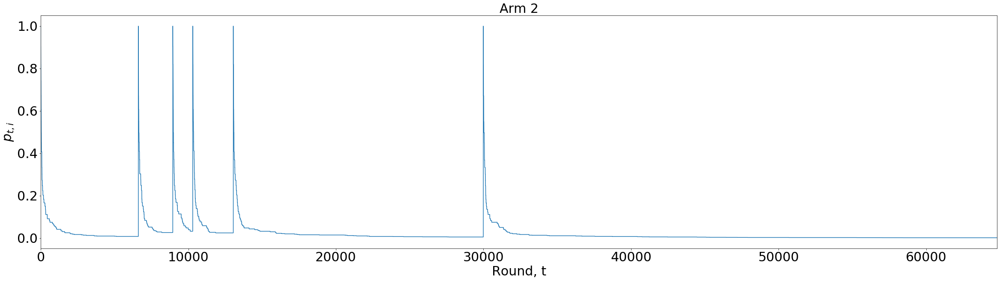

In [1100]:
arm_n = 2
plt.figure(figsize=(40,10))
plt.plot(Pulling_probs[:,arm_n])
plt.xlim([0,T])
plt.xticks(fontsize=30)
plt.xlabel('Round, t', fontsize=30)
plt.yticks(fontsize=30)
plt.ylabel(r'$p_{t,i}$', fontsize=30)
plt.title('Arm {}'.format(arm_n), fontsize=30)
plt.show()

## Frequency of arm pulls

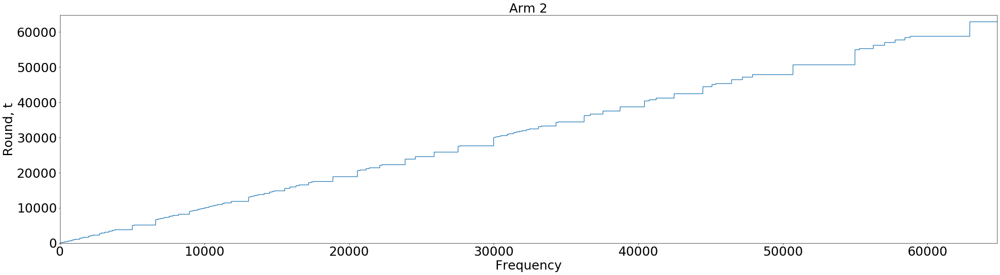

In [1102]:
plt.figure(figsize=(40,10))
plt.plot(Prev_pull[:,2].astype(int))
plt.xlim([0,T])
plt.ylim([0,T])
plt.xlabel('Frequency', fontsize=30)
plt.ylabel('Round, t', fontsize=30)
plt.title('Arm {}'.format(arm_n), fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

## AliceBandit plots for all arms

Vertical red lines correspond to AliceBandit observing arm $i$ in round $t$. The blue line corresponds to the Channel output for arm $i$.

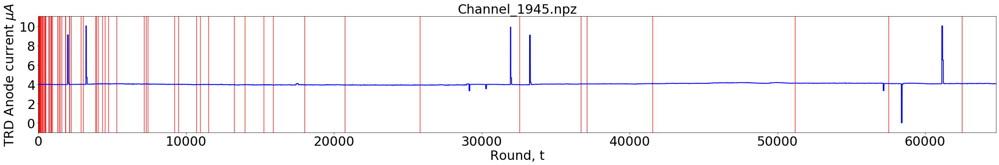

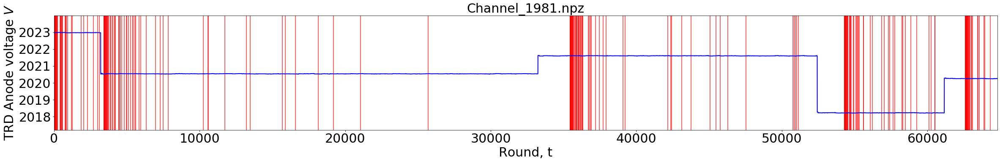

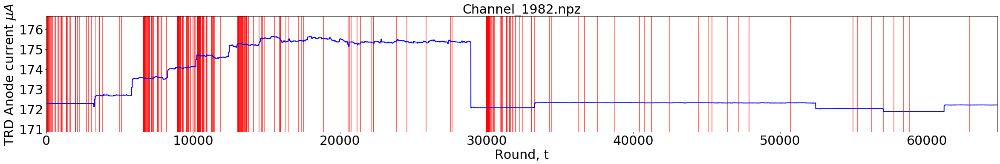

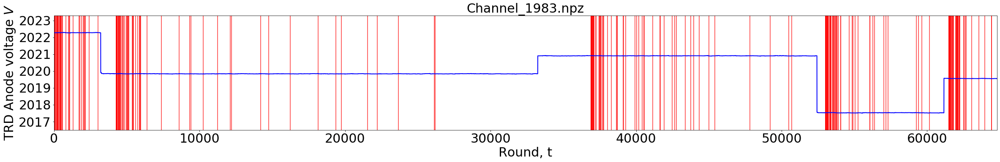

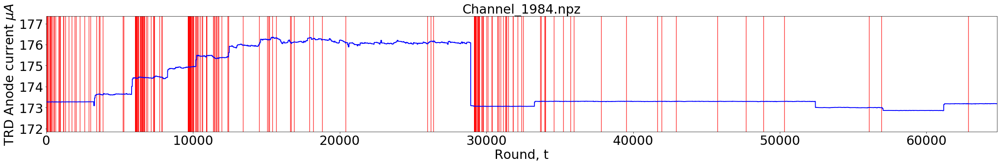

...

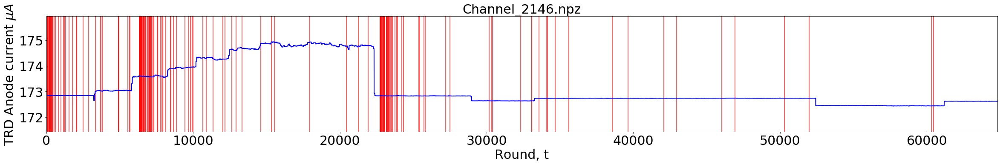

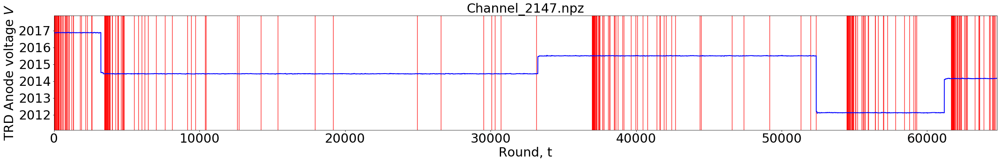

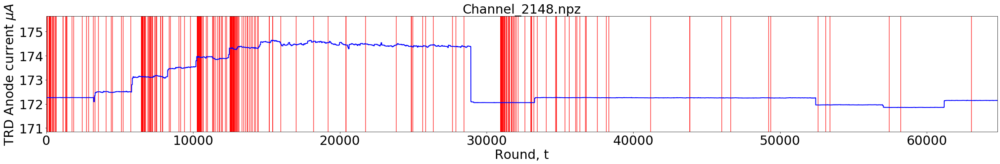

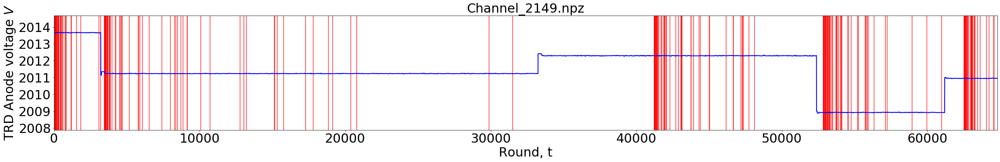

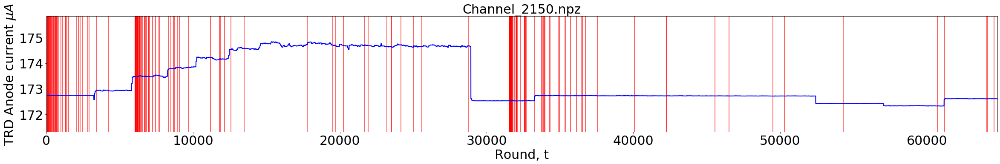

In [1096]:
for i in range(dim**2):
    range_start = 0
    range_end = T
    above = np.unique(Prev_pull[:,i]).astype(int)
    above = above[np.where((above >= range_start) & (above < range_end))]
    position = np.divmod(i,dim)

    plt.figure(figsize=(40,5))
    for j in range(len(above)):
        plt.axvline(x=above[j], color='red', alpha=0.8)
    plt.plot(np.arange(range_start,range_end),Y[:,i][range_start:range_end], color='blue', alpha=1, linewidth=2)
    plt.xlim([range_start,range_end])
    max_ = np.max(Y[:,i])
    min_ = np.min(Y[:,i])
    plt.ylim([min_-1,max_+1])
    plt.title('{}'.format(TRD_files[i]), fontsize=30)
    plt.xlabel('Round, t', fontsize=30)
    if max_ > 1000:
        plt.ylabel(r'TRD Anode voltage $V$', fontsize=30)
    else:
        plt.ylabel(r'TRD Anode current $\mu A$', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.show()